# IMPORT

In [1]:
import numpy as np
import pandas as pd
from scipy.stats import norm
from itertools import product
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from copy import deepcopy
import time
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import brentq
from scipy.stats import norm
from scipy import stats
from scipy.stats import ncx2

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


In [14]:
def black_scholes(S, K, T, r, sigma):
    if T <= 0:  # Avoid division by zero
        return max(0, S - K)
    d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    call_price = S * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2)
    return call_price

# GENERATING DATASET

In [ ]:
def simulate_gbm(S0, mu, sigma, days, dt=1/240):
    prices = [S0]
    for _ in range(days):
        Z = np.random.normal(mu * dt, sigma * np.sqrt(dt))
        prices.append(prices[-1] * np.exp(Z))
    return np.array(prices)
    
def generate_dataset(stock_prices, interest_rates, volatilities, strike_price_factors, maturities):
    data = []
   
    for r, sigma, SPF ,T  in product(np.random.uniform(0.01, 0.12, size = 20),  np.random.uniform(0.05, 0.5, size = 20), np.random.uniform(0.5, 2, size = 20), maturities):
        j = 480         
        for S0 in stock_prices:
                K = SPF * S0       # Strike price based on factor
                T_years = T / 240  # Convert days to years
                option_price = black_scholes(S0, K, T_years, r, sigma)
                if j-T >= 0:
                    j = j-1
                    data.append({
                        'interest_rate': r,
                        'volatility': sigma,
                        'strike_price': K,
                        'time_to_maturity': T,
                        'initial_stock_price': S0,
                        'option_price': option_price
                    })
    return pd.DataFrame(data)

# GBM Parameters
S0 = 100     # Initial Stock price
mu = 0.05    # Annual drift
sigma = 0.2  # Annual volatility
days = 480   # Day to generate
dt = 1/240   # Time interval (1 day)

stock_prices =  simulate_gbm(S0, mu, sigma, days, dt)        # Normal distribution for stock prices
interest_rates = np.random.uniform(0.01, 0.12, size = 20)    # Range of interest rates
volatilities = np.random.uniform(0.05, 0.5, size = 20)       # Range of volatilities
strike_price_factors = np.random.uniform(0.5, 2, size = 20)  # Range of strike price multipliers
maturities = [20, 40, 60, 80, 100, 120]                      # Number of maturity days

# Generate dataset
dataset = generate_dataset(stock_prices, interest_rates, volatilities, strike_price_factors, maturities)
dataset = dataset.sample(frac=1, random_state=73).reset_index(drop=True)

# Save dataset
dataset.to_csv('option_pricing_full_dataset.csv', index=False)
print(f"Dataset generated with {len(dataset)} rows.")
print(dataset.head())

# SIMULATION GMB

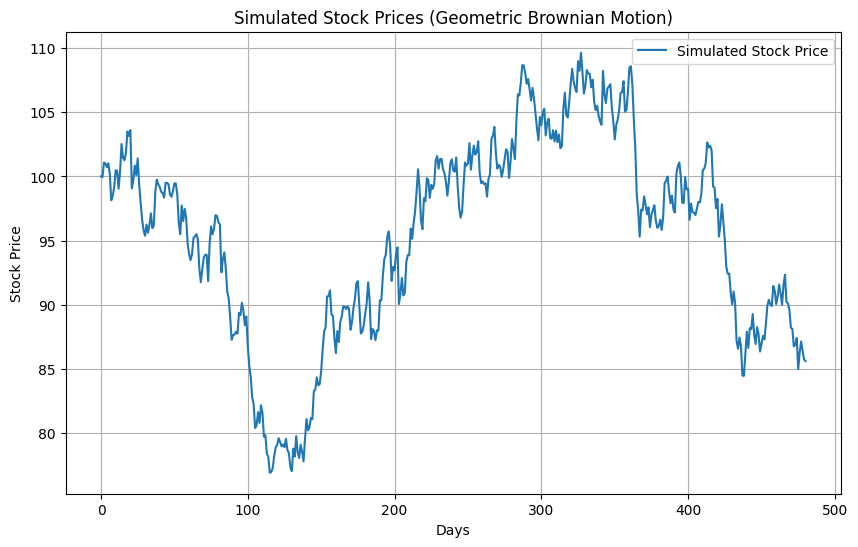

In [4]:
def simulate_gbm(S0, mu, sigma, days, dt=1/240):
    prices = [S0]
    for _ in range(days):
        Z = np.random.normal(mu * dt, sigma * np.sqrt(dt))
        prices.append(prices[-1] * np.exp(Z))
    return np.array(prices)

S0 = 100     # Initial Stock price
mu = 0.05    # Annual drift
sigma = 0.2  # Annual volatility
days = 480   # Day to generate
dt = 1/240   # Time interval (1 day)
   
stock_prices =  simulate_gbm(S0, mu, sigma, days, dt)        # Normal distribution for stock prices

plt.figure(figsize=(10, 6))
plt.plot(stock_prices, label="Simulated Stock Price")
plt.title("Simulated Stock Prices (Geometric Brownian Motion)")
plt.xlabel("Days")
plt.ylabel("Stock Price")
plt.legend()
plt.grid(True)
plt.show()

In [2]:
option_price = pd.read_csv('/kaggle/input/option-price/option_pricing_full_dataset.csv')
option_price.head()

,interest_rate,volatility,strike_price,time_to_maturity,initial_stock_price,option_price
0,0.119992,0.051932,69.176385,100,97.649231,31.846385
1,0.111122,0.203750,130.252706,120,88.638321,0.057312
2,0.051942,0.178084,64.248298,120,90.692754,28.095972
3,0.086775,0.203750,83.096711,80,83.509741,5.401134
4,0.119992,0.476347,133.372214,80,93.167033,1.821044


In [2]:
option_price = pd.read_csv('/kaggle/input/option-price/option_pricing_full_dataset.csv')
print(option_price)

          interest_rate  volatility  strike_price  time_to_maturity  \
0              0.119992    0.051932     69.176385               100   
1              0.111122    0.203750    130.252706               120   
2              0.051942    0.178084     64.248298               120   
3              0.086775    0.203750     83.096711                80   
4              0.119992    0.476347    133.372214                80   
...                 ...         ...           ...               ...   
19727995       0.088769    0.110072     46.780318                80   
19727996       0.012097    0.361550    184.629042                40   
19727997       0.086585    0.312606     54.074021                80   
19727998       0.080791    0.166589    129.712326                80   
19727999       0.111122    0.219157     50.247097                60   

          initial_stock_price  option_price  
0                   97.649231     31.846385  
1                   88.638321      0.057312  
2        

# MODEL

In [3]:
class OptionPricingDataset(torch.utils.data.Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X.values, dtype=torch.float32).to(device)
        self.y = torch.tensor(y.values, dtype=torch.float32).to(device)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [4]:
X = option_price.drop('option_price', axis=1)  # Features
y = option_price['option_price']               # Target

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)         # Train/Test+Val
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)  # Val/Test


scaler = MinMaxScaler()
X_train_normalized = scaler.fit_transform(X_train)  # Fit on training data and transform
X_val_normalized = scaler.transform(X_val)         # Transform validation data
X_test_normalized = scaler.transform(X_test)       # Transform test data

# Convert normalized data back into DataFrames for DataLoader compatibility
X_train_normalized = pd.DataFrame(X_train_normalized, columns=X.columns)
X_val_normalized = pd.DataFrame(X_val_normalized, columns=X.columns)
X_test_normalized = pd.DataFrame(X_test_normalized, columns=X.columns)

# Create PyTorch datasets
train_dataset = OptionPricingDataset(X_train_normalized, y_train)
val_dataset = OptionPricingDataset(X_val_normalized, y_val)
test_dataset = OptionPricingDataset(X_test_normalized, y_test)

# Create DataLoaders
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=256, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=256, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=256, shuffle=False)

In [13]:
class MLP(nn.Module):
    def __init__(self, input_dim):
        super(MLP, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 200),  # Input layer
            nn.ReLU(),
            nn.Linear(200, 200),        # Hidden layer
            nn.ReLU(),
            nn.Linear(200, 200),         # Hidden layer
            nn.ReLU(),
            nn.Linear(200, 50),          # Hidden layer
            nn.ReLU(),
            nn.Linear(50, 50),          # Hidden layer (Matches checkpoint)
            nn.ReLU(),
            nn.Linear(50, 1)  
        )
    def forward(self, x):
        return self.model(x)

In [12]:
def train_model(model, train_loader, val_loader, mse_criterion, optimizer, device, num_epochs=50, patience=5):
    best_loss = float('inf')
    counter = 0
    best_model = deepcopy(model.state_dict())
    all_predictions = []
    all_targets = []
    for epoch in range(num_epochs):
        model.train()
        running_loss_mse = 0.0

        for inputs, targets in tqdm(train_loader, desc="Training Epoch", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            optimizer.zero_grad()
            outputs = model(inputs)
            targets = targets.unsqueeze(1)

            # Compute MSE loss for monitoring
            loss_mse = mse_criterion(outputs, targets)

            # Backward pass and optimization
            loss_mse.backward()
            optimizer.step()

            running_loss_mse += loss_mse.item()
            
        avg_train_loss_mse = running_loss_mse / len(train_loader)
        print(f"Epoch {epoch + 1}/{num_epochs} - "
              f"Train MSE: {avg_train_loss_mse:.10f}")

        #print(f"Epoch {epoch + 1}/{num_epochs},  Train MSE Loss: {avg_train_loss_mse:.10f}")

        # Validation after each epoch
        avg_val_loss_mse = validation_model(model, val_loader, mse_criterion, device)


        # Early stopping based on custom loss
        if avg_val_loss_mse < best_loss:
            best_loss = avg_val_loss_mse
            counter = 0
            best_model = deepcopy(model.state_dict())  # Save the best model state
        else:
            counter += 1

        if counter >= patience:
            print(f"Early stopping triggered at epoch {epoch + 1}")
            break

    model.load_state_dict(best_model)  # Restore the best model
    return model, avg_train_loss_mse, avg_val_loss_mse, best_loss

# Validation function
def validation_model(model, val_loader,  mse_criterion, device):
    model.eval()
    val_loss_mse = 0.0
    all_predictions = []
    all_targets = []
    with torch.no_grad():
        for inputs, targets in tqdm(val_loader, desc="Validation", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)
            targets = targets.unsqueeze(1)

            loss_mse = mse_criterion(outputs, targets)        # MSE loss

            val_loss_mse += loss_mse.item()
            
            # Collect predictions and true values for MAE & R² computation
            all_predictions.extend(outputs.cpu().detach().numpy().flatten())
            all_targets.extend(targets.cpu().detach().numpy().flatten())
            
        avg_val_loss_mse= mean_squared_error(all_targets,all_predictions)
        avg_val_loss_mae = mean_absolute_error(all_targets, all_predictions)
        val_r2_score = r2_score(all_targets, all_predictions)

        print(f"Val MSE: {avg_val_loss_mse:.10f}, "
              f"Val  MAE: {avg_val_loss_mae:.10f}, "
              f"Val  R²: {val_r2_score:.10f}")
    #print(f" Validation MSE Loss: {avg_val_loss_mse:.10f}")
    return  avg_val_loss_mse

# Testing function
def test_model(model, test_loader, mse_criterion, device):
    model.eval()
    
    test_loss_mse = 0.0
    all_predictions = []
    all_targets = []

    with torch.no_grad():
        for inputs, targets in tqdm(test_loader, desc="Testing", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)
            targets = targets.unsqueeze(1)
            
            loss_mse = mse_criterion(outputs, targets)        # MSE loss

            test_loss_mse += loss_mse.item()

            all_predictions.extend(outputs.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())

    avg_test_loss_mse= mean_squared_error(all_targets,all_predictions)
    avg_test_loss_mae = mean_absolute_error(all_targets, all_predictions)
    test_r2_score = r2_score(all_targets, all_predictions)

    print(f"Test MSE: {avg_test_loss_mse:.10f}, "
          f"Test MAE: {avg_test_loss_mae:.10f}, "
          f"Test R²: {test_r2_score:.10f}")

    return  avg_test_loss_mse, all_predictions, all_targets

In [15]:
input_dim = X_train.shape[1]  # Number of features
model = MLP(input_dim).to(device)
mse_criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
# Training phase
trained_model, train_losses, val_loss, best_loss= train_model(
    model, train_loader, val_loader,  mse_criterion, optimizer, device, num_epochs=50, patience=5
)

# Test phase
test_loss, predictions, true_values = test_model(trained_model, test_loader, mse_criterion, device)

# Save model
torch.save(trained_model.state_dict(), "mlp_BS.pth")
print("Model saved!")

Training Epoch: 100%|██████████| 61650/61650 [10:05<00:00, 101.76batch/s]


Epoch 1/50 - Train MSE: 0.0012106057, Train MAE: 0.0700208768, Train R²: 0.9987328060


Validation: 100%|██████████| 7707/7707 [00:31<00:00, 247.98batch/s]


Val MSE: 0.0000032933, Val  MAE: 0.0186578371, Val  R²: 0.9999965602


Training Epoch: 100%|██████████| 61650/61650 [11:13<00:00, 91.49batch/s] 


Epoch 2/50 - Train MSE: 0.0000189574, Train MAE: 0.0503187254, Train R²: 0.9993564812


Validation: 100%|██████████| 7707/7707 [00:34<00:00, 221.37batch/s]


Val MSE: 0.0000011306, Val  MAE: 0.0105527248, Val  R²: 0.9999988191


Training Epoch: 100%|██████████| 61650/61650 [11:38<00:00, 88.32batch/s] 


Epoch 3/50 - Train MSE: 0.0000125096, Train MAE: 0.0416721255, Train R²: 0.9995666227


Validation: 100%|██████████| 7707/7707 [00:36<00:00, 210.95batch/s]


Val MSE: 0.0000007877, Val  MAE: 0.0092592696, Val  R²: 0.9999991772


Training Epoch: 100%|██████████| 61650/61650 [12:00<00:00, 85.51batch/s] 


Epoch 4/50 - Train MSE: 0.0000090693, Train MAE: 0.0364050530, Train R²: 0.9996725937


Validation: 100%|██████████| 7707/7707 [00:37<00:00, 205.12batch/s]


Val MSE: 0.0000027611, Val  MAE: 0.0169755835, Val  R²: 0.9999971160


Training Epoch: 100%|██████████| 61650/61650 [12:05<00:00, 84.93batch/s] 


Epoch 5/50 - Train MSE: 0.0000079719, Train MAE: 0.0326941796, Train R²: 0.9997364061


Validation: 100%|██████████| 7707/7707 [00:38<00:00, 200.88batch/s]


Val MSE: 0.0000005164, Val  MAE: 0.0076028514, Val  R²: 0.9999994606


Training Epoch: 100%|██████████| 61650/61650 [12:30<00:00, 82.10batch/s]  


Epoch 6/50 - Train MSE: 0.0000066182, Train MAE: 0.0300427582, Train R²: 0.9997791838


Validation: 100%|██████████| 7707/7707 [00:41<00:00, 186.00batch/s]


Val MSE: 0.0000008444, Val  MAE: 0.0098776501, Val  R²: 0.9999991180


Training Epoch: 100%|██████████| 61650/61650 [12:55<00:00, 79.47batch/s]  


Epoch 7/50 - Train MSE: 0.0000056668, Train MAE: 0.0280476734, Train R²: 0.9998098816


Validation: 100%|██████████| 7707/7707 [00:43<00:00, 175.51batch/s]


Val MSE: 0.0000003391, Val  MAE: 0.0061653075, Val  R²: 0.9999996458


Training Epoch: 100%|██████████| 61650/61650 [13:32<00:00, 75.90batch/s]  


Epoch 8/50 - Train MSE: 0.0000051559, Train MAE: 0.0264325961, Train R²: 0.9998329718


Validation: 100%|██████████| 7707/7707 [00:46<00:00, 164.97batch/s]


Val MSE: 0.0000001954, Val  MAE: 0.0046754773, Val  R²: 0.9999997959


Training Epoch: 100%|██████████| 61650/61650 [13:41<00:00, 75.08batch/s]  


Epoch 9/50 - Train MSE: 0.0000047870, Train MAE: 0.0250665545, Train R²: 0.9998509737


Validation: 100%|██████████| 7707/7707 [00:49<00:00, 155.23batch/s]


Val MSE: 0.0000009276, Val  MAE: 0.0101956949, Val  R²: 0.9999990311


Training Epoch:  65%|██████▍   | 39892/61650 [08:56<03:37, 100.01batch/s] 

In [16]:
model.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_BS.pth', weights_only=True))
test_loss, predictions, true_values = test_model(model, test_loader, mse_criterion, device)

Testing: 100%|██████████| 7707/7707 [00:26<00:00, 293.34batch/s]


Test MSE: 0.0000499258, Test MAE: 0.0046721026, Test R²: 0.9999997960


# AUTOENCODER

In [7]:
X = option_price.drop('option_price', axis=1)  # Features
y = option_price['option_price']               # Target

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42)         # Train/Test+Val
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)  # Val/Test


scaler = MinMaxScaler()
X_train_normalized = scaler.fit_transform(X_train)  # Fit on training data and transform
X_val_normalized = scaler.transform(X_val)         # Transform validation data
X_test_normalized = scaler.transform(X_test)       # Transform test data

# Convert normalized data back into DataFrames for DataLoader compatibility
X_train_normalized = pd.DataFrame(X_train_normalized, columns=X.columns)
X_val_normalized = pd.DataFrame(X_val_normalized, columns=X.columns)
X_test_normalized = pd.DataFrame(X_test_normalized, columns=X.columns)

# Create PyTorch datasets
train_dataset = OptionPricingDataset(X_train_normalized, y_train)
val_dataset = OptionPricingDataset(X_val_normalized, y_val)
test_dataset = OptionPricingDataset(X_test_normalized, y_test)

# Create DataLoaders
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=64, shuffle=False)

In [13]:
class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 256),
            nn.GELU(),
            nn.Linear(256, latent_dim),
            nn.GELU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.GELU(),
            nn.Linear(256, 1),  # Output a single value for the option price
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded



# Training Configuration
input_dim = X_train.shape[1]  # Number of features in the dataset
latent_dim = 3  # Dimensionality of the latent space (can tune this)

model_auto = Autoencoder(input_dim=input_dim, latent_dim=latent_dim).to(device)
criterion = nn.MSELoss()  # Mean squared error for reconstruction
optimizer = optim.Adam(model_auto.parameters(), lr=1e-3)

In [14]:
# Training Phase
trained_model, train_losses, val_losses, best_loss = train_model(
    model=model_auto,
    train_loader=train_loader,
    val_loader=val_loader,
    mse_criterion=criterion,
    optimizer=optimizer,
    device=device,
    num_epochs=50,
    patience=5
)

# Test Phase
test_loss, predictions, true_values = test_model(
    model=trained_model,
    test_loader=test_loader,
    mse_criterion=criterion,
    device=device
)


# Save the trained model
torch.save(trained_model.state_dict(), "autoencoder_OP.pth")
print("Model saved!")

Training Epoch: 100%|██████████| 246600/246600 [17:24<00:00, 236.01batch/s]


Epoch 1/50 - Train MSE: 0.0781653634


Validation: 100%|██████████| 30825/30825 [00:41<00:00, 741.94batch/s]


Val MSE: 0.0001567932, Val  MAE: 0.0087931128, Val  R²: 0.9999993602


Training Epoch: 100%|██████████| 246600/246600 [17:57<00:00, 228.88batch/s]


Epoch 2/50 - Train MSE: 0.0019484379


Validation: 100%|██████████| 30825/30825 [00:41<00:00, 749.89batch/s]


Val MSE: 0.0003766993, Val  MAE: 0.0146190133, Val  R²: 0.9999984629


Training Epoch: 100%|██████████| 246600/246600 [17:34<00:00, 233.78batch/s]


Epoch 3/50 - Train MSE: 0.0012503245


Validation: 100%|██████████| 30825/30825 [00:41<00:00, 743.90batch/s]


Val MSE: 0.0004922293, Val  MAE: 0.0163407959, Val  R²: 0.9999979915


Training Epoch: 100%|██████████| 246600/246600 [17:30<00:00, 234.83batch/s]


Epoch 4/50 - Train MSE: 0.0009842760


Validation: 100%|██████████| 30825/30825 [00:41<00:00, 741.65batch/s]


Val MSE: 0.0000933873, Val  MAE: 0.0064855805, Val  R²: 0.9999996189


Training Epoch: 100%|██████████| 246600/246600 [18:06<00:00, 226.94batch/s]


Epoch 5/50 - Train MSE: 0.0008161051


Validation: 100%|██████████| 30825/30825 [00:43<00:00, 713.56batch/s]


Val MSE: 0.0000347379, Val  MAE: 0.0040542739, Val  R²: 0.9999998583


Training Epoch: 100%|██████████| 246600/246600 [17:46<00:00, 231.33batch/s]


Epoch 6/50 - Train MSE: 0.0006885604


Validation: 100%|██████████| 30825/30825 [00:40<00:00, 752.04batch/s]


Val MSE: 0.0001422733, Val  MAE: 0.0083263163, Val  R²: 0.9999994195


Training Epoch: 100%|██████████| 246600/246600 [17:34<00:00, 233.96batch/s]


Epoch 7/50 - Train MSE: 0.0006091986


Validation: 100%|██████████| 30825/30825 [00:42<00:00, 732.10batch/s]


Val MSE: 0.0001412327, Val  MAE: 0.0073998249, Val  R²: 0.9999994237


Training Epoch: 100%|██████████| 246600/246600 [17:17<00:00, 237.63batch/s]


Epoch 8/50 - Train MSE: 0.0005236425


Validation: 100%|██████████| 30825/30825 [00:41<00:00, 747.16batch/s]


Val MSE: 0.0000391202, Val  MAE: 0.0044837850, Val  R²: 0.9999998404


Training Epoch: 100%|██████████| 246600/246600 [17:42<00:00, 232.19batch/s]


Epoch 9/50 - Train MSE: 0.0005019883


Validation: 100%|██████████| 30825/30825 [00:40<00:00, 765.04batch/s]


Val MSE: 0.0000601557, Val  MAE: 0.0049534505, Val  R²: 0.9999997545


Training Epoch: 100%|██████████| 246600/246600 [17:05<00:00, 240.55batch/s]


Epoch 10/50 - Train MSE: 0.0004453734


Validation: 100%|██████████| 30825/30825 [00:40<00:00, 759.35batch/s]


Val MSE: 0.0004810831, Val  MAE: 0.0144246025, Val  R²: 0.9999980370
Early stopping triggered at epoch 10


Testing: 100%|██████████| 30825/30825 [00:41<00:00, 741.00batch/s]


Test MSE: 0.0000347145, Test MAE: 0.0040513943, Test R²: 0.9999998582
Model saved!


In [19]:
model_auto.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/autoencoder_OP.pth', weights_only=True))
# Test Phase
test_loss, predictions, true_values = test_model(
    model=model_auto,
    test_loader=test_loader,
    mse_criterion=criterion,
    device=device
)

Testing: 100%|██████████| 30825/30825 [00:36<00:00, 852.34batch/s]


Test MSE: 0.0000097970, Test MAE: 0.0021994566, Test R²: 0.9999999600


# SABR PRICE PREDICTION

In [ ]:
Best Model : {'num_layers': 4, 'hidden_size': 220, 'dropout_rate': 2.878993948405602e-05, 
'learning_rate': 0.00019174647361188418, 'batch_size': 128}


In [2]:
SABR_price = pd.read_csv('/kaggle/input/sabr-def-p1/SABR_model_DEF_PARTE01.csv')
SABR_price["S0"] = SABR_price["S0"] * np.exp(SABR_price["r"] * SABR_price["T"])
SABR_price.head()

,S0,alpha,beta,rho,nu,r,T,K,IV,IV_Approx,BS Price,SABR Price,BS Price IV
0,85.920476,0.067447,1.0,0.520296,0.124547,0.024805,0.2,50,0.386060,0.060740,35.742719,35.745352,35.745352
1,85.920476,0.067447,1.0,0.520296,0.124547,0.024805,0.2,55,0.321857,0.060176,30.767462,30.770095,30.770095
2,85.920476,0.067447,1.0,0.520296,0.124547,0.024805,0.2,60,0.262809,0.060290,25.792205,25.794838,25.794838
3,85.920476,0.067447,1.0,0.520296,0.124547,0.024805,0.2,65,0.207931,0.060993,20.816948,20.819582,20.819582
4,85.920476,0.067447,1.0,0.520296,0.124547,0.024805,0.2,70,0.156389,0.062161,15.841691,15.844325,15.844325


In [3]:
class OptionPricingDatasetSABR(torch.utils.data.Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X.values, dtype=torch.float32).to(device)
        self.y = torch.tensor(y.values, dtype=torch.float32).to(device)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [4]:
X_sabr = SABR_price.drop(['BS Price', 'BS Price IV','IV','SABR Price','beta','IV_Approx'], axis=1)  # Features
y_sabr = SABR_price['SABR Price']  # Target

X_train_sabr , X_temp_sabr , y_train_sabr , y_temp_sabr  = train_test_split(X_sabr , y_sabr , test_size=0.2, random_state=42)         # Train/Test+Val
X_val_sabr , X_test_sabr , y_val_sabr , y_test_sabr  = train_test_split(X_temp_sabr, y_temp_sabr, test_size=0.5, random_state=42)  # Val/Test

scaler_sabr = MinMaxScaler()
X_train_normalized_sabr  = scaler_sabr.fit_transform(X_train_sabr)  # Fit on training data and transform
X_val_normalized_sabr  = scaler_sabr.transform(X_val_sabr)         # Transform validation data
X_test_normalized_sabr  = scaler_sabr.transform(X_test_sabr)       # Transform test data

# Convert normalized data back into DataFrames for DataLoader compatibility
X_train_normalized_sabr  = pd.DataFrame(X_train_normalized_sabr , columns=X_sabr.columns)
X_val_normalized_sabr  = pd.DataFrame(X_val_normalized_sabr , columns=X_sabr.columns)
X_test_normalized_sabr  = pd.DataFrame(X_test_normalized_sabr , columns=X_sabr.columns)

# Create PyTorch datasets
train_dataset_sabr  = OptionPricingDatasetSABR(X_train_normalized_sabr , y_train_sabr)
val_dataset_sabr  = OptionPricingDatasetSABR(X_val_normalized_sabr , y_val_sabr)
test_dataset_sabr  = OptionPricingDatasetSABR(X_test_normalized_sabr , y_test_sabr)

# Create DataLoaders
train_loader_sabr  = torch.utils.data.DataLoader(train_dataset_sabr , batch_size=256, shuffle=True)
val_loader_sabr  = torch.utils.data.DataLoader(val_dataset_sabr , batch_size=256, shuffle=False)
test_loader_sabr  = torch.utils.data.DataLoader(test_dataset_sabr , batch_size=256, shuffle=False)

In [5]:
class MLP_Sabr(nn.Module):
    def __init__(self, input_dim):
        super(MLP_Sabr, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 220),  # Input layer
            nn.ReLU(),
            nn.Linear(220, 220),        # Hidden layer
            nn.ReLU(),
            nn.Linear(220, 220),         # Hidden layer
            nn.ReLU(),
            nn.Linear(220, 55),          # Hidden layer
            nn.ReLU(),
            nn.Linear(55, 55),          # Hidden layer
            nn.ReLU(),
            nn.Linear(55, 1),          # Hidden layer (Matches checkpoint)
        )
    def forward(self, x):
        return self.model(x)

In [7]:
def train_model_sabr(model, train_loader, val_loader, mse_criterion, optimizer, device, num_epochs, patience=5):
    best_loss = float('inf')
    counter = 0
    best_model = deepcopy(model.state_dict())
    all_predictions = []
    all_targets = []
    for epoch in range(num_epochs):
        model.train()
        running_loss_mse = 0.0

        for inputs, targets in tqdm(train_loader, desc="Training Epoch", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            optimizer.zero_grad()
            outputs = model(inputs)
            targets = targets.unsqueeze(1)

            # Compute MSE loss for monitoring (not used in training)
            loss_mse = mse_criterion(outputs, targets)

            # Backward pass and optimization
            loss_mse.backward()
            optimizer.step()

            running_loss_mse += loss_mse.item()

            # Collect predictions and true values for MAE & R² computation
            all_predictions.extend(outputs.cpu().detach().numpy().flatten())
            all_targets.extend(targets.cpu().detach().numpy().flatten())
            
        avg_train_loss_mse = running_loss_mse / len(train_loader)
        avg_train_loss_mae = mean_absolute_error(all_targets, all_predictions)
        train_r2_score = r2_score(all_targets, all_predictions)

        print(f"Epoch {epoch + 1}/{num_epochs} - "
              f"Train MSE: {avg_train_loss_mse:.10f}, "
              f"Train MAE: {avg_train_loss_mae:.10f}, "
              f"Train R²: {train_r2_score:.10f}")

        #print(f"Epoch {epoch + 1}/{num_epochs},  Train MSE Loss: {avg_train_loss_mse:.10f}")

        # Validation after each epoch
        avg_val_loss_mse = validation_model_sabr(model, val_loader, mse_criterion, device)


        # Early stopping based on custom loss
        if avg_val_loss_mse < best_loss:
            best_loss = avg_val_loss_mse
            counter = 0
            best_model = deepcopy(model.state_dict())  # Save the best model state
        else:
            counter += 1

        if counter >= patience:
            print(f"Early stopping triggered at epoch {epoch + 1}")
            break

    model.load_state_dict(best_model)  # Restore the best model
    return model, avg_train_loss_mse, avg_val_loss_mse, best_loss

# Validation function
def validation_model_sabr(model, val_loader,  mse_criterion, device):
    model.eval()
    val_loss_mse = 0.0
    all_predictions = []
    all_targets = []
    with torch.no_grad():
        for inputs, targets in tqdm(val_loader, desc="Validation", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)
            targets = targets.unsqueeze(1)

            loss_mse = mse_criterion(outputs, targets)        # MSE loss

            val_loss_mse += loss_mse.item()
            
            # Collect predictions and true values for MAE & R² computation
            all_predictions.extend(outputs.cpu().detach().numpy().flatten())
            all_targets.extend(targets.cpu().detach().numpy().flatten())
            
        avg_val_loss_mse= mean_squared_error(all_targets,all_predictions)
        avg_val_loss_mae = mean_absolute_error(all_targets, all_predictions)
        val_r2_score = r2_score(all_targets, all_predictions)

        print(f"Val MSE: {avg_val_loss_mse:.10f}, "
              f"Val  MAE: {avg_val_loss_mae:.10f}, "
              f"Val  R²: {val_r2_score:.10f}")
    #print(f" Validation MSE Loss: {avg_val_loss_mse:.10f}")
    return  avg_val_loss_mse

# Testing function
def test_model_sabr(model, test_loader, mse_criterion, device):
    model.eval()
    
    test_loss_mse = 0.0
    all_predictions = []
    all_targets = []

    with torch.no_grad():
        for inputs, targets in tqdm(test_loader, desc="Testing", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)
            targets = targets.unsqueeze(1)

            loss_mse = mse_criterion(outputs, targets)        # MSE loss

            test_loss_mse += loss_mse.item()

            all_predictions.extend(outputs.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())

    avg_test_loss_mse= mean_squared_error(all_targets,all_predictions)
    avg_test_loss_mae = mean_absolute_error(all_targets, all_predictions)
    test_r2_score = r2_score(all_targets, all_predictions)

    print(f"Test MSE: {avg_test_loss_mse:.10f}, "
          f"Test MAE: {avg_test_loss_mae:.10f}, "
          f"Test R²: {test_r2_score:.10f}")

    return  avg_test_loss_mse, all_predictions, all_targets

In [6]:
input_dim = X_train_sabr.shape[1]  # Number of features
model_sabr = MLP_Sabr(input_dim).to(device)
mse_criterion = nn.MSELoss()
optimizer = optim.Adam(model_sabr.parameters(), lr=0.0002)

In [9]:
# Training phase
trained_model, train_losses, val_loss, best_loss = train_model_sabr(
    model_sabr, train_loader_sabr, val_loader_sabr, mse_criterion, optimizer, device, num_epochs=50, patience=5
)

# Test phase
test_loss, predictions, true_values = test_model_sabr(trained_model, test_loader_sabr, mse_criterion, device)

# Save model
torch.save(trained_model.state_dict(), "mlp_SABR_price.pth")
print("Model saved!")

Training Epoch: 100%|██████████| 12192/12192 [01:38<00:00, 123.59batch/s]


Epoch 1/50 - Train MSE: 6.7417844261, Train MAE: 0.4286322892, Train R²: 0.9800917438


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 315.29batch/s]


Val MSE: 0.0256734174, Val  MAE: 0.1172350198, Val  R²: 0.9999239838


Training Epoch: 100%|██████████| 12192/12192 [01:39<00:00, 122.05batch/s]


Epoch 2/50 - Train MSE: 0.0169959999, Train MAE: 0.2608425915, Train R²: 0.9900207789


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 302.72batch/s]


Val MSE: 0.0150227984, Val  MAE: 0.0878643543, Val  R²: 0.9999555191


Training Epoch: 100%|██████████| 12192/12192 [01:40<00:00, 121.06batch/s]


Epoch 3/50 - Train MSE: 0.0127945606, Train MAE: 0.2007279843, Train R²: 0.9933345928


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 274.04batch/s]


Val MSE: 0.0128905680, Val  MAE: 0.0848502293, Val  R²: 0.9999618324


Training Epoch: 100%|██████████| 12192/12192 [01:43<00:00, 118.22batch/s]


Epoch 4/50 - Train MSE: 0.0110421574, Train MAE: 0.1691440046, Train R²: 0.9949927933


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 296.80batch/s]


Val MSE: 0.0096704094, Val  MAE: 0.0694504604, Val  R²: 0.9999713670


Training Epoch: 100%|██████████| 12192/12192 [01:46<00:00, 114.91batch/s]


Epoch 5/50 - Train MSE: 0.0101403903, Train MAE: 0.1495076120, Train R²: 0.9959882464


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 285.65batch/s]


Val MSE: 0.0076156771, Val  MAE: 0.0621668771, Val  R²: 0.9999774508


Training Epoch: 100%|██████████| 12192/12192 [01:49<00:00, 111.72batch/s]


Epoch 6/50 - Train MSE: 0.0095890251, Train MAE: 0.1360485405, Train R²: 0.9966521529


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 294.60batch/s]


Val MSE: 0.0120944101, Val  MAE: 0.0810160637, Val  R²: 0.9999641897


Training Epoch: 100%|██████████| 12192/12192 [01:49<00:00, 110.85batch/s]


Epoch 7/50 - Train MSE: 0.0091216761, Train MAE: 0.1261752844, Train R²: 0.9971265690


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 288.70batch/s]


Val MSE: 0.0074764928, Val  MAE: 0.0620511770, Val  R²: 0.9999778629


Training Epoch: 100%|██████████| 12192/12192 [01:50<00:00, 109.93batch/s]


Epoch 8/50 - Train MSE: 0.0089285468, Train MAE: 0.1186626107, Train R²: 0.9974824522


Validation: 100%|██████████| 1524/1524 [00:06<00:00, 243.97batch/s]


Val MSE: 0.0084470566, Val  MAE: 0.0642372742, Val  R²: 0.9999749892


Training Epoch: 100%|██████████| 12192/12192 [01:51<00:00, 109.68batch/s]


Epoch 9/50 - Train MSE: 0.0086049019, Train MAE: 0.1126717776, Train R²: 0.9977593566


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 283.62batch/s]


Val MSE: 0.0063109268, Val  MAE: 0.0547013283, Val  R²: 0.9999813140


Training Epoch: 100%|██████████| 12192/12192 [01:51<00:00, 109.82batch/s]


Epoch 10/50 - Train MSE: 0.0083823808, Train MAE: 0.1077848896, Train R²: 0.9979809457


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 274.38batch/s]


Val MSE: 0.0071298084, Val  MAE: 0.0582123548, Val  R²: 0.9999788894


Training Epoch: 100%|██████████| 12192/12192 [01:52<00:00, 108.68batch/s]


Epoch 11/50 - Train MSE: 0.0083171873, Train MAE: 0.1037554145, Train R²: 0.9981622635


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 267.05batch/s]


Val MSE: 0.0095284833, Val  MAE: 0.0686610267, Val  R²: 0.9999717872


Training Epoch: 100%|██████████| 12192/12192 [01:51<00:00, 109.06batch/s]


Epoch 12/50 - Train MSE: 0.0081331814, Train MAE: 0.1003336459, Train R²: 0.9983134069


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 262.58batch/s]


Val MSE: 0.0059570279, Val  MAE: 0.0525660664, Val  R²: 0.9999823619


Training Epoch: 100%|██████████| 12192/12192 [01:52<00:00, 108.12batch/s]


Epoch 13/50 - Train MSE: 0.0079723811, Train MAE: 0.0973794088, Train R²: 0.9984413340


Validation: 100%|██████████| 1524/1524 [00:06<00:00, 220.05batch/s]


Val MSE: 0.0073538236, Val  MAE: 0.0588271283, Val  R²: 0.9999782261


Training Epoch: 100%|██████████| 12192/12192 [01:53<00:00, 107.27batch/s]


Epoch 14/50 - Train MSE: 0.0078832740, Train MAE: 0.0948201939, Train R²: 0.9985510045


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 266.28batch/s]


Val MSE: 0.0062662819, Val  MAE: 0.0542564318, Val  R²: 0.9999814462


Training Epoch: 100%|██████████| 12192/12192 [01:52<00:00, 108.24batch/s]


Epoch 15/50 - Train MSE: 0.0077714137, Train MAE: 0.0925635248, Train R²: 0.9986460744


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 262.77batch/s]


Val MSE: 0.0097881658, Val  MAE: 0.0709424019, Val  R²: 0.9999710183


Training Epoch: 100%|██████████| 12192/12192 [01:54<00:00, 106.52batch/s]


Epoch 16/50 - Train MSE: 0.0076908729, Train MAE: 0.0905632898, Train R²: 0.9987292755


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 261.75batch/s]


Val MSE: 0.0064981328, Val  MAE: 0.0571278259, Val  R²: 0.9999807597


Training Epoch: 100%|██████████| 12192/12192 [01:56<00:00, 104.95batch/s]


Epoch 17/50 - Train MSE: 0.0075815545, Train MAE: 0.0887700096, Train R²: 0.9988027071


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 264.39batch/s]


Val MSE: 0.0065474808, Val  MAE: 0.0554455034, Val  R²: 0.9999806136
Early stopping triggered at epoch 17


Testing: 100%|██████████| 1524/1524 [00:04<00:00, 314.58batch/s]


Test MSE: 0.0059739798, Test MAE: 0.0526821017, Test R²: 0.9999823631
Model saved!


In [9]:
model_sabr.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_SABR_price.pth', map_location=torch.device('cpu'),weights_only=True))
test_loss, predictions, true_values = test_model_sabr(model_sabr, test_loader_sabr, mse_criterion, device)

Testing: 100%|██████████| 1524/1524 [00:06<00:00, 248.17batch/s]


Test MSE: 0.0056192046, Test MAE: 0.0507353209, Test R²: 0.9999834105


In [27]:
print(test_loss)
for i in range(len(predictions)):
    if i==10:
        break
    print(f"Prediction: {predictions[i]}, True Value: {true_values[i]}")

0.0056192046
Prediction: [19.450693], True Value: [19.462418]
Prediction: [23.91295], True Value: [24.074795]
Prediction: [34.12557], True Value: [34.288372]
Prediction: [13.796], True Value: [13.657797]
Prediction: [9.387616], True Value: [9.409995]
Prediction: [56.69818], True Value: [56.844975]
Prediction: [39.82829], True Value: [40.085766]
Prediction: [2.2759578], True Value: [2.2387388]
Prediction: [0.01361801], True Value: [0.01294033]
Prediction: [3.3452823], True Value: [3.28004]


# PARAMETER CALIBRATION

In [ ]:
Best model : {'num_layers': 2, 'hidden_size': 356, 'dropout_rate': 0.032710679313095625,
             'learning_rate': 0.0001169305846711405, 'batch_size': 256}

In [14]:
SABR_cal = pd.read_csv('/kaggle/input/sabr-cal-30/SABR_model_results_30.csv')
SABR_cal.head()

,S_1,S_2,S_3,S_4,S_5,S_6,S_7,S_8,S_9,S_10,...,sigma_351,sigma_352,sigma_353,S0,alpha,beta,rho,nu,r,T
0,112.757185,112.968535,113.140621,113.604723,116.379879,115.100609,115.366886,114.683650,116.548794,115.079784,...,0.225872,0.227180,0.223838,111.102159,0.214986,1.0,-0.045434,0.25991,0.010562,1.4
1,112.757185,115.008508,117.169732,120.443655,120.108311,122.235044,125.135756,125.877967,129.185170,131.426041,...,0.135571,0.134683,0.134826,111.102159,0.214986,1.0,-0.045434,0.25991,0.010562,1.4
2,112.757185,111.467004,110.495182,112.484589,110.966088,112.471689,114.593700,114.741884,109.615905,111.590225,...,0.187336,0.187922,0.187963,111.102159,0.214986,1.0,-0.045434,0.25991,0.010562,1.4
3,112.757185,111.707331,112.027307,109.629929,108.350707,109.100995,107.266208,106.266171,104.958246,103.006856,...,0.170866,0.168656,0.170890,111.102159,0.214986,1.0,-0.045434,0.25991,0.010562,1.4
4,112.757185,118.234710,119.109556,120.731603,118.043558,117.050695,117.671287,121.300344,119.666468,119.696381,...,0.205074,0.201947,0.200429,111.102159,0.214986,1.0,-0.045434,0.25991,0.010562,1.4


In [3]:
class OptionPricingDatasetSABR(torch.utils.data.Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X.values, dtype=torch.float32).to(device)
        self.y = torch.tensor(y.values, dtype=torch.float32).to(device)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [4]:
X_sabr_cal = SABR_cal.drop(['alpha','beta','rho','nu'], axis=1)  # Features
y_sabr_cal = SABR_cal[['alpha','rho','nu']]          # Target

X_train_sabr_cal , X_temp_sabr_cal , y_train_sabr_cal , y_temp_sabr_cal  = train_test_split(X_sabr_cal , y_sabr_cal , test_size=0.2, random_state=42)         # Train/Test+Val
X_val_sabr_cal , X_test_sabr_cal , y_val_sabr_cal , y_test_sabr_cal  = train_test_split(X_temp_sabr_cal, y_temp_sabr_cal, test_size=0.5, random_state=42)  # Val/Test


scaler = MinMaxScaler()
X_train_normalized_sabr_cal  = scaler.fit_transform(X_train_sabr_cal)  # Fit on training data and transform
X_val_normalized_sabr_cal  = scaler.transform(X_val_sabr_cal)         # Transform validation data
X_test_normalized_sabr_cal  = scaler.transform(X_test_sabr_cal)       # Transform test data

# Convert normalized data back into DataFrames for DataLoader compatibility
X_train_normalized_sabr_cal  = pd.DataFrame(X_train_normalized_sabr_cal , columns=X_sabr_cal.columns)
X_val_normalized_sabr_cal  = pd.DataFrame(X_val_normalized_sabr_cal , columns=X_sabr_cal.columns)
X_test_normalized_sabr_cal  = pd.DataFrame(X_test_normalized_sabr_cal , columns=X_sabr_cal.columns)

# Create PyTorch datasets
train_dataset_sabr_cal  = OptionPricingDatasetSABR(X_train_normalized_sabr_cal , y_train_sabr_cal)
val_dataset_sabr_cal  = OptionPricingDatasetSABR(X_val_normalized_sabr_cal , y_val_sabr_cal)
test_dataset_sabr_cal  = OptionPricingDatasetSABR(X_test_normalized_sabr_cal , y_test_sabr_cal)

# Create DataLoaders
train_loader_sabr_cal  = torch.utils.data.DataLoader(train_dataset_sabr_cal , batch_size=1024, shuffle=True)
val_loader_sabr_cal  = torch.utils.data.DataLoader(val_dataset_sabr_cal , batch_size=1024, shuffle=False)
test_loader_sabr_cal  = torch.utils.data.DataLoader(test_dataset_sabr_cal , batch_size=1024, shuffle=False)

In [5]:
class MLP_sabr_cal(nn.Module):
    def __init__(self, input_dim):
        super(MLP_sabr_cal, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 800),  # Input layer
            nn.ReLU(),
            nn.Linear(800, 800),          # Hidden layer
            nn.ReLU(),
            nn.Linear(800, 400),          # Hidden layer
            nn.ReLU(),
            nn.Linear(400, 200),          # Hidden layer
            nn.ReLU(),
            nn.Linear(200, 100),          # Hidden layer
            nn.ReLU(),
            nn.Linear(100, 50),          # Hidden layer (Matches checkpoint)
            nn.ReLU(),
            nn.Linear(50, 3)  
        )
    def forward(self, x):
        return self.model(x)

In [6]:
def train_model_sabr_cal(model, train_loader, val_loader, mse_criterion, optimizer, device, num_epochs=50, patience=5):
    best_loss = float('inf')
    counter = 0
    best_model = deepcopy(model.state_dict())
    for epoch in range(num_epochs):
        all_predictions = []
        all_targets = []
        model.train()
        running_loss_mse = 0.0
        for inputs, targets in tqdm(train_loader, desc="Training Epoch", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            optimizer.zero_grad()
            outputs = model(inputs)
            targets = targets.squeeze(1)
            
            # Compute MSE loss for monitoring (not used in training)
            
            loss_mse = mse_criterion(outputs, targets)
            
            # Backward pass and optimization
            loss_mse.backward()
            optimizer.step()

            running_loss_mse += loss_mse.item()
           
            # Collect predictions and true values for MAE & R² computation
            #all_predictions.extend(outputs.cpu().detach().numpy().flatten())
            #all_targets.extend(targets.cpu().detach().numpy().flatten())
    
        avg_train_loss_mse = running_loss_mse/len(train_loader)
        #avg_train_loss_mae = mean_absolute_error(all_targets, all_predictions)
        #train_r2_score = r2_score(all_targets, all_predictions)


        
        print(f"Epoch {epoch + 1}/{num_epochs} - "
              f"Train MSE: {avg_train_loss_mse:.10f}")#, "
              #f"Train MAE: {avg_train_loss_mae:.10f}, "
              #f"Train R²: {train_r2_score:.10f}")

        #print(f"Epoch {epoch + 1}/{num_epochs},  Train MSE Loss: {avg_train_loss_mse:.10f}")

        # Validation after each epoch
        avg_val_loss_mse = validation_model_sabr_cal(model, val_loader, mse_criterion, device)


        # Early stopping based on custom loss
        if avg_val_loss_mse < best_loss:
            best_loss = avg_val_loss_mse
            counter = 0
            best_model = deepcopy(model.state_dict())  # Save the best model state
        else:
            counter += 1

        if counter >= patience:
            print(f"Early stopping triggered at epoch {epoch + 1}")
            break

    model.load_state_dict(best_model)  # Restore the best model
    return model, avg_train_loss_mse, avg_val_loss_mse, best_loss

# Validation function
def validation_model_sabr_cal(model, val_loader,  mse_criterion, device):
    model.eval()
    val_loss_mse = 0.0
    all_predictions = []
    all_targets = []
    with torch.no_grad():
        for inputs, targets in tqdm(val_loader, desc="Validation", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)
            targets = targets.squeeze(1)

            
            loss_mse = mse_criterion(outputs, targets)

            val_loss_mse += loss_mse.item()
            
            # Collect predictions and true values for MAE & R² computation
            #all_predictions.extend(outputs.cpu().detach().numpy().flatten())
            #all_targets.extend(targets.cpu().detach().numpy().flatten())
            
        avg_val_loss_mse = val_loss_mse / len(val_loader)
        #avg_val_loss_mae = mean_absolute_error(all_targets, all_predictions)
        #val_r2_score = r2_score(all_targets, all_predictions)

        print(f"Val MSE: {avg_val_loss_mse:.10f}")#, "
              #f"Val  MAE: {avg_val_loss_mae:.10f}, "
              #f"Val  R²: {val_r2_score:.10f}")
    #print(f" Validation MSE Loss: {avg_val_loss_mse:.10f}")
    return  avg_val_loss_mse

# Testing function
def test_model_sabr_cal(model, test_loader, mse_criterion, device):
    model.eval()
    
    test_loss_mse = 0.0
    all_predictions = []
    all_targets = []

    with torch.no_grad():
        for inputs, targets in tqdm(test_loader, desc="Testing", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)
            targets = targets.squeeze(1)

            loss_mse = mse_criterion(outputs, targets)        # MSE loss

            test_loss_mse += loss_mse.item()

            all_predictions.extend(outputs.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())

    avg_test_loss_mse= mean_squared_error(all_targets,all_predictions)
    avg_test_loss_mae = mean_absolute_error(all_targets, all_predictions)
    test_r2_score = r2_score(all_targets, all_predictions)

    print(f"Test MSE: {avg_test_loss_mse:.10f}, "
          f"Test MAE: {avg_test_loss_mae:.10f}, "
          f"Test R²: {test_r2_score:.10f}")

    return  avg_test_loss_mse, all_predictions, all_targets

In [7]:
input_dim = X_train_sabr_cal.shape[1]  # Number of features
model_sabr_cal = MLP_sabr_cal(input_dim).to(device)
mse_criterion = nn.MSELoss()
optimizer = optim.Adam(model_sabr_cal.parameters(), lr=0.001)

In [19]:
# Training phase
trained_model, train_losses, val_loss, best_loss= train_model_sabr_cal(
    model_sabr_cal, train_loader_sabr_cal, val_loader_sabr_cal, mse_criterion, optimizer, device, num_epochs=500, patience=5
)

# Test phase
test_loss, predictions, true_values = test_model_sabr_cal(trained_model, test_loader_sabr_cal, mse_criterion, device)

# Save model
torch.save(trained_model.state_dict(), "mlp_SABR_cal_DEF.pth")
print("Model saved!")

Training Epoch: 100%|██████████| 235/235 [00:32<00:00,  7.31batch/s]


Epoch 1/500 - Train MSE: 0.0541029775


Validation: 100%|██████████| 30/30 [00:01<00:00, 25.06batch/s]


Val MSE: 0.0348941293


Training Epoch: 100%|██████████| 235/235 [00:32<00:00,  7.26batch/s]


Epoch 2/500 - Train MSE: 0.0248047012


Validation: 100%|██████████| 30/30 [00:01<00:00, 25.65batch/s]


Val MSE: 0.0115796397


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  6.93batch/s]


Epoch 3/500 - Train MSE: 0.0074944005


Validation: 100%|██████████| 30/30 [00:01<00:00, 25.53batch/s]


Val MSE: 0.0030006928


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.74batch/s]


Epoch 4/500 - Train MSE: 0.0055367403


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.10batch/s]


Val MSE: 0.0123005372


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.82batch/s]


Epoch 5/500 - Train MSE: 0.0017002372


Validation: 100%|██████████| 30/30 [00:01<00:00, 21.02batch/s]


Val MSE: 0.0004066546


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.83batch/s]


Epoch 6/500 - Train MSE: 0.0011465278


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.16batch/s]


Val MSE: 0.0007464828


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.79batch/s]


Epoch 7/500 - Train MSE: 0.0063359759


Validation: 100%|██████████| 30/30 [00:01<00:00, 16.71batch/s]


Val MSE: 0.0053933624


Training Epoch: 100%|██████████| 235/235 [00:35<00:00,  6.62batch/s]


Epoch 8/500 - Train MSE: 0.0063787833


Validation: 100%|██████████| 30/30 [00:01<00:00, 21.83batch/s]


Val MSE: 0.0068429777


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.85batch/s]


Epoch 9/500 - Train MSE: 0.0020926399


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.34batch/s]


Val MSE: 0.0007231740


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.87batch/s]


Epoch 10/500 - Train MSE: 0.0030526104


Validation: 100%|██████████| 30/30 [00:01<00:00, 24.51batch/s]


Val MSE: 0.0002209310


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.86batch/s]


Epoch 11/500 - Train MSE: 0.0001327017


Validation: 100%|██████████| 30/30 [00:01<00:00, 25.02batch/s]


Val MSE: 0.0000854561


Training Epoch: 100%|██████████| 235/235 [00:35<00:00,  6.70batch/s]


Epoch 12/500 - Train MSE: 0.0000675288


Validation: 100%|██████████| 30/30 [00:01<00:00, 25.25batch/s]


Val MSE: 0.0000585793


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.85batch/s]


Epoch 13/500 - Train MSE: 0.0000509776


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.33batch/s]


Val MSE: 0.0000523320


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.84batch/s]


Epoch 14/500 - Train MSE: 0.0105984134


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.02batch/s]


Val MSE: 0.0019381212


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.88batch/s]


Epoch 15/500 - Train MSE: 0.0004568619


Validation: 100%|██████████| 30/30 [00:01<00:00, 21.88batch/s]


Val MSE: 0.0001269238


Training Epoch: 100%|██████████| 235/235 [00:35<00:00,  6.65batch/s]


Epoch 16/500 - Train MSE: 0.0000855962


Validation: 100%|██████████| 30/30 [00:01<00:00, 24.86batch/s]


Val MSE: 0.0000625035


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.82batch/s]


Epoch 17/500 - Train MSE: 0.0048573708


Validation: 100%|██████████| 30/30 [00:01<00:00, 21.95batch/s]


Val MSE: 0.0004008916


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.74batch/s]


Epoch 18/500 - Train MSE: 0.0002048895


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.26batch/s]


Val MSE: 0.0000883533
Early stopping triggered at epoch 18


Testing: 100%|██████████| 30/30 [00:01<00:00, 25.24batch/s]

Test MSE: 0.0000468717, Test MAE: 0.0041249949, Test R²: 0.9970458331
Model saved!


In [24]:
# Training phase
trained_model, train_losses, val_loss, best_loss= train_model_sabr_cal(
    model_sabr_cal, train_loader_sabr_cal, val_loader_sabr_cal, mse_criterion, optimizer, device, num_epochs=500, patience=5
)

# Test phase
test_loss, predictions, true_values = test_model_sabr_cal(trained_model, test_loader_sabr_cal, mse_criterion, device)

# Save model
torch.save(trained_model.state_dict(), "mlp_SABR_cal_DEF.pth")
print("Model saved!")

Training Epoch: 100%|██████████| 235/235 [00:31<00:00,  7.54batch/s]


Epoch 1/500 - Train MSE: 0.0575326691


Validation: 100%|██████████| 30/30 [00:01<00:00, 26.17batch/s]


Val MSE: 0.0381357841


Training Epoch: 100%|██████████| 235/235 [00:31<00:00,  7.53batch/s]


Epoch 2/500 - Train MSE: 0.0256993001


Validation: 100%|██████████| 30/30 [00:01<00:00, 26.58batch/s]


Val MSE: 0.0201175664


Training Epoch: 100%|██████████| 235/235 [00:32<00:00,  7.19batch/s]


Epoch 3/500 - Train MSE: 0.0077996545


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.47batch/s]


Val MSE: 0.0039678299


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.88batch/s]


Epoch 4/500 - Train MSE: 0.0026318296


Validation: 100%|██████████| 30/30 [00:01<00:00, 21.86batch/s]


Val MSE: 0.0005255312


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  6.94batch/s]


Epoch 5/500 - Train MSE: 0.0003728278


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.48batch/s]


Val MSE: 0.0002418210


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.88batch/s]


Epoch 6/500 - Train MSE: 0.0001892439


Validation: 100%|██████████| 30/30 [00:01<00:00, 26.57batch/s]


Val MSE: 0.0001363415


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  7.00batch/s]


Epoch 7/500 - Train MSE: 0.0073157672


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.71batch/s]


Val MSE: 0.0052015346


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  7.00batch/s]


Epoch 8/500 - Train MSE: 0.0009539116


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.70batch/s]


Val MSE: 0.0009597440


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  7.00batch/s]


Epoch 9/500 - Train MSE: 0.0040120065


Validation: 100%|██████████| 30/30 [00:01<00:00, 26.42batch/s]


Val MSE: 0.0287765727


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  6.94batch/s]


Epoch 10/500 - Train MSE: 0.0033434492


Validation: 100%|██████████| 30/30 [00:01<00:00, 26.18batch/s]


Val MSE: 0.0002480856


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  6.98batch/s]


Epoch 11/500 - Train MSE: 0.0001537979


Validation: 100%|██████████| 30/30 [00:01<00:00, 25.92batch/s]


Val MSE: 0.0000861428


Training Epoch: 100%|██████████| 235/235 [00:34<00:00,  6.84batch/s]


Epoch 12/500 - Train MSE: 0.0000648448


Validation: 100%|██████████| 30/30 [00:01<00:00, 26.40batch/s]


Val MSE: 0.0000548068


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  7.00batch/s]


Epoch 13/500 - Train MSE: 0.0000399915


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.67batch/s]


Val MSE: 0.0000513800


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  7.01batch/s]


Epoch 14/500 - Train MSE: 0.0000327686


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.76batch/s]


Val MSE: 0.0000290940


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  6.98batch/s]


Epoch 15/500 - Train MSE: 0.0000293409


Validation: 100%|██████████| 30/30 [00:01<00:00, 26.85batch/s]


Val MSE: 0.0000188014


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  7.03batch/s]


Epoch 16/500 - Train MSE: 0.0000208126


Validation: 100%|██████████| 30/30 [00:01<00:00, 25.27batch/s]


Val MSE: 0.0000163098


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  7.00batch/s]


Epoch 17/500 - Train MSE: 0.0140822444


Validation: 100%|██████████| 30/30 [00:01<00:00, 26.56batch/s]


Val MSE: 0.0364637601


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  6.95batch/s]


Epoch 18/500 - Train MSE: 0.0314481510


Validation: 100%|██████████| 30/30 [00:01<00:00, 25.06batch/s]


Val MSE: 0.0087125970


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  7.00batch/s]


Epoch 19/500 - Train MSE: 0.0048281293


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.79batch/s]


Val MSE: 0.0067729871


Training Epoch: 100%|██████████| 235/235 [00:33<00:00,  6.93batch/s]


Epoch 20/500 - Train MSE: 0.0011700354


Validation: 100%|██████████| 30/30 [00:01<00:00, 22.04batch/s]


Val MSE: 0.0004628463


Training Epoch: 100%|██████████| 235/235 [00:38<00:00,  6.11batch/s]


Epoch 21/500 - Train MSE: 0.0003688323


Validation: 100%|██████████| 30/30 [00:01<00:00, 21.82batch/s]


Val MSE: 0.0003029540
Early stopping triggered at epoch 21


Testing: 100%|██████████| 30/30 [00:01<00:00, 24.99batch/s]

Test MSE: 0.0000161855, Test MAE: 0.0025782532, Test R²: 0.9987522102
Model saved!


In [8]:
model_sabr_cal.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_SABR_cal.pth', map_location=torch.device('cpu'),weights_only=True))

test_loss, predictions, true_values = test_model_sabr_cal(model_sabr_cal, test_loader_sabr_cal, mse_criterion, device)


Testing: 100%|██████████| 30/30 [00:01<00:00, 19.76batch/s]


Test MSE: 0.0000161855, Test MAE: 0.0025782532, Test R²: 0.9987522102


In [29]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from scipy.optimize import minimize
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import time

# SABR Hagan volatility function
def sabr_hagan_vol(F, K, T, alpha, beta, rho, nu):
    """Compute SABR implied volatility using Hagan's approximation"""
    # Set beta = 1 for simplicity (Black model)
    beta = 1.0
    
    # Handle the case where F is close to K
    if abs(F - K) < 1e-10:
        # ATM formula
        return alpha * (1 + (((1 - beta)**2 * alpha**2) / (24 * F**(2 - 2*beta)) + 
                             (rho * beta * nu * alpha) / (4 * F**(1 - beta)) + 
                             ((2 - 3*rho**2) * nu**2) / 24) * T)
    
    # Handle other cases
    log_FK = np.log(F/K)
    z = (nu / alpha) * (F * K)**((1 - beta)/2) * log_FK
    x = np.log((np.sqrt(1 - 2*rho*z + z**2) + z - rho) / (1 - rho))
    
    # Avoid division by zero
    if abs(log_FK) < 1e-10:
        A = 1
    else:
        A = alpha / ((F * K)**((1 - beta)/2) * (1 + (1 - beta)**2 * log_FK**2 / 24 + 
                                             (1 - beta)**4 * log_FK**4 / 1920))
    
    B = 1 + ((1 - beta)**2 * alpha**2) / (24 * (F * K)**(1 - beta)) + (alpha * beta * rho * nu) / (4 * (F * K)**((1 - beta)/2)) + (2 - 3*rho**2) * nu**2 / 24
    
    # Calculate implied volatility
    return A * (z / x) * B

# Loss function for optimization
def sabr_loss(params, F_values, K_values, T, market_vols):
    """Calculate the mean squared error between model and market implied volatilities"""
    alpha, rho, nu = params
    beta = 1.0  # Using Beta = 1 (Black model)
    
    # Ensure parameters are within bounds
    if alpha <= 0 or nu <= 0 or rho <= -1 or rho >= 1:
        return np.inf
    
    model_vols = []
    for F, K, market_vol in zip(F_values, K_values, market_vols):
        try:
            vol = sabr_hagan_vol(F, K, T, alpha, beta, rho, nu)
            model_vols.append(vol)
        except:
            # If calculation fails, penalize heavily
            return np.inf
    
    model_vols = np.array(model_vols)
    mse = np.mean((model_vols - market_vols)**2)
    return mse

# Modified function to calibrate SABR model parameters with timing
def calibrate_sabr(df, S_columns, sigma_columns):
    """Calibrate SABR parameters for all data points with timing information"""
    results = []
    
    # Initial guess for optimization
    x0 = [0.2, 0.0, 0.5]  # alpha, rho, nu
    bounds = [(0.001, 2.0), (-0.999, 0.999), (0.001, 2.0)]
    
    for index, row in tqdm(df.iterrows(), total=len(df), desc="Calibrating SABR"):
        start_time = time.time()  # Start timing
        
        S0 = row['S0']
        r = row['r']
        T = row['T']
        
        F_values = []
        K_values = []
        market_vols = []
        
        # Extract forward prices, strikes and market vols
        for i in range(len(S_columns)):
            S_col = S_columns[i]
            sigma_col = sigma_columns[i]
            
            F = S0 * np.exp(r * T)  # Forward price
            K = row[S_col]  # Strike price
            market_vol = row[sigma_col]  # Market implied volatility
            
            F_values.append(F)
            K_values.append(K)
            market_vols.append(market_vol)
        
        F_values = np.array(F_values)
        K_values = np.array(K_values)
        market_vols = np.array(market_vols)
        
        # Optimize to find best parameters
        try:
            opt_result = minimize(
                sabr_loss,
                x0,
                args=(F_values, K_values, T, market_vols),
                method='L-BFGS-B',
                bounds=bounds
            )
            
            alpha, rho, nu = opt_result.x
            mse = opt_result.fun
            success = opt_result.success
        except:
            alpha, rho, nu = np.nan, np.nan, np.nan
            mse = np.inf
            success = False
        
        end_time = time.time()  # End timing
        cal_time = end_time - start_time  # Calculate elapsed time
        
        results.append({
            'index': index,
            'alpha': alpha,
            'rho': rho,
            'nu': nu,
            'mse': mse,
            'success': success,
            'cal_time': cal_time  # Add calibration time to results
        })
    
    return pd.DataFrame(results)

# NN model definition
class SABRCalibrationMLP(nn.Module):
    def __init__(self, input_dim):
        super(SABRCalibrationMLP, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 800),
            nn.ReLU(),
            nn.Linear(800, 800),
            nn.ReLU(),
            nn.Linear(800, 400),
            nn.ReLU(),
            nn.Linear(400, 200),
            nn.ReLU(),
            nn.Linear(200, 100),
            nn.ReLU(),
            nn.Linear(100, 50),
            nn.ReLU(),
            nn.Linear(50, 3)  # Output: alpha, rho, nu
        )
    
    def forward(self, x):
        return self.model(x)

# Dataset definition
class OptionPricingDatasetSABR(torch.utils.data.Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X.values, dtype=torch.float32)
        self.y = torch.tensor(y.values, dtype=torch.float32)
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

# Modified function to compare calibration results with timing information
def compare_calibrations(X_data, y_true=None, model_path=None, num_samples=None, 
                         normalized_data_loader=None, scaler=None):
    """
    Compare traditional SABR calibration with neural network predictions
    With timing information for each method
    
    Parameters:
    -----------
    X_data : DataFrame
        Market data for calibration
    y_true : DataFrame, optional
        Ground truth parameters (if available)
    model_path : str, optional 
        Path to saved neural network model
    num_samples : int, optional
        Number of samples to use (defaults to all)
    normalized_data_loader : DataLoader, optional
        Pre-normalized data loader for the neural network
    scaler : MinMaxScaler, optional
        Scaler used for normalization
    
    Returns:
    --------
    DataFrame
        Combined results with calibration parameters, neural network predictions,
        and timing information for both methods
    """
    # Limit number of samples if specified
    if num_samples is not None and num_samples < len(X_data):
        X_data = X_data.iloc[:num_samples]
        if y_true is not None:
            y_true = y_true.iloc[:num_samples]
    
    # Identify S and sigma columns
    S_columns = [col for col in X_data.columns if col.startswith('S_')]
    sigma_columns = [col for col in X_data.columns if col.startswith('sigma_')]
    
    print(f"Found {len(S_columns)} strike columns and {len(sigma_columns)} volatility columns")
    
    # Step 1: Run traditional SABR calibration with timing
    print("Running traditional SABR calibration...")
    cal_params_df = calibrate_sabr(X_data, S_columns, sigma_columns)
    
    # Step 2: Run neural network prediction with timing
    nn_params_df = None
    
    if model_path:
        print("Running neural network prediction...")
        
        # Check if we should use the provided normalized data loader
        if normalized_data_loader:
            print("Using pre-normalized data loader")
            test_loader = normalized_data_loader
        else:
            # If no normalized loader provided, normalize the data here
            print("Normalizing data for neural network")
            if scaler is None:
                print("Warning: No scaler provided. Creating a new scaler for test data only.")
                scaler = MinMaxScaler()
                X_test_normalized = scaler.fit_transform(X_data)
            else:
                X_test_normalized = scaler.transform(X_data)
                
            # Convert to DataFrame
            X_test_normalized = pd.DataFrame(X_test_normalized, columns=X_data.columns, index=X_data.index)
            
            # Create dummy targets if ground truth not available
            if y_true is None:
                y_dummy = pd.DataFrame(
                    np.zeros((len(X_data), 3)), 
                    columns=['alpha', 'rho', 'nu'],
                    index=X_data.index
                )
                test_dataset = OptionPricingDatasetSABR(X_test_normalized, y_dummy)
            else:
                test_dataset = OptionPricingDatasetSABR(X_test_normalized, y_true)
            
            test_loader = torch.utils.data.DataLoader(
                test_dataset, 
                batch_size=1,  # Process one sample at a time to measure individual timing
                shuffle=False
            )
        
        # Load model
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        input_dim = next(iter(test_loader))[0].shape[1]  # Get input dimension from the data
        model = SABRCalibrationMLP(input_dim).to(device)
        
        try:
            # Try loading model
            model.load_state_dict(torch.load(model_path, map_location=device, weights_only=True))
            print("Model loaded successfully")
        except Exception as e:
            try:
                # Try loading with weights_only parameter
                model.load_state_dict(torch.load(model_path, map_location=device, weights_only=True))
                print("Model loaded successfully with weights_only=True")
            except Exception as e2:
                print(f"Failed to load model: {e2}")
                print("Proceeding without neural network comparison")
                model = None
        
        if model:
            # Get predictions with timing
            model.eval()
            predictions = []
            indices = []
            nn_times = []  # To store timing information
            
            with torch.no_grad():
                for i, (inputs, _) in enumerate(tqdm(test_loader, desc="Neural network predictions")):
                    start_time = time.time()  # Start timing
                    inputs = inputs.to(device)
                    outputs = model(inputs)
                    end_time = time.time()  # End timing
                    nn_time = end_time - start_time  # Calculate elapsed time
                    
                    predictions.append(outputs.cpu().numpy())
                    nn_times.append(nn_time)  # Store timing information
                    
                    # Get corresponding indices if we're using a pre-normalized loader
                    if normalized_data_loader:
                        indices.append(X_data.index[i])
                    else:
                        indices.append(X_data.index[i])
                    
            # Concatenate predictions
            nn_predictions = np.vstack(predictions)
            
            # Create DataFrame for neural network predictions with timing
            nn_params_df = pd.DataFrame({
                'index': indices,
                'nn_alpha': nn_predictions[:, 0],
                'nn_rho': nn_predictions[:, 1],
                'nn_nu': nn_predictions[:, 2],
                'nn_time': nn_times  # Add neural network timing
            })
    
    # Step 3: Create final comparison DataFrame
    if nn_params_df is not None:
        # Merge calibration and NN results
        comparison_df = pd.merge(cal_params_df, nn_params_df, on='index')
    else:
        comparison_df = cal_params_df
    
    # Step 4: Add ground truth if available
    if y_true is not None:
        true_params_df = pd.DataFrame({
            'index': y_true.index,
            'true_alpha': y_true['alpha'].values,
            'true_rho': y_true['rho'].values,
            'true_nu': y_true['nu'].values
        })
        
        # Merge with comparison results
        comparison_df = pd.merge(comparison_df, true_params_df, on='index')
    
    # Keep only the requested columns plus timing information
    columns_to_keep = ['index', 'alpha', 'rho', 'nu']
    
    if 'nn_alpha' in comparison_df.columns:
        columns_to_keep.extend(['nn_alpha', 'nn_rho', 'nn_nu'])

    if 'true_alpha' in comparison_df.columns:
        columns_to_keep.extend(['true_alpha', 'true_rho', 'true_nu'])
    
    # Add timing columns
    if 'cal_time' in comparison_df.columns:
        columns_to_keep.append('cal_time')
    
    if 'nn_time' in comparison_df.columns:
        columns_to_keep.append('nn_time')
    
    # Filter columns
    final_df = comparison_df[columns_to_keep]
    
    # Return final comparison DataFrame
    print(f"Comparison complete with {len(final_df)} samples")
    print(f"Final DataFrame columns: {final_df.columns.tolist()}")
    return final_df


if __name__ == "__main__":
    num_samples = 1000 
    
    X_test_subset = X_test_sabr_cal.iloc[:num_samples]
    y_test_subset = y_test_sabr_cal.iloc[:num_samples]
    
    # Create a new data loader with just this subset to ensure consistency
    X_test_normalized_subset = pd.DataFrame(
        scaler.transform(X_test_subset),
        columns=X_test_subset.columns,
        index=X_test_subset.index
    )
    
    # Create a dataset and loader for this exact subset
    test_subset_dataset = OptionPricingDatasetSABR(X_test_normalized_subset, y_test_subset)
    test_subset_loader = torch.utils.data.DataLoader(
        test_subset_dataset, 
        batch_size=1,  # Process one sample at a time to get individual timing
        shuffle=False
    )
    
    # Run the comparison using this consistent subset
    comparison_df = compare_calibrations(
        X_data=X_test_subset,  # Original non-normalized data for traditional calibration
        y_true=y_test_subset,  # Ground truth for this subset
        model_path='/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_SABR_cal.pth',
        normalized_data_loader=test_subset_loader  # The dedicated loader for this subset
    )
    
    # Save results to CSV
    comparison_df.to_csv('sabr_comparison_results_with_timing.csv', index=False)
    
    # Print sample of results
    print(comparison_df.head())
    
    # Print the columns to confirm we have the requested format
    print(comparison_df.columns)

Found 353 strike columns and 353 volatility columns
Running traditional SABR calibration...


Calibrating SABR: 100%|██████████| 1000/1000 [05:26<00:00,  3.06it/s]


Running neural network prediction...
Using pre-normalized data loader
Model loaded successfully


Neural network predictions: 100%|██████████| 1000/1000 [00:00<00:00, 1761.66it/s]

Comparison complete with 1000 samples
Final DataFrame columns: ['index', 'alpha', 'rho', 'nu', 'nn_alpha', 'nn_rho', 'nn_nu', 'true_alpha', 'true_rho', 'true_nu', 'cal_time', 'nn_time']
    index     alpha       rho        nu  nn_alpha    nn_rho     nn_nu  \
0   17207  0.225482 -0.462896  0.350334  0.234847 -0.182150  0.132051   
1  229948  0.301451 -0.348803  0.371661  0.304191 -0.802479  0.103015   
2  154686  0.254934  0.156697  0.521451  0.276139  0.504847  0.148333   
3  152369  0.278097  0.999000  0.241608  0.277393  0.505190  0.147074   
4  254245  0.216851 -0.257492  0.771202  0.211524 -0.626395  0.125568   

   true_alpha  true_rho   true_nu  cal_time   nn_time  
0    0.239821 -0.177497  0.124993  0.483558  0.000644  
1    0.299536 -0.788622  0.105505  0.376882  0.000508  
2    0.275537  0.505446  0.146490  0.192151  0.000443  
3    0.275537  0.505446  0.146490  0.433184  0.000393  
4    0.209290 -0.620206  0.115882  0.180159  0.000357  
Index(['index', 'alpha', 'rho', 'nu', '

In [13]:
df = pd.read_csv('/kaggle/input/results-calibration/sabr_comparison_results_with_timing.csv')
df.head()

,index,alpha,rho,nu,nn_alpha,nn_rho,nn_nu,true_alpha,true_rho,true_nu,cal_time,nn_time
0,17207,0.225482,-0.462896,0.350334,0.234847,-0.182150,0.132051,0.239821,-0.177497,0.124993,0.483558,0.000644
1,229948,0.301451,-0.348803,0.371661,0.304191,-0.802479,0.103015,0.299536,-0.788622,0.105505,0.376882,0.000508
2,154686,0.254934,0.156697,0.521451,0.276139,0.504847,0.148333,0.275537,0.505446,0.146490,0.192151,0.000443
3,152369,0.278097,0.999000,0.241608,0.277393,0.505190,0.147074,0.275537,0.505446,0.146490,0.433184,0.000393
4,254245,0.216851,-0.257492,0.771202,0.211524,-0.626395,0.125568,0.209290,-0.620206,0.115882,0.180159,0.000357


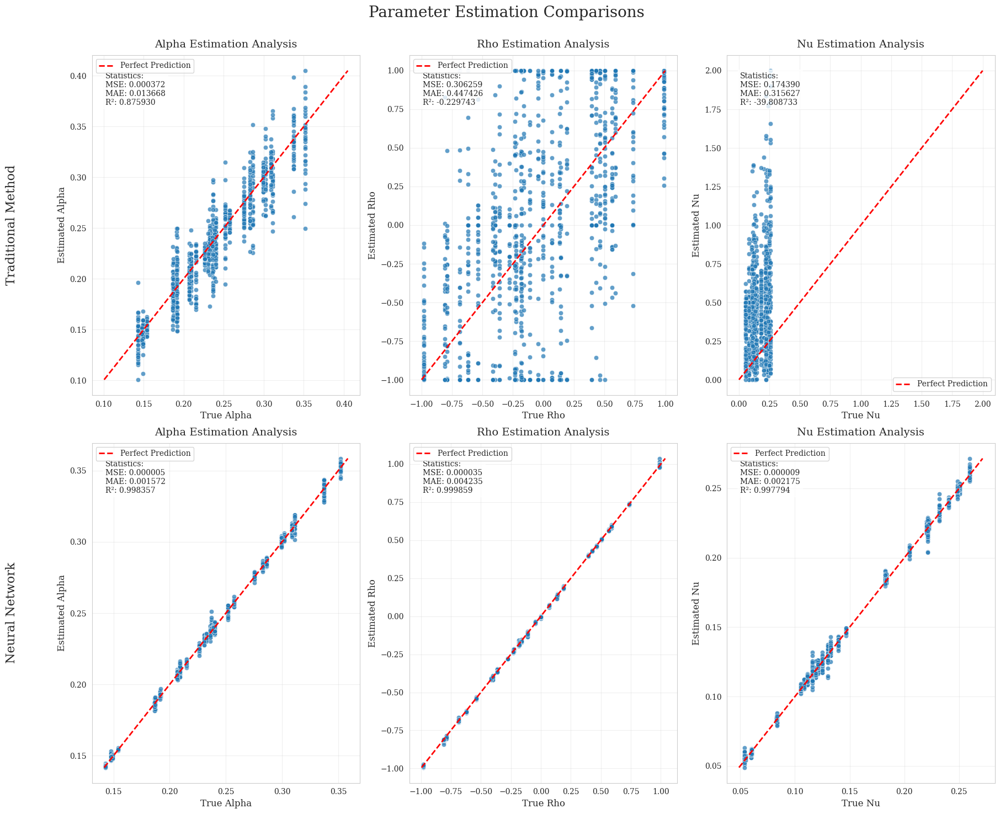

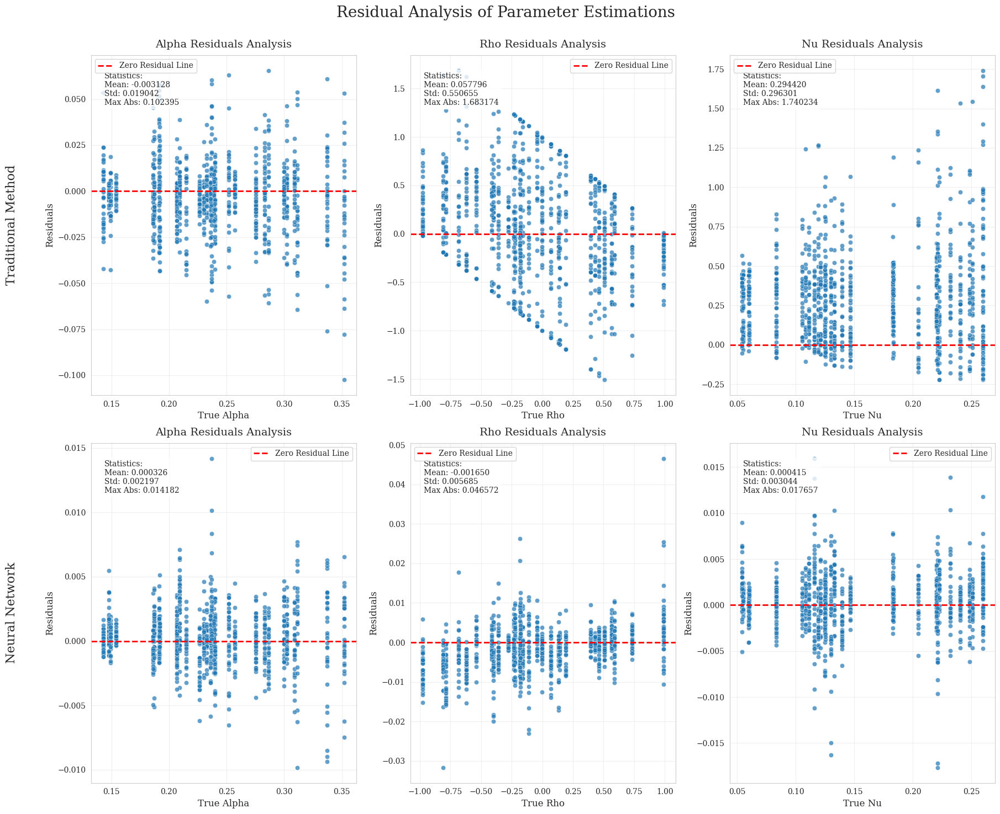

<ipython-input-14-c1ba1c889d0a>:242: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color=plt.cm.get_cmap('viridis')(np.linspace(0, 1, len(time_stats)))


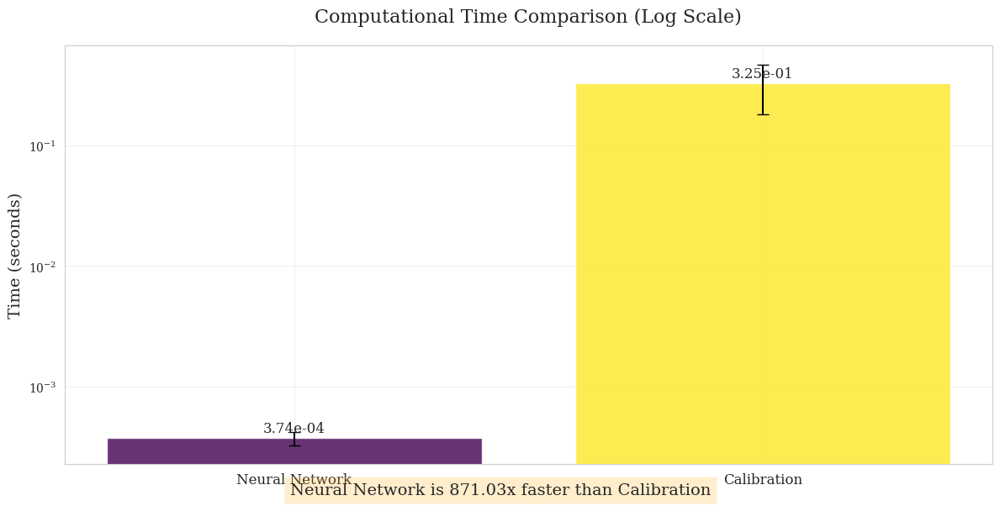


=== Traditional Method Error Metrics ===

             MSE     RMSE      MAE        MAPE         R2  Max Abs Error  \
Alpha   0.000372 0.019287 0.013668    5.851141   0.875930       0.102395   
Rho     0.306259 0.553406 0.447426 1036.274294  -0.229743       1.683174   
Nu      0.174390 0.417600 0.315627  245.739936 -39.808733       1.740234   
Average 0.160340 0.330098 0.258907  429.288457 -13.054182       1.175268   

         Mean Error  Std Error  
Alpha     -0.003128   0.019032  
Rho        0.057796   0.550380  
Nu         0.294420   0.296153  
Average    0.116363   0.288522  

=== Neural Network Method Error Metrics ===

             MSE     RMSE      MAE     MAPE       R2  Max Abs Error  \
Alpha   0.000005 0.002220 0.001572 0.663089 0.998357       0.014182   
Rho     0.000035 0.005917 0.004235 6.585445 0.999859       0.046572   
Nu      0.000009 0.003070 0.002175 1.665524 0.997794       0.017657   
Average 0.000016 0.003735 0.002661 2.971353 0.998670       0.026137   

         

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def create_parameter_comparison_combined(df, figsize=(18, 15)):
    """
    Create comparison plots between traditional method parameters, neural network predicted parameters and true parameters.
    
    Args:
        df: DataFrame containing the parameter data
        figsize: Figure size for plots
    """
    # Set the style
    sns.set_style("whitegrid")
    plt.rcParams['font.family'] = 'serif'
    
    # Create subplots for parameter comparisons (2 rows: traditional vs true, nn vs true)
    fig, axes = plt.subplots(2, 3, figsize=figsize)
    fig.suptitle("Parameter Estimation Comparisons", fontsize=20, y=0.98)
    
    # Parameters to compare
    param_sets = [
        # Traditional method (row 0)
        [
            {'pred': 'alpha', 'true': 'true_alpha', 'name': 'Alpha'},
            {'pred': 'rho', 'true': 'true_rho', 'name': 'Rho'},
            {'pred': 'nu', 'true': 'true_nu', 'name': 'Nu'}
        ],
        # Neural network method (row 1)
        [
            {'pred': 'nn_alpha', 'true': 'true_alpha', 'name': 'Alpha'},
            {'pred': 'nn_rho', 'true': 'true_rho', 'name': 'Rho'},
            {'pred': 'nn_nu', 'true': 'true_nu', 'name': 'Nu'}
        ]
    ]
    
    method_names = ['Traditional Method', 'Neural Network']
    
    # Loop through each method (rows)
    for row_idx, (params, method_name) in enumerate(zip(param_sets, method_names)):
        # Add row title
        axes[row_idx, 0].text(-0.3, 0.5, method_name, 
                             rotation=90, fontsize=16, 
                             transform=axes[row_idx, 0].transAxes,
                             va='center', ha='center')
        
        # Loop through each parameter (columns)
        for col_idx, param in enumerate(params):
            ax = axes[row_idx, col_idx]
            
            # Create scatter plot
            sns.scatterplot(
                data=df,
                x=param['true'],
                y=param['pred'],
                alpha=0.7,
                ax=ax
            )
            
            # Add identity line (perfect prediction)
            min_val = min(df[param['true']].min(), df[param['pred']].min())
            max_val = max(df[param['true']].max(), df[param['pred']].max())
            ax.plot([min_val, max_val], [min_val, max_val], 
                   'r--', label="Perfect Prediction", linewidth=2)
            
            # Calculate statistics
            mse = mean_squared_error(df[param['true']], df[param['pred']])
            mae = mean_absolute_error(df[param['true']], df[param['pred']])
            r2 = r2_score(df[param['true']], df[param['pred']])
            
            # Add statistics text box
            stats_text = (
                f'Statistics:\n'
                f'MSE: {mse:.6f}\n'
                f'MAE: {mae:.6f}\n'
                f'R²: {r2:.6f}'
            )
            
            ax.text(0.05, 0.95, stats_text,
                  transform=ax.transAxes,
                  fontsize=10,
                  verticalalignment='top',
                  bbox=dict(boxstyle='round',
                           facecolor='white',
                           alpha=0.8))
            
            # Customize plot
            ax.set_xlabel(f"True {param['name']}", fontsize=12)
            ax.set_ylabel(f"Estimated {param['name']}", fontsize=12)
            ax.set_title(f"{param['name']} Estimation Analysis", 
                        fontsize=14, pad=10)
            ax.legend(fontsize=10)
            ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

def create_residual_analysis_combined(df, figsize=(18, 15)):
    """
    Create residual analysis plots for both traditional and neural network parameter predictions.
    
    Args:
        df: DataFrame containing the parameter data
        figsize: Figure size for plots
    """
    # Set the style
    sns.set_style("whitegrid")
    plt.rcParams['font.family'] = 'serif'
    
    # Calculate residuals for both methods
    # Traditional method
    df['Residuals_trad_alpha'] = df['alpha'] - df['true_alpha']
    df['Residuals_trad_rho'] = df['rho'] - df['true_rho']
    df['Residuals_trad_nu'] = df['nu'] - df['true_nu']
    
    # Neural network method
    df['Residuals_nn_alpha'] = df['nn_alpha'] - df['true_alpha']
    df['Residuals_nn_rho'] = df['nn_rho'] - df['true_rho']
    df['Residuals_nn_nu'] = df['nn_nu'] - df['true_nu']
    
    # Create subplots for residual analysis
    fig, axes = plt.subplots(2, 3, figsize=figsize)
    fig.suptitle("Residual Analysis of Parameter Estimations", 
                 fontsize=20, y=0.98)
    
    # Parameters to analyze
    param_sets = [
        # Traditional method (row 0)
        [
            {'true': 'true_alpha', 'residual': 'Residuals_trad_alpha', 'name': 'Alpha'},
            {'true': 'true_rho', 'residual': 'Residuals_trad_rho', 'name': 'Rho'},
            {'true': 'true_nu', 'residual': 'Residuals_trad_nu', 'name': 'Nu'}
        ],
        # Neural network method (row 1)
        [
            {'true': 'true_alpha', 'residual': 'Residuals_nn_alpha', 'name': 'Alpha'},
            {'true': 'true_rho', 'residual': 'Residuals_nn_rho', 'name': 'Rho'},
            {'true': 'true_nu', 'residual': 'Residuals_nn_nu', 'name': 'Nu'}
        ]
    ]
    
    method_names = ['Traditional Method', 'Neural Network']
    
    # Loop through each method (rows)
    for row_idx, (params, method_name) in enumerate(zip(param_sets, method_names)):
        # Add row title
        axes[row_idx, 0].text(-0.3, 0.5, method_name, 
                             rotation=90, fontsize=16, 
                             transform=axes[row_idx, 0].transAxes,
                             va='center', ha='center')
        
        # Loop through each parameter (columns)
        for col_idx, param in enumerate(params):
            ax = axes[row_idx, col_idx]
            
            # Create scatter plot
            sns.scatterplot(
                data=df,
                x=param['true'],
                y=param['residual'],
                alpha=0.7,
                ax=ax
            )
            
            # Add zero line
            ax.axhline(0, color='r', linestyle='--', 
                     label="Zero Residual Line", linewidth=2)
            
            # Calculate statistics
            mean_residual = df[param['residual']].mean()
            std_residual = df[param['residual']].std()
            max_abs_residual = abs(df[param['residual']]).max()
            
            # Add statistics text box
            stats_text = (
                f'Statistics:\n'
                f'Mean: {mean_residual:.6f}\n'
                f'Std: {std_residual:.6f}\n'
                f'Max Abs: {max_abs_residual:.6f}'
            )
            
            ax.text(0.05, 0.95, stats_text,
                  transform=ax.transAxes,
                  fontsize=10,
                  verticalalignment='top',
                  bbox=dict(boxstyle='round',
                           facecolor='white',
                           alpha=0.8))
            
            # Customize plot
            ax.set_xlabel(f"True {param['name']}", fontsize=12)
            ax.set_ylabel(f"Residuals", fontsize=12)
            ax.set_title(f"{param['name']} Residuals Analysis", 
                        fontsize=14, pad=10)
            ax.legend(fontsize=10)
            ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

def plot_computation_times(df, figsize=(12, 6)):
    """
    Create computation time comparison plot.
    
    Args:
        df: DataFrame containing the time data
        figsize: Figure size for plot
    """
    # Calculate summary statistics
    time_data = {
        'Calibration': df['cal_time'].values,
        'Neural Network': df['nn_time'].values
    }
    
    # Create summary dataframe
    time_stats = pd.DataFrame({
        'Method': ['Calibration', 'Neural Network'],
        'Mean Time': [df['cal_time'].mean(), df['nn_time'].mean()],
        'Std Time': [df['cal_time'].std(), df['nn_time'].std()]
    })
    
    # Sort by mean time
    time_stats = time_stats.sort_values('Mean Time')
    
    # Create figure
    plt.figure(figsize=figsize)
    
    # Create bar plot
    bars = plt.bar(
        range(len(time_stats)),
        time_stats['Mean Time'],
        yerr=time_stats['Std Time'],
        alpha=0.8,
        capsize=5,
        color=plt.cm.get_cmap('viridis')(np.linspace(0, 1, len(time_stats)))
    )
    
    # Customize plot
    plt.yscale('log')
    plt.xticks(
        range(len(time_stats)),
        time_stats['Method'],
        rotation=0,
        ha='center',
        fontsize=12
    )
    plt.title('Computational Time Comparison (Log Scale)', 
              fontsize=16, pad=20)
    plt.ylabel('Time (seconds)', fontsize=14)
    
    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2.,
            height * 1.05,
            f'{height:.2e}',
            ha='center',
            va='bottom',
            rotation=0,
            fontsize=12
        )
    
    # Add speedup annotation
    speedup = df['cal_time'].mean() / df['nn_time'].mean()
    plt.figtext(0.5, 0.01, f"Neural Network is {speedup:.2f}x faster than Calibration",
               ha="center", fontsize=14, bbox={"facecolor":"orange", "alpha":0.2, "pad":5})
    
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def error_metrics_table():
    """
    Generate comprehensive error metrics table comparing traditional and neural network methods.
    """
    # Calculate error metrics for traditional method
    trad_metrics = {
        'Alpha': {
            'MSE': mean_squared_error(df['true_alpha'], df['alpha']),
            'RMSE': np.sqrt(mean_squared_error(df['true_alpha'], df['alpha'])),
            'MAE': mean_absolute_error(df['true_alpha'], df['alpha']),
            'MAPE': np.mean(np.abs((df['true_alpha'] - df['alpha']) / df['true_alpha'])) * 100,
            'R2': r2_score(df['true_alpha'], df['alpha']),
            'Max Abs Error': np.max(np.abs(df['alpha'] - df['true_alpha'])),
            'Mean Error': np.mean(df['alpha'] - df['true_alpha']),
            'Std Error': np.std(df['alpha'] - df['true_alpha'])
        },
        'Rho': {
            'MSE': mean_squared_error(df['true_rho'], df['rho']),
            'RMSE': np.sqrt(mean_squared_error(df['true_rho'], df['rho'])),
            'MAE': mean_absolute_error(df['true_rho'], df['rho']),
            'MAPE': np.mean(np.abs((df['true_rho'] - df['rho']) / df['true_rho'])) * 100,
            'R2': r2_score(df['true_rho'], df['rho']),
            'Max Abs Error': np.max(np.abs(df['rho'] - df['true_rho'])),
            'Mean Error': np.mean(df['rho'] - df['true_rho']),
            'Std Error': np.std(df['rho'] - df['true_rho'])
        },
        'Nu': {
            'MSE': mean_squared_error(df['true_nu'], df['nu']),
            'RMSE': np.sqrt(mean_squared_error(df['true_nu'], df['nu'])),
            'MAE': mean_absolute_error(df['true_nu'], df['nu']),
            'MAPE': np.mean(np.abs((df['true_nu'] - df['nu']) / df['true_nu'])) * 100,
            'R2': r2_score(df['true_nu'], df['nu']),
            'Max Abs Error': np.max(np.abs(df['nu'] - df['true_nu'])),
            'Mean Error': np.mean(df['nu'] - df['true_nu']),
            'Std Error': np.std(df['nu'] - df['true_nu'])
        }
    }
    
    # Calculate error metrics for neural network method
    nn_metrics = {
        'Alpha': {
            'MSE': mean_squared_error(df['true_alpha'], df['nn_alpha']),
            'RMSE': np.sqrt(mean_squared_error(df['true_alpha'], df['nn_alpha'])),
            'MAE': mean_absolute_error(df['true_alpha'], df['nn_alpha']),
            'MAPE': np.mean(np.abs((df['true_alpha'] - df['nn_alpha']) / df['true_alpha'])) * 100,
            'R2': r2_score(df['true_alpha'], df['nn_alpha']),
            'Max Abs Error': np.max(np.abs(df['nn_alpha'] - df['true_alpha'])),
            'Mean Error': np.mean(df['nn_alpha'] - df['true_alpha']),
            'Std Error': np.std(df['nn_alpha'] - df['true_alpha'])
        },
        'Rho': {
            'MSE': mean_squared_error(df['true_rho'], df['nn_rho']),
            'RMSE': np.sqrt(mean_squared_error(df['true_rho'], df['nn_rho'])),
            'MAE': mean_absolute_error(df['true_rho'], df['nn_rho']),
            'MAPE': np.mean(np.abs((df['true_rho'] - df['nn_rho']) / df['true_rho'])) * 100,
            'R2': r2_score(df['true_rho'], df['nn_rho']),
            'Max Abs Error': np.max(np.abs(df['nn_rho'] - df['true_rho'])),
            'Mean Error': np.mean(df['nn_rho'] - df['true_rho']),
            'Std Error': np.std(df['nn_rho'] - df['true_rho'])
        },
        'Nu': {
            'MSE': mean_squared_error(df['true_nu'], df['nn_nu']),
            'RMSE': np.sqrt(mean_squared_error(df['true_nu'], df['nn_nu'])),
            'MAE': mean_absolute_error(df['true_nu'], df['nn_nu']),
            'MAPE': np.mean(np.abs((df['true_nu'] - df['nn_nu']) / df['true_nu'])) * 100,
            'R2': r2_score(df['true_nu'], df['nn_nu']),
            'Max Abs Error': np.max(np.abs(df['nn_nu'] - df['true_nu'])),
            'Mean Error': np.mean(df['nn_nu'] - df['true_nu']),
            'Std Error': np.std(df['nn_nu'] - df['true_nu'])
        }
    }
    
    # Convert to DataFrames
    trad_df = pd.DataFrame.from_dict(trad_metrics, orient='index')
    nn_df = pd.DataFrame.from_dict(nn_metrics, orient='index')
    
    # Create average rows
    trad_avg = trad_df.mean()
    trad_avg.name = 'Average'
    nn_avg = nn_df.mean()
    nn_avg.name = 'Average'
    
    # Add averages to DataFrames
    trad_df_with_avg = pd.concat([trad_df, pd.DataFrame(trad_avg).T])
    nn_df_with_avg = pd.concat([nn_df, pd.DataFrame(nn_avg).T])
    
    # Print formatted tables
    pd.set_option('display.float_format', lambda x: '{:.6f}'.format(x))
    print("\n=== Traditional Method Error Metrics ===\n")
    print(trad_df_with_avg)
    
    print("\n=== Neural Network Method Error Metrics ===\n")
    print(nn_df_with_avg)
    
    # Calculate improvement percentages
    improvement = pd.DataFrame(index=trad_df.index)
    
    for metric in trad_df.columns:
        if metric == 'R2':
            # For R2, higher is better
            improvement[metric] = ((nn_df[metric] - trad_df[metric]) / np.abs(trad_df[metric])) * 100
        else:
            # For error metrics, lower is better
            improvement[metric] = ((trad_df[metric] - nn_df[metric]) / trad_df[metric]) * 100
    
    # Add average improvement
    avg_improvement = improvement.mean()
    avg_improvement.name = 'Average'
    improvement_with_avg = pd.concat([improvement, pd.DataFrame(avg_improvement).T])
    
    print("\n=== Neural Network Improvement Over Traditional Method (%) ===\n")
    print(improvement_with_avg)
    
    # Compute time improvement
    time_improvement = (df['cal_time'].mean() - df['nn_time'].mean()) / df['cal_time'].mean() * 100
    speedup = df['cal_time'].mean() / df['nn_time'].mean()
    
    print(f"\nTime Metrics:")
    print(f"Traditional Method Mean Time: {df['cal_time'].mean():.6f} seconds")
    print(f"Neural Network Mean Time: {df['nn_time'].mean():.6f} seconds")
    print(f"Time Improvement: {time_improvement:.2f}%")
    print(f"Speedup Factor: Neural Network is {speedup:.2f}x faster")

# Execute the functions
create_parameter_comparison_combined(df)
create_residual_analysis_combined(df)
plot_computation_times(df)
error_metrics_table()

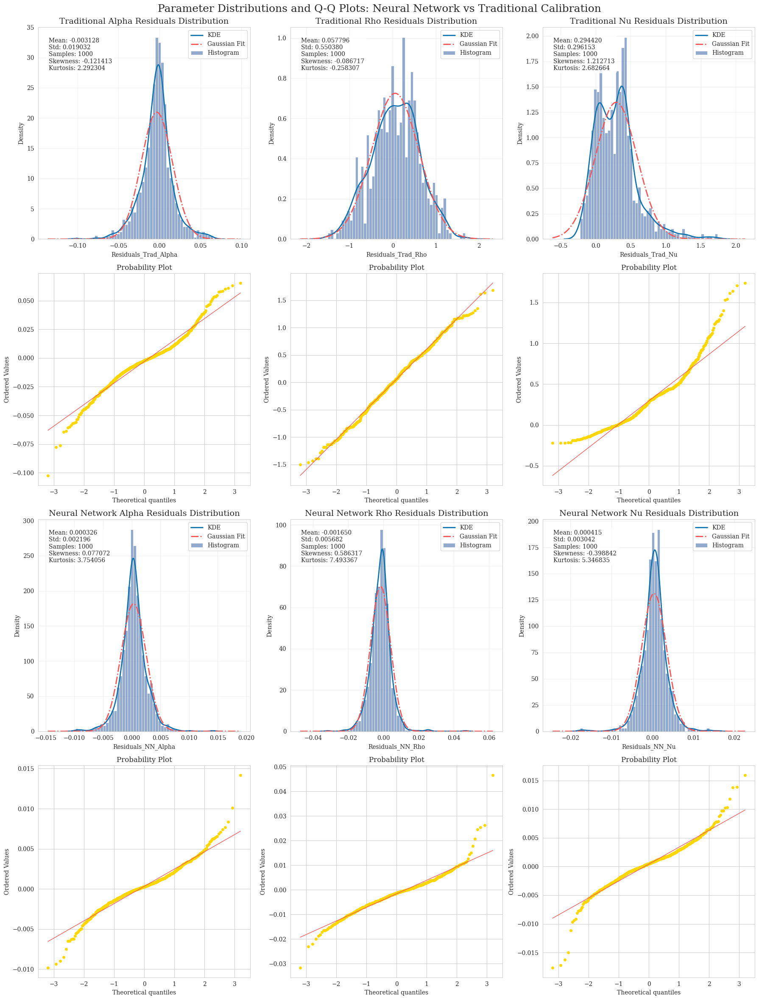

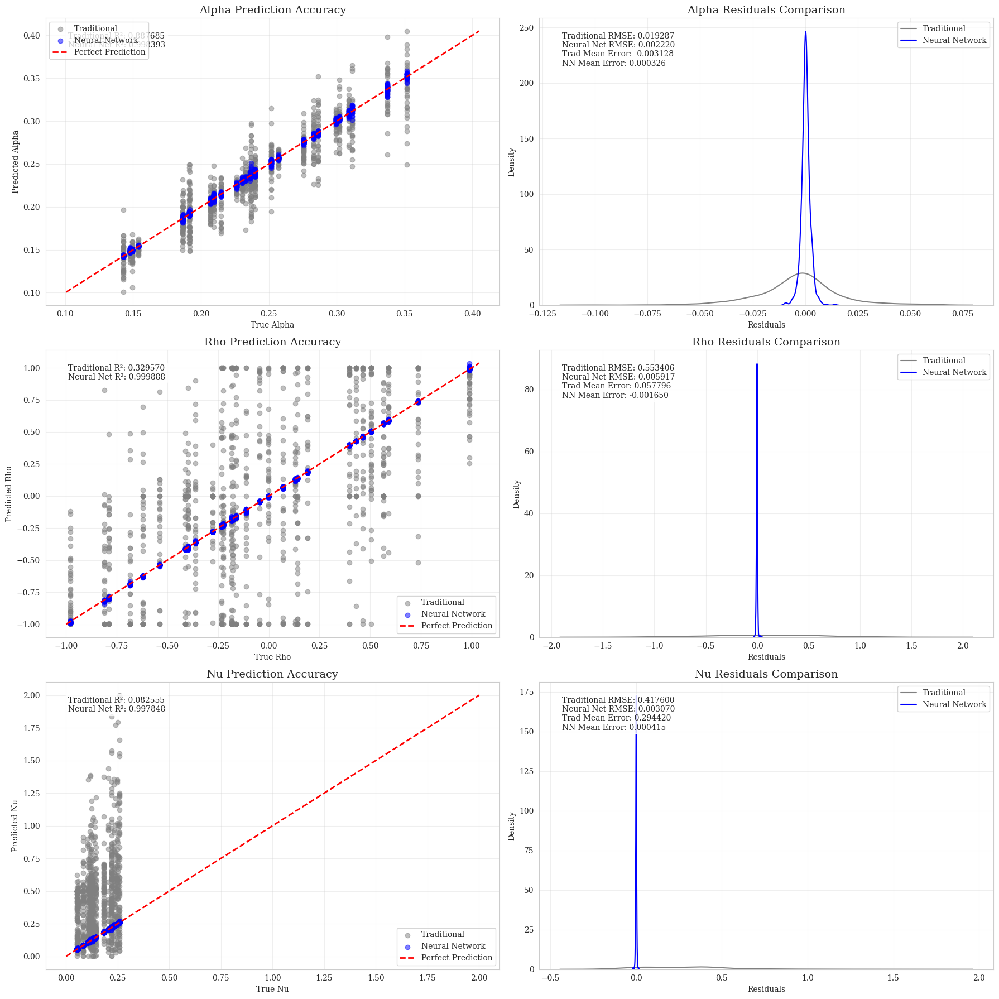

Parameter Estimation Performance Summary:
  Parameter          Method       R²     RMSE      MAE  Mean Error  \
0     Alpha     Traditional 0.887685 0.019287 0.013668   -0.003128   
1     Alpha  Neural Network 0.998393 0.002220 0.001572    0.000326   
2       Rho     Traditional 0.329570 0.553406 0.447426    0.057796   
3       Rho  Neural Network 0.999888 0.005917 0.004235   -0.001650   
4        Nu     Traditional 0.082555 0.417600 0.315627    0.294420   
5        Nu  Neural Network 0.997848 0.003070 0.002175    0.000415   

   StdDev Error  Skewness  Kurtosis  
0      0.019032 -0.121413  2.292304  
1      0.002196  0.077072  3.754056  
2      0.550380 -0.086717 -0.258307  
3      0.005682  0.586317  7.493367  
4      0.296153  1.212713  2.682664  
5      0.003042 -0.398842  5.346835  


In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats
from scipy.stats import norm
import warnings

# Suppress warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Load data
df = pd.read_csv('/kaggle/input/results-calibration/sabr_comparison_results_with_timing.csv')
df = df[['alpha', 'rho', 'nu', 'nn_alpha', 'nn_rho', 'nn_nu', 'true_alpha', 'true_rho', 'true_nu']]

# Set style
sns.set_style("whitegrid")
plt.rcParams['font.family'] = 'serif'

# Define parameters and methods
parameters = [
    {'name': 'Alpha', 'traditional': 'alpha', 'nn': 'nn_alpha', 'true': 'true_alpha'},
    {'name': 'Rho', 'traditional': 'rho', 'nn': 'nn_rho', 'true': 'true_rho'},
    {'name': 'Nu', 'traditional': 'nu', 'nn': 'nn_nu', 'true': 'true_nu'}
]

methods = [
    {'name': 'Traditional', 'color': '#4C72B0'},
    {'name': 'Neural Network', 'color': '#FF5252'}
]

# Create figure for 12 separate plots (3 parameters × 2 methods × 2 plot types)
fig, axes = plt.subplots(4, 3, figsize=(18, 24))
fig.suptitle("Parameter Distributions and Q-Q Plots: Neural Network vs Traditional Calibration\n", fontsize=18, y=0.98)

# Calculate residuals for each parameter and method
for param in parameters:
    # Neural Network residuals
    df[f"Residuals_NN_{param['name']}"] = df[param['nn']] - df[param['true']]
    
    # Traditional residuals
    df[f"Residuals_Trad_{param['name']}"] = df[param['traditional']] - df[param['true']]

# Plot distributions and Q-Q plots
for col_idx, param in enumerate(parameters):
    # Traditional method - Distribution (row 0)
    residuals_trad = df[f"Residuals_Trad_{param['name']}"].dropna()
    mean_residual = np.mean(residuals_trad)
    std_residual = np.std(residuals_trad)
    xmin, xmax = residuals_trad.min(), residuals_trad.max()
    x = np.linspace(xmin - 0.2*(xmax - xmin), xmax + 0.2*(xmax - xmin), 300)
    p = norm.pdf(x, mean_residual, std_residual)
    
    sns.histplot(residuals_trad, stat="density", color="#4C72B0", alpha=0.6, bins=50, ax=axes[0, col_idx], label="Histogram")
    sns.kdeplot(residuals_trad, color="#0C72B0", linewidth=2, label="KDE", ax=axes[0, col_idx])
    axes[0, col_idx].plot(x, p, color="#FF5252", label="Gaussian Fit", linewidth=2, linestyle='-.')
    
    stats_text = (
        f'Mean: {mean_residual:.6f}\n'
        f'Std: {std_residual:.6f}\n'
        f'Samples: {len(residuals_trad)}\n'
        f'Skewness: {stats.skew(residuals_trad):.6f}\n'
        f'Kurtosis: {stats.kurtosis(residuals_trad):.6f}'
    )
    
    axes[0, col_idx].text(0.05, 0.95, stats_text, transform=axes[0, col_idx].transAxes, fontsize=10,
                      verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    axes[0, col_idx].set_title(f"Traditional {param['name']} Residuals Distribution", fontsize=14)
    axes[0, col_idx].legend()
    axes[0, col_idx].grid(True, alpha=0.3)
    
    # Traditional method - Q-Q Plot (row 1)
    stats.probplot(residuals_trad, dist="norm", plot=axes[1, col_idx])
    axes[1, col_idx].get_lines()[0].set_markerfacecolor("#FFD700")  # Yellow points
    axes[1, col_idx].get_lines()[0].set_markeredgecolor("#FFD700")
    axes[1, col_idx].get_lines()[0].set_markersize(4)
    axes[1, col_idx].get_lines()[1].set_color("#FF5252")            # Red line
    axes[1, col_idx].get_lines()[1].set_linewidth(1)
        
    # Neural Network - Distribution (row 2)
    residuals_nn = df[f"Residuals_NN_{param['name']}"].dropna()
    mean_residual = np.mean(residuals_nn)
    std_residual = np.std(residuals_nn)
    xmin, xmax = residuals_nn.min(), residuals_nn.max()
    x = np.linspace(xmin - 0.2*(xmax - xmin), xmax + 0.2*(xmax - xmin), 300)
    p = norm.pdf(x, mean_residual, std_residual)
    
    sns.histplot(residuals_nn, stat="density", color="#4C72B0", alpha=0.6, bins=50, ax=axes[2, col_idx], label="Histogram")
    sns.kdeplot(residuals_nn, color="#0C72B0", linewidth=2, label="KDE", ax=axes[2, col_idx])
    axes[2, col_idx].plot(x, p, color="#FF5252", label="Gaussian Fit", linewidth=2, linestyle='-.')
    
    stats_text = (
        f'Mean: {mean_residual:.6f}\n'
        f'Std: {std_residual:.6f}\n'
        f'Samples: {len(residuals_nn)}\n'
        f'Skewness: {stats.skew(residuals_nn):.6f}\n'
        f'Kurtosis: {stats.kurtosis(residuals_nn):.6f}'
    )
    
    axes[2, col_idx].text(0.05, 0.95, stats_text, transform=axes[2, col_idx].transAxes, fontsize=10,
                      verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    axes[2, col_idx].set_title(f"Neural Network {param['name']} Residuals Distribution", fontsize=14)
    axes[2, col_idx].legend()
    axes[2, col_idx].grid(True, alpha=0.3)
    
    # Neural Network - Q-Q Plot (row 3)
    stats.probplot(residuals_nn, dist="norm", plot=axes[3, col_idx])
    axes[3, col_idx].get_lines()[0].set_markerfacecolor("#FFD700")  # Yellow points
    axes[3, col_idx].get_lines()[0].set_markeredgecolor("#FFD700")
    axes[3, col_idx].get_lines()[0].set_markersize(4)
    axes[3, col_idx].get_lines()[1].set_color("#FF5252")            # Red line
    axes[3, col_idx].get_lines()[1].set_linewidth(1)

plt.tight_layout()
plt.show()

# Additional detailed comparison
fig, axes = plt.subplots(3, 2, figsize=(18, 18))
#fig.suptitle("Parameter Estimation Comparison: Neural Network vs Traditional Calibration", fontsize=18, y=0.98)

for idx, param in enumerate(parameters):
    # Left column: Scatter plots of predicted vs true values
    axes[idx, 0].scatter(df[param['true']], df[param['traditional']], alpha=0.5, color='gray', label='Traditional')
    axes[idx, 0].scatter(df[param['true']], df[param['nn']], alpha=0.5, color='blue', label='Neural Network')
    
    # Add perfect prediction line
    min_val = min(df[param['true']].min(), df[param['traditional']].min(), df[param['nn']].min())
    max_val = max(df[param['true']].max(), df[param['traditional']].max(), df[param['nn']].max())
    axes[idx, 0].plot([min_val, max_val], [min_val, max_val], 'r--', linewidth=2, label='Perfect Prediction')
    
    # Calculate R² for both methods
    r2_trad = stats.pearsonr(df[param['true']], df[param['traditional']])[0]**2
    r2_nn = stats.pearsonr(df[param['true']], df[param['nn']])[0]**2
    
    stats_text = (
        f'Traditional R²: {r2_trad:.6f}\n'
        f'Neural Net R²: {r2_nn:.6f}'
    )
    
    axes[idx, 0].text(0.05, 0.95, stats_text, transform=axes[idx, 0].transAxes, fontsize=10,
                   verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    axes[idx, 0].set_xlabel(f'True {param["name"]}')
    axes[idx, 0].set_ylabel(f'Predicted {param["name"]}')
    axes[idx, 0].set_title(f'{param["name"]} Prediction Accuracy', fontsize=14)
    axes[idx, 0].legend()
    axes[idx, 0].grid(True, alpha=0.3)
    
    # Right column: Residuals distribution comparison
    sns.kdeplot(df[f"Residuals_Trad_{param['name']}"], color='gray', label='Traditional', ax=axes[idx, 1])
    sns.kdeplot(df[f"Residuals_NN_{param['name']}"], color='blue', label='Neural Network', ax=axes[idx, 1])
    
    # Calculate metrics for comparison
    rmse_trad = np.sqrt(np.mean(df[f"Residuals_Trad_{param['name']}"]**2))
    rmse_nn = np.sqrt(np.mean(df[f"Residuals_NN_{param['name']}"]**2))
    mean_trad = np.mean(df[f"Residuals_Trad_{param['name']}"])
    mean_nn = np.mean(df[f"Residuals_NN_{param['name']}"])
    
    stats_text = (
        f'Traditional RMSE: {rmse_trad:.6f}\n'
        f'Neural Net RMSE: {rmse_nn:.6f}\n'
        f'Trad Mean Error: {mean_trad:.6f}\n'
        f'NN Mean Error: {mean_nn:.6f}'
    )
    
    axes[idx, 1].text(0.05, 0.95, stats_text, transform=axes[idx, 1].transAxes, fontsize=10,
                   verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    axes[idx, 1].set_xlabel('Residuals')
    axes[idx, 1].set_ylabel('Density')
    axes[idx, 1].set_title(f'{param["name"]} Residuals Comparison', fontsize=14)
    axes[idx, 1].legend()
    axes[idx, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Create a summary statistics table
summary_stats = []

for param in parameters:
    for method_name, method_col in [('Traditional', param['traditional']), ('Neural Network', param['nn'])]:
        residuals = df[method_col] - df[param['true']]
        
        summary_stats.append({
            'Parameter': param['name'],
            'Method': method_name,
            'R²': stats.pearsonr(df[param['true']], df[method_col])[0]**2,
            'RMSE': np.sqrt(np.mean(residuals**2)),
            'MAE': np.mean(np.abs(residuals)),
            'Mean Error': np.mean(residuals),
            'StdDev Error': np.std(residuals),
            'Skewness': stats.skew(residuals),
            'Kurtosis': stats.kurtosis(residuals)
        })

summary_df = pd.DataFrame(summary_stats)
print("Parameter Estimation Performance Summary:")
pd.set_option('display.float_format', lambda x: '{:.6f}'.format(x))
print(summary_df)


=== Error Metrics by Parameter ===

           MSE     RMSE      MAE     MAPE       R2  Max Abs Error  Mean Error  \
Alpha 0.000011 0.003323 0.002864 1.117522 0.989012       0.004974    0.000875   
Rho   0.000050 0.007105 0.005111 1.109124 0.999830       0.013857   -0.005111   
Nu    0.000031 0.005542 0.004332 3.604413 0.885870       0.009686    0.003336   

       Std Error  
Alpha   0.003206  
Rho     0.004935  
Nu      0.004425  

=== Error Metrics with Average ===

             MSE     RMSE      MAE     MAPE       R2  Max Abs Error  \
Alpha   0.000011 0.003323 0.002864 1.117522 0.989012       0.004974   
Rho     0.000050 0.007105 0.005111 1.109124 0.999830       0.013857   
Nu      0.000031 0.005542 0.004332 3.604413 0.885870       0.009686   
Average 0.000031 0.005323 0.004102 1.943686 0.958238       0.009506   

         Mean Error  Std Error  
Alpha      0.000875   0.003206  
Rho       -0.005111   0.004935  
Nu         0.003336   0.004425  
Average   -0.000300   0.004189  

Tim

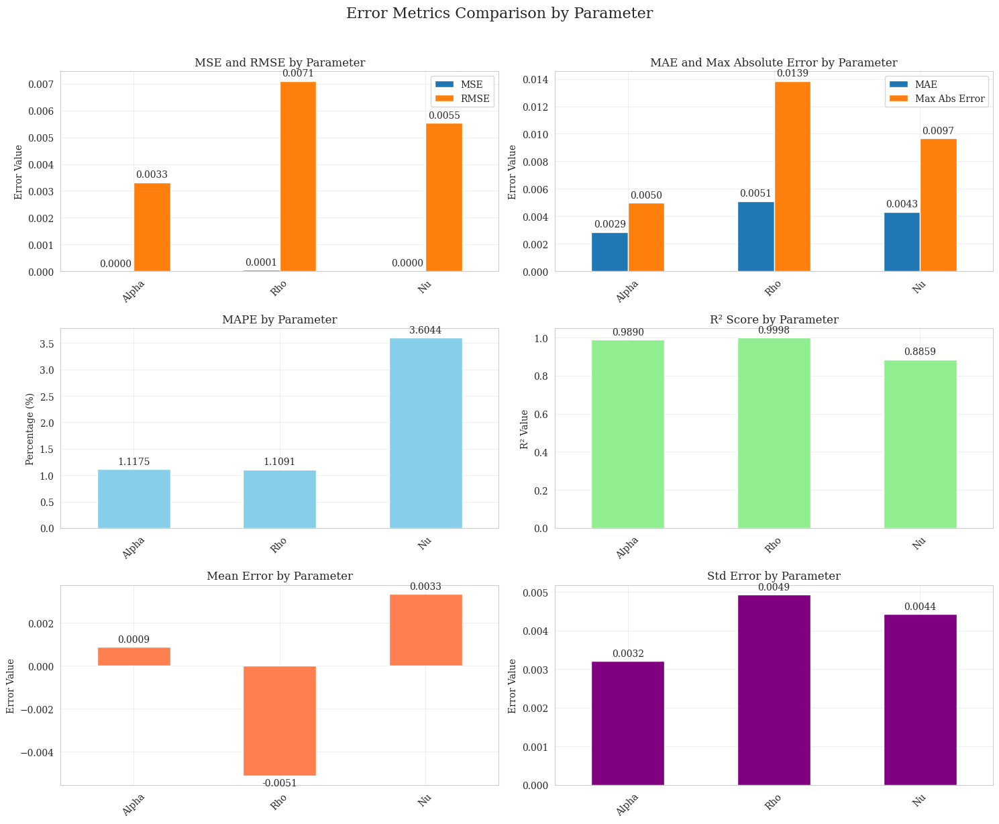

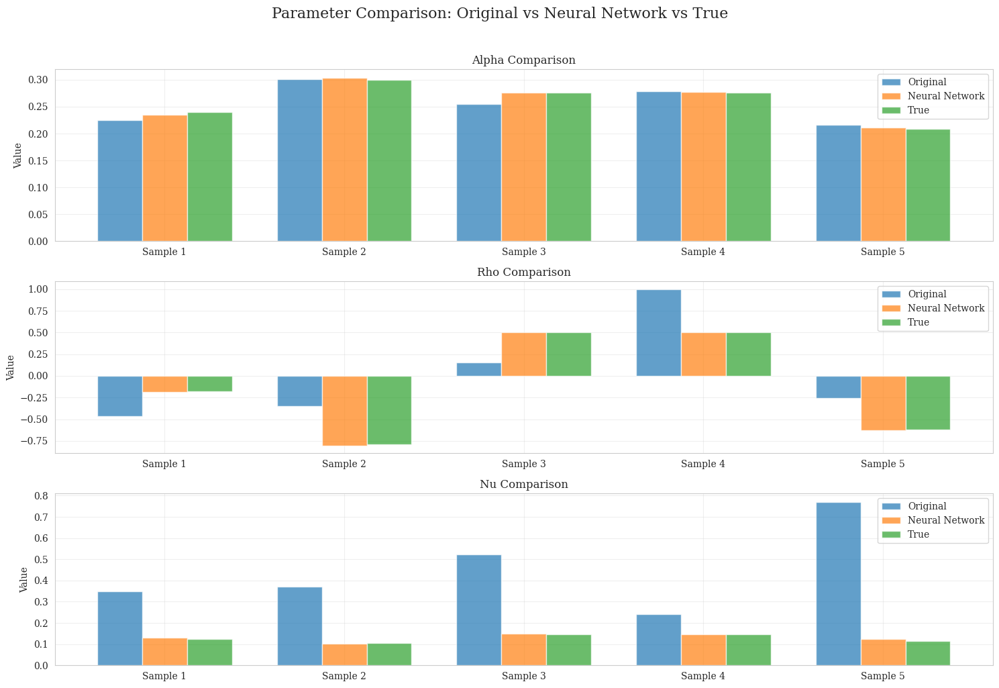

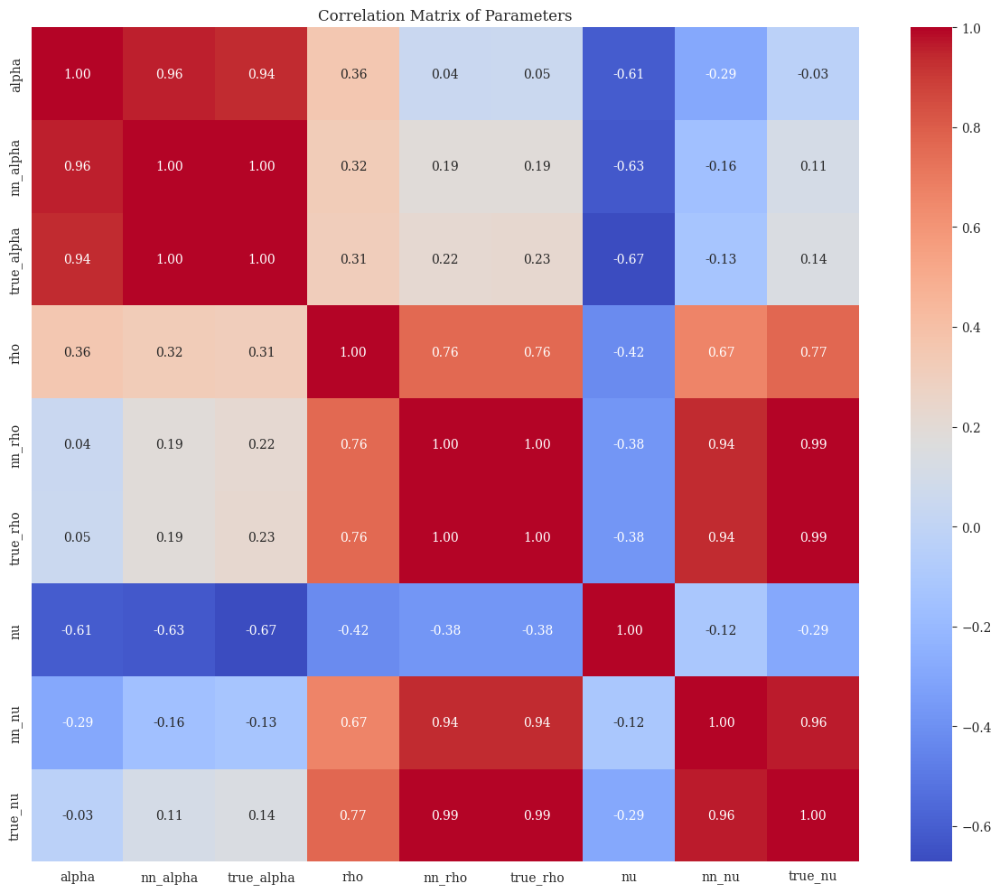


=== Performance Comparison: Original vs Neural Network ===

       Original MSE  Neural Network MSE  Improvement (%)
Alpha      0.000139            0.000011        92.084706
Rho        0.154335            0.000050        99.967293
Nu         0.140141            0.000031        99.978083

=== Summary Statistics ===

       Original MAPE (%)  Neural Network MAPE (%)  Time Improvement
Alpha           3.727510                 1.117522        710.419616
Rho            88.337956                 1.109124        710.419616
Nu            263.790548                 3.604413        710.419616


In [8]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns


# Function to calculate comprehensive error metrics
def calculate_parameter_error_metrics(df, param_pairs):
    """
    Calculate error metrics for model parameters compared to true values
    
    Args:
        df: DataFrame containing predictions and true values
        param_pairs: List of tuples (predicted_col, true_col, param_name)
    
    Returns:
        DataFrame containing error metrics for each parameter
    """
    metrics = {}
    
    for pred_col, true_col, param_name in param_pairs:
        predicted = df[pred_col]
        actual = df[true_col]
        
        # Calculate errors
        errors = predicted - actual
        abs_errors = np.abs(errors)
        rel_errors = np.abs(errors / actual) * 100  # Percentage error
        
        # Calculate various error metrics
        metrics[param_name] = {
            'MSE': mean_squared_error(actual, predicted),
            'RMSE': np.sqrt(mean_squared_error(actual, predicted)),
            'MAE': mean_absolute_error(actual, predicted),
            'MAPE': np.mean(np.abs((actual - predicted) / actual)) * 100,
            'R2': r2_score(actual, predicted),
            'Max Abs Error': np.max(abs_errors),
            'Mean Error': np.mean(errors),
            'Std Error': np.std(errors)
        }
    
    # Convert to DataFrame
    metrics_df = pd.DataFrame.from_dict(metrics, orient='index')
    
    return metrics_df

# Define parameter pairs (predicted column, true column, parameter name)
param_pairs = [
    ('nn_alpha', 'true_alpha', 'Alpha'),
    ('nn_rho', 'true_rho', 'Rho'),
    ('nn_nu', 'true_nu', 'Nu')
]

# Calculate error metrics
metrics_df = calculate_parameter_error_metrics(df, param_pairs)

# Print the metrics table
pd.set_option('display.float_format', lambda x: '{:.6f}'.format(x))
print("\n=== Error Metrics by Parameter ===\n")
print(metrics_df)

# Calculate average metrics across parameters
avg_metrics = metrics_df.mean()
avg_metrics.name = 'Average'
metrics_df_with_avg = pd.concat([metrics_df, pd.DataFrame(avg_metrics).T])

print("\n=== Error Metrics with Average ===\n")
print(metrics_df_with_avg)

# Calculate time advantage (ratio of calibration time to neural network time)
time_advantage = df['cal_time'].mean() / df['nn_time'].mean()
print(f"\nTime Advantage: Neural network is {time_advantage:.2f}x faster than calibration method")

# Plot error metrics comparison
def plot_error_metrics(metrics_df, figsize=(15, 12)):
    """Create visualizations for error metrics comparison"""
    # Create figure with subplots
    fig, axes = plt.subplots(3, 2, figsize=figsize)
    fig.suptitle('Error Metrics Comparison by Parameter', fontsize=16, y=1.02)
    
    # Plot MSE and RMSE
    metrics_df[['MSE', 'RMSE']].plot(kind='bar', ax=axes[0,0], rot=45)
    axes[0,0].set_title('MSE and RMSE by Parameter')
    axes[0,0].set_ylabel('Error Value')
    axes[0,0].grid(True, alpha=0.3)
    
    # Plot MAE and Max Abs Error
    metrics_df[['MAE', 'Max Abs Error']].plot(kind='bar', ax=axes[0,1], rot=45)
    axes[0,1].set_title('MAE and Max Absolute Error by Parameter')
    axes[0,1].set_ylabel('Error Value')
    axes[0,1].grid(True, alpha=0.3)
    
    # Plot MAPE
    metrics_df['MAPE'].plot(kind='bar', ax=axes[1,0], rot=45, color='skyblue')
    axes[1,0].set_title('MAPE by Parameter')
    axes[1,0].set_ylabel('Percentage (%)')
    axes[1,0].grid(True, alpha=0.3)
    
    # Plot R2 Score
    metrics_df['R2'].plot(kind='bar', ax=axes[1,1], rot=45, color='lightgreen')
    axes[1,1].set_title('R² Score by Parameter')
    axes[1,1].set_ylabel('R² Value')
    axes[1,1].grid(True, alpha=0.3)
    
    # Plot Mean Error
    metrics_df['Mean Error'].plot(kind='bar', ax=axes[2,0], rot=45, color='coral')
    axes[2,0].set_title('Mean Error by Parameter')
    axes[2,0].set_ylabel('Error Value')
    axes[2,0].grid(True, alpha=0.3)
    
    # Plot Std Error
    metrics_df['Std Error'].plot(kind='bar', ax=axes[2,1], rot=45, color='purple')
    axes[2,1].set_title('Std Error by Parameter')
    axes[2,1].set_ylabel('Error Value')
    axes[2,1].grid(True, alpha=0.3)
    
    # Add value labels on bars for all subplots
    for ax in axes.flat:
        for container in ax.containers:
            ax.bar_label(container, fmt='%.4f', padding=3)
    
    plt.tight_layout()
    plt.show()

# Plot comparison of original vs predicted vs true values
def plot_parameter_comparison(df, param_tuples, figsize=(15, 10)):
    """
    Plot the comparison between original, neural network and true parameter values
    
    Args:
        df: DataFrame containing all values
        param_tuples: List of tuples (original_col, nn_col, true_col, param_name)
        figsize: Figure size for plots
    """
    fig, axes = plt.subplots(len(param_tuples), 1, figsize=figsize)
    fig.suptitle('Parameter Comparison: Original vs Neural Network vs True', fontsize=16, y=1.02)
    
    for i, (orig_col, nn_col, true_col, param_name) in enumerate(param_tuples):
        ax = axes[i]
        
        # Plot the values
        x = np.arange(len(df))
        width = 0.25
        
        ax.bar(x - width, df[orig_col], width, label='Original', alpha=0.7)
        ax.bar(x, df[nn_col], width, label='Neural Network', alpha=0.7)
        ax.bar(x + width, df[true_col], width, label='True', alpha=0.7)
        
        ax.set_title(f'{param_name} Comparison')
        ax.set_ylabel('Value')
        ax.set_xticks(x)
        ax.set_xticklabels([f'Sample {i+1}' for i in range(len(df))])
        ax.legend()
        ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Plot error metrics
plot_error_metrics(metrics_df)

# Define parameter tuples for comparison plot
param_comparison = [
    ('alpha', 'nn_alpha', 'true_alpha', 'Alpha'),
    ('rho', 'nn_rho', 'true_rho', 'Rho'),
    ('nu', 'nn_nu', 'true_nu', 'Nu')
]

# Plot parameter comparisons
plot_parameter_comparison(df, param_comparison)

# Create a heatmap of the correlation between parameters
corr_matrix = df[['alpha', 'nn_alpha', 'true_alpha', 
                 'rho', 'nn_rho', 'true_rho', 
                 'nu', 'nn_nu', 'true_nu']].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Parameters')
plt.tight_layout()
plt.show()

# Calculate performance comparison between original and neural network
original_errors = {
    'Alpha': mean_squared_error(df['true_alpha'], df['alpha']),
    'Rho': mean_squared_error(df['true_rho'], df['rho']),
    'Nu': mean_squared_error(df['true_nu'], df['nu'])
}

nn_errors = {
    'Alpha': mean_squared_error(df['true_alpha'], df['nn_alpha']),
    'Rho': mean_squared_error(df['true_rho'], df['nn_rho']),
    'Nu': mean_squared_error(df['true_nu'], df['nn_nu'])
}

# Create a comparison table
performance_comparison = pd.DataFrame({
    'Original MSE': pd.Series(original_errors),
    'Neural Network MSE': pd.Series(nn_errors)
})

# Calculate improvement percentage
performance_comparison['Improvement (%)'] = (1 - performance_comparison['Neural Network MSE'] / performance_comparison['Original MSE']) * 100

print("\n=== Performance Comparison: Original vs Neural Network ===\n")
print(performance_comparison)

# Summary statistics
print("\n=== Summary Statistics ===\n")
# Calculate mean absolute percentage error between original and true values
original_mape = {
    'Alpha': np.mean(np.abs((df['true_alpha'] - df['alpha']) / df['true_alpha'])) * 100,
    'Rho': np.mean(np.abs((df['true_rho'] - df['rho']) / df['true_rho'])) * 100,
    'Nu': np.mean(np.abs((df['true_nu'] - df['nu']) / df['true_nu'])) * 100
}

# Calculate mean absolute percentage error between nn and true values
nn_mape = {
    'Alpha': np.mean(np.abs((df['true_alpha'] - df['nn_alpha']) / df['true_alpha'])) * 100,
    'Rho': np.mean(np.abs((df['true_rho'] - df['nn_rho']) / df['true_rho'])) * 100,
    'Nu': np.mean(np.abs((df['true_nu'] - df['nn_nu']) / df['true_nu'])) * 100
}

summary_stats = pd.DataFrame({
    'Original MAPE (%)': pd.Series(original_mape),
    'Neural Network MAPE (%)': pd.Series(nn_mape),
    'Time Improvement': pd.Series({p: time_advantage for p in ['Alpha', 'Rho', 'Nu']})
})

print(summary_stats)

Parameter Estimate Summary:

                          mean          std           min           25%  \
Alpha_Calibrated  0.2317549264 0.0566649283  0.1006989374  0.1944661771   
Alpha_NN          0.2352083979 0.0547665339  0.1417234000  0.1930322275   
Rho_Calibrated    0.0129641682 0.6555357710 -0.9990000000 -0.4755094952   
Rho_NN           -0.0464819149 0.5013828185 -0.9938789000 -0.3949435875   
Nu_Calibrated     0.4485467741 0.3083946775  0.0010000000  0.2096127776   
Nu_NN             0.1545418050 0.0655788770  0.0488655270  0.1103737175   

                           50%          75%          max  
Alpha_Calibrated  0.2281516176 0.2679886717 0.4050039774  
Alpha_NN          0.2348621800 0.2774469150 0.3585164800  
Rho_Calibrated   -0.0001360865 0.5634929202 0.9990000000  
Rho_NN           -0.1267981050 0.4276050650 1.0365721000  
Nu_Calibrated     0.4236309232 0.5757715962 2.0000000000  
Nu_NN             0.1349251500 0.2215514425 0.2715388800  


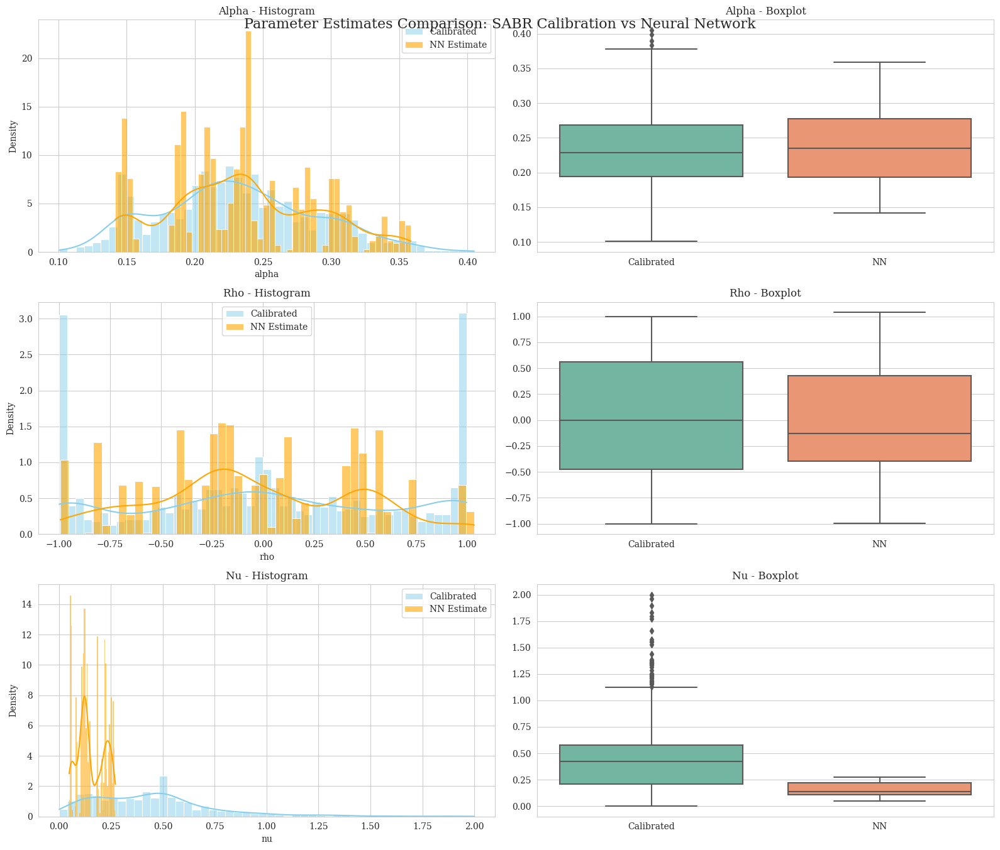

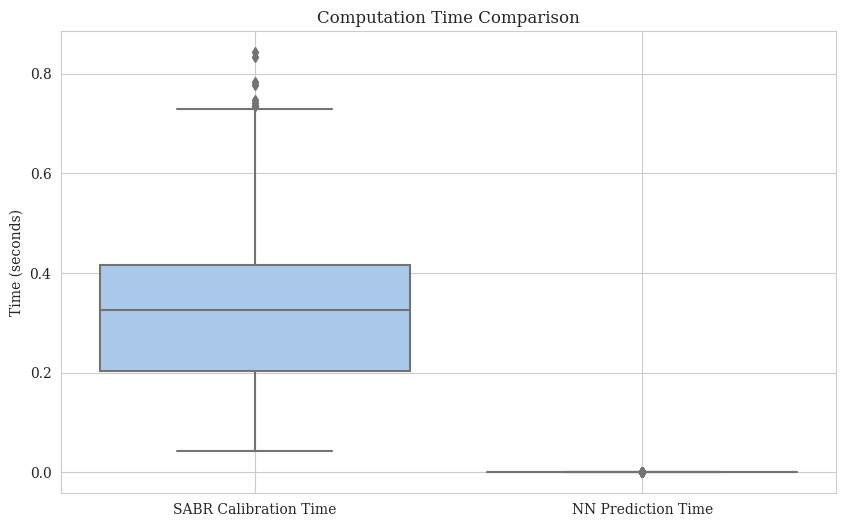

In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
df = pd.read_csv('/kaggle/input/results-calibration/sabr_comparison_results_with_timing.csv')

# Ensure correct columns
columns = ['alpha', 'rho', 'nu', 'nn_alpha', 'nn_rho', 'nn_nu', 'true_alpha', 'true_rho', 'true_nu', 'cal_time', 'nn_time']
df = df[columns]

# Mapping of parameter names
param_map = {
    'alpha': 'Alpha',
    'rho': 'Rho',
    'nu': 'Nu'
}

# Plot histogram and boxplot comparison for each parameter
def plot_param_comparison(df):
    sns.set_style("whitegrid")
    plt.rcParams['font.family'] = 'serif'
    
    fig, axes = plt.subplots(3, 2, figsize=(16, 14))
    fig.suptitle('Parameter Estimates Comparison: SABR Calibration vs Neural Network', fontsize=16, y=0.95)

    for i, (param, label) in enumerate(param_map.items()):
        ax_hist = axes[i, 0]
        ax_box = axes[i, 1]
        
        sns.histplot(df[param], label='Calibrated', ax=ax_hist, kde=True, stat="density", color='skyblue', bins=50)
        sns.histplot(df[f'nn_{param}'], label='NN Estimate', ax=ax_hist, kde=True, stat="density", color='orange', bins=50, alpha=0.6)
        ax_hist.set_title(f'{label} - Histogram')
        ax_hist.legend()

        sns.boxplot(data=df[[param, f'nn_{param}']], ax=ax_box, palette='Set2')
        ax_box.set_xticklabels(['Calibrated', 'NN'])
        ax_box.set_title(f'{label} - Boxplot')

    plt.tight_layout()
    plt.show()

# Summary statistics for each parameter
def summarize_parameters(df):
    all_stats = {}
    for param in param_map.keys():
        stats_cal = df[param].describe()
        stats_nn = df[f'nn_{param}'].describe()
        all_stats[f'{param_map[param]}_Calibrated'] = stats_cal
        all_stats[f'{param_map[param]}_NN'] = stats_nn
    
    summary_df = pd.DataFrame(all_stats).T
    print("Parameter Estimate Summary:\n")
    print(summary_df[['mean', 'std', 'min', '25%', '50%', '75%', 'max']])

# Plot timing comparison
def plot_time_comparison(df):
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df[['cal_time', 'nn_time']], palette='pastel')
    plt.xticks([0, 1], ['SABR Calibration Time', 'NN Prediction Time'])
    plt.title('Computation Time Comparison')
    plt.ylabel('Time (seconds)')
    plt.grid(True)
    plt.show()

# Run all analysis
def full_parameter_comparison_analysis(df):
    summarize_parameters(df)
    plot_param_comparison(df)
    plot_time_comparison(df)

# Execute
full_parameter_comparison_analysis(df)


# SABR IMPLOED VOLATILITY

In [ ]:
Best model:{'num_layers': 5, 'hidden_size': 51, 'dropout_rate': 0.002176982402411834,
            'learning_rate': 0.00036716424635711327, 'batch_size': 256}

In [7]:
SABR_price = pd.read_csv('/kaggle/input/sabr-def-p1/SABR_model_DEF_PARTE01.csv')
SABR_price["S0"] = SABR_price["S0"] * np.exp(SABR_price["r"] * SABR_price["T"])
SABR_price.head()

,S0,alpha,beta,rho,nu,r,T,K,IV,IV_Approx,BS Price,SABR Price,BS Price IV
0,85.920476,0.067447,1.0,0.520296,0.124547,0.024805,0.2,50,0.386060,0.060740,35.742719,35.745352,35.745352
1,85.920476,0.067447,1.0,0.520296,0.124547,0.024805,0.2,55,0.321857,0.060176,30.767462,30.770095,30.770095
2,85.920476,0.067447,1.0,0.520296,0.124547,0.024805,0.2,60,0.262809,0.060290,25.792205,25.794838,25.794838
3,85.920476,0.067447,1.0,0.520296,0.124547,0.024805,0.2,65,0.207931,0.060993,20.816948,20.819582,20.819582
4,85.920476,0.067447,1.0,0.520296,0.124547,0.024805,0.2,70,0.156389,0.062161,15.841691,15.844325,15.844325


In [8]:
class OptionPricingDatasetSABR(torch.utils.data.Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X.values, dtype=torch.float32).to(device)
        self.y = torch.tensor(y.values, dtype=torch.float32).to(device)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [9]:
X_sabr_vol = SABR_price.drop(['IV_Approx','IV', 'BS Price IV'], axis=1)  # Features
y_sabr_vol = SABR_price['IV']            # Target

X_train_sabr_vol , X_temp_sabr_vol , y_train_sabr_vol , y_temp_sabr_vol  = train_test_split(X_sabr_vol , y_sabr_vol , test_size=0.2, random_state=42)         # Train/Test+Val
X_val_sabr_vol , X_test_sabr_vol , y_val_sabr_vol , y_test_sabr_vol  = train_test_split(X_temp_sabr_vol, y_temp_sabr_vol, test_size=0.5, random_state=42)  # Val/Test

scaler_sabr_vol = MinMaxScaler()
X_train_normalized_sabr_vol  = scaler_sabr_vol.fit_transform(X_train_sabr_vol)  # Fit on training data and transform
X_val_normalized_sabr_vol  = scaler_sabr_vol.transform(X_val_sabr_vol)         # Transform validation data
X_test_normalized_sabr_vol  = scaler_sabr_vol.transform(X_test_sabr_vol)       # Transform test data

# Convert normalized data back into DataFrames for DataLoader compatibility
X_train_normalized_sabr_vol  = pd.DataFrame(X_train_normalized_sabr_vol , columns=X_sabr_vol.columns)
X_val_normalized_sabr_vol  = pd.DataFrame(X_val_normalized_sabr_vol , columns=X_sabr_vol.columns)
X_test_normalized_sabr_vol  = pd.DataFrame(X_test_normalized_sabr_vol , columns=X_sabr_vol.columns)

# Create PyTorch datasets
train_dataset_sabr_vol  = OptionPricingDatasetSABR(X_train_normalized_sabr_vol , y_train_sabr_vol)
val_dataset_sabr_vol  = OptionPricingDatasetSABR(X_val_normalized_sabr_vol , y_val_sabr_vol)
test_dataset_sabr_vol  = OptionPricingDatasetSABR(X_test_normalized_sabr_vol , y_test_sabr_vol)

# Create DataLoaders
train_loader_sabr_vol  = torch.utils.data.DataLoader(train_dataset_sabr_vol , batch_size=256, shuffle=True)
val_loader_sabr_vol  = torch.utils.data.DataLoader(val_dataset_sabr_vol , batch_size=256, shuffle=False)
test_loader_sabr_vol  = torch.utils.data.DataLoader(test_dataset_sabr_vol , batch_size=256, shuffle=False)

In [10]:
class MLP_sabr_vol(nn.Module):
    def __init__(self, input_dim):
        super(MLP_sabr_vol, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 60),  # Input layer
            nn.ReLU(),
            nn.Linear(60, 60),          # Hidden layer
            nn.ReLU(),
            nn.Linear(60, 60),          # Hidden layer
            nn.ReLU(),
            nn.Linear(60, 60),          # Hidden layer
            nn.ReLU(),
            nn.Linear(60, 15),          # Hidden layer (Matches checkpoint)
            nn.ReLU(),
            nn.Linear(15, 15),          # Hidden layer (Matches checkpoint)
            nn.ReLU(),
            nn.Linear(15, 1)  
        )
    def forward(self, x):
        return self.model(x)

In [11]:
def train_model_sabr_vol(model, train_loader, val_loader, mse_criterion, optimizer, device, num_epochs=100, patience=5):
    best_loss = float('inf')
    counter = 0
    best_model = deepcopy(model.state_dict())
    #all_predictions = []
    #all_targets = []
    for epoch in range(num_epochs):
        model.train()
        running_loss_mse = 0.0
        for inputs, targets in tqdm(train_loader, desc="Training Epoch", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            optimizer.zero_grad()
            outputs = model(inputs)
            targets = targets.unsqueeze(1)
            
            # Compute MSE loss for monitoring
            
            loss_mse = mse_criterion(outputs, targets)
            
            # Backward pass and optimization
            loss_mse.backward()
            optimizer.step()

            running_loss_mse += loss_mse.item()
           
            # Collect predictions and true values for MAE & R² computation
            #all_predictions.extend(outputs.cpu().detach().numpy().flatten())
            #all_targets.extend(targets.cpu().detach().numpy().flatten())
            
        avg_train_loss_mse = running_loss_mse / len(train_loader)
        #avg_train_loss_mae = mean_absolute_error(all_targets, all_predictions)
        #train_r2_score = r2_score(all_targets, all_predictions)


        
        print(f"Epoch {epoch + 1}/{num_epochs} - "
              f"Train MSE: {avg_train_loss_mse:.10f}")#, "
              #f"Train MAE: {avg_train_loss_mae:.10f}, "
              #f"Train R²: {train_r2_score:.10f}")

        #print(f"Epoch {epoch + 1}/{num_epochs},  Train MSE Loss: {avg_train_loss_mse:.10f}")

        # Validation after each epoch
        avg_val_loss_mse = validation_model_sabr_vol(model, val_loader, mse_criterion, device)


        # Early stopping based on custom loss
        if avg_val_loss_mse < best_loss:
            best_loss = avg_val_loss_mse
            counter = 0
            best_model = deepcopy(model.state_dict())  # Save the best model state
        else:
            counter += 1

        if counter >= patience:
            print(f"Early stopping triggered at epoch {epoch + 1}")
            break

    model.load_state_dict(best_model)  # Restore the best model
    return model, avg_train_loss_mse, avg_val_loss_mse, best_loss

# Validation function
def validation_model_sabr_vol(model, val_loader,  mse_criterion, device):
    model.eval()
    val_loss_mse = 0.0
    all_predictions = []
    all_targets = []
    with torch.no_grad():
        for inputs, targets in tqdm(val_loader, desc="Validation", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)
            targets = targets.unsqueeze(1)

            
            loss_mse = mse_criterion(outputs, targets)

            val_loss_mse += loss_mse.item()
            
            # Collect predictions and true values for MAE & R² computation
            all_predictions.extend(outputs.cpu().detach().numpy().flatten())
            all_targets.extend(targets.cpu().detach().numpy().flatten())
            
        avg_val_loss_mse= mean_squared_error(all_targets,all_predictions)
        avg_val_loss_mae = mean_absolute_error(all_targets, all_predictions)
        val_r2_score = r2_score(all_targets, all_predictions)

        print(f"Val MSE: {avg_val_loss_mse:.10f}, "
              f"Val  MAE: {avg_val_loss_mae:.10f}, "
              f"Val  R²: {val_r2_score:.10f}")
    #print(f" Validation MSE Loss: {avg_val_loss_mse:.10f}")
    return  avg_val_loss_mse

# Testing function
def test_model_sabr_vol(model, test_loader, mse_criterion, device):
    model.eval()
    
    test_loss_mse = 0.0
    all_predictions = []
    all_targets = []

    with torch.no_grad():
        for inputs, targets in tqdm(test_loader, desc="Testing", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)
            targets = targets.unsqueeze(1)

            loss_mse = mse_criterion(outputs, targets)        # MSE loss

            test_loss_mse += loss_mse.item()

            all_predictions.extend(outputs.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())

    avg_test_loss_mse= mean_squared_error(all_targets,all_predictions)
    avg_test_loss_mae = mean_absolute_error(all_targets, all_predictions)
    test_r2_score = r2_score(all_targets, all_predictions)

    print(f"Test MSE: {avg_test_loss_mse:.10f}, "
          f"Test MAE: {avg_test_loss_mae:.10f}, "
          f"Test R²: {test_r2_score:.10f}")

    return  avg_test_loss_mse, all_predictions, all_targets

In [12]:
class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.GELU(),
            nn.Linear(512, 256),
            nn.GELU(),
            nn.Linear(256, 128),
            nn.GELU(),
            nn.Linear(128, latent_dim),
            nn.GELU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 512),
            nn.GELU(),
            nn.Linear(512, 256),
            nn.GELU(),
            nn.Linear(256,128),
            nn.GELU(),
            nn.Linear(128, 1),  # Output a single value for the option price
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded



# Training Configuration
input_dim = X_train_sabr_vol.shape[1]  # Number of features in the dataset
latent_dim = 2  # Dimensionality of the latent space (can tune this)

model_sabr_vol_auto = Autoencoder(input_dim=input_dim, latent_dim=latent_dim).to(device)
criterion = nn.MSELoss()  # Mean squared error for reconstruction
optimizer = optim.Adam(model_sabr_vol_auto.parameters(), lr=1e-4)

In [32]:
class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.GELU(),
            nn.Linear(512, 256),
            nn.GELU(),
            nn.Linear(256, latent_dim),
            nn.GELU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 512),
            nn.GELU(),
            nn.Linear(512,256),
            nn.GELU(),
            nn.Linear(256, 1),  # Output a single value for the option price
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded



# Training Configuration
input_dim = X_train_sabr_vol.shape[1]  # Number of features in the dataset
latent_dim = 3  # Dimensionality of the latent space (can tune this)

model_sabr_vol_auto = Autoencoder(input_dim=input_dim, latent_dim=latent_dim).to(device)
criterion = nn.MSELoss()  # Mean squared error for reconstruction
optimizer = optim.Adam(model_sabr_vol_auto.parameters(), lr=1e-4)

In [34]:
# Training Phase
trained_model, train_losses, val_losses, best_loss = train_model_sabr_vol(
    model=model_sabr_vol_auto,
    train_loader=train_loader_sabr_vol,
    val_loader=val_loader_sabr_vol,
    mse_criterion=criterion,
    optimizer=optimizer,
    device=device,
    num_epochs=50,
    patience=5
)

# Test Phase
test_loss, predictions, true_values = test_model_sabr_vol(
    model=trained_model,
    test_loader=test_loader_sabr_vol,
    mse_criterion=criterion,
    device=device
)


# Save the trained model
torch.save(trained_model.state_dict(), "autoencoder_SABR.pth")
print("Model saved!")

Training Epoch: 100%|██████████| 12192/12192 [05:17<00:00, 38.43batch/s]


Epoch 1/50 - Train MSE: 0.0003109959


Validation: 100%|██████████| 1524/1524 [00:14<00:00, 104.24batch/s]


Val MSE: 0.0002212994, Val  MAE: 0.0090589188, Val  R²: 0.9552466854


Training Epoch: 100%|██████████| 12192/12192 [05:22<00:00, 37.82batch/s]


Epoch 2/50 - Train MSE: 0.0002024983


Validation: 100%|██████████| 1524/1524 [00:13<00:00, 108.92batch/s]


Val MSE: 0.0001926566, Val  MAE: 0.0068552746, Val  R²: 0.9610391185


Training Epoch: 100%|██████████| 12192/12192 [05:29<00:00, 36.96batch/s]


Epoch 3/50 - Train MSE: 0.0001962138


Validation: 100%|██████████| 1524/1524 [00:16<00:00, 93.75batch/s]


Val MSE: 0.0001901721, Val  MAE: 0.0062819161, Val  R²: 0.9615415537


Training Epoch: 100%|██████████| 12192/12192 [05:31<00:00, 36.73batch/s]


Epoch 4/50 - Train MSE: 0.0001932226


Validation: 100%|██████████| 1524/1524 [00:14<00:00, 106.49batch/s]


Val MSE: 0.0001972302, Val  MAE: 0.0064633093, Val  R²: 0.9601141893


Training Epoch: 100%|██████████| 12192/12192 [05:17<00:00, 38.43batch/s]


Epoch 5/50 - Train MSE: 0.0001909323


Validation: 100%|██████████| 1524/1524 [00:13<00:00, 110.74batch/s]


Val MSE: 0.0001866069, Val  MAE: 0.0059392625, Val  R²: 0.9622625457


Training Epoch: 100%|██████████| 12192/12192 [05:34<00:00, 36.45batch/s]


Epoch 6/50 - Train MSE: 0.0001885644


Validation: 100%|██████████| 1524/1524 [00:13<00:00, 111.09batch/s]


Val MSE: 0.0001871832, Val  MAE: 0.0061618146, Val  R²: 0.9621459922


Training Epoch: 100%|██████████| 12192/12192 [05:17<00:00, 38.44batch/s]


Epoch 7/50 - Train MSE: 0.0001852486


Validation: 100%|██████████| 1524/1524 [00:13<00:00, 111.29batch/s]


Val MSE: 0.0001760454, Val  MAE: 0.0057967305, Val  R²: 0.9643983958


Training Epoch: 100%|██████████| 12192/12192 [05:14<00:00, 38.82batch/s]


Epoch 8/50 - Train MSE: 0.0001797522


Validation: 100%|██████████| 1524/1524 [00:14<00:00, 106.53batch/s]


Val MSE: 0.0001694325, Val  MAE: 0.0057594804, Val  R²: 0.9657357061


Training Epoch: 100%|██████████| 12192/12192 [05:16<00:00, 38.52batch/s]


Epoch 9/50 - Train MSE: 0.0001697470


Validation: 100%|██████████| 1524/1524 [00:13<00:00, 109.92batch/s]


Val MSE: 0.0001520148, Val  MAE: 0.0053598569, Val  R²: 0.9692580988


Training Epoch: 100%|██████████| 12192/12192 [05:21<00:00, 37.96batch/s]


Epoch 10/50 - Train MSE: 0.0001561328


Validation: 100%|██████████| 1524/1524 [00:14<00:00, 106.93batch/s]


Val MSE: 0.0001490835, Val  MAE: 0.0052664755, Val  R²: 0.9698508903


Training Epoch: 100%|██████████| 12192/12192 [05:24<00:00, 37.60batch/s]


Epoch 11/50 - Train MSE: 0.0001429694


Validation: 100%|██████████| 1524/1524 [00:13<00:00, 110.15batch/s]


Val MSE: 0.0001490072, Val  MAE: 0.0055366904, Val  R²: 0.9698663228


Training Epoch: 100%|██████████| 12192/12192 [05:23<00:00, 37.73batch/s]


Epoch 12/50 - Train MSE: 0.0001352392


Validation: 100%|██████████| 1524/1524 [00:14<00:00, 104.03batch/s]


Val MSE: 0.0001305713, Val  MAE: 0.0050215567, Val  R²: 0.9735946097


Training Epoch: 100%|██████████| 12192/12192 [05:25<00:00, 37.49batch/s]


Epoch 13/50 - Train MSE: 0.0001296389


Validation: 100%|██████████| 1524/1524 [00:14<00:00, 105.66batch/s]


Val MSE: 0.0001281202, Val  MAE: 0.0060149427, Val  R²: 0.9740902969


Training Epoch: 100%|██████████| 12192/12192 [05:20<00:00, 38.10batch/s]


Epoch 14/50 - Train MSE: 0.0001294138


Validation: 100%|██████████| 1524/1524 [00:14<00:00, 105.73batch/s]


Val MSE: 0.0001066612, Val  MAE: 0.0044291900, Val  R²: 0.9784299363


Training Epoch: 100%|██████████| 12192/12192 [05:25<00:00, 37.44batch/s]


Epoch 15/50 - Train MSE: 0.0001247328


Validation: 100%|██████████| 1524/1524 [00:14<00:00, 107.91batch/s]


Val MSE: 0.0001619171, Val  MAE: 0.0058048228, Val  R²: 0.9672555583


Training Epoch: 100%|██████████| 12192/12192 [05:18<00:00, 38.25batch/s]


Epoch 16/50 - Train MSE: 0.0001208835


Validation: 100%|██████████| 1524/1524 [00:14<00:00, 104.87batch/s]


Val MSE: 0.0001097203, Val  MAE: 0.0053137494, Val  R²: 0.9778112912


Training Epoch: 100%|██████████| 12192/12192 [05:12<00:00, 38.97batch/s]


Epoch 17/50 - Train MSE: 0.0001191304


Validation: 100%|██████████| 1524/1524 [00:14<00:00, 108.57batch/s]


Val MSE: 0.0001252833, Val  MAE: 0.0043903734, Val  R²: 0.9746639913


Training Epoch: 100%|██████████| 12192/12192 [05:21<00:00, 37.87batch/s]


Epoch 18/50 - Train MSE: 0.0001191925


Validation: 100%|██████████| 1524/1524 [00:15<00:00, 100.25batch/s]


Val MSE: 0.0001092677, Val  MAE: 0.0045691095, Val  R²: 0.9779028318


Training Epoch: 100%|██████████| 12192/12192 [05:17<00:00, 38.38batch/s]


Epoch 19/50 - Train MSE: 0.0001153869


Validation: 100%|██████████| 1524/1524 [00:14<00:00, 107.34batch/s]


Val MSE: 0.0001361042, Val  MAE: 0.0049659885, Val  R²: 0.9724756798
Early stopping triggered at epoch 19


Testing: 100%|██████████| 1524/1524 [00:13<00:00, 114.67batch/s]


Test MSE: 0.0001096939, Test MAE: 0.0044629211, Test R²: 0.9779076485
Model saved!


In [31]:
model_sabr_vol_auto.load_state_dict(torch.load('/kaggle/input/autoencoder_sabr/pytorch/default/1/autoencoder_SABR.pth', map_location=torch.device('cpu'),weights_only=True))
test_loss, predictions, true_values = test_model_sabr_vol(
    model=model_sabr_vol_auto,
    test_loader=test_loader_sabr_vol,
    mse_criterion=criterion,
    device=device
)

Testing: 100%|██████████| 1524/1524 [00:07<00:00, 212.03batch/s]


Test MSE: 0.0000753896, Test MAE: 0.0033877834, Test R²: 0.9848165416


In [14]:
input_dim = X_train_sabr_vol.shape[1]  # Number of features
model_sabr_vol = MLP_sabr_vol(input_dim).to(device)
mse_criterion = nn.MSELoss()
optimizer = optim.Adam(model_sabr_vol.parameters(), lr=0.0003)

In [14]:
# Training phase
trained_model, train_losses, val_loss, best_loss= train_model_sabr_vol(
    model_sabr_vol, train_loader_sabr_vol, val_loader_sabr_vol, mse_criterion, optimizer, device, num_epochs=50, patience=5
)

# Test phase
test_loss, predictions, true_values = test_model_sabr_vol(trained_model, test_loader_sabr_vol, mse_criterion, device)

# Save model
torch.save(trained_model.state_dict(), "mlp_SABR_vol.pth")
print("Model saved!")

Training Epoch: 100%|██████████| 12192/12192 [01:05<00:00, 185.65batch/s]


Epoch 1/50 - Train MSE: 0.0002576399, Train MAE: 0.0079620825, Train R²: 0.9480059887


Validation: 100%|██████████| 1524/1524 [00:03<00:00, 386.26batch/s]


Val MSE: 0.0001954325, Val  MAE: 0.0065892488, Val  R²: 0.9604777488


Training Epoch: 100%|██████████| 12192/12192 [01:06<00:00, 183.22batch/s]


Epoch 2/50 - Train MSE: 0.0001985483, Train MAE: 0.0074321106, Train R²: 0.9539666614


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 333.25batch/s]


Val MSE: 0.0002007578, Val  MAE: 0.0063531436, Val  R²: 0.9594008126


Training Epoch: 100%|██████████| 12192/12192 [01:06<00:00, 183.85batch/s]


Epoch 3/50 - Train MSE: 0.0001957038, Train MAE: 0.0072021992, Train R²: 0.9561471302


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 334.86batch/s]


Val MSE: 0.0002117673, Val  MAE: 0.0075782621, Val  R²: 0.9571743652


Training Epoch: 100%|██████████| 12192/12192 [01:07<00:00, 181.34batch/s]


Epoch 4/50 - Train MSE: 0.0001939153, Train MAE: 0.0070621013, Train R²: 0.9573262360


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 323.88batch/s]


Val MSE: 0.0002015611, Val  MAE: 0.0075720255, Val  R²: 0.9592383639


Training Epoch: 100%|██████████| 12192/12192 [01:08<00:00, 177.17batch/s]


Epoch 5/50 - Train MSE: 0.0001925777, Train MAE: 0.0069612679, Train R²: 0.9580881884


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 362.38batch/s]


Val MSE: 0.0002024315, Val  MAE: 0.0069141379, Val  R²: 0.9590623440


Training Epoch: 100%|██████████| 12192/12192 [01:09<00:00, 175.29batch/s]


Epoch 6/50 - Train MSE: 0.0001915053, Train MAE: 0.0068847304, Train R²: 0.9586317238


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 356.51batch/s]


Val MSE: 0.0001887664, Val  MAE: 0.0061984719, Val  R²: 0.9618258237


Training Epoch: 100%|██████████| 12192/12192 [01:10<00:00, 172.97batch/s]


Epoch 7/50 - Train MSE: 0.0001906058, Train MAE: 0.0068239900, Train R²: 0.9590460106


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 348.40batch/s]


Val MSE: 0.0001873619, Val  MAE: 0.0061088912, Val  R²: 0.9621098556


Training Epoch: 100%|██████████| 12192/12192 [01:10<00:00, 173.65batch/s]


Epoch 8/50 - Train MSE: 0.0001898607, Train MAE: 0.0067726439, Train R²: 0.9593757490


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 333.73batch/s]


Val MSE: 0.0001883062, Val  MAE: 0.0060754134, Val  R²: 0.9619188949


Training Epoch: 100%|██████████| 12192/12192 [01:11<00:00, 170.45batch/s]


Epoch 9/50 - Train MSE: 0.0001890731, Train MAE: 0.0067312499, Train R²: 0.9596499691


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 338.24batch/s]


Val MSE: 0.0001882306, Val  MAE: 0.0060989824, Val  R²: 0.9619341717


Training Epoch: 100%|██████████| 12192/12192 [01:11<00:00, 171.39batch/s]


Epoch 10/50 - Train MSE: 0.0001883401, Train MAE: 0.0066948491, Train R²: 0.9598837790


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 337.87batch/s]


Val MSE: 0.0001857264, Val  MAE: 0.0061794897, Val  R²: 0.9624405962


Training Epoch: 100%|██████████| 12192/12192 [01:12<00:00, 168.83batch/s]


Epoch 11/50 - Train MSE: 0.0001875007, Train MAE: 0.0066628922, Train R²: 0.9600906420


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 336.10batch/s]


Val MSE: 0.0001861938, Val  MAE: 0.0061069727, Val  R²: 0.9623460866


Training Epoch: 100%|██████████| 12192/12192 [01:12<00:00, 168.79batch/s]


Epoch 12/50 - Train MSE: 0.0001866052, Train MAE: 0.0066349027, Train R²: 0.9602779815


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 329.73batch/s]


Val MSE: 0.0001833731, Val  MAE: 0.0062541920, Val  R²: 0.9629165192


Training Epoch: 100%|██████████| 12192/12192 [01:13<00:00, 165.48batch/s]


Epoch 13/50 - Train MSE: 0.0001853575, Train MAE: 0.0066092671, Train R²: 0.9604560041


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 330.01batch/s]


Val MSE: 0.0001834467, Val  MAE: 0.0061032004, Val  R²: 0.9629016270


Training Epoch: 100%|██████████| 12192/12192 [01:14<00:00, 163.14batch/s]


Epoch 14/50 - Train MSE: 0.0001828429, Train MAE: 0.0065821637, Train R²: 0.9606447443


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 254.72batch/s]


Val MSE: 0.0001870532, Val  MAE: 0.0070243184, Val  R²: 0.9621722933


Training Epoch: 100%|██████████| 12192/12192 [01:13<00:00, 166.49batch/s]


Epoch 15/50 - Train MSE: 0.0001779061, Train MAE: 0.0065496406, Train R²: 0.9608748031


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 255.41batch/s]


Val MSE: 0.0001731143, Val  MAE: 0.0060355137, Val  R²: 0.9649911366


Training Epoch: 100%|██████████| 12192/12192 [01:14<00:00, 163.41batch/s]


Epoch 16/50 - Train MSE: 0.0001651894, Train MAE: 0.0064993659, Train R²: 0.9612364094


Validation: 100%|██████████| 1524/1524 [00:04<00:00, 304.85batch/s]


Val MSE: 0.0001528859, Val  MAE: 0.0058332747, Val  R²: 0.9690819387


Training Epoch: 100%|██████████| 12192/12192 [01:15<00:00, 160.49batch/s]


Epoch 17/50 - Train MSE: 0.0001483213, Train MAE: 0.0064320732, Train R²: 0.9617557789


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 299.60batch/s]


Val MSE: 0.0001362032, Val  MAE: 0.0050124391, Val  R²: 0.9724556632


Training Epoch: 100%|██████████| 12192/12192 [01:22<00:00, 147.63batch/s]


Epoch 18/50 - Train MSE: 0.0001375739, Train MAE: 0.0063591576, Train R²: 0.9623380032


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 294.13batch/s]


Val MSE: 0.0001139007, Val  MAE: 0.0045999666, Val  R²: 0.9769658893


Training Epoch: 100%|██████████| 12192/12192 [01:22<00:00, 147.86batch/s]


Epoch 19/50 - Train MSE: 0.0001310935, Train MAE: 0.0062867147, Train R²: 0.9629278706


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 290.01batch/s]


Val MSE: 0.0003761554, Val  MAE: 0.0092656678, Val  R²: 0.9239302114


Training Epoch: 100%|██████████| 12192/12192 [01:23<00:00, 145.49batch/s]


Epoch 20/50 - Train MSE: 0.0001272584, Train MAE: 0.0062175351, Train R²: 0.9634972769


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 288.84batch/s]


Val MSE: 0.0001788313, Val  MAE: 0.0068152598, Val  R²: 0.9638350080


Training Epoch: 100%|██████████| 12192/12192 [01:20<00:00, 151.40batch/s]


Epoch 21/50 - Train MSE: 0.0001245998, Train MAE: 0.0061528813, Train R²: 0.9640380748


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 292.36batch/s]


Val MSE: 0.0002571741, Val  MAE: 0.0073661092, Val  R²: 0.9479917557


Training Epoch: 100%|██████████| 12192/12192 [01:19<00:00, 153.25batch/s]


Epoch 22/50 - Train MSE: 0.0001239756, Train MAE: 0.0060940050, Train R²: 0.9645353610


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 286.90batch/s]


Val MSE: 0.0001065094, Val  MAE: 0.0046156170, Val  R²: 0.9784606446


Training Epoch: 100%|██████████| 12192/12192 [01:19<00:00, 153.35batch/s]


Epoch 23/50 - Train MSE: 0.0001178509, Train MAE: 0.0060337842, Train R²: 0.9650431478


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 255.99batch/s]


Val MSE: 0.0001041730, Val  MAE: 0.0045428476, Val  R²: 0.9789331230


Training Epoch: 100%|██████████| 12192/12192 [01:20<00:00, 152.38batch/s]


Epoch 24/50 - Train MSE: 0.0001172494, Train MAE: 0.0059780451, Train R²: 0.9655138380


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 279.83batch/s]


Val MSE: 0.0000990134, Val  MAE: 0.0045326496, Val  R²: 0.9799765490


Training Epoch: 100%|██████████| 12192/12192 [01:20<00:00, 150.86batch/s]


Epoch 25/50 - Train MSE: 0.0001166408, Train MAE: 0.0059264852, Train R²: 0.9659517441


Validation: 100%|██████████| 1524/1524 [00:07<00:00, 211.78batch/s]


Val MSE: 0.0000975835, Val  MAE: 0.0044414885, Val  R²: 0.9802657244


Training Epoch: 100%|██████████| 12192/12192 [01:20<00:00, 151.27batch/s]


Epoch 26/50 - Train MSE: 0.0001183444, Train MAE: 0.0058808299, Train R²: 0.9663426410


Validation: 100%|██████████| 1524/1524 [00:07<00:00, 210.33batch/s]


Val MSE: 0.0001003856, Val  MAE: 0.0042585358, Val  R²: 0.9796990532


Training Epoch: 100%|██████████| 12192/12192 [01:19<00:00, 152.49batch/s]


Epoch 27/50 - Train MSE: 0.0001134637, Train MAE: 0.0058341906, Train R²: 0.9667410558


Validation: 100%|██████████| 1524/1524 [00:07<00:00, 206.34batch/s]


Val MSE: 0.0000822857, Val  MAE: 0.0035861640, Val  R²: 0.9833593946


Training Epoch: 100%|██████████| 12192/12192 [01:23<00:00, 146.78batch/s]


Epoch 28/50 - Train MSE: 0.0001125427, Train MAE: 0.0057903384, Train R²: 0.9671179551


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 272.20batch/s]


Val MSE: 0.0000887608, Val  MAE: 0.0037241273, Val  R²: 0.9820499342


Training Epoch: 100%|██████████| 12192/12192 [01:23<00:00, 146.42batch/s]


Epoch 29/50 - Train MSE: 0.0001118713, Train MAE: 0.0057487558, Train R²: 0.9674732708


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 254.55batch/s]


Val MSE: 0.0001024177, Val  MAE: 0.0046331799, Val  R²: 0.9792880982


Training Epoch: 100%|██████████| 12192/12192 [01:29<00:00, 136.40batch/s]


Epoch 30/50 - Train MSE: 0.0001083569, Train MAE: 0.0057072965, Train R²: 0.9678285801


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 261.37batch/s]


Val MSE: 0.0001012471, Val  MAE: 0.0039086267, Val  R²: 0.9795248322


Training Epoch: 100%|██████████| 12192/12192 [01:25<00:00, 142.01batch/s]


Epoch 31/50 - Train MSE: 0.0001107353, Train MAE: 0.0056705964, Train R²: 0.9681454641


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 260.90batch/s]


Val MSE: 0.0002957311, Val  MAE: 0.0085212234, Val  R²: 0.9401943854


Training Epoch: 100%|██████████| 12192/12192 [01:26<00:00, 141.08batch/s]


Epoch 32/50 - Train MSE: 0.0001060169, Train MAE: 0.0056325211, Train R²: 0.9684722653


Validation: 100%|██████████| 1524/1524 [00:06<00:00, 250.97batch/s]


Val MSE: 0.0000703425, Val  MAE: 0.0033603827, Val  R²: 0.9857746535


Training Epoch: 100%|██████████| 12192/12192 [01:26<00:00, 140.98batch/s]


Epoch 33/50 - Train MSE: 0.0001081671, Train MAE: 0.0055982140, Train R²: 0.9687662258


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 260.76batch/s]


Val MSE: 0.0001499956, Val  MAE: 0.0057956018, Val  R²: 0.9696664358


Training Epoch: 100%|██████████| 12192/12192 [01:27<00:00, 139.49batch/s]


Epoch 34/50 - Train MSE: 0.0001063291, Train MAE: 0.0055644135, Train R²: 0.9690537138


Validation: 100%|██████████| 1524/1524 [00:05<00:00, 258.75batch/s]


Val MSE: 0.0001440179, Val  MAE: 0.0058398847, Val  R²: 0.9708753000


Training Epoch: 100%|██████████| 12192/12192 [01:27<00:00, 139.71batch/s]


Epoch 35/50 - Train MSE: 0.0001030103, Train MAE: 0.0055301292, Train R²: 0.9693438804


Validation: 100%|██████████| 1524/1524 [00:06<00:00, 253.18batch/s]


Val MSE: 0.0001345750, Val  MAE: 0.0046719261, Val  R²: 0.9727849352


Training Epoch: 100%|██████████| 12192/12192 [01:28<00:00, 137.92batch/s]


Epoch 36/50 - Train MSE: 0.0001062266, Train MAE: 0.0055002761, Train R²: 0.9695999164


Validation: 100%|██████████| 1524/1524 [00:08<00:00, 176.72batch/s]


Val MSE: 0.0001444498, Val  MAE: 0.0054232101, Val  R²: 0.9707879595


Training Epoch: 100%|██████████| 12192/12192 [01:26<00:00, 140.15batch/s]


Epoch 37/50 - Train MSE: 0.0001024414, Train MAE: 0.0054692640, Train R²: 0.9698628039


Validation: 100%|██████████| 1524/1524 [00:08<00:00, 178.14batch/s]


Val MSE: 0.0001088718, Val  MAE: 0.0041779652, Val  R²: 0.9779828972
Early stopping triggered at epoch 37


Testing: 100%|██████████| 1524/1524 [00:04<00:00, 373.77batch/s]


Test MSE: 0.0000724213, Test MAE: 0.0033879236, Test R²: 0.9854143549
Model saved!


In [30]:
model_sabr_vol.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_SABR_vol.pth', map_location=torch.device('cpu'),weights_only=True))
test_loss, predictions, true_values = test_model_sabr_vol(model_sabr_vol, test_loader_sabr_vol, mse_criterion, device)
print(test_loss)
for i in range(len(predictions)):
    if i==10:
        break
    print(f"Prediction: {predictions[i]}, True Value: {true_values[i]}")

Testing: 100%|██████████| 1524/1524 [00:04<00:00, 333.92batch/s]


Test MSE: 0.0000754722, Test MAE: 0.0035561887, Test R²: 0.9847999098
7.547216e-05
Prediction: [0.2129935], True Value: [0.21268526]
Prediction: [0.22941314], True Value: [0.23019339]
Prediction: [0.1663824], True Value: [0.16709428]
Prediction: [0.23441146], True Value: [0.23298122]
Prediction: [0.21066713], True Value: [0.21060131]
Prediction: [0.3152697], True Value: [0.30857578]
Prediction: [0.2758913], True Value: [0.27757645]
Prediction: [0.1605474], True Value: [0.15854864]
Prediction: [0.21354868], True Value: [0.21286106]
Prediction: [0.16854796], True Value: [0.16584305]


# VOLATILITY SMILES

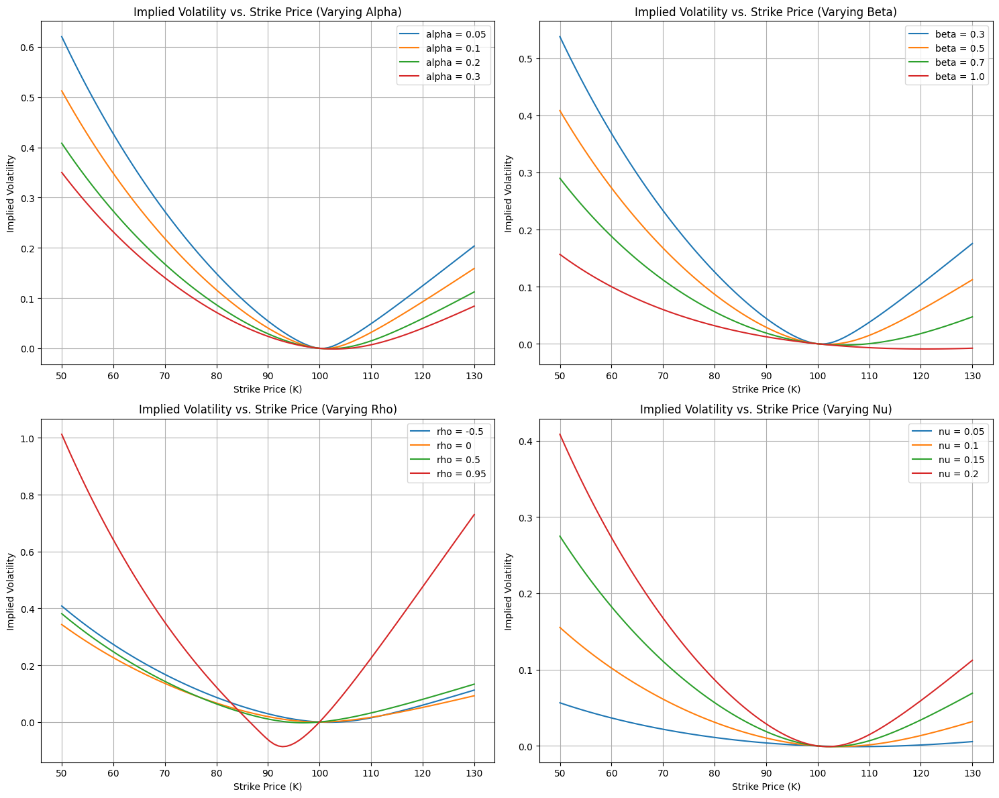

In [2]:
# Function to calculate the SABR implied volatility
def sabr_implied_volatility(alpha, beta, rho, nu, f, K, T):
    zeta = (nu / alpha) * (f * K)**((1 - beta) / 2) * np.log(f / K)
    D_zeta = np.log(np.sqrt(1 - 2 * rho * zeta + zeta**2) + zeta - rho) / np.sqrt(1 - rho**2)
    
    part_1 = (alpha / (f * K)**((1 - beta) / 2)) * (1 + (1 - beta)**2 / 24 * (alpha**2 / (f * K)**(1 - beta)) +
                                                    (rho * beta * nu / 4) * (alpha / (f * K)**((1 - beta) / 2)) +
                                                    (2 - 3 * rho**2) / 24 * (nu**2 / T))
    
    part_2 = (1 + (1 - beta)**2 / 24 * (np.log(f / K) / 2)**2 +
              (1 - beta)**4 / 1920 * (np.log(f / K) / 4)**4)
    
    sigma_impl = part_1 * part_2 * zeta * D_zeta
    return sigma_impl

# Set common parameters for the plots
f = 100  # Forward price
T = 1    # Time to maturity
K_values = np.linspace(50, 130, 100)  # Strike prices from 50 to 130

# Create subplots in a 2x2 grid
fig, axs = plt.subplots(2, 2, figsize=(15, 12))

# Plot 1: Varying alpha (volatility of volatility)
alpha_values = [0.05, 0.1, 0.2, 0.3]
for alpha in alpha_values:
    sigma_vals = [sabr_implied_volatility(alpha, 0.5, -0.5, 0.2, f, K, T) for K in K_values]
    axs[0, 0].plot(K_values, sigma_vals, label=f'alpha = {alpha}')
axs[0, 0].set_title("Implied Volatility vs. Strike Price (Varying Alpha)")
axs[0, 0].set_xlabel("Strike Price (K)")
axs[0, 0].set_ylabel("Implied Volatility")
axs[0, 0].legend()
axs[0, 0].grid(True)

# Plot 2: Varying beta (elasticity parameter)
beta_values = [0.3, 0.5, 0.7, 1.0]
for beta in beta_values:
    sigma_vals = [sabr_implied_volatility(0.2, beta, -0.5, 0.2, f, K, T) for K in K_values]
    axs[0, 1].plot(K_values, sigma_vals, label=f'beta = {beta}')
axs[0, 1].set_title("Implied Volatility vs. Strike Price (Varying Beta)")
axs[0, 1].set_xlabel("Strike Price (K)")
axs[0, 1].set_ylabel("Implied Volatility")
axs[0, 1].legend()
axs[0, 1].grid(True)

# Plot 3: Varying rho (correlation)
rho_values = [-0.5, 0, 0.5, 0.95]
for rho in rho_values:
    sigma_vals = [sabr_implied_volatility(0.2, 0.5, rho, 0.2, f, K, T) for K in K_values]
    axs[1, 0].plot(K_values, sigma_vals, label=f'rho = {rho}')
axs[1, 0].set_title("Implied Volatility vs. Strike Price (Varying Rho)")
axs[1, 0].set_xlabel("Strike Price (K)")
axs[1, 0].set_ylabel("Implied Volatility")
axs[1, 0].legend()
axs[1, 0].grid(True)

# Plot 4: Varying nu (volatility of volatility)
nu_values = [0.05, 0.1, 0.15, 0.2]
for nu in nu_values:
    sigma_vals = [sabr_implied_volatility(0.2, 0.5, -0.5, nu, f, K, T) for K in K_values]
    axs[1, 1].plot(K_values, sigma_vals, label=f'nu = {nu}')
axs[1, 1].set_title("Implied Volatility vs. Strike Price (Varying Nu)")
axs[1, 1].set_xlabel("Strike Price (K)")
axs[1, 1].set_ylabel("Implied Volatility")
axs[1, 1].legend()
axs[1, 1].grid(True)

# Adjust the layout
plt.tight_layout()
plt.show()

# FINITE DIFFERENE METHOD

In [59]:
def black_scholes(S, K, T, r, sigma):
    if T <= 0:  # Avoid division by zero
        return max(0, S - K)
    d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    call_price = S * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2)
    return call_price

In [10]:
def FiniteDifferenceMethodsEI(k, s0, r, q, T, sigma, s_min, s_max, M, N, option_type):
    """
    Approximates the value of a European option using the implicit finite difference method.

    Parameters:
        k (float): Strike price
        s0 (float): Initial stock price
        r (float): Risk-free interest rate
        q (float): Dividend yield
        T (float): Time to maturity
        sigma (float): Volatility
        s_min (float): Minimum stock price considered
        s_max (float): Maximum stock price considered
        M (int): Number of stock price intervals (M+1 points)
        N (int): Number of time intervals (N+1 points)
        option_type (str): 'C' for calls, 'P' for puts

    Returns:
        float: Approximate option value at S0 and T=0
    """
    # Step sizes
    dt = T / N
    dS = (s_max - s_min) / M


    # Coefficients for the tridiagonal matrix
    A = np.zeros(M - 1)
    B = np.zeros(M - 1)
    C = np.zeros(M - 1)

    for j in range(1, M):
        A[j - 1] = 0.5 * (r - q) * j * dt - 0.5 * (sigma**2) * (j**2) * dt
        B[j - 1] = 1 + (sigma**2) * (j**2) * dt + r * dt
        C[j - 1] = -0.5 * (r - q) * j * dt - 0.5 * (sigma**2) * (j**2) * dt

    # Boundary conditions and initial payoff
    D = np.zeros(M - 1)
    if option_type == 'call':  # Call option
        D[0] = max(0, s_min + dS - k)
        D[-1] = max(0, s_max - k) - C[-1] * max(0, s_max - k)
        for j in range(2, M - 1):
            D[j - 1] = max(s_min + j * dS - k, 0)
    elif option_type == 'put':  # Put option
        D[0] = max(k - s_min - dS, 0) - A[0] * k * np.exp(-r * dt)
        D[-1] = 0
        for j in range(2, M - 1):
            D[j - 1] = max(k - (s_min + j * dS), 0)
    else:
        raise ValueError("Invalid option type. Use 'call' or 'put'.")

    # Forward substitution (Thomas algorithm) to initialize Cprime and Dprime
    Cprime = np.zeros_like(C)
    Dprime = np.zeros_like(D)

    Cprime[0] = C[0] / B[0]
    for i in range(1, M - 1):
        Cprime[i] = C[i] / (B[i] - A[i] * Cprime[i - 1])

    Dprime[0] = D[0] / B[0]
    for i in range(1, M - 1):
        Dprime[i] = (D[i] - A[i] * Dprime[i - 1]) / (B[i] - A[i] * Cprime[i - 1])

    # Backward substitution to solve
    solution = np.zeros_like(Dprime)
    solution[-1] = Dprime[-1]
    for i in range(M - 3, -1, -1):
        solution[i] = Dprime[i] - Cprime[i] * solution[i + 1]

    # Initialize solution matrix for N time steps
    price_matrix = np.zeros((M - 1, N + 1))
    price_matrix[:, -1] = solution

    # Time-stepping loop
    for t in range(N - 1, -1, -1):
        for j in range(1, M - 2):
            D[j] = price_matrix[j, t + 1]

        # Update boundary conditions
        if option_type == 'call':
            D[0] = price_matrix[0, t + 1]
            D[-1] = max(0, s_max - k) - C[-1] * max(0, s_max - k)
        else:
            D[0] = price_matrix[0, t + 1] - A[0] * k * np.exp(-r * (T - (T - 1 - t) * dt))
            D[-1] = 0

        # Recompute Dprime for the current time step
        Dprime[0] = D[0] / B[0]
        for i in range(1, M - 1):
            Dprime[i] = (D[i] - A[i] * Dprime[i - 1]) / (B[i] - A[i] * Cprime[i - 1])

        # Solve for F using backward substitution
        solution[-1] = Dprime[-1]
        for i in range(M - 3, -1, -1):
            solution[i] = Dprime[i] - Cprime[i] * solution[i + 1]

        # Store solution for the current time step
        price_matrix[:, t] = solution

    # Interpolation for S0
    for j in range(M):
        grid_point = s_min + j * dS
        if abs(s0 - grid_point) <= 1e-6:  # S0 is a grid point
            return price_matrix[j, 0]
        elif grid_point < s0 < (s_min + (j + 1) * dS):  # S0 lies between grid points
            lower_index = j
            upper_index = j + 1
            lower_value = price_matrix[lower_index, 0]
            upper_value = price_matrix[upper_index, 0]
            # Linear interpolation
            interpolated_value = lower_value + (s0 - grid_point) * (upper_value - lower_value) / dS
            return interpolated_value

    raise ValueError("S0 is not a partition point of the grid. Check the parameters.")

# MONTECARLO SIMULATION

In [15]:
# Monte Carlo method
def monte_carlo_option_pricing(S, K, T, r, sigma, option_type="call", num_simulations=10000000):
    np.random.seed(42)  # For reproducibility
    Z = np.random.standard_normal(num_simulations)
    ST = S * np.exp((r - 0.5 * sigma**2) * T + sigma * np.sqrt(T) * Z)
    
    if option_type == "call":
        payoffs = np.maximum(ST - K, 0)
    elif option_type == "put":
        payoffs = np.maximum(K - ST, 0)
    else:
        raise ValueError("Invalid option type. Use 'call' or 'put'.")
    
    discounted_payoffs = np.exp(-r * T) * payoffs
    option_price = np.mean(discounted_payoffs)
    return option_price

# COMPARISON

In [17]:
# Comparison
results = []

# Load the trained model
model.load_state_dict(torch.load('/kaggle/input/model/pytorch/default/1/mlp_BS.pth', weights_only=True))
model.eval()
model_auto.load_state_dict(torch.load('/kaggle/input/model/pytorch/default/1/autoencoder_OP.pth', weights_only=True))
model_auto.eval()

num_batches = int(0.001 * len(test_loader))  # Compute 20% of total batches
print(num_batches)
for i, (inputs, targets) in enumerate(tqdm(test_loader, desc="Comparison")):
    if i >= num_batches:  
        break  # Stop after processing 20% of test_loader
    inputs, targets = inputs.to(device), targets.to(device)
    
    # Model predictions
    start_time_model = time.time()  # Start time for model prediction
    with torch.no_grad():
        model_predictions = model(inputs).cpu().numpy()
    end_time_model = time.time()  # End time for model prediction
    model_prediction_time = end_time_model - start_time_model  # Time spent on model prediction

    start_time_model_ae = time.time()  # Start time for model prediction
    with torch.no_grad():
        model_predictions_ae = model_auto(inputs).cpu().numpy()
    end_time_model_ae = time.time()  # End time for model prediction
    model_prediction_time_ae = end_time_model_ae - start_time_model_ae  # Time spent on model prediction

    start_time_mc = time.time()  # Start time for Monte Carlo
    inputs_original_scale = scaler.inverse_transform(inputs.cpu().numpy())
    r, sigma, K, T, S = inputs_original_scale[:, 0], inputs_original_scale[:, 1], \
                        inputs_original_scale[:, 2], inputs_original_scale[:, 3], \
                        inputs_original_scale[:, 4]
    T = T/240
    
    # Black-Scholes pricing
    start_time_bs = time.time()
    bs_prices = [black_scholes(s, k, t, ri, sig) for s, k, t, ri, sig in zip(S, K, T, r, sigma)]
    end_time_bs = time.time()
    black_scholes_time = end_time_bs - start_time_bs

    mc_prices = [] 
    monte_carlo_time = []
    # Monte Carlo pricing
    for s, k, t, ri, sig in zip(S, K, T, r, sigma):
        start_time_mc = time.time() 
        mc_prices.append(monte_carlo_option_pricing(s, k, t, ri, sig))
        end_time_mc = time.time()  # End time for Monte Carlo
        monte_carlo_time.append(end_time_mc - start_time_mc)  # Time spent on Monte Carlo


    # Finite Difference Method pricing
    start_time_fdm = time.time()  # Start time for FDM
    fdm_prices = [FiniteDifferenceMethodsEI(k, s0, r_, q_, T_, sigma_, s_min=0, s_max=200, M=1000, N=100, option_type='call') 
                  for k, s0, r_, q_, T_, sigma_ in zip(K, S, r, [0]*len(r), T, sigma)]  # Adjust as per your required parameters
    end_time_fdm = time.time()  # End time for FDM
    fdm_time = end_time_fdm - start_time_fdm  # Time spent on FDM
    
    # Append results for comparison
    for bs_price, mc_price, model_price, model_price_ae, fdm_price, monte_carlo_time_in,true_price in zip(bs_prices, mc_prices, model_predictions,model_predictions_ae, fdm_prices, monte_carlo_time,targets.cpu().numpy()):
        results.append({
            'Black-Scholes': bs_price,
            'Black-Scholes Time': black_scholes_time,
            'Finite Difference Method': fdm_price,
            'Finite Difference Time': fdm_time,
            'Monte Carlo': mc_price,
            'Monte Carlo Time': monte_carlo_time_in,
            'Model Prediction': model_price.item(),
            'Model Prediction Time': model_prediction_time,
            'Model Prediction Auto': model_price_ae.item(),
            'Model Prediction Time Auto': model_prediction_time_ae
        })

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Print the first few rows of results
results_df.head(10)

7


Comparison:   0%|          | 7/7707 [20:16<371:33:25, 173.72s/it]


,Black-Scholes,Black-Scholes Time,Finite Difference Method,Finite Difference Time,Monte Carlo,Monte Carlo Time,Model Prediction,Model Prediction Time,Model Prediction Auto,Model Prediction Time Auto
0,3.832198e-01,0.063775,0.413156,57.067109,3.830613e-01,0.454047,0.391063,0.001348,0.385930,0.000767
1,6.209853e-01,0.063775,0.721902,57.067109,6.209901e-01,0.491076,0.643258,0.001348,0.609976,0.000767
2,9.858089e-07,0.063775,0.000003,57.067109,8.937389e-07,0.440439,0.000503,0.001348,-0.001339,0.000767
3,2.808717e-02,0.063775,0.032987,57.067109,2.802724e-02,0.444233,0.030939,0.001348,0.024859,0.000767
4,1.559567e+01,0.063775,15.794594,57.067109,1.559481e+01,0.456986,15.596500,0.001348,15.594718,0.000767
5,1.729747e-01,0.063775,0.189765,57.067109,1.726802e-01,0.442749,0.181471,0.001348,0.174096,0.000767
6,8.492386e+00,0.063775,8.651714,57.067109,8.492486e+00,0.487140,8.502336,0.001348,8.495568,0.000767
7,8.011262e+00,0.063775,8.154592,57.067109,8.011309e+00,0.490257,8.012037,0.001348,8.008738,0.000767
8,5.856742e+00,0.063775,6.006671,57.067109,5.856884e+00,0.486524,5.856040,0.001348,5.853108,0.000767
9,3.012382e+01,0.063775,30.343844,57.067109,3.012292e+01,0.466705,30.124331,0.001348,30.126604,0.000767


In [18]:
results_df.to_csv("results_BS.csv", index=False)

# ANALYSIS

In [3]:
results_df = pd.read_csv("/kaggle/input/results-bs1/results_BS1.csv")

# Display the first few rows
results_df.head()

,Black-Scholes,Black-Scholes Time,Finite Difference Method,Finite Difference Time,Monte Carlo,Monte Carlo Time,Model Prediction,Model Prediction Time,Model Prediction Auto,Model Prediction Time Auto
0,3.832198e-01,0.063775,0.413156,57.067109,3.830613e-01,0.454047,0.391063,0.001348,0.385930,0.000767
1,6.209853e-01,0.063775,0.721902,57.067109,6.209901e-01,0.491076,0.643258,0.001348,0.609976,0.000767
2,9.858089e-07,0.063775,0.000003,57.067109,8.937389e-07,0.440439,0.000503,0.001348,-0.001339,0.000767
3,2.808717e-02,0.063775,0.032987,57.067109,2.802724e-02,0.444233,0.030939,0.001348,0.024859,0.000767
4,1.559567e+01,0.063775,15.794594,57.067109,1.559481e+01,0.456986,15.596500,0.001348,15.594718,0.000767


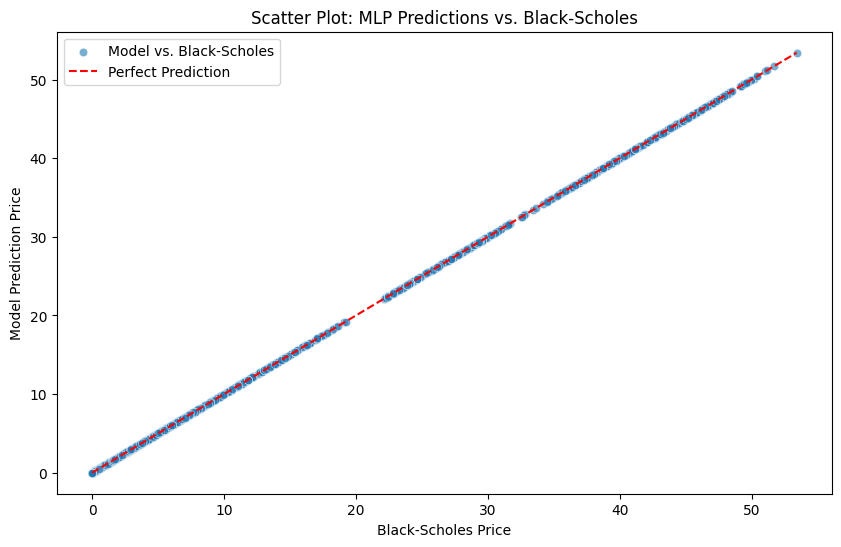

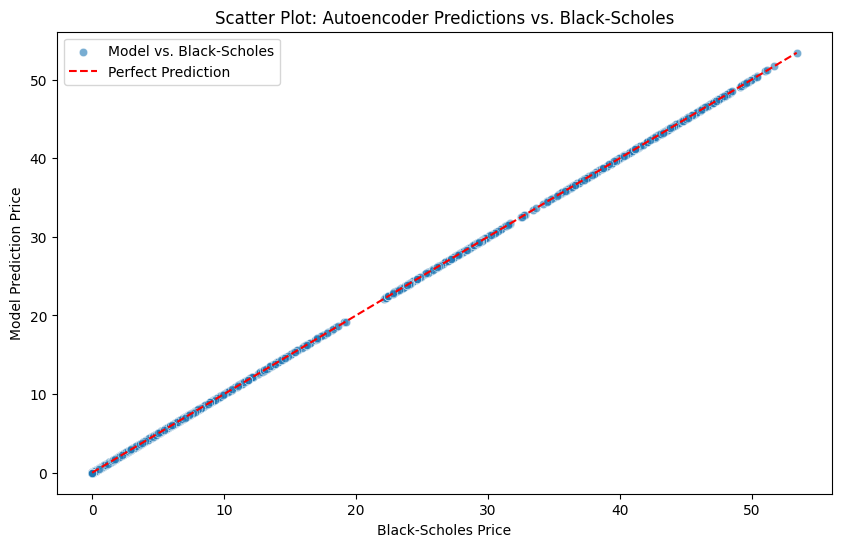

In [5]:
plt.figure(figsize=(10, 6))

# Scatter plot comparing Model Predictions vs. Black-Scholes
sns.scatterplot(x=results_df["Black-Scholes"], y=results_df["Model Prediction"], alpha=0.6, label="Model vs. Black-Scholes")


plt.plot([results_df["Black-Scholes"].min(), results_df["Black-Scholes"].max()],
         [results_df["Black-Scholes"].min(), results_df["Black-Scholes"].max()], 'r--', label="Perfect Prediction")

# Labels and title
plt.xlabel("Black-Scholes Price")
plt.ylabel("Model Prediction Price")
plt.title("Scatter Plot: MLP Predictions vs. Black-Scholes")
plt.legend()
plt.show()


plt.figure(figsize=(10, 6))

# Scatter plot comparing Model Predictions vs. Black-Scholes
sns.scatterplot(x=results_df["Black-Scholes"], y=results_df["Model Prediction Auto"], alpha=0.6, label="Model vs. Black-Scholes")

# 45-degree reference line (ideal case where Model Prediction = Black-Scholes)
plt.plot([results_df["Black-Scholes"].min(), results_df["Black-Scholes"].max()],
         [results_df["Black-Scholes"].min(), results_df["Black-Scholes"].max()], 'r--', label="Perfect Prediction")

# Labels and title
plt.xlabel("Black-Scholes Price")
plt.ylabel("Model Prediction Price")
plt.title("Scatter Plot: Autoencoder Predictions vs. Black-Scholes")
plt.legend()
plt.show()



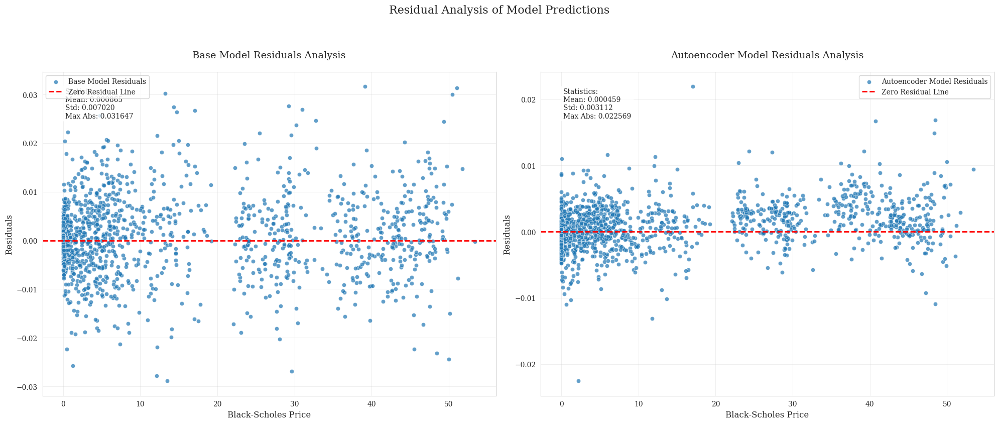

<ipython-input-8-759ba084828b>:113: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color=plt.cm.get_cmap(palette)(np.linspace(0, 1, len(time_stats)))


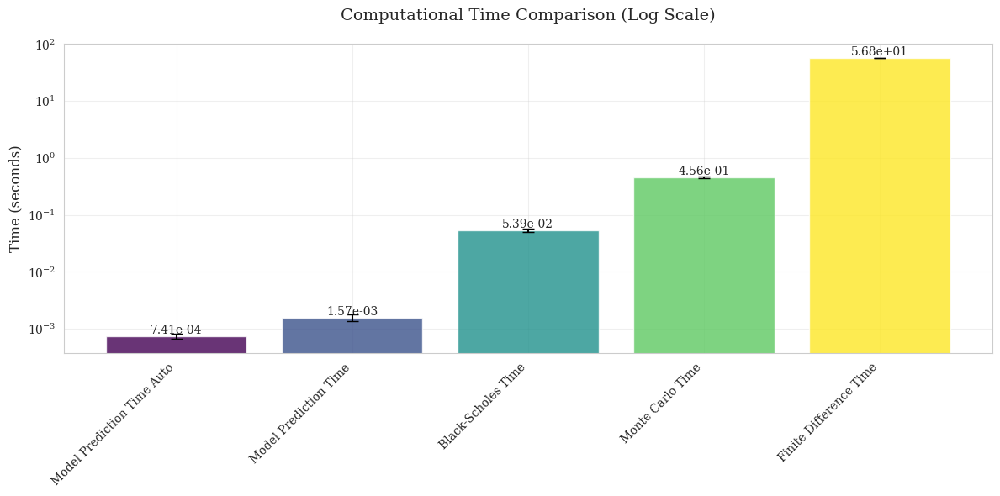

In [8]:
def create_residual_analysis(
    results_df: pd.DataFrame,
    models: dict,
    figsize: tuple = (20, 8),
    style: str = "whitegrid",
    palette: str = "viridis"
) -> None:
    """
    Create enhanced residual analysis plots for multiple models.
    
    Args:
        results_df: DataFrame containing the data
        models: Dictionary of model names and their columns
        figsize: Figure size for plots
        style: Style of the plots
        palette: Color palette for plots
    """
    # Set the style
    sns.set_style(style)
    plt.rcParams['font.family'] = 'serif'
    
    # Calculate residuals
    for model_name, cols in models.items():
        results_df[f"Residuals_{model_name}"] = (
            results_df[cols['predicted']] - results_df[cols['actual']]
        )
    
    # Create subplots for residual analysis
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    fig.suptitle("Residual Analysis of Model Predictions", 
                 fontsize=16, y=1.05)
    
    for idx, (model_name, cols) in enumerate(models.items()):
        # Create scatter plot
        sns.scatterplot(
            data=results_df,
            x=cols['actual'],
            y=f"Residuals_{model_name}",
            alpha=0.7,
            ax=axes[idx],
            label=f"{model_name} Residuals"
        )
        
        # Add zero line
        axes[idx].axhline(0, color='r', linestyle='--', 
                         label="Zero Residual Line", linewidth=2)
        
        # Calculate statistics
        mean_residual = results_df[f"Residuals_{model_name}"].mean()
        std_residual = results_df[f"Residuals_{model_name}"].std()
        max_abs_residual = abs(results_df[f"Residuals_{model_name}"]).max()
        
        # Add statistics text box
        stats_text = (
            f'Statistics:\n'
            f'Mean: {mean_residual:.6f}\n'
            f'Std: {std_residual:.6f}\n'
            f'Max Abs: {max_abs_residual:.6f}'
        )
        
        axes[idx].text(0.05, 0.95, stats_text,
                      transform=axes[idx].transAxes,
                      fontsize=10,
                      verticalalignment='top',
                      bbox=dict(boxstyle='round',
                               facecolor='white',
                               alpha=0.8))
        
        # Customize plot
        axes[idx].set_xlabel(f"{cols['actual']} Price", fontsize=12)
        axes[idx].set_ylabel("Residuals", fontsize=12)
        axes[idx].set_title(f"{model_name} Residuals Analysis", 
                          fontsize=14, pad=20)
        axes[idx].legend(fontsize=10)
        axes[idx].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def plot_computation_times(
    results_df: pd.DataFrame,
    time_columns: list,
    figsize: tuple = (12, 6),
    palette: str = "viridis"
) -> None:
    """
    Create enhanced computation time comparison plot.
    
    Args:
        results_df: DataFrame containing the time data
        time_columns: List of time column names
        figsize: Figure size for plot
        palette: Color palette for plot
    """
    # Calculate statistics
    time_stats = results_df[time_columns].agg(['mean', 'std']).T
    time_stats = time_stats.reset_index()
    time_stats.columns = ['Method', 'Mean Time', 'Std Time']
    
    # Sort by mean time
    time_stats = time_stats.sort_values('Mean Time')
    
    # Create figure
    plt.figure(figsize=figsize)
    
    # Create bar plot
    bars = plt.bar(
        range(len(time_stats)),
        time_stats['Mean Time'],
        yerr=time_stats['Std Time'],
        alpha=0.8,
        capsize=5,
        color=plt.cm.get_cmap(palette)(np.linspace(0, 1, len(time_stats)))
    )
    
    # Customize plot
    plt.yscale('log')
    plt.xticks(
        range(len(time_stats)),
        time_stats['Method'],
        rotation=45,
        ha='right'
    )
    plt.title('Computational Time Comparison (Log Scale)', 
              fontsize=14, pad=20)
    plt.ylabel('Time (seconds)', fontsize=12)
    
    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2.,
            height,
            f'{height:.2e}',
            ha='center',
            va='bottom',
            rotation=0
        )
    
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Usage example
models = {
    'Base Model': {
        'predicted': 'Model Prediction',
        'actual': 'Black-Scholes'
    },
    'Autoencoder Model': {
        'predicted': 'Model Prediction Auto',
        'actual': 'Black-Scholes'
    }
}

time_columns = [
    "Black-Scholes Time",
    "Finite Difference Time",
    "Monte Carlo Time",
    "Model Prediction Time",
    "Model Prediction Time Auto"
]

# Create plots
create_residual_analysis(results_df, models)
plot_computation_times(results_df, time_columns)

In [32]:
# Identify Outliers (Residuals exceeding a threshold)
outlier_threshold = 2 * results_df["Residuals"].std()
outliers = results_df[np.abs(results_df["Residuals"]) > outlier_threshold]
print("Outliers in Model Predictions:")
print(len(outliers))
outliers.head()

Outliers in Model Predictions:
121


,Black-Scholes,Black-Scholes Time,Finite Difference Method,Finite Difference Time,Monte Carlo,Monte Carlo Time,Model Prediction,Model Prediction Time,Model Prediction Auto,Model Prediction Time Auto,Residuals,Residuals_auto
1,0.620985,0.063775,0.721902,57.067109,0.620990,0.491076,0.643258,0.001348,0.609976,0.000767,0.022273,-0.011009
18,3.102052,0.063775,3.189127,57.067109,3.101494,0.464021,3.117975,0.001348,3.103843,0.000767,0.015923,0.001791
29,7.393791,0.063775,7.540815,57.067109,7.393811,0.494837,7.372505,0.001348,7.396359,0.000767,-0.021287,0.002568
32,4.984232,0.063775,5.146896,57.067109,4.984345,0.486826,5.000607,0.001348,4.988714,0.000767,0.016375,0.004482
33,4.375809,0.063775,4.524127,57.067109,4.375924,0.493206,4.357749,0.001348,4.377893,0.000767,-0.018059,0.002084



=== Outlier Analysis ===
Threshold: 2.0 standard deviations


Base Model Outlier Summary:
Total samples: 1,792
Number of outliers: 121
Percentage of outliers: 6.75%
Threshold value: ±0.014039
Maximum absolute residual: 0.031647

Top 5 Outliers by Absolute Residual:
      Residuals_Base Model  Black-Scholes  Model Prediction  Model Prediction Auto
721               0.031647      39.144962         39.176609              39.152184
1288              0.031309      51.045446         51.076756              51.041710
862               0.030248      13.241549         13.271797              13.239132
252               0.030053      50.443629         50.473682              50.450756
1636             -0.028897      13.513048         13.484151              13.512879



Autoencoder Model Outlier Summary:
Total samples: 1,792
Number of outliers: 97
Percentage of outliers: 5.41%
Threshold value: ±0.006225
Maximum absolute residual: 0.022569

Top 5 Outliers by Absolute Residual:
      Residuals_Autoen

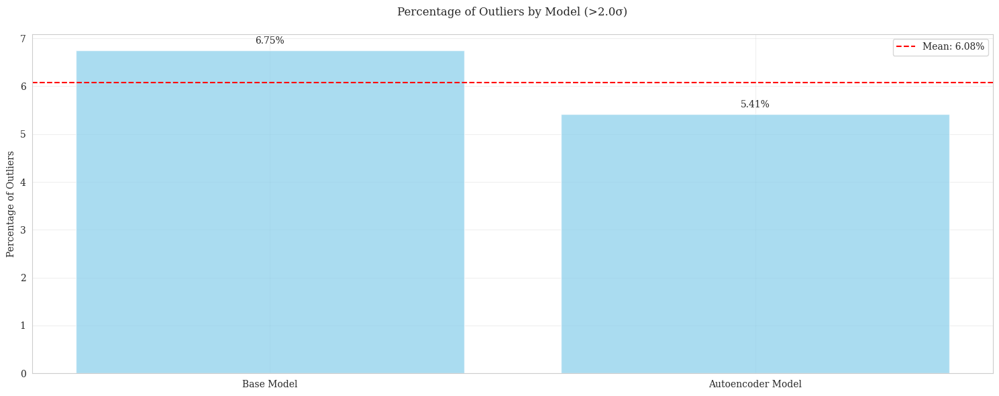

In [13]:
def analyze_outliers(
    results_df: pd.DataFrame,
    models: dict,
    n_std: float = 2.0,
    display_cols: list = None
) -> None:
    """
    Analyze outliers in model residuals with detailed statistics and visualization.
    
    Args:
        results_df: DataFrame containing the residuals
        models: Dictionary of model names and their columns
        n_std: Number of standard deviations for outlier threshold
        display_cols: List of additional columns to display in outlier summary
    """
    print("\n=== Outlier Analysis ===")
    print(f"Threshold: {n_std} standard deviations\n")
    
    outlier_stats = {}
    
    for model_name, cols in models.items():
        residual_col = f"Residuals_{model_name}"
        
        # Calculate threshold
        std_dev = results_df[residual_col].std()
        threshold = n_std * std_dev
        
        # Identify outliers
        outliers = results_df[np.abs(results_df[residual_col]) > threshold].copy()
        
        # Calculate statistics
        total_samples = len(results_df)
        n_outliers = len(outliers)
        outlier_percentage = (n_outliers / total_samples) * 100
        
        # Store statistics
        outlier_stats[model_name] = {
            'n_outliers': n_outliers,
            'percentage': outlier_percentage,
            'threshold': threshold,
            'max_residual': outliers[residual_col].abs().max() if n_outliers > 0 else 0,
            'outliers_df': outliers
        }
        
        # Print summary
        print(f"\n{model_name} Outlier Summary:")
        print(f"{'='*40}")
        print(f"Total samples: {total_samples:,}")
        print(f"Number of outliers: {n_outliers:,}")
        print(f"Percentage of outliers: {outlier_percentage:.2f}%")
        print(f"Threshold value: ±{threshold:.6f}")
        if n_outliers > 0:
            print(f"Maximum absolute residual: {outlier_stats[model_name]['max_residual']:.6f}")
        
        # Display outlier examples if they exist
        if n_outliers > 0:
            print("\nTop 5 Outliers by Absolute Residual:")
            
            # Select columns to display
            display_columns = [residual_col]
            if display_cols:
                display_columns.extend(display_cols)
            
            # Sort outliers by absolute residual value
            sorted_outliers = outliers.copy()
            sorted_outliers['Abs_Residual'] = sorted_outliers[residual_col].abs()
            sorted_outliers = sorted_outliers.sort_values('Abs_Residual', ascending=False)
            
            # Display formatted outliers
            pd.set_option('display.float_format', lambda x: '%.6f' % x)
            print(sorted_outliers[display_columns].head().to_string())
            print("\n")
    
    # Create visualization of outlier distribution
    plt.figure(figsize=(15, 6))
    
    # Create bar plot of outlier percentages
    percentages = [stats['percentage'] for stats in outlier_stats.values()]
    plt.bar(outlier_stats.keys(), percentages, color='skyblue', alpha=0.7)
    
    # Add value labels on bars
    for i, v in enumerate(percentages):
        plt.text(i, v + 0.1, f'{v:.2f}%', ha='center', va='bottom')
    
    plt.title(f'Percentage of Outliers by Model (>{n_std}σ)', pad=20)
    plt.ylabel('Percentage of Outliers')
    plt.grid(True, alpha=0.3)
    
    # Add horizontal line at mean percentage
    mean_percentage = np.mean(percentages)
    plt.axhline(y=mean_percentage, color='r', linestyle='--', 
                label=f'Mean: {mean_percentage:.2f}%')
    plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    return outlier_stats

# Usage example
models = {
    'Base Model': {
        'predicted': 'Model Prediction',
        'actual': 'Black-Scholes'
    },
    'Autoencoder Model': {
        'predicted': 'Model Prediction Auto',
        'actual': 'Black-Scholes'
    }
}

# Additional columns to display in outlier summary
display_cols = ['Black-Scholes', 'Model Prediction', 'Model Prediction Auto']

# Analyze outliers
outlier_stats = analyze_outliers(
    results_df,
    models,
    n_std=2.0,
    display_cols=display_cols
)

# Access outlier information for specific model if needed
autoencoder_outliers = outlier_stats['Autoencoder Model']['outliers_df']

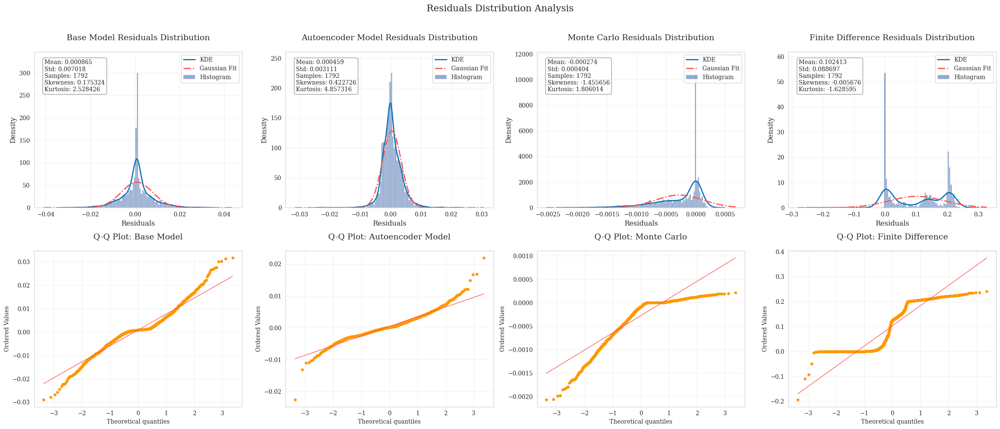

In [26]:
from scipy import stats
from scipy.stats import norm

def analyze_residuals_distribution(
    results_df: pd.DataFrame,
    models: dict,
    figsize: tuple = (24, 10),
    style: str = "whitegrid",
    colors: dict = {
        "hist": "#4C72B0",
        "kde": "#0C72B0",
        "gaussian": "#FF5252",
        "qq_points": "#FFD700",  # Yellow color for Q-Q points
        "qq_line": "#FF5252"     # Same color as gaussian for the line
    }
) -> None:
    """
    Create enhanced residuals distribution analysis for multiple models with Q-Q plots.
    """
    # Suppress the specific warning
    import warnings
    warnings.filterwarnings("ignore", category=FutureWarning)
    
    # Set the style
    sns.set_style(style)
    plt.rcParams['font.family'] = 'serif'
    
    # Calculate number of columns needed (one for each model)
    n_models = len(models)
    
    # Create subplots with 2 rows and enough columns for all models
    fig, axes = plt.subplots(2, n_models, figsize=figsize)
    fig.suptitle("Residuals Distribution Analysis", 
                 fontsize=16, y=1.02)
    
    # Calculate residuals if not already calculated
    for model_name, cols in models.items():
        if f"Residuals_{model_name}" not in results_df.columns:
            results_df[f"Residuals_{model_name}"] = (
                results_df[cols['predicted']] - results_df[cols['actual']]
            )
    
    for idx, (model_name, _) in enumerate(models.items()):
        residuals = results_df[f"Residuals_{model_name}"].dropna()
        
        # Calculate statistics
        mean_residual = np.mean(residuals)
        std_residual = np.std(residuals)
        
        # Create x values for Gaussian curve
        xmin, xmax = residuals.min(), residuals.max()
        range_extension = 0.2 * (xmax - xmin)
        x = np.linspace(xmin - range_extension, xmax + range_extension, 300)
        p = norm.pdf(x, mean_residual, std_residual)
        
        # Histogram and KDE (top row)
        sns.histplot(
            residuals,
            stat="density",
            color=colors["hist"],
            alpha=0.6,
            bins=100,
            ax=axes[0, idx],
            label="Histogram"
        )
        
        sns.kdeplot(
            residuals,
            color=colors["kde"],
            linewidth=2,
            label="KDE",
            ax=axes[0, idx]
        )
        
        axes[0, idx].plot(
            x, p,
            color=colors["gaussian"],
            label="Gaussian Fit",
            linewidth=2,
            linestyle='-.'
        )
        
        # Add statistics text box
        stats_text = (
            f'Mean: {mean_residual:.6f}\n'
            f'Std: {std_residual:.6f}\n'
            f'Samples: {len(residuals)}\n'
            f'Skewness: {stats.skew(residuals):.6f}\n'
            f'Kurtosis: {stats.kurtosis(residuals):.6f}'
        )
        
        axes[0, idx].text(
            0.05, 0.95,
            stats_text,
            transform=axes[0, idx].transAxes,
            fontsize=10,
            verticalalignment='top',
            horizontalalignment='left',
            bbox=dict(
                boxstyle='round',
                facecolor='white',
                alpha=0.8,
                edgecolor='gray'
            )
        )
        
        # Customize histogram plot
        axes[0, idx].set_title(f"{model_name} Residuals Distribution",
                             fontsize=14, pad=20)
        axes[0, idx].set_xlabel("Residuals", fontsize=12)
        axes[0, idx].set_ylabel("Density", fontsize=12)
        axes[0, idx].legend(fontsize=10, loc='upper right')
        axes[0, idx].grid(True, alpha=0.3)
        
        # Set reasonable y-limit for histogram
        density_max = max(np.max(p), axes[0, idx].get_ylim()[1])
        axes[0, idx].set_ylim(0, density_max * 1.1)
        
        # Q-Q Plot (bottom row)
        stats.probplot(residuals, dist="norm", plot=axes[1, idx])
        
        # Customize Q-Q plot
        axes[1, idx].get_lines()[0].set_markerfacecolor(colors["qq_points"])
        axes[1, idx].get_lines()[0].set_markeredgecolor(colors["qq_points"])
        axes[1, idx].get_lines()[0].set_markersize(4)  # Make points smaller
        axes[1, idx].get_lines()[1].set_color(colors["qq_line"])
        axes[1, idx].get_lines()[1].set_linewidth(1)  # Make line thinner
        
        axes[1, idx].set_title(f"Q-Q Plot: {model_name}", fontsize=14, pad=20)
        axes[1, idx].grid(True, alpha=0.3)
        
    plt.tight_layout()
    plt.show()

# Usage example with all models
models = {
    'Base Model': {
        'predicted': 'Model Prediction',
        'actual': 'Black-Scholes'
    },
    'Autoencoder Model': {
        'predicted': 'Model Prediction Auto',
        'actual': 'Black-Scholes'
    },
    'Monte Carlo': {
        'predicted': 'Monte Carlo',
        'actual': 'Black-Scholes'
    },
    'Finite Difference': {
        'predicted': 'Finite Difference Method',
        'actual': 'Black-Scholes'
    }
}

# Custom colors with added Q-Q plot colors
colors = {
    "hist": "#4C72B0",
    "kde": "#0C72B0",
    "gaussian": "#FF5252",
    "qq_points": "#FF9800",  # Yellow color for Q-Q points
    "qq_line": "#FF5252"     # Same color as gaussian for the line
}

# Create distribution analysis
analyze_residuals_distribution(
    results_df,
    models,
    figsize=(24, 10),
    colors=colors
)


=== Error Metrics Summary ===

All values compared against Black-Scholes prices:

                           MSE         RMSE          MAE          MAPE           R2  Max Abs Error    Mean Error    Std Error
Base Model        0.0000499948 0.0070706986 0.0047661017           inf 0.9999997974   0.0316467285  0.0008651930 0.0070175651
Autoencoder Model 0.0000098917 0.0031451149 0.0022208937           inf 0.9999999599   0.0225690432  0.0004587014 0.0031114853
Monte Carlo       0.0000002381 0.0004879566 0.0003009144 12.2384383446 0.9999999990   0.0020693539 -0.0002743814 0.0004035053
Finite Difference 0.0183556012 0.1354828445 0.1029292259           inf 0.9999256008   0.2406089361  0.1024131750 0.0886969151

Best Model per Metric:
----------------------
MSE: Monte Carlo (0.0000002381)
RMSE: Monte Carlo (0.0004879566)
MAE: Monte Carlo (0.0003009144)
MAPE: Monte Carlo (12.2384383446)
Max Abs Error: Monte Carlo (0.0020693539)
Mean Error: Monte Carlo (-0.0002743814)
Std Error: Monte Carlo (0.0

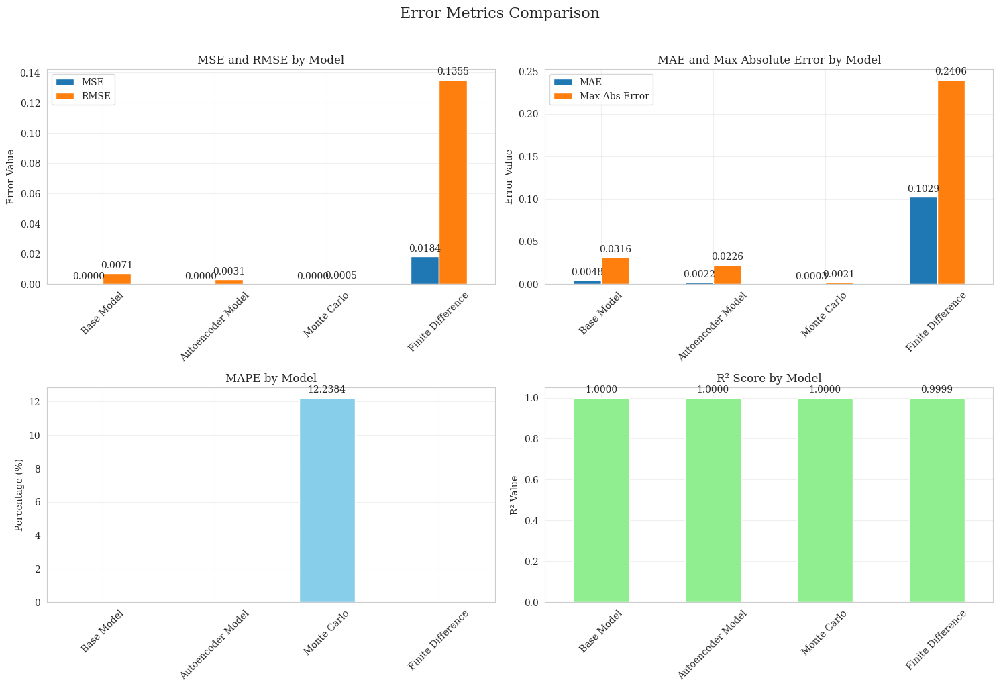

In [28]:
def calculate_error_metrics(
    results_df: pd.DataFrame,
    models: dict,
    baseline: str = 'Black-Scholes'
) -> pd.DataFrame:
    """
    Calculate comprehensive error metrics for all models compared to baseline.
    
    Args:
        results_df: DataFrame containing all price predictions
        models: Dictionary of model names and their columns
        baseline: Name of the baseline column to compare against
    
    Returns:
        DataFrame containing error metrics for each model
    """
    metrics = {}
    
    for model_name, cols in models.items():
        predicted = results_df[cols['predicted']]
        actual = results_df[baseline]
        
        # Calculate errors
        errors = predicted - actual
        abs_errors = np.abs(errors)
        
        # Calculate various error metrics
        metrics[model_name] = {
            'MSE': mean_squared_error(actual, predicted),
            'RMSE': np.sqrt(mean_squared_error(actual, predicted)),
            'MAE': mean_absolute_error(actual, predicted),
            'MAPE': np.mean(np.abs((actual - predicted) / actual)) * 100,
            'R2': r2_score(actual, predicted),
            'Max Abs Error': np.max(abs_errors),
            'Mean Error': np.mean(errors),
            'Std Error': np.std(errors)
        }
    
    # Convert to DataFrame
    metrics_df = pd.DataFrame.from_dict(metrics, orient='index')
    
    return metrics_df

def plot_error_metrics(metrics_df: pd.DataFrame, figsize: tuple = (15, 10)):
    """
    Create visualizations for error metrics comparison.
    
    Args:
        metrics_df: DataFrame containing error metrics for each model
        figsize: Figure size for plots
    """
    # Create figure with subplots
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    fig.suptitle('Error Metrics Comparison', fontsize=16, y=1.02)
    
    # Plot MSE and RMSE
    metrics_df[['MSE', 'RMSE']].plot(kind='bar', ax=axes[0,0], rot=45)
    axes[0,0].set_title('MSE and RMSE by Model')
    axes[0,0].set_ylabel('Error Value')
    axes[0,0].grid(True, alpha=0.3)
    
    # Plot MAE and Max Abs Error
    metrics_df[['MAE', 'Max Abs Error']].plot(kind='bar', ax=axes[0,1], rot=45)
    axes[0,1].set_title('MAE and Max Absolute Error by Model')
    axes[0,1].set_ylabel('Error Value')
    axes[0,1].grid(True, alpha=0.3)
    
    # Plot MAPE
    metrics_df['MAPE'].plot(kind='bar', ax=axes[1,0], rot=45, color='skyblue')
    axes[1,0].set_title('MAPE by Model')
    axes[1,0].set_ylabel('Percentage (%)')
    axes[1,0].grid(True, alpha=0.3)
    
    # Plot R2 Score
    metrics_df['R2'].plot(kind='bar', ax=axes[1,1], rot=45, color='lightgreen')
    axes[1,1].set_title('R² Score by Model')
    axes[1,1].set_ylabel('R² Value')
    axes[1,1].grid(True, alpha=0.3)
    
    # Add value labels on bars for all subplots
    for ax in axes.flat:
        for container in ax.containers:
            ax.bar_label(container, fmt='%.4f', padding=3)
    
    plt.tight_layout()
    plt.show()

def print_metrics_summary(metrics_df: pd.DataFrame):
    """
    Print a formatted summary of error metrics.
    
    Args:
        metrics_df: DataFrame containing error metrics for each model
    """
    print("\n=== Error Metrics Summary ===")
    print("\nAll values compared against Black-Scholes prices:\n")
    
    # Format DataFrame for display
    pd.set_option('display.float_format', lambda x: '{:.10f}'.format(x))
    print(metrics_df.to_string())
    
    # Find best model for each metric
    print("\nBest Model per Metric:")
    print("----------------------")
    
    metrics_to_minimize = ['MSE', 'RMSE', 'MAE', 'MAPE', 'Max Abs Error', 'Mean Error', 'Std Error']
    metrics_to_maximize = ['R2']
    
    for metric in metrics_to_minimize:
        best_model = metrics_df[metric].idxmin()
        best_value = metrics_df[metric].min()
        print(f"{metric}: {best_model} ({best_value:.10f})")
    
    for metric in metrics_to_maximize:
        best_model = metrics_df[metric].idxmax()
        best_value = metrics_df[metric].max()
        print(f"{metric}: {best_model} ({best_value:.10f})")

# Usage example
models = {
    'Base Model': {
        'predicted': 'Model Prediction',
        'actual': 'Black-Scholes'
    },
    'Autoencoder Model': {
        'predicted': 'Model Prediction Auto',
        'actual': 'Black-Scholes'
    },
    'Monte Carlo': {
        'predicted': 'Monte Carlo',
        'actual': 'Black-Scholes'
    },
    'Finite Difference': {
        'predicted': 'Finite Difference Method',
        'actual': 'Black-Scholes'
    }
}

# Calculate metrics
metrics_df = calculate_error_metrics(results_df, models)

# Print detailed summary
print_metrics_summary(metrics_df)

# Create visualizations
plot_error_metrics(metrics_df)

# COMPARISON SABR PRICES

In [10]:
def sabr_monte_carlo(F0, T, K, alpha, beta, rho, nu, r, N_paths, N_steps):
    """
    SABR Monte Carlo simulation for option pricing.

    Parameters:
    - F0: Initial forward price
    - T: Time to maturity
    - alpha: Initial volatility (sigma_0)
    - beta: Elasticity parameter
    - rho: Correlation between forward and volatility
    - nu: Volatility of volatility
    - r: Risk-free rate
    - n_paths: Number of Monte Carlo paths
    - n_steps: Number of time steps for the simulation

    Returns:
    - Simulated forward prices (2D array: n_paths x n_steps + 1)
    - Simulated volatilities (2D array: n_paths x n_steps + 1)
    """
    dt = 1 / N_steps  # Time step size
    
    # Initialize forward prices and volatilities
    S = np.full((N_paths, int(T * N_steps + 1)), F0)  # Forward prices (n_paths x n_steps + 1)
    sigma = np.full((N_paths, int(T * N_steps + 1)), alpha)  # Volatilities (n_paths x n_steps + 1)
    
    # Correlation matrix and Cholesky decomposition
    corr_matrix = np.array([[1, rho], [rho, 1]])
    L = np.linalg.cholesky(corr_matrix)  # Cholesky decomposition
    
    # Time stepping
    for step in range(int(T * N_steps)):
        # Generate independent standard normal random variables
        Z = np.random.normal(0, 1, size=(2, N_paths))  # Shape (2, n_paths)
        
        # Correlate the random variables using the Cholesky decomposition
        correlated_Z = L @ Z  # Shape (2, n_paths)
        dW = np.sqrt(dt) * correlated_Z[0]  # Correlated Brownian motion for dW_t
        dZ = np.sqrt(dt) * correlated_Z[1]  # Correlated Brownian motion for dZ_t
        
        # Update volatility process
        sigma[:, step + 1] = sigma[:, step] * np.exp(nu * dZ - 0.5 * nu**2 * dt)
        
        # Update forward price process
        S[:, step + 1] = S[:, step] + sigma[:, step] * (S[:, step] ** beta) * dW
    
    payoff = np.maximum(S[:, -1] - K, 0)
    return np.exp(-r * T) * np.mean(payoff)

In [11]:
def sabr_approx_arbitrage_free_option_price(f, K, T, t, a, beta):
    """
    Approximate SABR arbitrage-free European option price.

    Parameters:
        f : float
            Forward price
        K : float
            Strike price
        T : float
            Maturity time
        t : float
            Current time
        a : float
            Volatility (initial volatility a0)
        beta : float
            Elasticity parameter in SABR model
        option_type : str
            'call' or 'put'
    Returns:
        price : float
            Option price
    """
    tau = T - t
    if tau <= 0:
        raise ValueError("Maturity must be greater than current time.")

    factor = (1 - beta)
    if factor == 0:
        raise ValueError("Beta cannot be 1 for this approximation.")

    x = (f ** (2 * factor)) / (factor ** 2 * a**2 * tau)
    y = (K ** (2 * factor)) / (factor ** 2 * a**2 * tau)

    # degrees of freedom for the non-central chi-square distributions
    df1 = 1 / factor
    df2 = (3 - 2 * beta) / factor

    # CDF evaluations
    Q1 = ncx2.cdf(x, df1, y)  # Q(x; df1, y)
    Q2 = ncx2.cdf(y, df2, x)  # Q(y; df2, x)
    
    price = f * (1 - Q2) - K * Q1
    
    return price

In [15]:
results_sabr = []

# Load the trained model
model_sabr.load_state_dict(torch.load('/kaggle/input/model/pytorch/default/1/mlp_SABR_price.pth', map_location=torch.device('cpu'), weights_only=True))
model_sabr.eval()

num_batches_sabr = int(0.005 * len(test_loader_sabr))  # Compute 0.5% of total batches
print(f"Number of batches to process: {num_batches_sabr}")

for i, (inputs, targets) in enumerate(tqdm(test_loader_sabr, desc="Comparison")):
    if i >= num_batches_sabr:
        break

    inputs, targets = inputs.to(device), targets.to(device)

    # Inference with model
    start_time_model_sabr = time.time()
    with torch.no_grad():
        model_predictions_sabr = model_sabr(inputs).cpu().numpy().flatten()
    end_time_model_sabr = time.time()
    total_batch_model_time = end_time_model_sabr - start_time_model_sabr

    inputs_original_scale = scaler_sabr.inverse_transform(inputs.cpu().numpy())

    # Unpack features
    F0 = inputs_original_scale[:, 0]
    alpha = inputs_original_scale[:, 1]
    rho = inputs_original_scale[:, 2]
    nu = inputs_original_scale[:, 3]
    r = inputs_original_scale[:, 4]
    T = inputs_original_scale[:, 5]
    K = inputs_original_scale[:, 6]

    batch_size = F0.shape[0]
    model_prediction_time_per_point = total_batch_model_time / batch_size

    t = 0.0
    beta = 0.99

    for idx in range(batch_size):
        f0_i = F0[idx]
        alpha_i = alpha[idx]
        rho_i = rho[idx]
        nu_i = nu[idx]
        r_i = r[idx]
        T_i = T[idx]
        K_i = K[idx]
        model_pred_i = model_predictions_sabr[idx]
        true_price_i = targets[idx].cpu().item()

        # --- SABR Approximate Price ---
        start_time_sabr = time.time()
        sabr_formula_price_i = sabr_approx_arbitrage_free_option_price(
            f0_i, K_i, T_i, t, alpha_i, beta
        )
        end_time_sabr = time.time()
        sabr_formula_time_i = end_time_sabr - start_time_sabr

        #Black-Scholes Price
        S0_i = f0_i / np.exp(r_i * T_i)  # Recover spot from forward
        start_time_bs = time.time()
        bs_price_i = black_scholes(S0_i, K_i, t, r_i, alpha_i)
        end_time_bs = time.time()
        bs_time_i = end_time_bs - start_time_bs

        #Monte Carlo SABR Price
        start_time_mc = time.time()
        mc_price_i = sabr_monte_carlo(f0_i, T_i, K_i, alpha_i, 1, rho_i, nu_i, r_i, 20000, 252)
        end_time_mc = time.time()
        mc_time_i = end_time_mc - start_time_mc

        #Store all results for this single input
        results_sabr.append({
            'F0': f0_i,
            'alpha': alpha_i,
            'rho': rho_i,
            'nu': nu_i,
            'r': r_i,
            'T': T_i,
            'K': K_i,
            'True SABR Price': true_price_i,
            'Model Prediction': model_pred_i,
            'Model Prediction Time': model_prediction_time_per_point,
            'SABR Approximate Formula Price': sabr_formula_price_i,
            'SABR Approximate Formula Time': sabr_formula_time_i,
            'Black-Scholes Price': bs_price_i,
            'Black-Scholes Time': bs_time_i,
            'Monte Carlo Price': mc_price_i,
            'Monte Carlo Time': mc_time_i
        })

# After all batches
results_df_sabr_price = pd.DataFrame(results_sabr)

# Print the first few rows
print(results_df_sabr_price.head(10))

Number of batches to process: 7


Comparison:   0%|          | 7/1524 [23:06<83:26:22, 198.01s/it]

           F0     alpha       rho        nu         r    T           K  \
0  114.754822  0.207087 -0.265518  0.263841  0.034436  1.7  100.000000   
1  100.704369  0.221442 -0.014803  0.226710  0.014821  2.0   80.000000   
2  134.635864  0.138166 -0.675418  0.223372  0.024243  2.0  100.000000   
3  119.381012  0.236436 -0.632521  0.110894  0.020490  1.7  120.000008   
4  101.667419  0.209870 -0.417774  0.148394  0.030003  1.1  100.000000   
5  131.563538  0.277352 -0.326573  0.226938  0.014826  2.0   75.000000   
6  116.104652  0.271402  0.445225  0.117252  0.040082  1.4   75.000000   
7   94.291786  0.154317  0.097378  0.209652  0.034549  2.0  115.000000   
8   82.000793  0.210735  0.445363  0.052606  0.037296  0.2  104.999992   
9   90.028915  0.168200 -0.309452  0.131638  0.022108  0.8   95.000000   

   True SABR Price  Model Prediction  Model Prediction Time  \
0        19.462418         19.450693               0.000007   
1        24.074795         23.912951               0.000007

In [16]:
results_df_sabr_price.to_csv("/kaggle/working/results_SABR_price_new.csv", index=False)

In [61]:
# Comparison
results_sabr = []

# Load the trained model
model_sabr.load_state_dict(torch.load('/kaggle/input/model/pytorch/default/1/mlp_SABR_price.pth', map_location=torch.device('cpu'),weights_only=True))
model_sabr.eval()

num_batches_sabr = int(0.005 * len(test_loader_sabr))  # Compute 20% of total batches
print(num_batches_sabr)
model_prediction_time_sabr = []
for i, (inputs, targets) in enumerate(tqdm(test_loader_sabr, desc="Comparison")):
    if i >= num_batches_sabr:  
        break  # Stop after processing 20% of test_loader
    inputs, targets = inputs.to(device), targets.to(device)

    start_time_model_sabr = time.time()  # Start time for model prediction
    with torch.no_grad():
        model_predictions_sabr = model_sabr(inputs).cpu().numpy()
    end_time_model_sabr = time.time()  # End time for model prediction
    model_prediction_time_sabr = end_time_model_sabr - start_time_model_sabr  # Time spent on model prediction
    inputs_original_scale = scaler_sabr.inverse_transform(inputs.cpu().numpy())


    F0 = inputs_original_scale[:, 0]
    alpha = inputs_original_scale[:, 1]
    rho = inputs_original_scale[:, 2]
    nu = inputs_original_scale[:, 3]
    r = inputs_original_scale[:, 4]
    T = inputs_original_scale[:, 5] # Convert days to years
    K = inputs_original_scale[:, 6]
    t = 0.0       # Current time
    beta = 1    # SABR beta parameter
    
    start_time_sabr_op = time.time()
    # Call option price
    call_price_sabr = sabr_approx_arbitrage_free_option_price(F0, K, T, t, alpha, beta, option_type="call")
    print(f"Approximate Call Price: {call_price:.6f}")
    end_time_sabr_op = time.time()
    sabr_op_time = end_time_sabr_op - start_time_sabr_op

    
    # Black-Scholes pricing
    black_scholes_time = []
    S0 = F0 / np.exp(r * T)
    start_time_bs = time.time()
    bs_prices = [black_scholes(s, k, t, ri, sig) for s, k, t, ri, sig in zip(S0, K, T, r, alpha)]
    end_time_bs = time.time()
    black_scholes_time = end_time_bs - start_time_bs
    individual_mc_times = []
    
    # Loop through the parameter sets and calculate the time for each
    mc_prices = []
    for f, k, ri, ni, rho1, alpha1, t in zip(F0, K, r, nu, rho, alpha, T):
        start_time_individual = time.time()  # Start time for individual Monte Carlo calculation
        price = sabr_monte_carlo(f, t, k, alpha1, 1, rho1, ni, ri, 20000, 252)
        mc_prices.append(price)
        end_time_individual = time.time()  # End time for individual Monte Carlo
        individual_mc_times.append(end_time_individual - start_time_individual)  # Calculate and store the time
    
    # Append results for comparison
    for bs_price, mc_price, model_price,mc_times, true_price in zip(bs_prices, mc_prices, model_predictions_sabr, individual_mc_times,targets.cpu().numpy()):
        results_sabr.append({
            'SABR price' : true_price,
            'Black-Scholes': bs_price,
            'Black-Scholes Time': black_scholes_time,
            'Monte Carlo': mc_price,
            'Monte Carlo Time': mc_times,
            'Model Prediction': model_price.item(),
            'Model Prediction Time':  model_prediction_time_sabr,
            'SABR approximate formula':
        })

# Convert results to a DataFrame
results_df_sabr_price = pd.DataFrame(results_sabr)

# Print the first few rows of results
results_df_sabr_price.head(10)

7


Comparison:   0%|          | 7/1524 [20:41<74:42:31, 177.29s/it]


,SABR price,Black-Scholes,Black-Scholes Time,Monte Carlo,Monte Carlo Time,Model Prediction,Model Prediction Time
0,19.462418,19.205591,0.055904,19.348248,1.002867,19.450693,0.001764
1,24.074795,23.747212,0.055904,23.941437,1.189309,23.912951,0.001764
2,34.288372,33.596353,0.055904,34.091248,1.180341,34.125568,0.001764
3,13.657797,13.863095,0.055904,13.898544,1.044520,13.796000,0.001764
4,9.409995,9.380420,0.055904,9.405879,0.630177,9.387616,0.001764
5,56.844975,56.183091,0.055904,56.736927,1.216823,56.698181,0.001764
6,40.085766,39.983135,0.055904,39.703228,0.828063,39.828289,0.001764
7,2.238739,2.084588,0.055904,2.218831,1.205988,2.275958,0.001764
8,0.012940,0.011783,0.055904,0.015525,0.124124,0.013618,0.001764
9,3.280040,3.351462,0.055904,3.285645,0.466642,3.345282,0.001764


In [62]:
results_df_sabr_price.to_csv("/kaggle/working/results_SABR_price.csv", index=False)

In [2]:
results_df_sabr_price = pd.read_csv("/kaggle/input/sabr-price-tot/results_SABR_price_new.csv")

# Display the first few rows
results_df_sabr_price.head()

,F0,alpha,rho,nu,r,T,K,True SABR Price,Model Prediction,Model Prediction Time,SABR Approximate Formula Price,SABR Approximate Formula Time,Black-Scholes Price,Black-Scholes Time,Monte Carlo Price,Monte Carlo Time
0,114.75482,0.207087,-0.265518,0.263841,0.034436,1.7,100.00000,19.462418,19.450693,0.000007,19.907588,0.001115,8.229813,0.000022,19.799885,1.249350
1,100.70437,0.221442,-0.014803,0.226710,0.014821,2.0,80.00000,24.074795,23.912950,0.000007,24.094198,0.000778,17.763191,0.000009,23.879623,1.513613
2,134.63586,0.138166,-0.675418,0.223372,0.024243,2.0,100.00000,34.288372,34.125570,0.000007,35.141306,0.000792,28.263641,0.000009,34.063300,1.335898
3,119.38101,0.236436,-0.632521,0.110894,0.020490,1.7,120.00001,13.657797,13.796000,0.000007,13.674602,0.000752,0.000000,0.000017,13.971826,1.125740
4,101.66742,0.209870,-0.417774,0.148394,0.030003,1.1,100.00000,9.409995,9.387616,0.000007,9.299452,0.000811,0.000000,0.000009,9.273852,0.709998


# ANALYSIS SABR

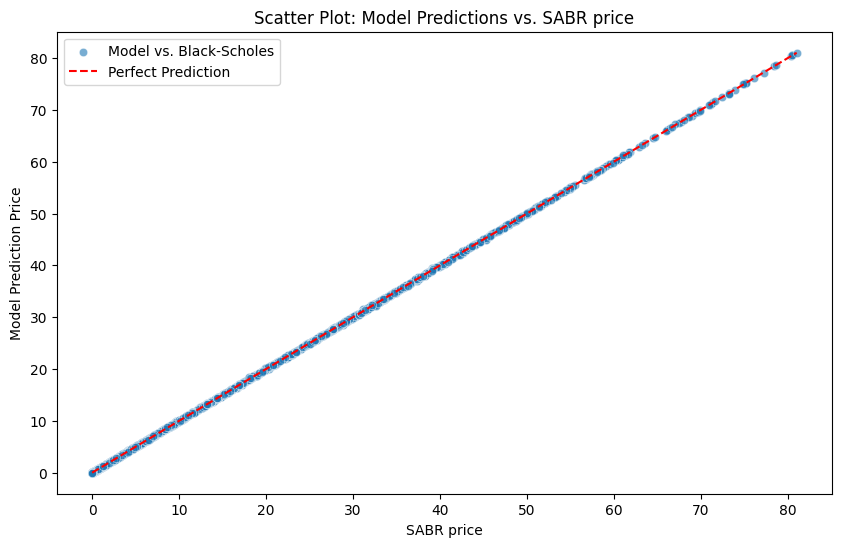

In [3]:
plt.figure(figsize=(10, 6))

# Scatter plot comparing Model Predictions vs. Black-Scholes for results_df_sabr_price
sns.scatterplot(x=results_df_sabr_price["True SABR Price"], 
                y=results_df_sabr_price["Model Prediction"], 
                alpha=0.6, 
                label="Model vs. Black-Scholes")

plt.plot([results_df_sabr_price["True SABR Price"].min(), results_df_sabr_price["True SABR Price"].max()],
         [results_df_sabr_price["True SABR Price"].min(), results_df_sabr_price["True SABR Price"].max()], 
         'r--', 
         label="Perfect Prediction")


# Labels and title
plt.xlabel("SABR price")
plt.ylabel("Model Prediction Price")
plt.title("Scatter Plot: Model Predictions vs. SABR price")
plt.legend()
plt.show()

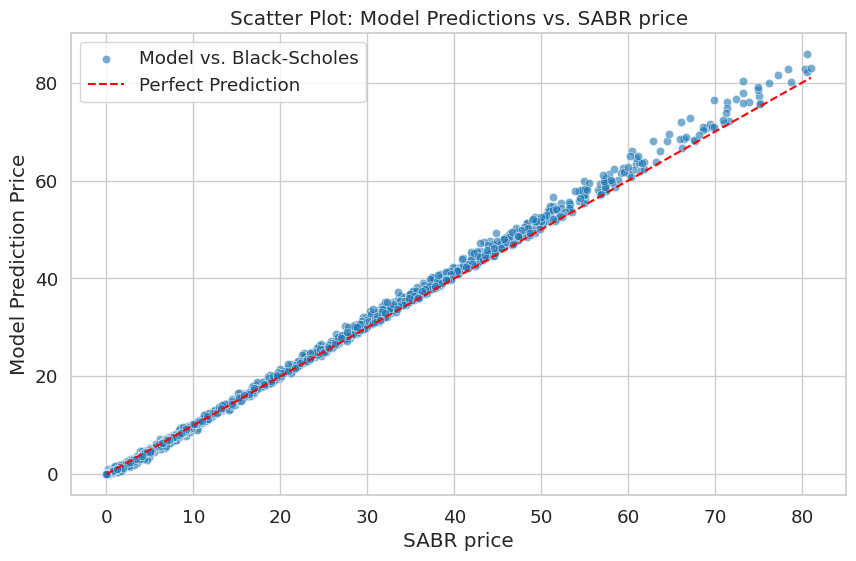

In [13]:
plt.figure(figsize=(10, 6))

# Scatter plot comparing Model Predictions vs. Black-Scholes for results_df_sabr_price
sns.scatterplot(x=results_df_sabr_price["True SABR Price"], 
                y=results_df_sabr_price["SABR Approximate Formula Price"], 
                alpha=0.6, 
                label="Model vs. Black-Scholes")


plt.plot([results_df_sabr_price["True SABR Price"].min(), results_df_sabr_price["True SABR Price"].max()],
         [results_df_sabr_price["True SABR Price"].min(), results_df_sabr_price["True SABR Price"].max()], 
         'r--', 
         label="Perfect Prediction")


# Labels and title
plt.xlabel("SABR price")
plt.ylabel("Model Prediction Price")
plt.title("Scatter Plot: Model Predictions vs. SABR price")
plt.legend()
plt.show()

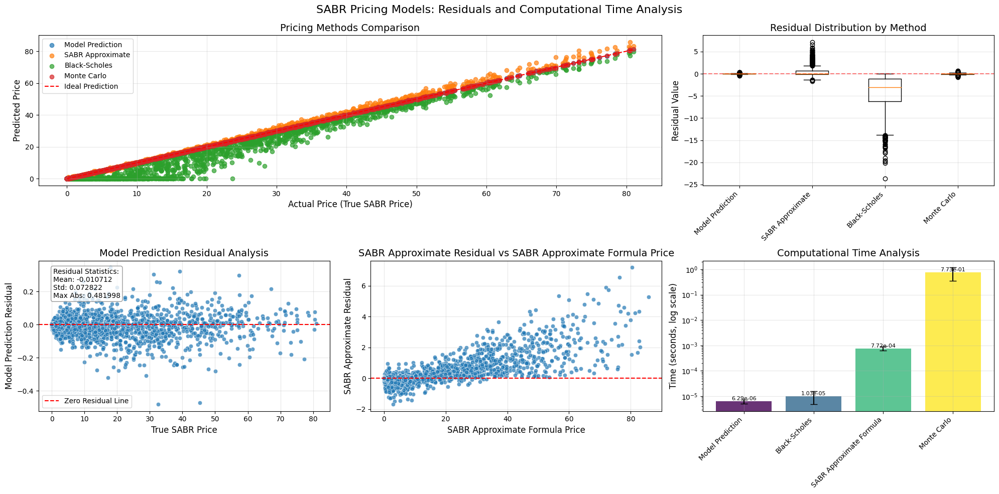


=== Detailed Analysis ===

Residual Statistics:

Model Prediction:
  Mean Residual: -0.0107117588
  Std Residual: 0.0728216534
  Max Absolute Residual: 0.4819984106

SABR Approximate:
  Mean Residual: 0.4250542466
  Std Residual: 0.9908386601
  Max Absolute Residual: 7.1807001329

Black-Scholes:
  Mean Residual: -4.1181124636
  Std Residual: 3.8148579019
  Max Absolute Residual: 23.7047634125

Monte Carlo:
  Mean Residual: 0.0002498621
  Std Residual: 0.1446429622
  Max Absolute Residual: 0.7363914917

Computational Time Statistics:
                                      mean          std
Model Prediction Time         0.0000062900 0.0000011382
Black-Scholes Time            0.0000102604 0.0000054196
SABR Approximate Formula Time 0.0007717552 0.0001270288
Monte Carlo Time              0.7725510392 0.4152551940

Speedup Factors (compared to slowest method):
Model Prediction Time: 122821.72x faster than Monte Carlo Time
Black-Scholes Time: 75294.58x faster than Monte Carlo Time
SABR Approx

In [6]:
def analyze_residuals_and_timing(
    results_df_sabr_price: pd.DataFrame,
    price_col: str = 'True SABR Price',
    prediction_col: str = 'Model Prediction',
    time_columns: list = None,
    figsize: tuple = (20, 10)
) -> None:
    """
    Create comprehensive analysis of residuals and computational times for SABR pricing models.
    
    Args:
        results_df: DataFrame containing the predictions and timing data
        price_col: Name of the actual price column
        prediction_col: Name of the model prediction column
        time_columns: List of timing columns to analyze
        figsize: Figure size for plots
    """
    if time_columns is None:
        time_columns = [
            "Black-Scholes Time",
            "Monte Carlo Time",
            "Model Prediction Time",
            "SABR Approximate Formula Time"
        ]
    
    # Calculate residuals for all pricing methods
    pricing_methods = {
        'Model Prediction': 'Model Prediction',
        'SABR Approximate': 'SABR Approximate Formula Price',
        'Black-Scholes': 'Black-Scholes Price',
        'Monte Carlo': 'Monte Carlo Price'
    }
    
    for method_name, method_col in pricing_methods.items():
        if method_col in results_df_sabr_price.columns:
            results_df_sabr_price[f"{method_name} Residual"] = results_df_sabr_price[method_col] - results_df_sabr_price[price_col]
    
    # Create figure with multiple subplots
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(2, 3)
    
    # Main title
    fig.suptitle('SABR Pricing Models: Residuals and Computational Time Analysis', fontsize=16, y=0.98)
    
    #All pricing methods comparison
    ax1 = fig.add_subplot(gs[0, 0:2])
    
    # Extract actual prices and all model predictions
    actual_prices = results_df_sabr_price[price_col]
    
    for method_name, method_col in pricing_methods.items():
        if method_col in results_df_sabr_price.columns:
            ax1.scatter(
                actual_prices, 
                results_df_sabr_price[method_col], 
                alpha=0.7,
                label=method_name
            )
    
    # Add ideal prediction line
    ideal_line = np.linspace(actual_prices.min(), actual_prices.max(), 100)
    ax1.plot(ideal_line, ideal_line, 'r--', label='Ideal Prediction')
    
    # Customize plot
    ax1.set_title("Pricing Methods Comparison", fontsize=14)
    ax1.set_xlabel(f"Actual Price ({price_col})", fontsize=12)
    ax1.set_ylabel("Predicted Price", fontsize=12)
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3)
    
    #Residuals for all methods
    ax2 = fig.add_subplot(gs[0, 2])
    
    # Create boxplot for residuals
    residual_cols = [col for col in results_df_sabr_price.columns if 'Residual' in col]
    residual_data = [results_df_sabr_price[col].values for col in residual_cols]
    residual_labels = [col.replace(' Residual', '') for col in residual_cols]
    
    ax2.boxplot(residual_data, labels=residual_labels, vert=True)
    ax2.axhline(0, color='r', linestyle='--', alpha=0.5)
    
    # Customize plot
    ax2.set_title("Residual Distribution by Method", fontsize=14)
    ax2.set_ylabel("Residual Value", fontsize=12)
    ax2.set_xticklabels(residual_labels, rotation=45, ha='right')
    ax2.grid(True, alpha=0.3)
    
    #Residuals vs Price
    ax3 = fig.add_subplot(gs[1, 0])
    
    main_residual_col = f"{list(pricing_methods.keys())[0]} Residual"
    if main_residual_col in results_df_sabr_price.columns:
        sns.scatterplot(
            data=results_df_sabr_price,
            x=price_col,
            y=main_residual_col,
            alpha=0.7,
            ax=ax3
        )
        
        # Add zero line
        ax3.axhline(0, color='r', linestyle='--', label="Zero Residual Line")
        
        # Calculate residual statistics
        mean_residual = results_df_sabr_price[main_residual_col].mean()
        std_residual = results_df_sabr_price[main_residual_col].std()
        max_abs_residual = abs(results_df_sabr_price[main_residual_col]).max()
        
        # Add statistics text box
        stats_text = (
            f'Residual Statistics:\n'
            f'Mean: {mean_residual:.6f}\n'
            f'Std: {std_residual:.6f}\n'
            f'Max Abs: {max_abs_residual:.6f}'
        )
        
        ax3.text(
            0.05, 0.95,
            stats_text,
            transform=ax3.transAxes,
            fontsize=10,
            verticalalignment='top',
            bbox=dict(
                boxstyle='round',
                facecolor='white',
                alpha=0.8,
                edgecolor='gray'
            )
        )
        
        # Customize plot
        ax3.set_title(f"{main_residual_col} Analysis", fontsize=14)
        ax3.set_xlabel(price_col, fontsize=12)
        ax3.set_ylabel(main_residual_col, fontsize=12)
        ax3.legend(fontsize=10)
        ax3.grid(True, alpha=0.3)
    
    #Feature influence
    ax4 = fig.add_subplot(gs[1, 1])
    
    feature = 'SABR Approximate Formula Price'
    residual_col = 'SABR Approximate Residual'
    
    if feature in results_df_sabr_price.columns and residual_col in results_df_sabr_price.columns:
        sns.scatterplot(
            data=results_df_sabr_price,
            x=feature,
            y=residual_col,
            alpha=0.7,
            ax=ax4
        )
    
        # Add zero line
        ax4.axhline(0, color='r', linestyle='--')
    
        # Customize plot
        ax4.set_title(f"{residual_col} vs {feature}", fontsize=14)
        ax4.set_xlabel(feature, fontsize=12)
        ax4.set_ylabel(residual_col, fontsize=12)
        ax4.grid(True, alpha=0.3)
    
    #Computational Times
    ax5 = fig.add_subplot(gs[1, 2])
    
    # Filter available time columns
    available_time_cols = [col for col in time_columns if col in results_df_sabr_price.columns]
    
    if available_time_cols:
        # Calculate timing statistics
        time_stats = results_df_sabr_price[available_time_cols].agg(['mean', 'std']).T
        time_stats = time_stats.sort_values('mean')
        
        # Create bar plot
        bars = ax5.bar(
            range(len(time_stats)),
            time_stats['mean'],
            yerr=time_stats['std'],
            alpha=0.8,
            capsize=5,
            color=plt.cm.viridis(np.linspace(0, 1, len(time_stats)))
        )
        
        # Customize time plot
        ax5.set_yscale('log')
        ax5.set_xticks(range(len(time_stats)))
        ax5.set_xticklabels([col.replace(' Time', '') for col in time_stats.index], 
                            rotation=45, ha='right')
        ax5.set_title("Computational Time Analysis", fontsize=14)
        ax5.set_ylabel("Time (seconds, log scale)", fontsize=12)
        ax5.grid(True, alpha=0.3)
        
        # Add value labels on bars
        for bar in bars:
            height = bar.get_height()
            ax5.text(
                bar.get_x() + bar.get_width()/2.,
                height,
                f'{height:.2e}',
                ha='center',
                va='bottom',
                rotation=0,
                fontsize=8
            )
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()
    
    # Print additional statistics
    print("\n=== Detailed Analysis ===")
    
    print("\nResidual Statistics:")
    for method_name in pricing_methods.keys():
        residual_col = f"{method_name} Residual"
        if residual_col in results_df_sabr_price.columns:
            mean = results_df_sabr_price[residual_col].mean()
            std = results_df_sabr_price[residual_col].std()
            max_abs = abs(results_df_sabr_price[residual_col]).max()
            print(f"\n{method_name}:")
            print(f"  Mean Residual: {mean:.10f}")
            print(f"  Std Residual: {std:.10f}")
            print(f"  Max Absolute Residual: {max_abs:.10f}")
    
    if available_time_cols:
        print("\nComputational Time Statistics:")
        print(time_stats.to_string(float_format=lambda x: '{:.10f}'.format(x)))
        
        # Calculate speedup compared to slowest method
        slowest_method = time_stats['mean'].idxmax()
        slowest_time = time_stats.loc[slowest_method, 'mean']
        
        print("\nSpeedup Factors (compared to slowest method):")
        for method in time_stats.index:
            speedup = slowest_time / time_stats.loc[method, 'mean']
            print(f"{method}: {speedup:.2f}x faster than {slowest_method}")

# Example usage
time_columns = [
    "Black-Scholes Time",
    "Monte Carlo Time",
    "Model Prediction Time",
    "SABR Approximate Formula Time"
]

# Make sure to use the column names exactly as they appear in your DataFrame
analyze_residuals_and_timing(
    results_df_sabr_price,  # your dataframe name
    price_col='True SABR Price',  # Adjusted to match your column name
    prediction_col='Model Prediction',
    time_columns=time_columns,
    figsize=(20, 10)
)

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

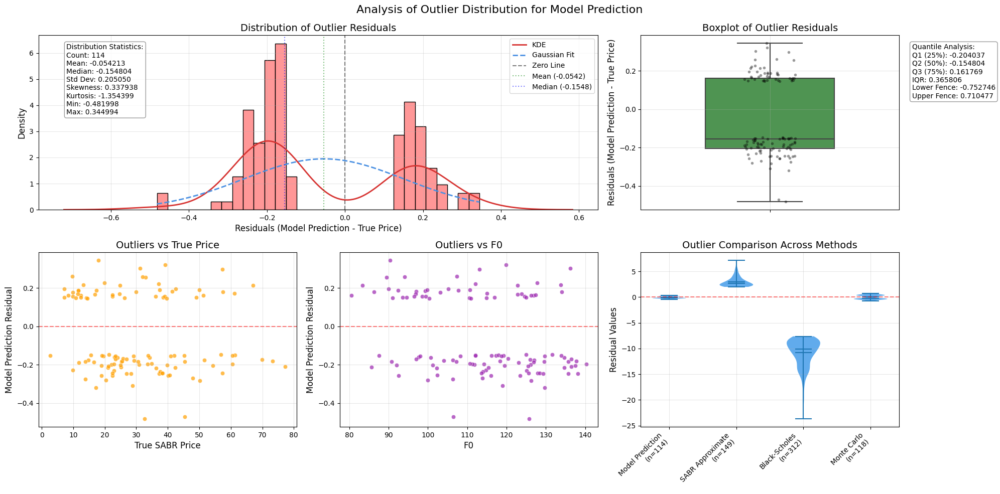


=== Outlier Analysis Summary for Model Prediction ===

Number of outliers: 114

Basic Statistics:
Mean Residual: -0.054213
Median Residual: -0.154804
Standard Deviation: 0.205050
Skewness: 0.337938
Kurtosis: -1.354399

Quantile Analysis:
25th Percentile: -0.204037
50th Percentile: -0.154804
75th Percentile: 0.161769
IQR: 0.365806

Residual Direction Analysis:
Positive Residuals: 44 (38.60%)
Negative Residuals: 70 (61.40%)

Feature Correlation with Outlier Residuals:
F0: -0.296592
alpha: 0.109264
rho: -0.238211
nu: 0.013502
r: -0.229141
T: 0.130808
K: -0.048367

Outlier Count Comparison:
Model Prediction: 114 outliers
SABR Approximate: 149 outliers
Black-Scholes: 312 outliers
Monte Carlo: 118 outliers


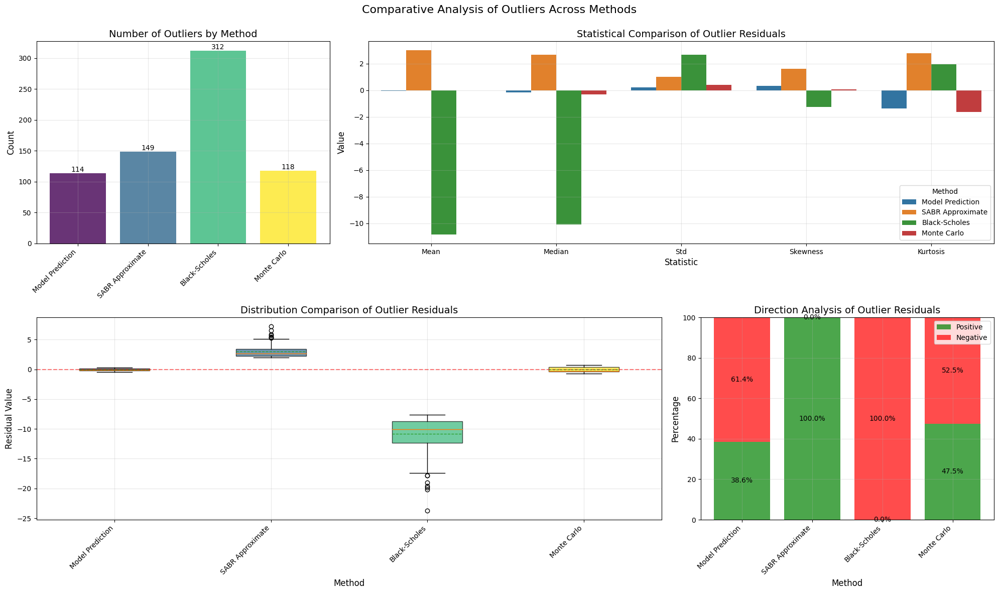


=== Outlier Comparison Summary ===

Outlier Count by Method:
Model Prediction: 114 outliers
SABR Approximate: 149 outliers
Black-Scholes: 312 outliers
Monte Carlo: 118 outliers

Residual Statistics by Method:
          Method       Mean     Median      Std        Min       Max  Skewness  Kurtosis
Model Prediction  -0.054213  -0.154804 0.205050  -0.481998  0.344994  0.337938 -1.354399
SABR Approximate   2.999624   2.667304 0.993425   1.987901  7.180700  1.614612  2.774809
   Black-Scholes -10.827699 -10.077897 2.679751 -23.704763 -7.630072 -1.255899  1.939678
     Monte Carlo  -0.007312  -0.293244 0.404284  -0.736391  0.694757  0.083625 -1.639053

Direction Analysis by Method:

Model Prediction:
  Positive Residuals: 44 (38.60%)
  Negative Residuals: 70 (61.40%)

SABR Approximate:
  Positive Residuals: 149 (100.00%)
  Negative Residuals: 0 (0.00%)

Black-Scholes:
  Positive Residuals: 0 (0.00%)
  Negative Residuals: 312 (100.00%)

Monte Carlo:
  Positive Residuals: 56 (47.46%)
  Negati

In [43]:
def identify_outliers_by_method(
    df: pd.DataFrame,
    price_col: str = 'True SABR Price',
    methods: dict = None,
    n_std: float = 2.0
) -> dict:
    """
    Identify outliers in the residuals for multiple pricing methods based on standard deviation.
    
    Args:
        df: DataFrame containing the pricing data
        price_col: Name of the true price column
        methods: Dictionary mapping method names to their column names
        n_std: Number of standard deviations for outlier threshold
    
    Returns:
        Dictionary of DataFrames containing outliers for each method
    """
    if methods is None:
        methods = {
            'Model Prediction': 'Model Prediction',
            'SABR Approximate': 'SABR Approximate Formula Price',
            'Black-Scholes': 'Black-Scholes Price',
            'Monte Carlo': 'Monte Carlo Price'
        }
    
    outliers_dict = {}
    
    # Calculate residuals and identify outliers for each method
    for method_name, method_col in methods.items():
        if method_col in df.columns:
            # Calculate residuals
            residual_col = f"{method_name} Residual"
            df[residual_col] = df[method_col] - df[price_col]
            
            # Calculate threshold
            std_dev = df[residual_col].std()
            threshold = n_std * std_dev
            
            # Identify outliers
            outliers = df[np.abs(df[residual_col]) > threshold].copy()
            outliers_dict[method_name] = outliers
    
    return outliers_dict

def analyze_outlier_distribution(
    outliers_dict: dict,
    method: str = None,
    figsize: tuple = (20, 10),
    colors: dict = {
        "hist": "#FF6B6B",       # Light red for histogram
        "kde": "#D63230",        # Dark red for KDE
        "gaussian": "#4A90E2",   # Blue for Gaussian fit
        "comparison": "#1E88E5", # Blue for comparison
        "box": "#43A047",        # Green for boxplot
        "scatter": "#FFA000",    # Orange for scatter
        "feature": "#9C27B0"     # Purple for feature plot
    }
) -> None:
    """
    Create comprehensive analysis of outlier distribution for multiple methods.
    
    Args:
        outliers_dict: Dictionary of DataFrames containing outliers for each method
        method: Specific method to analyze (if None, analyze all methods)
        figsize: Figure size for plots
        colors: Dictionary of colors for different plot elements
    """
    if not outliers_dict:
        print("No outliers found in any method.")
        return
    
    # If no specific method is selected, choose the first available
    if method is None:
        method = list(outliers_dict.keys())[0]
    
    # Check if the selected method exists in the dictionary
    if method not in outliers_dict:
        print(f"Method '{method}' not found in outliers dictionary.")
        return
    
    # Get outliers for the selected method
    outliers = outliers_dict[method]
    residual_col = f"{method} Residual"
    
    # Create figure with multiple subplots
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(2, 3)
    
    fig.suptitle(f'Analysis of Outlier Distribution for {method}', fontsize=16, y=0.98)
    
    # Calculate statistics
    mean_residual = outliers[residual_col].mean()
    std_residual = outliers[residual_col].std()
    median_residual = outliers[residual_col].median()
    skewness = outliers[residual_col].skew()
    kurtosis = outliers[residual_col].kurtosis()
    
    #Histogram with KDE and Gaussian fit
    ax1 = fig.add_subplot(gs[0, 0:2])
    
    # Create x values for Gaussian fit
    xmin, xmax = outliers[residual_col].min(), outliers[residual_col].max()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mean_residual, std_residual)
    
    sns.histplot(
        data=outliers,
        x=residual_col,
        bins=30,
        color=colors["hist"],
        alpha=0.7,
        stat="density",
        ax=ax1
    )
    
    sns.kdeplot(
        data=outliers[residual_col],
        color=colors["kde"],
        linewidth=2,
        label="KDE",
        ax=ax1
    )
    
    ax1.plot(x, p, color=colors["gaussian"],
             linestyle='--', linewidth=2,
             label="Gaussian Fit")
    
    ax1.axvline(0, color='black', linestyle='--',
                label="Zero Line", alpha=0.5)
    ax1.axvline(mean_residual, color='green', linestyle=':',
                label=f"Mean ({mean_residual:.4f})", alpha=0.5)
    ax1.axvline(median_residual, color='blue', linestyle=':',
                label=f"Median ({median_residual:.4f})", alpha=0.5)
    
    # Add statistics text box
    stats_text = (
        f'Distribution Statistics:\n'
        f'Count: {len(outliers)}\n'
        f'Mean: {mean_residual:.6f}\n'
        f'Median: {median_residual:.6f}\n'
        f'Std Dev: {std_residual:.6f}\n'
        f'Skewness: {skewness:.6f}\n'
        f'Kurtosis: {kurtosis:.6f}\n'
        f'Min: {xmin:.6f}\n'
        f'Max: {xmax:.6f}'
    )
    
    ax1.text(
        0.05, 0.95,
        stats_text,
        transform=ax1.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(
            boxstyle='round',
            facecolor='white',
            alpha=0.8,
            edgecolor='gray'
        )
    )
    
    ax1.set_title("Distribution of Outlier Residuals", fontsize=14)
    ax1.set_xlabel(f"Residuals ({method} - True Price)", fontsize=12)
    ax1.set_ylabel("Density", fontsize=12)
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3)
    
    #Box plot with individual points
    ax2 = fig.add_subplot(gs[0, 2])
    
    sns.boxplot(
        y=outliers[residual_col],
        color=colors["box"],
        width=0.5,
        ax=ax2
    )
    
    sns.stripplot(
        y=outliers[residual_col],
        color='black',
        alpha=0.4,
        size=4,
        ax=ax2
    )
    
    # Add quantile information
    quantiles = outliers[residual_col].quantile([0.25, 0.5, 0.75])
    iqr = quantiles[0.75] - quantiles[0.25]
    
    quantile_text = (
        f'Quantile Analysis:\n'
        f'Q1 (25%): {quantiles[0.25]:.6f}\n'
        f'Q2 (50%): {quantiles[0.5]:.6f}\n'
        f'Q3 (75%): {quantiles[0.75]:.6f}\n'
        f'IQR: {iqr:.6f}\n'
        f'Lower Fence: {quantiles[0.25] - 1.5*iqr:.6f}\n'
        f'Upper Fence: {quantiles[0.75] + 1.5*iqr:.6f}'
    )
    
    ax2.text(
        1.05, 0.95,
        quantile_text,
        transform=ax2.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(
            boxstyle='round',
            facecolor='white',
            alpha=0.8,
            edgecolor='gray'
        )
    )
    
    ax2.set_title("Boxplot of Outlier Residuals", fontsize=14)
    ax2.set_ylabel(f"Residuals ({method} - True Price)", fontsize=12)
    ax2.grid(True, alpha=0.3)
    
    # Scatter plot of outliers against true price 
    ax3 = fig.add_subplot(gs[1, 0])
    
    true_price_col = 'True SABR Price'  # Update this if needed
    if true_price_col in outliers.columns:
        sns.scatterplot(
            data=outliers,
            x=true_price_col,
            y=residual_col,
            color=colors["scatter"],
            alpha=0.7,
            ax=ax3
        )
        
        ax3.axhline(0, color='red', linestyle='--', alpha=0.5)
        
        # Add trend line
        try:
            # Simple linear regression
            x = outliers[true_price_col].values.reshape(-1, 1)
            y = outliers[residual_col].values
            model = LinearRegression().fit(x, y)
            x_range = np.linspace(min(x), max(x), 100).reshape(-1, 1)
            y_pred = model.predict(x_range)
            
            ax3.plot(x_range, y_pred, color='green', 
                     linestyle='-', linewidth=2,
                     label=f"Trend (slope: {model.coef_[0]:.6f})")
            ax3.legend(fontsize=10)
        except:
            pass  # Skip trend line if error occurs
        
        ax3.set_title("Outliers vs True Price", fontsize=14)
        ax3.set_xlabel(true_price_col, fontsize=12)
        ax3.set_ylabel(residual_col, fontsize=12)
        ax3.grid(True, alpha=0.3)
    
    #  Feature impact on outliers 
    ax4 = fig.add_subplot(gs[1, 1])
    
    # Define potential feature columns
    feature_cols = ['F0', 'alpha', 'rho', 'nu', 'r', 'T', 'K']
    available_features = [col for col in feature_cols if col in outliers.columns]
    
    if available_features:
        # Choose first available feature
        feature = available_features[0]
        
        sns.scatterplot(
            data=outliers,
            x=feature,
            y=residual_col,
            color=colors["feature"],
            alpha=0.7,
            ax=ax4
        )
        
        # Add zero line
        ax4.axhline(0, color='red', linestyle='--', alpha=0.5)
        
        # Add trend line
        try:
            # Simple linear regression
            x = outliers[feature].values.reshape(-1, 1)
            y = outliers[residual_col].values
            model = LinearRegression().fit(x, y)
            x_range = np.linspace(min(x), max(x), 100).reshape(-1, 1)
            y_pred = model.predict(x_range)
            
            ax4.plot(x_range, y_pred, color='green', 
                     linestyle='-', linewidth=2,
                     label=f"Trend (slope: {model.coef_[0]:.6f})")
            ax4.legend(fontsize=10)
        except:
            pass  # Skip trend line if error occurs
            
        ax4.set_title(f"Outliers vs {feature}", fontsize=14)
        ax4.set_xlabel(feature, fontsize=12)
        ax4.set_ylabel(residual_col, fontsize=12)
        ax4.grid(True, alpha=0.3)
    
    # Compare outliers across methods
    ax5 = fig.add_subplot(gs[1, 2])
    
    # Collect data for comparison
    comparison_data = []
    comparison_labels = []
    
    for method_name, method_outliers in outliers_dict.items():
        method_residual_col = f"{method_name} Residual"
        if method_residual_col in method_outliers.columns and len(method_outliers) > 0:
            comparison_data.append(method_outliers[method_residual_col].values)
            comparison_labels.append(f"{method_name}\n(n={len(method_outliers)})")
    
    if comparison_data:
        violin_parts = ax5.violinplot(
            comparison_data,
            showmeans=True,
            showmedians=True,
            showextrema=True
        )
        
        # Customize violin plot colors
        for pc in violin_parts['bodies']:
            pc.set_facecolor(colors["comparison"])
            pc.set_alpha(0.7)
        
        # Set custom labels
        ax5.set_xticks(range(1, len(comparison_labels) + 1))
        ax5.set_xticklabels(comparison_labels, rotation=45, ha='right')
        
        # Add zero line
        ax5.axhline(0, color='red', linestyle='--', alpha=0.5)
        
        ax5.set_title("Outlier Comparison Across Methods", fontsize=14)
        ax5.set_ylabel("Residual Values", fontsize=12)
        ax5.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()
    
    # Print additional analysis
    print(f"\n=== Outlier Analysis Summary for {method} ===")
    print(f"\nNumber of outliers: {len(outliers)}")
    print("\nBasic Statistics:")
    print(f"Mean Residual: {mean_residual:.6f}")
    print(f"Median Residual: {median_residual:.6f}")
    print(f"Standard Deviation: {std_residual:.6f}")
    print(f"Skewness: {skewness:.6f}")
    print(f"Kurtosis: {kurtosis:.6f}")
    
    print("\nQuantile Analysis:")
    print(f"25th Percentile: {quantiles[0.25]:.6f}")
    print(f"50th Percentile: {quantiles[0.5]:.6f}")
    print(f"75th Percentile: {quantiles[0.75]:.6f}")
    print(f"IQR: {iqr:.6f}")
    
    # Calculate and print proportion of positive/negative residuals
    pos_residuals = (outliers[residual_col] > 0).sum()
    neg_residuals = (outliers[residual_col] < 0).sum()
    
    print("\nResidual Direction Analysis:")
    print(f"Positive Residuals: {pos_residuals} ({pos_residuals/len(outliers)*100:.2f}%)")
    print(f"Negative Residuals: {neg_residuals} ({neg_residuals/len(outliers)*100:.2f}%)")
    
    # Feature importance analysis
    if available_features:
        print("\nFeature Correlation with Outlier Residuals:")
        for feature in available_features:
            correlation = outliers[[feature, residual_col]].corr().iloc[0, 1]
            print(f"{feature}: {correlation:.6f}")
    
    # Compare outlier counts across methods
    print("\nOutlier Count Comparison:")
    for method_name, method_outliers in outliers_dict.items():
        print(f"{method_name}: {len(method_outliers)} outliers")

def compare_outliers_across_methods(
    outliers_dict: dict,
    figsize: tuple = (20, 12)
) -> None:
    """
    Compare outlier characteristics across different pricing methods.
    
    Args:
        outliers_dict: Dictionary of DataFrames containing outliers for each method
        figsize: Figure size for plots
    """
    if not outliers_dict or len(outliers_dict) < 2:
        print("Need at least two methods with outliers for comparison.")
        return
    
    # Create figure with multiple subplots
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(2, 3)
    
    fig.suptitle('Comparative Analysis of Outliers Across Methods', fontsize=16, y=0.98)
    
    # Outlier count comparison
    ax1 = fig.add_subplot(gs[0, 0])
    
    methods = list(outliers_dict.keys())
    counts = [len(outliers_dict[method]) for method in methods]
    
    # Create bar chart
    bars = ax1.bar(
        range(len(methods)),
        counts,
        alpha=0.8,
        color=plt.cm.viridis(np.linspace(0, 1, len(methods)))
    )
    
    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        ax1.text(
            bar.get_x() + bar.get_width()/2.,
            height,
            f'{int(height)}',
            ha='center',
            va='bottom',
            rotation=0
        )
    
    # Customize plot
    ax1.set_xticks(range(len(methods)))
    ax1.set_xticklabels(methods, rotation=45, ha='right')
    ax1.set_title("Number of Outliers by Method", fontsize=14)
    ax1.set_ylabel("Count", fontsize=12)
    ax1.grid(True, alpha=0.3)
    
    # Residual statistics comparison
    ax2 = fig.add_subplot(gs[0, 1:3])
    
    # Calculate statistics for each method
    stats_data = []
    for method in methods:
        outliers = outliers_dict[method]
        residual_col = f"{method} Residual"
        if residual_col in outliers.columns and len(outliers) > 0:
            stats_data.append({
                'Method': method,
                'Mean': outliers[residual_col].mean(),
                'Median': outliers[residual_col].median(),
                'Std': outliers[residual_col].std(),
                'Min': outliers[residual_col].min(),
                'Max': outliers[residual_col].max(),
                'Skewness': outliers[residual_col].skew(),
                'Kurtosis': outliers[residual_col].kurtosis()
            })
    
    stats_df = pd.DataFrame(stats_data)
    
    # Melt dataframe for plotting
    stats_long = pd.melt(
        stats_df,
        id_vars=['Method'],
        value_vars=['Mean', 'Median', 'Std', 'Skewness', 'Kurtosis'],
        var_name='Statistic',
        value_name='Value'
    )
    
    # Create grouped bar chart
    sns.barplot(
        data=stats_long,
        x='Statistic',
        y='Value',
        hue='Method',
        ax=ax2
    )
    
    # Customize plot
    ax2.set_title("Statistical Comparison of Outlier Residuals", fontsize=14)
    ax2.set_xlabel("Statistic", fontsize=12)
    ax2.set_ylabel("Value", fontsize=12)
    ax2.legend(title="Method")
    ax2.grid(True, alpha=0.3)
    
    # Box plot comparison
    ax3 = fig.add_subplot(gs[1, 0:2])
    
    # Collect residual data for all methods
    box_data = []
    box_labels = []
    
    for method in methods:
        outliers = outliers_dict[method]
        residual_col = f"{method} Residual"
        if residual_col in outliers.columns and len(outliers) > 0:
            box_data.append(outliers[residual_col].values)
            box_labels.append(method)
    
    # Create box plot
    box_parts = ax3.boxplot(
        box_data,
        labels=box_labels,
        patch_artist=True,
        showmeans=True,
        meanline=True
    )
    
    # Customize box colors
    colors = plt.cm.viridis(np.linspace(0, 1, len(box_data)))
    for patch, color in zip(box_parts['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    
    # Add zero line
    ax3.axhline(0, color='red', linestyle='--', alpha=0.5)
    
    # Customize plot
    ax3.set_title("Distribution Comparison of Outlier Residuals", fontsize=14)
    ax3.set_xlabel("Method", fontsize=12)
    ax3.set_ylabel("Residual Value", fontsize=12)
    ax3.set_xticklabels(box_labels, rotation=45, ha='right')
    ax3.grid(True, alpha=0.3)
    
    # --- Plot 4: Direction analysis ---
    ax4 = fig.add_subplot(gs[1, 2])
    
    # Calculate positive and negative residual proportions
    pos_data = []
    neg_data = []
    
    for method in methods:
        outliers = outliers_dict[method]
        residual_col = f"{method} Residual"
        if residual_col in outliers.columns and len(outliers) > 0:
            total = len(outliers)
            pos = (outliers[residual_col] > 0).sum() / total * 100
            neg = (outliers[residual_col] < 0).sum() / total * 100
            pos_data.append(pos)
            neg_data.append(neg)
    
    # Create stacked bar chart
    x = np.arange(len(methods))
    width = 0.8
    
    ax4.bar(x, pos_data, width, label='Positive', color='green', alpha=0.7)
    ax4.bar(x, neg_data, width, bottom=pos_data, label='Negative', color='red', alpha=0.7)
    
    # Customize plot
    ax4.set_xticks(x)
    ax4.set_xticklabels(methods, rotation=45, ha='right')
    ax4.set_title("Direction Analysis of Outlier Residuals", fontsize=14)
    ax4.set_xlabel("Method", fontsize=12)
    ax4.set_ylabel("Percentage", fontsize=12)
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    # Add percentage labels
    for i, (pos, neg) in enumerate(zip(pos_data, neg_data)):
        ax4.text(i, pos/2, f"{pos:.1f}%", ha='center', va='center')
        ax4.text(i, pos + neg/2, f"{neg:.1f}%", ha='center', va='center')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()
    
    # Print comparison summary
    print("\n=== Outlier Comparison Summary ===")
    
    print("\nOutlier Count by Method:")
    for method in methods:
        print(f"{method}: {len(outliers_dict[method])} outliers")
    
    print("\nResidual Statistics by Method:")
    print(stats_df.to_string(index=False, float_format=lambda x: f"{x:.6f}"))
    
    print("\nDirection Analysis by Method:")
    for method in methods:
        outliers = outliers_dict[method]
        residual_col = f"{method} Residual"
        if residual_col in outliers.columns and len(outliers) > 0:
            total = len(outliers)
            pos = (outliers[residual_col] > 0).sum()
            neg = (outliers[residual_col] < 0).sum()
            print(f"\n{method}:")
            print(f"  Positive Residuals: {pos} ({pos/total*100:.2f}%)")
            print(f"  Negative Residuals: {neg} ({neg/total*100:.2f}%)")

# Example usage
methods = {
    'Model Prediction': 'Model Prediction',
    'SABR Approximate': 'SABR Approximate Formula Price',
    'Black-Scholes': 'Black-Scholes Price',
    'Monte Carlo': 'Monte Carlo Price'
}

# Identify outliers for all methods
outliers_dict = identify_outliers_by_method(
    results_df_sabr_price,  # your dataframe
    price_col='True SABR Price',  # adjust to match your column name
    methods=methods,
    n_std=2.0  # you can adjust this threshold
)

# Analyze outliers for a specific method
analyze_outlier_distribution(
    outliers_dict,
    method='Model Prediction',  # specify which method to analyze
    figsize=(20, 10)
)

# Compare outliers across all methods
compare_outliers_across_methods(
    outliers_dict,
    figsize=(20, 12)
)


Model Prediction Residuals analysis


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

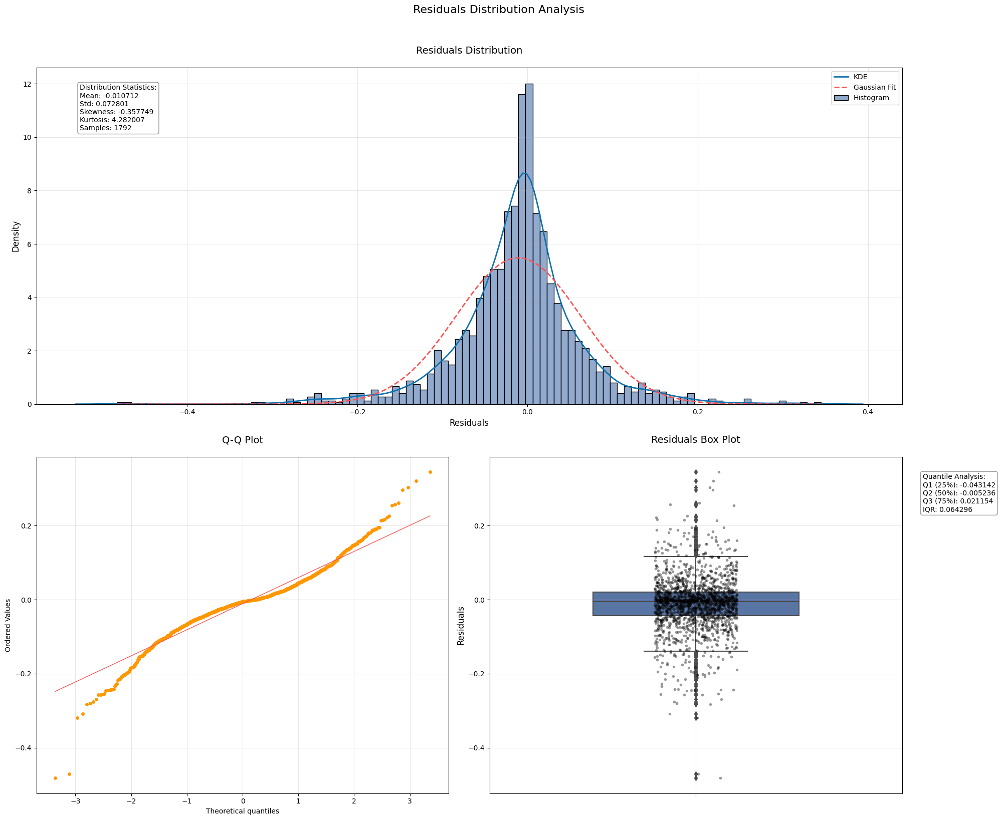


=== Residuals Analysis Summary ===

Basic Statistics:
Mean: -0.010712
Standard Deviation: 0.072801
Skewness: -0.357749
Kurtosis: 4.282007

Quantile Analysis:
25th Percentile: -0.043142
Median: -0.005236
75th Percentile: 0.021154
IQR: 0.064296

Normality Tests:
Shapiro-Wilk p-value: 0.000000
D'Agostino-Pearson p-value: 0.000000

Residuals Distribution:
Within 1 std dev: 77.96% (Expected: 68.27%)
Within 2 std dev: 93.81% (Expected: 95.45%)
Within 3 std dev: 98.16% (Expected: 99.73%)

SABR Approximate Residuals analysis


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

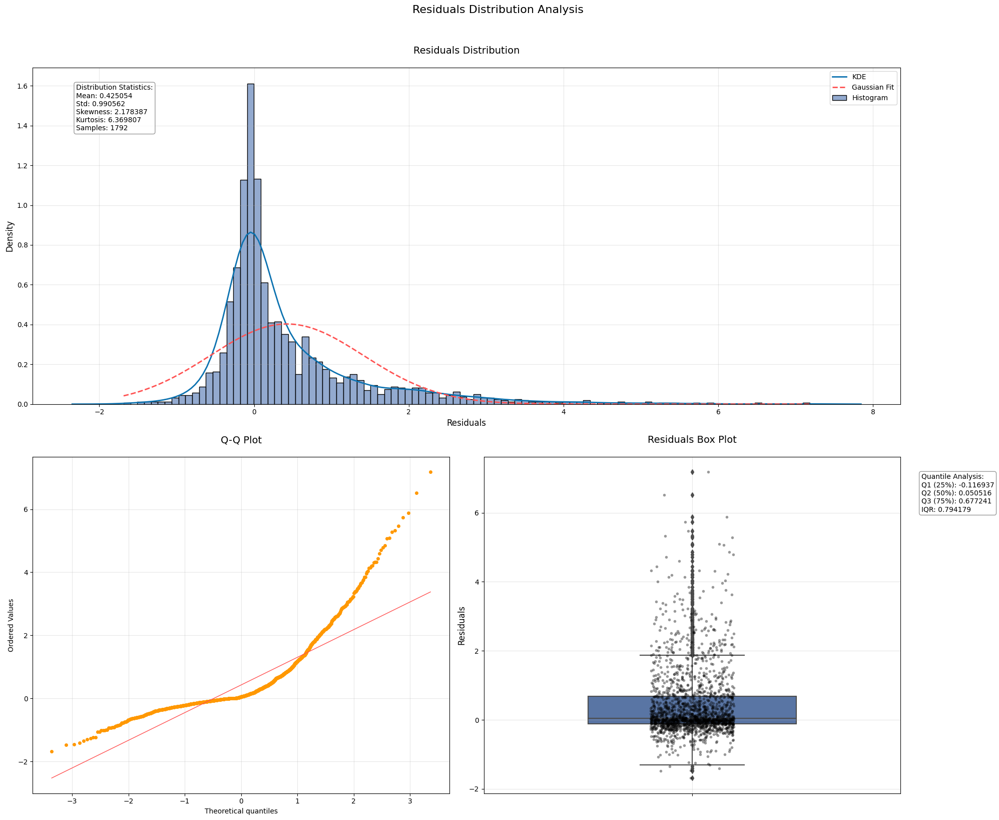


=== Residuals Analysis Summary ===

Basic Statistics:
Mean: 0.425054
Standard Deviation: 0.990562
Skewness: 2.178387
Kurtosis: 6.369807

Quantile Analysis:
25th Percentile: -0.116937
Median: 0.050516
75th Percentile: 0.677241
IQR: 0.794179

Normality Tests:
Shapiro-Wilk p-value: 0.000000
D'Agostino-Pearson p-value: 0.000000

Residuals Distribution:
Within 1 std dev: 83.37% (Expected: 68.27%)
Within 2 std dev: 94.48% (Expected: 95.45%)
Within 3 std dev: 97.94% (Expected: 99.73%)

Black-Scholes Residuals analysis


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

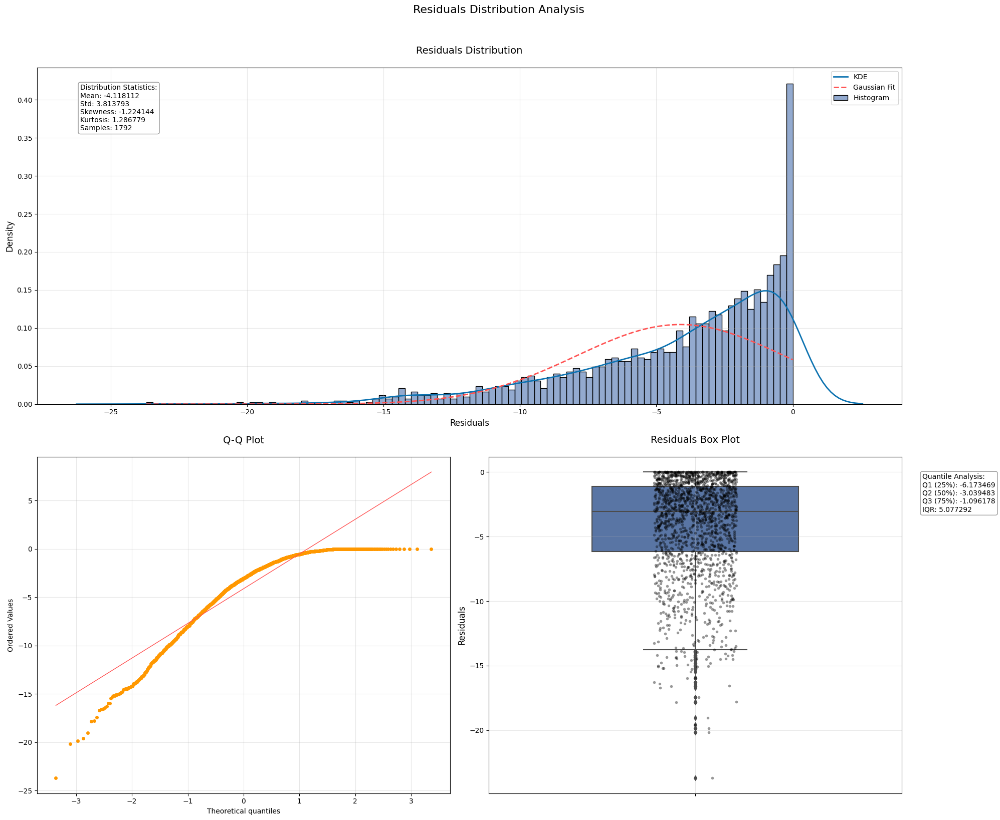


=== Residuals Analysis Summary ===

Basic Statistics:
Mean: -4.118112
Standard Deviation: 3.813793
Skewness: -1.224144
Kurtosis: 1.286779

Quantile Analysis:
25th Percentile: -6.173469
Median: -3.039483
75th Percentile: -1.096178
IQR: 5.077292

Normality Tests:
Shapiro-Wilk p-value: 0.000000
D'Agostino-Pearson p-value: 0.000000

Residuals Distribution:
Within 1 std dev: 71.71% (Expected: 68.27%)
Within 2 std dev: 94.92% (Expected: 95.45%)
Within 3 std dev: 99.16% (Expected: 99.73%)

Monte Carlo Residuals analysis


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

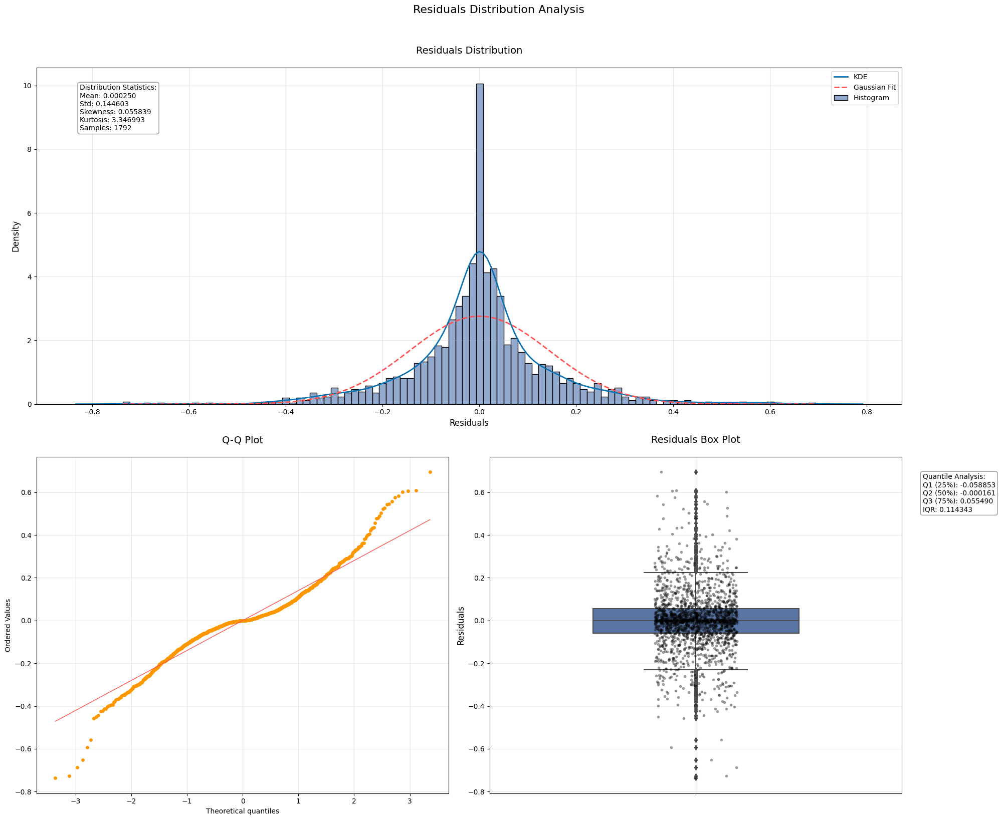


=== Residuals Analysis Summary ===

Basic Statistics:
Mean: 0.000250
Standard Deviation: 0.144603
Skewness: 0.055839
Kurtosis: 3.346993

Quantile Analysis:
25th Percentile: -0.058853
Median: -0.000161
75th Percentile: 0.055490
IQR: 0.114343

Normality Tests:
Shapiro-Wilk p-value: 0.000000
D'Agostino-Pearson p-value: 0.000000

Residuals Distribution:
Within 1 std dev: 76.67% (Expected: 68.27%)
Within 2 std dev: 93.47% (Expected: 95.45%)
Within 3 std dev: 98.55% (Expected: 99.73%)


In [46]:
def analyze_residuals_distribution(
    df: pd.DataFrame,
    residual_col: str = 'Residuals',
    figsize: tuple = (20, 8),
    colors: dict = {
        "hist": "#4C72B0",
        "kde": "#0C72B0",
        "gaussian": "#FF5252",
        "qq_points": "#FF9800",
        "qq_line": "#FF5252"
    }
) -> None:
    """
    Create comprehensive residuals distribution analysis including Q-Q plot.
    
    Args:
        df: DataFrame containing the residuals
        residual_col: Name of the residuals column
        figsize: Figure size for plots
        colors: Dictionary of colors for different plot elements
    """
    # Calculate statistics
    residuals = df[residual_col].dropna()
    mean_residual = np.mean(residuals)
    std_residual = np.std(residuals)
    skewness = stats.skew(residuals)
    kurtosis = stats.kurtosis(residuals)
    
    # Create figure with three subplots
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(2, 2)
    ax1 = fig.add_subplot(gs[0, :])  # Top row for distribution
    ax2 = fig.add_subplot(gs[1, 0])  # Bottom left for Q-Q plot
    ax3 = fig.add_subplot(gs[1, 1])  # Bottom right for box plot
    
    fig.suptitle('Residuals Distribution Analysis', fontsize=16, y=1.02)
    
    # Distribution
    xmin, xmax = residuals.min(), residuals.max()
    x = np.linspace(xmin, xmax, 300)
    p = norm.pdf(x, mean_residual, std_residual)
    
    sns.histplot(
        residuals,
        stat="density",
        color=colors["hist"],
        alpha=0.6,
        bins=100,
        ax=ax1,
        label="Histogram"
    )
    
    sns.kdeplot(
        residuals,
        color=colors["kde"],
        linewidth=2,
        label="KDE",
        ax=ax1
    )
    
    ax1.plot(x, p,
             color=colors["gaussian"],
             label="Gaussian Fit",
             linewidth=2,
             linestyle='--')
    
    # Add statistics text box
    stats_text = (
        f'Distribution Statistics:\n'
        f'Mean: {mean_residual:.6f}\n'
        f'Std: {std_residual:.6f}\n'
        f'Skewness: {skewness:.6f}\n'
        f'Kurtosis: {kurtosis:.6f}\n'
        f'Samples: {len(residuals)}'
    )
    
    ax1.text(
        0.05, 0.95,
        stats_text,
        transform=ax1.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(
            boxstyle='round',
            facecolor='white',
            alpha=0.8,
            edgecolor='gray'
        )
    )
    
    ax1.set_title("Residuals Distribution", fontsize=14, pad=20)
    ax1.set_xlabel("Residuals", fontsize=12)
    ax1.set_ylabel("Density", fontsize=12)
    ax1.legend(fontsize=10, loc='upper right')
    ax1.grid(True, alpha=0.3)
    
    # Q-Q Plot
    stats.probplot(residuals, dist="norm", plot=ax2)
    
    # Customize Q-Q plot
    ax2.get_lines()[0].set_markerfacecolor(colors["qq_points"])
    ax2.get_lines()[0].set_markeredgecolor(colors["qq_points"])
    ax2.get_lines()[0].set_markersize(4)
    ax2.get_lines()[1].set_color(colors["qq_line"])
    ax2.get_lines()[1].set_linewidth(1)
    
    ax2.set_title("Q-Q Plot", fontsize=14, pad=20)
    ax2.grid(True, alpha=0.3)
    
    # Box Plot with Strip Plot
    sns.boxplot(
        y=residuals,
        color=colors["hist"],
        width=0.5,
        ax=ax3
    )
    
    sns.stripplot(
        y=residuals,
        color='black',
        alpha=0.4,
        size=4,
        ax=ax3
    )
    
    # Add quantile information
    quantiles = residuals.quantile([0.25, 0.5, 0.75])
    iqr = quantiles[0.75] - quantiles[0.25]
    
    quantile_text = (
        f'Quantile Analysis:\n'
        f'Q1 (25%): {quantiles[0.25]:.6f}\n'
        f'Q2 (50%): {quantiles[0.5]:.6f}\n'
        f'Q3 (75%): {quantiles[0.75]:.6f}\n'
        f'IQR: {iqr:.6f}'
    )
    
    ax3.text(
        1.05, 0.95,
        quantile_text,
        transform=ax3.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(
            boxstyle='round',
            facecolor='white',
            alpha=0.8,
            edgecolor='gray'
        )
    )
    
    ax3.set_title("Residuals Box Plot", fontsize=14, pad=20)
    ax3.set_ylabel("Residuals", fontsize=12)
    ax3.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print additional analysis
    print("\n=== Residuals Analysis Summary ===")
    print("\nBasic Statistics:")
    print(f"Mean: {mean_residual:.6f}")
    print(f"Standard Deviation: {std_residual:.6f}")
    print(f"Skewness: {skewness:.6f}")
    print(f"Kurtosis: {kurtosis:.6f}")
    
    print("\nQuantile Analysis:")
    print(f"25th Percentile: {quantiles[0.25]:.6f}")
    print(f"Median: {quantiles[0.5]:.6f}")
    print(f"75th Percentile: {quantiles[0.75]:.6f}")
    print(f"IQR: {iqr:.6f}")
    
    # Normality tests
    print("\nNormality Tests:")
    _, shapiro_p = stats.shapiro(residuals)
    print(f"Shapiro-Wilk p-value: {shapiro_p:.6f}")
    
    _, normal_p = stats.normaltest(residuals)
    print(f"D'Agostino-Pearson p-value: {normal_p:.6f}")
    
    # Calculate proportion of residuals within standard deviations
    within_1_std = np.sum(np.abs(residuals - mean_residual) <= std_residual) / len(residuals) * 100
    within_2_std = np.sum(np.abs(residuals - mean_residual) <= 2*std_residual) / len(residuals) * 100
    within_3_std = np.sum(np.abs(residuals - mean_residual) <= 3*std_residual) / len(residuals) * 100
    
    print("\nResiduals Distribution:")
    print(f"Within 1 std dev: {within_1_std:.2f}% (Expected: 68.27%)")
    print(f"Within 2 std dev: {within_2_std:.2f}% (Expected: 95.45%)")
    print(f"Within 3 std dev: {within_3_std:.2f}% (Expected: 99.73%)")

results_df_sabr_price["Model Prediction Residuals"] = results_df_sabr_price["Model Prediction"] - results_df_sabr_price["True SABR Price"]
results_df_sabr_price["SABR Approximate Residuals"] = results_df_sabr_price["SABR Approximate Formula Price"] - results_df_sabr_price["True SABR Price"]
results_df_sabr_price["Black-Scholes Residuals"] = results_df_sabr_price["Black-Scholes Price"] - results_df_sabr_price["True SABR Price"]
results_df_sabr_price["Monte Carlo Residuals"] = results_df_sabr_price["Monte Carlo Price"] - results_df_sabr_price["True SABR Price"]

print('\nModel Prediction Residuals analysis')
analyze_residuals_distribution(
    results_df_sabr_price,
    residual_col='Model Prediction Residuals',
    figsize=(20, 16)
)
print('\nSABR Approximate Residuals analysis')

analyze_residuals_distribution(
    results_df_sabr_price,
    residual_col='SABR Approximate Residuals',
    figsize=(20, 16)
)
print('\nBlack-Scholes Residuals analysis')

analyze_residuals_distribution(
    results_df_sabr_price,
    residual_col='Black-Scholes Residuals',
    figsize=(20, 16)
)
print('\nMonte Carlo Residuals analysis')

analyze_residuals_distribution(
    results_df_sabr_price,
    residual_col='Monte Carlo Residuals',
    figsize=(20, 16)
)

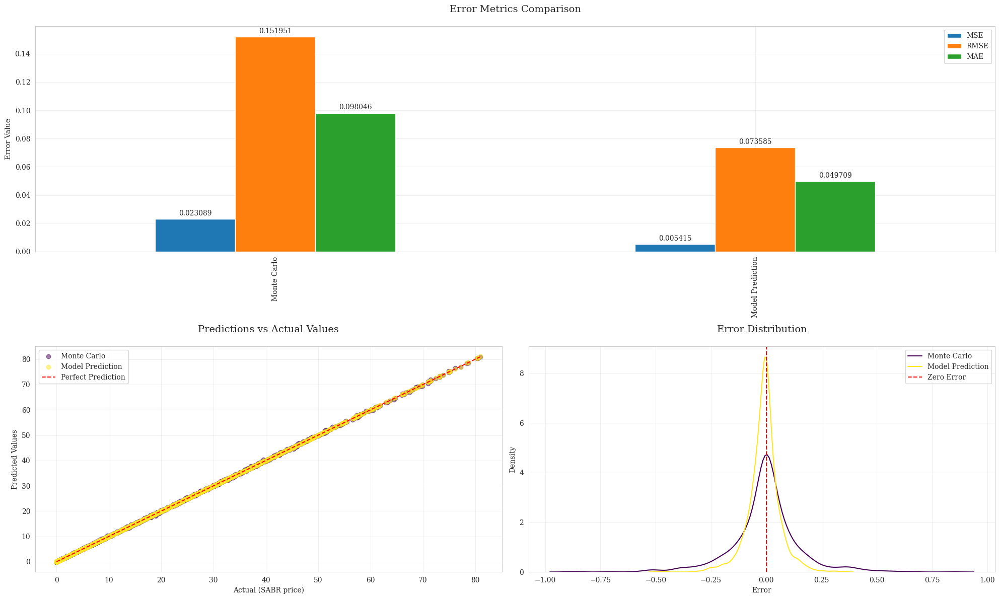


=== Model Performance Analysis ===

Error Metrics:
                          MSE         RMSE          MAE          MAPE           R2    Max Error    Mean Error    Std Error  Correlation
Monte Carlo      0.0230892573 0.1519514964 0.0980456477  5.2367762006 0.9999307388 0.8768160000 -0.0035444788 0.1519101508 0.9999655891
Model Prediction 0.0054147776 0.0735851724 0.0497092631 92.0026669804 0.9999837572 0.4820000330 -0.0107117723 0.0728013429 0.9999920527

Best Model per Metric:
----------------------------------------
MSE            : Model Prediction     (0.0054147776)
RMSE           : Model Prediction     (0.0735851724)
MAE            : Model Prediction     (0.0497092631)
MAPE           : Monte Carlo          (5.2367762006)
Max Error      : Model Prediction     (0.4820000330)
Std Error      : Model Prediction     (0.0728013429)
R2             : Model Prediction     (0.9999837572)
Correlation    : Model Prediction     (0.9999920527)

Performance Comparison:
--------------------------

In [36]:
def analyze_model_performance(
    df: pd.DataFrame,
    target_col: str = 'SABR price',
    models: dict = None,
    figsize: tuple = (20, 12)
) -> pd.DataFrame:
    """
    Analyze and compare model performances against target values.
    
    Args:
        df: DataFrame containing the price predictions
        target_col: Name of the target price column
        models: Dictionary of model names and their columns
        figsize: Figure size for plots
    
    Returns:
        DataFrame containing error metrics for each model
    """
    if models is None:
        models = {
            'Monte Carlo': 'Monte Carlo',
            'Model Prediction': 'Model Prediction'
        }
    
    # Clean data
    columns_to_check = [target_col] + list(models.values())
    df_cleaned = df.dropna(subset=columns_to_check).copy()
    
    # Calculate error metrics
    metrics = {}
    for model_name, col in models.items():
        predictions = df_cleaned[col]
        actual = df_cleaned[target_col]
        
        # Calculate various error metrics
        metrics[model_name] = {
            'MSE': mean_squared_error(actual, predictions),
            'RMSE': np.sqrt(mean_squared_error(actual, predictions)),
            'MAE': mean_absolute_error(actual, predictions),
            'MAPE': np.mean(np.abs((actual - predictions) / actual)) * 100,
            'R2': r2_score(actual, predictions),
            'Max Error': np.max(np.abs(actual - predictions)),
            'Mean Error': np.mean(predictions - actual),
            'Std Error': np.std(predictions - actual),
            'Correlation': np.corrcoef(actual, predictions)[0,1]
        }
    
    # Convert to DataFrame
    metrics_df = pd.DataFrame.from_dict(metrics, orient='index')
    
    # Create visualizations
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(2, 2)
    
    # Error Metrics Comparison (Bar Plot)
    ax1 = fig.add_subplot(gs[0, :])
    metrics_to_plot = ['MSE', 'RMSE', 'MAE']
    metrics_df[metrics_to_plot].plot(kind='bar', ax=ax1)
    ax1.set_title('Error Metrics Comparison', fontsize=14, pad=20)
    ax1.set_ylabel('Error Value')
    ax1.grid(True, alpha=0.3)
    
    # Add value labels on bars
    for container in ax1.containers:
        ax1.bar_label(container, fmt='%.6f', padding=3)
    
    # Scatter Plot (Predictions vs Actual)
    ax2 = fig.add_subplot(gs[1, 0])
    colors = plt.cm.viridis(np.linspace(0, 1, len(models)))
    
    for (model_name, col), color in zip(models.items(), colors):
        ax2.scatter(df_cleaned[target_col], df_cleaned[col],
                   alpha=0.5, label=model_name, color=color)
    
    # Add perfect prediction line
    min_val = df_cleaned[columns_to_check].min().min()
    max_val = df_cleaned[columns_to_check].max().max()
    ax2.plot([min_val, max_val], [min_val, max_val],
             'r--', label='Perfect Prediction')
    
    ax2.set_title('Predictions vs Actual Values', fontsize=14, pad=20)
    ax2.set_xlabel(f'Actual ({target_col})')
    ax2.set_ylabel('Predicted Values')
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    
    # Error Distribution
    ax3 = fig.add_subplot(gs[1, 1])
    for (model_name, col), color in zip(models.items(), colors):
        errors = df_cleaned[col] - df_cleaned[target_col]
        sns.kdeplot(errors, label=model_name, color=color, ax=ax3)
    
    ax3.axvline(0, color='r', linestyle='--', label='Zero Error')
    ax3.set_title('Error Distribution', fontsize=14, pad=20)
    ax3.set_xlabel('Error')
    ax3.set_ylabel('Density')
    ax3.grid(True, alpha=0.3)
    ax3.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed analysis
    print("\n=== Model Performance Analysis ===")
    print("\nError Metrics:")
    print(metrics_df.to_string(float_format=lambda x: '{:.10f}'.format(x)))
    
    print("\nBest Model per Metric:")
    print("-" * 40)
    
    metrics_to_minimize = ['MSE', 'RMSE', 'MAE', 'MAPE', 'Max Error', 'Std Error']
    metrics_to_maximize = ['R2', 'Correlation']
    
    for metric in metrics_to_minimize:
        best_model = metrics_df[metric].idxmin()
        best_value = metrics_df[metric].min()
        print(f"{metric:15s}: {best_model:20s} ({best_value:.10f})")
    
    for metric in metrics_to_maximize:
        best_model = metrics_df[metric].idxmax()
        best_value = metrics_df[metric].max()
        print(f"{metric:15s}: {best_model:20s} ({best_value:.10f})")
    
    # Calculate percentage improvement
    print("\nPerformance Comparison:")
    print("-" * 40)
    base_model = 'Monte Carlo'
    for metric in metrics_to_minimize:
        base_value = metrics_df.loc[base_model, metric]
        for model in metrics_df.index:
            if model != base_model:
                current_value = metrics_df.loc[model, metric]
                improvement = (base_value - current_value) / base_value * 100
                print(f"{model} vs {base_model} ({metric}): {improvement:+.2f}% improvement")
    
    return metrics_df


models = {
    'Monte Carlo': 'Monte Carlo Price',
    'Model Prediction': 'Model Prediction',
    'SABR Approximate': 'SABR Approximate Formula Price',
    'Black-Scholes': 'Black-Scholes Price'
}

# Run analysis
metrics_df = analyze_model_performance(
    results_df_sabr_price,
    target_col='True SABR Price',
    models=models,
    figsize=(20, 12)
)

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


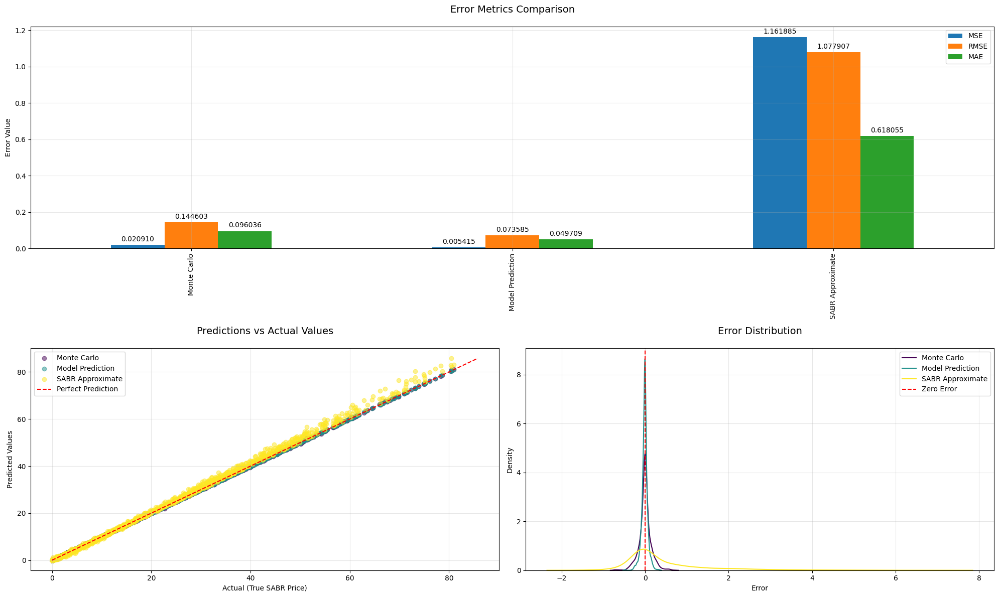


=== Model Performance Analysis ===

Error Metrics:
                          MSE         RMSE          MAE          MAPE           R2    Max Error    Mean Error    Std Error  Correlation
Monte Carlo      0.0209099739 0.1446028144 0.0960357973  3.9220394689 0.9999372761 0.7363914917  0.0002498621 0.1446025986 0.9999687224
Model Prediction 0.0054147757 0.0735851596 0.0497092619 92.0026663610 0.9999837572 0.4819984106 -0.0107117588 0.0728013320 0.9999920527
SABR Approximate 1.1618845051 1.0779074659 0.6180553840 15.8602770212 0.9965146796 7.1807001329  0.4250542466 0.9905621599 0.9994375513

Best Model per Metric:
----------------------------------------
MSE            : Model Prediction     (0.0054147757)
RMSE           : Model Prediction     (0.0735851596)
MAE            : Model Prediction     (0.0497092619)
MAPE           : Monte Carlo          (3.9220394689)
Max Error      : Model Prediction     (0.4819984106)
Std Error      : Model Prediction     (0.0728013320)
R2             : Mode

In [48]:
def analyze_model_performance(
    df: pd.DataFrame,
    target_col: str = 'SABR price',
    models: dict = None,
    figsize: tuple = (20, 12)
) -> pd.DataFrame:
    """
    Analyze and compare model performances against target values.
    
    Args:
        df: DataFrame containing the price predictions
        target_col: Name of the target price column
        models: Dictionary of model names and their columns
        figsize: Figure size for plots
    
    Returns:
        DataFrame containing error metrics for each model
    """
    if models is None:
        models = {
            'Monte Carlo': 'Monte Carlo',
            'Model Prediction': 'Model Prediction'
        }
    
    # Clean data
    columns_to_check = [target_col] + list(models.values())
    df_cleaned = df.dropna(subset=columns_to_check).copy()
    
    # Calculate error metrics
    metrics = {}
    for model_name, col in models.items():
        predictions = df_cleaned[col]
        actual = df_cleaned[target_col]
        
        # Calculate various error metrics
        metrics[model_name] = {
            'MSE': mean_squared_error(actual, predictions),
            'RMSE': np.sqrt(mean_squared_error(actual, predictions)),
            'MAE': mean_absolute_error(actual, predictions),
            'MAPE': np.mean(np.abs((actual - predictions) / actual)) * 100,
            'R2': r2_score(actual, predictions),
            'Max Error': np.max(np.abs(actual - predictions)),
            'Mean Error': np.mean(predictions - actual),
            'Std Error': np.std(predictions - actual),
            'Correlation': np.corrcoef(actual, predictions)[0,1]
        }
    
    # Convert to DataFrame
    metrics_df = pd.DataFrame.from_dict(metrics, orient='index')
    
    # Create visualizations
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(2, 2)
    
    # Error Metrics Comparison (Bar Plot)
    ax1 = fig.add_subplot(gs[0, :])
    metrics_to_plot = ['MSE', 'RMSE', 'MAE']
    metrics_df[metrics_to_plot].plot(kind='bar', ax=ax1)
    ax1.set_title('Error Metrics Comparison', fontsize=14, pad=20)
    ax1.set_ylabel('Error Value')
    ax1.grid(True, alpha=0.3)
    
    # Add value labels on bars
    for container in ax1.containers:
        ax1.bar_label(container, fmt='%.6f', padding=3)
    
    # Scatter Plot (Predictions vs Actual)
    ax2 = fig.add_subplot(gs[1, 0])
    colors = plt.cm.viridis(np.linspace(0, 1, len(models)))
    
    for (model_name, col), color in zip(models.items(), colors):
        ax2.scatter(df_cleaned[target_col], df_cleaned[col],
                   alpha=0.5, label=model_name, color=color)
    
    # Add perfect prediction line
    min_val = df_cleaned[columns_to_check].min().min()
    max_val = df_cleaned[columns_to_check].max().max()
    ax2.plot([min_val, max_val], [min_val, max_val],
             'r--', label='Perfect Prediction')
    
    ax2.set_title('Predictions vs Actual Values', fontsize=14, pad=20)
    ax2.set_xlabel(f'Actual ({target_col})')
    ax2.set_ylabel('Predicted Values')
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    
    # Error Distribution
    ax3 = fig.add_subplot(gs[1, 1])
    for (model_name, col), color in zip(models.items(), colors):
        errors = df_cleaned[col] - df_cleaned[target_col]
        sns.kdeplot(errors, label=model_name, color=color, ax=ax3)
    
    ax3.axvline(0, color='r', linestyle='--', label='Zero Error')
    ax3.set_title('Error Distribution', fontsize=14, pad=20)
    ax3.set_xlabel('Error')
    ax3.set_ylabel('Density')
    ax3.grid(True, alpha=0.3)
    ax3.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed analysis
    print("\n=== Model Performance Analysis ===")
    print("\nError Metrics:")
    print(metrics_df.to_string(float_format=lambda x: '{:.10f}'.format(x)))
    
    print("\nBest Model per Metric:")
    print("-" * 40)
    
    metrics_to_minimize = ['MSE', 'RMSE', 'MAE', 'MAPE', 'Max Error', 'Std Error']
    metrics_to_maximize = ['R2', 'Correlation']
    
    for metric in metrics_to_minimize:
        best_model = metrics_df[metric].idxmin()
        best_value = metrics_df[metric].min()
        print(f"{metric:15s}: {best_model:20s} ({best_value:.10f})")
    
    for metric in metrics_to_maximize:
        best_model = metrics_df[metric].idxmax()
        best_value = metrics_df[metric].max()
        print(f"{metric:15s}: {best_model:20s} ({best_value:.10f})")
    
    # Calculate percentage improvement
    print("\nPerformance Comparison:")
    print("-" * 40)
    base_model = 'Monte Carlo'
    for metric in metrics_to_minimize:
        base_value = metrics_df.loc[base_model, metric]
        for model in metrics_df.index:
            if model != base_model:
                current_value = metrics_df.loc[model, metric]
                improvement = (base_value - current_value) / base_value * 100
                print(f"{model} vs {base_model} ({metric}): {improvement:+.2f}% improvement")
    
    return metrics_df

models = {
    'Monte Carlo': 'Monte Carlo Price',
    'Model Prediction': 'Model Prediction',
    'SABR Approximate': 'SABR Approximate Formula Price',
}

# Run analysis
metrics_df = analyze_model_performance(
    results_df_sabr_price,
    target_col='True SABR Price',
    models=models,
    figsize=(20, 12)
)

# IMPLIED VOLATILITY

In [2]:
def implied_volatility(price, S0, K, T, r,sigma):
    func = lambda sigma: black_scholes(S0, K, T, r, sigma) - price
    try:
        return brentq(func, 0.001, 5.0)
    except ValueError:
        return np.nan

In [3]:
def black_scholes(S, K, T, r, sigma):
    if T <= 0:  # Avoid division by zero
        return max(0, S - K)
    d1 = (np.log(S / K) + (r + 0.5 * sigma**2) * T) / (sigma * np.sqrt(T))
    d2 = d1 - sigma * np.sqrt(T)
    call_price = S * norm.cdf(d1) - K * np.exp(-r * T) * norm.cdf(d2)
    return call_price

In [4]:
def sabr_monte_carlo_iv(F0, T, K, alpha, beta, rho, nu, r, N_paths, N_steps):
    """
    SABR Monte Carlo simulation for option pricing.

    Parameters:
    - F0: Initial forward price
    - T: Time to maturity
    - alpha: Initial volatility (sigma_0)
    - beta: Elasticity parameter
    - rho: Correlation between forward and volatility
    - nu: Volatility of volatility
    - r: Risk-free rate
    - n_paths: Number of Monte Carlo paths
    - n_steps: Number of time steps for the simulation

    Returns:
    - Simulated forward prices (2D array: n_paths x n_steps + 1)
    - Simulated volatilities (2D array: n_paths x n_steps + 1)
    """
    dt = 1 / N_steps  # Time step size
    
    # Initialize forward prices and volatilities
    S = np.full((N_paths, int(T * N_steps + 1)), F0)  # Forward prices (n_paths x n_steps + 1)
    sigma = np.full((N_paths, int(T * N_steps + 1)), alpha)  # Volatilities (n_paths x n_steps + 1)
    
    # Correlation matrix and Cholesky decomposition
    corr_matrix = np.array([[1, rho], [rho, 1]])
  
    L = np.linalg.cholesky(corr_matrix)  # Cholesky decomposition
    
    # Time stepping
    for step in range(int(T * N_steps)):
        # Generate independent standard normal random variables
        Z = np.random.normal(0, 1, size=(2, N_paths))  # Shape (2, n_paths)
        
        # Correlate the random variables using the Cholesky decomposition
        correlated_Z = L @ Z  # Shape (2, n_paths)
        dW = np.sqrt(dt) * correlated_Z[0]  # Correlated Brownian motion for dW_t
        dZ = np.sqrt(dt) * correlated_Z[1]  # Correlated Brownian motion for dZ_t
        
        # Update volatility process
        sigma[:, step + 1] = sigma[:, step] * np.exp(nu * dZ - 0.5 * nu**2 * dt)
        
        # Update forward price process
        S[:, step + 1] = S[:, step] + sigma[:, step] * (S[:, step] ** beta) * dW
    
    payoff = np.maximum(S[:, -1] - K, 0)
    price = np.exp(-r * T) * np.mean(payoff)
    S0 = F0 / np.exp(r * T)
    iv = implied_volatility(price, S0, K, T, r,sigma)
    return iv


In [5]:
def sabr_implied_volatility(alpha, beta, rho, nu, F, K, T):
    if F == K:
        FK_avg = F
    else:
        FK_avg = np.sqrt(F * K)  # Geometric mean
    
    # Log-moneyness
    log_FK = np.log(F / K)
    
    # Compute z and D(z)
    z = (nu / alpha) * (FK_avg ** ((1 - beta) / 2)) * log_FK
    D_z = np.log((np.sqrt(1 - 2 * rho * z + z**2) + z - rho) / (1 - rho))
    
    # A term (Numerator adjustment)
    A = (1 + ((1 - beta)**2 / 24) * (alpha**2 / (FK_avg ** (2 * (1 - beta)))) +
         (rho * beta * nu / 4) * (alpha / (FK_avg ** (1 - beta))) +
         ((2 - 3 * rho**2) / 24) * (nu**2))
    
    # B term (Denominator adjustment)
    B = (1 + ((1 - beta)**2 / 24) * (log_FK)**2 +
         ((1 - beta)**4 / 1920) * (log_FK)**4)
    
    # SABR implied volatility approximation
    sigma_impl = (alpha / (FK_avg ** ((1 - beta) / 2))) * (A / B) * (z / D_z)
    
    return sigma_impl


In [15]:
model_sabr_vol.load_state_dict(torch.load(
    '/kaggle/input/model/pytorch/default/1/mlp_SABR_vol.pth', 
    map_location=torch.device('cpu'), 
    weights_only=True
))
model_sabr_vol.eval()

model_sabr_vol_auto.load_state_dict(torch.load(
    '/kaggle/input/autoencoder_sabr/pytorch/default/1/autoencoder_SABR.pth', 
    map_location=torch.device('cpu'), 
    weights_only=True
))
model_sabr_vol_auto.eval()

# Compute number of batches
num_batches_sabr = int(0.01 * len(test_loader_sabr_vol))
print(num_batches_sabr)

results_sabr_iv = []

for i, (inputs, targets) in enumerate(tqdm(test_loader_sabr_vol, desc="Comparison")):
    if i >= num_batches_sabr:
        break

    inputs, targets = inputs.to(device), targets.to(device)

    # Model Predictions
    with torch.no_grad():
        # MLP model prediction
        start_time_model_iv = time.time()
        model_predictions_vol = model_sabr_vol(inputs).cpu().numpy()
        end_time_model_iv = time.time()
        model_prediction_time_iv = end_time_model_iv - start_time_model_iv

        # Autoencoder model prediction
        start_time_model_auto = time.time()
        model_predictions_auto = model_sabr_vol_auto(inputs).cpu().numpy()
        end_time_model_auto = time.time()
        model_prediction_time_auto = end_time_model_auto - start_time_model_auto

    # Inverse scale inputs
    inputs_original_scale = scaler_sabr_vol.inverse_transform(inputs.cpu().numpy())

    F0 = inputs_original_scale[:, 0]
    alpha = inputs_original_scale[:, 1]
    beta = inputs_original_scale[:, 2]
    rho =  inputs_original_scale[:, 3]
    nu = inputs_original_scale[:, 4]
    r = inputs_original_scale[:, 5]
    T = inputs_original_scale[:, 6]
    K = inputs_original_scale[:, 7]
    BS_price = inputs_original_scale[:, 8]
    SABR_price = inputs_original_scale[:, 9]

    # Monte Carlo and Approximate IV
    individual_mc_times_iv = []
    mc_prices_iv = []

    for f, k, ri, ni, rho1, alpha1, t in zip(F0, K, r, nu, rho, alpha, T):
        start = time.time()
        price = sabr_monte_carlo_iv(f, t, k, alpha1, 1, rho1, ni, ri, 10000, 252)
        mc_prices_iv.append(price)
        individual_mc_times_iv.append(time.time() - start)

    individual_mc_times_iv_approx = []
    approx_iv = []

    for f, k, ri, ni, rho1, alpha1, t, beta1 in zip(F0, K, r, nu, rho, alpha, T, beta):
        start = time.time()
        approx_iv.append(sabr_implied_volatility(alpha1, beta1, rho1, ni, f, k, t))
        individual_mc_times_iv_approx.append(time.time() - start)

    targets_numpy = targets.cpu().numpy()

    # === Combine Results ===
    for mc_price_iv, model_price_iv, auto_price_iv, monte_carlo_time_iv, mc_times_iv_approx, approx_iv1, true_price_iv in zip(
        mc_prices_iv, model_predictions_vol, model_predictions_auto,
        individual_mc_times_iv, individual_mc_times_iv_approx,
        approx_iv, targets_numpy):

        results_sabr_iv.append({
            'Targets': true_price_iv,
            'Monte Carlo': mc_price_iv,
            'Monte Carlo Time': monte_carlo_time_iv,
            'Model Prediction (MLP)': model_price_iv.item(),
            'Model Prediction Time (MLP)': model_prediction_time_iv,
            'Model Prediction (Autoencoder)': auto_price_iv.item(),
            'Model Prediction Time (Autoencoder)': model_prediction_time_auto,
            'Approx IV': approx_iv1,
            'Approx IV Time': mc_times_iv_approx
        })

# Create DataFrame from results
results_df_sabr_iv = pd.DataFrame(results_sabr_iv)

# Show first few rows
results_df_sabr_iv.head(10)

15


Comparison:   1%|          | 15/1524 [21:57<36:49:37, 87.86s/it]


,Targets,Monte Carlo,Monte Carlo Time,Model Prediction (MLP),Model Prediction Time (MLP),Model Prediction (Autoencoder),Model Prediction Time (Autoencoder),Approx IV,Approx IV Time
0,0.212685,0.215813,0.559024,0.212994,0.030478,0.212078,0.042295,0.213129,0.000075
1,0.230193,0.226647,0.643631,0.229413,0.030478,0.230322,0.042295,0.224754,0.000045
2,0.167094,0.163694,0.647951,0.166382,0.030478,0.169403,0.042295,0.160922,0.000062
3,0.232981,0.242384,0.533595,0.234411,0.030478,0.233637,0.042295,0.235372,0.000044
4,0.210601,0.208692,0.350802,0.210667,0.030478,0.210505,0.042295,0.209987,0.000043
5,0.308576,0.302101,0.706066,0.315270,0.030478,0.309458,0.042295,0.304284,0.000043
6,0.277576,0.247759,0.448635,0.275891,0.030478,0.278968,0.042295,0.262394,0.000052
7,0.158549,0.163774,0.649136,0.160547,0.030478,0.158824,0.042295,0.158791,0.000043
8,0.212861,0.211379,0.064885,0.213549,0.030478,0.213450,0.042295,0.214020,0.000042
9,0.165843,0.168601,0.237089,0.168548,0.030478,0.166030,0.042295,0.167069,0.000042


In [16]:
results_df_sabr_iv.to_csv("/kaggle/working/results_SABR_price_IV.csv", index=False)

In [35]:
results_df_sabr_iv = pd.read_csv("/kaggle/input/result-iv1/results_SABR_price_IV (1).csv")

# Display the first few rows
results_df_sabr_iv.head()

,Targets,Monte Carlo,Monte Carlo Time,Model Prediction (MLP),Model Prediction Time (MLP),Model Prediction (Autoencoder),Model Prediction Time (Autoencoder),Approx IV,Approx IV Time
0,0.212685,0.215813,0.559024,0.212994,0.030478,0.212078,0.042295,0.213129,0.000075
1,0.230193,0.226647,0.643631,0.229413,0.030478,0.230322,0.042295,0.224754,0.000045
2,0.167094,0.163694,0.647951,0.166382,0.030478,0.169403,0.042295,0.160922,0.000062
3,0.232981,0.242384,0.533595,0.234411,0.030478,0.233637,0.042295,0.235372,0.000044
4,0.210601,0.208692,0.350802,0.210667,0.030478,0.210505,0.042295,0.209987,0.000043


Original samples: 3840
Cleaned samples: 3533
Removed samples: 307


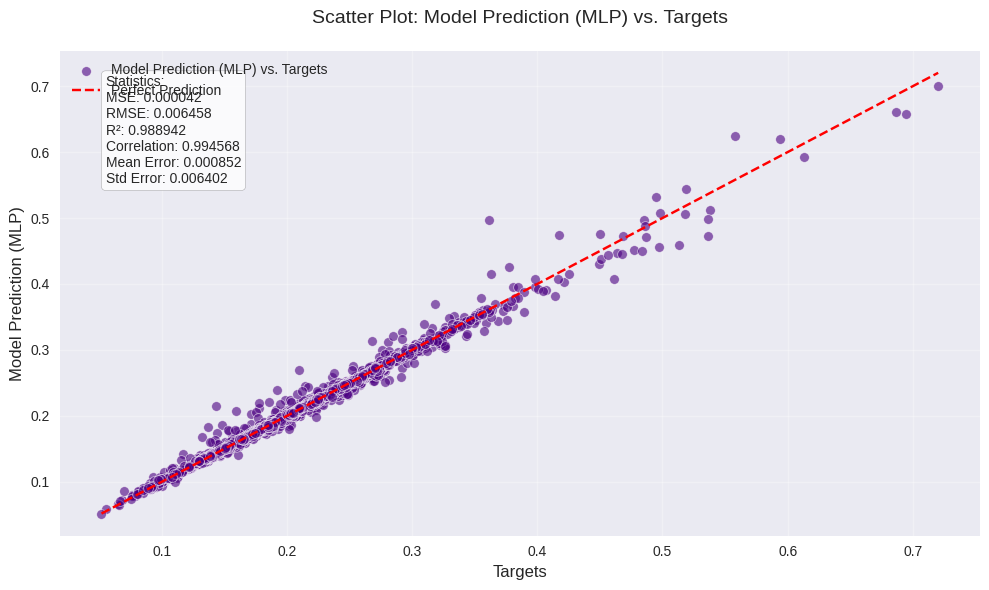

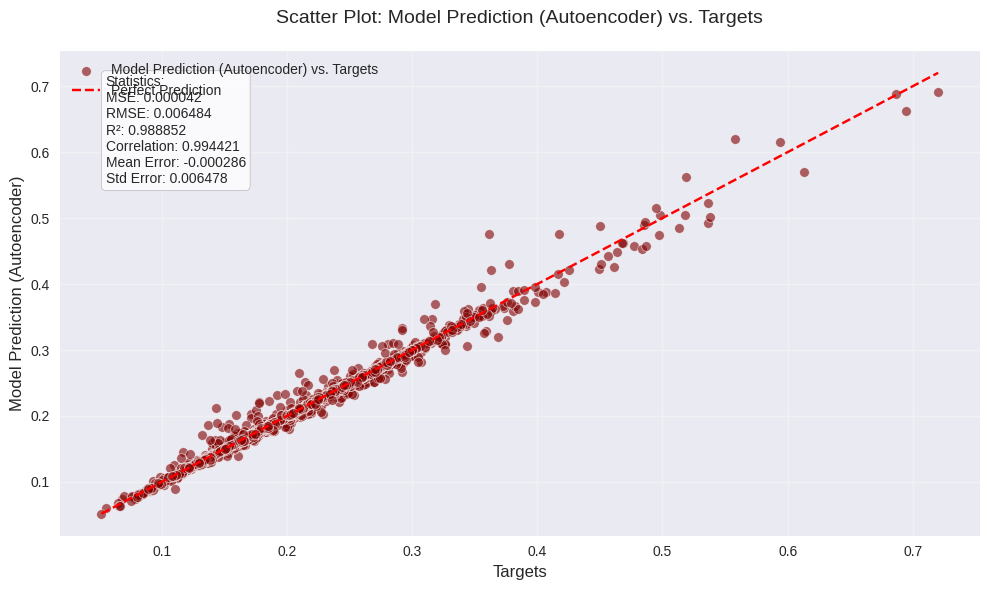

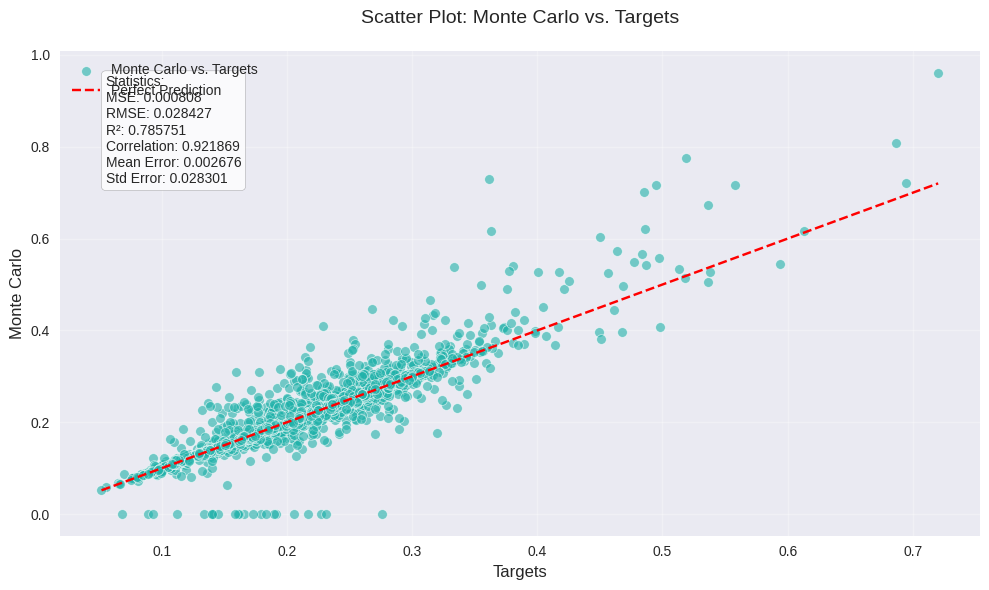

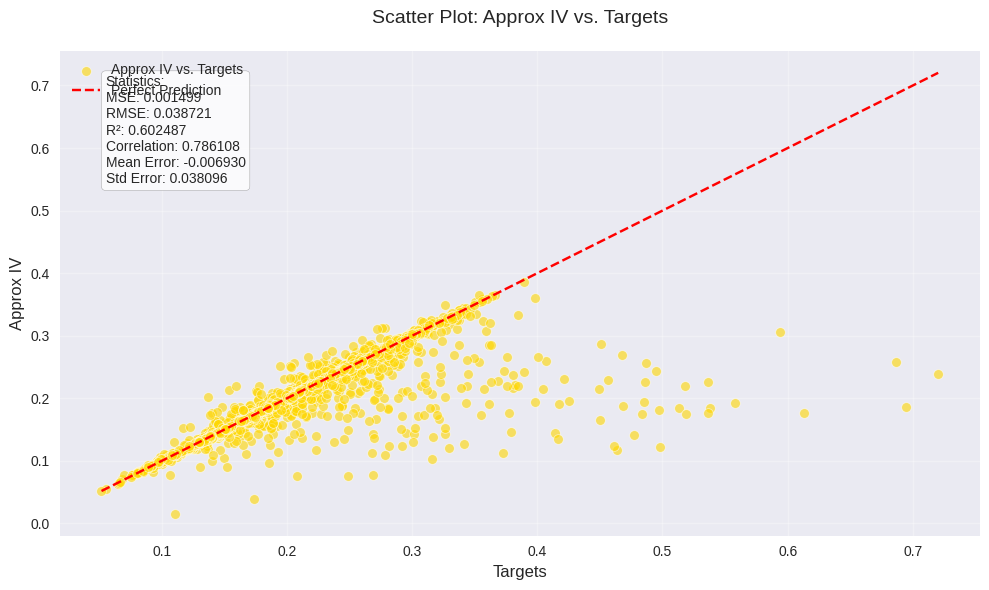

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

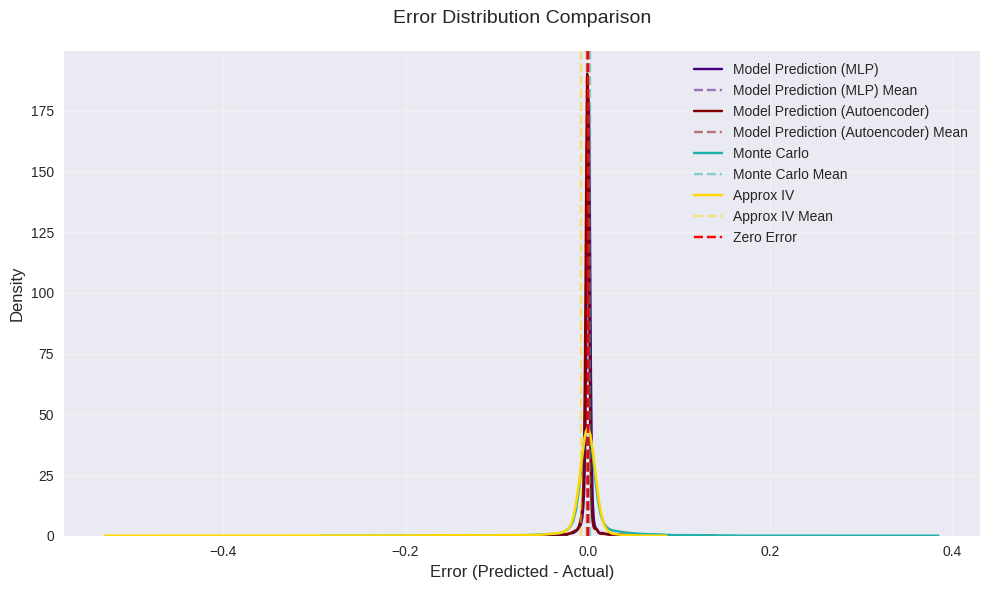


=== Model Performance Comparison ===

Metrics Summary:
                                        MSE         RMSE           R2  Correlation    Mean Error    Std Error
Model Prediction (MLP)         0.0000417071 0.0064581072 0.9889422903 0.9945684817  0.0008517798 0.0064016889
Model Prediction (Autoencoder) 0.0000420487 0.0064844951 0.9888517419 0.9944212512 -0.0002859561 0.0064781869
Monte Carlo                    0.0008080965 0.0284270383 0.7857514416 0.9218687007  0.0026761056 0.0283007944
Approx IV                      0.0014993279 0.0387211561 0.6024870242 0.7861077520 -0.0069299508 0.0380959802

Relative Improvements over Model Prediction (MLP):
----------------------------------------
Model Prediction (Autoencoder): -0.82% improvement in MSE
Monte Carlo: -1837.55% improvement in MSE
Approx IV: -3494.89% improvement in MSE


In [36]:
def analyze_model_predictions_separate(
    df: pd.DataFrame,
    models: dict,
    target_col: str = 'Targets',
    figsize: tuple = (10, 6),
    colors = {
    'Model Prediction (MLP)': '#4B0082',         # Deep Purple
    'Model Prediction (Autoencoder)': '#800000', # Maroon
    'Monte Carlo': '#20B2AA',                    # Light Sea Green
    'Approx IV': '#FFD700'                       # Yellow
    }
) -> None:
    """
    Create separate scatter plots for each model's predictions.
    """
    # Clean data
    columns_to_check = [target_col] + list(models.values())
    df_cleaned = df.dropna(subset=columns_to_check).copy()
    
    print(f"Original samples: {len(df)}")
    print(f"Cleaned samples: {len(df_cleaned)}")
    print(f"Removed samples: {len(df) - len(df_cleaned)}")
    
    # Calculate metrics for all models
    metrics = {}
    
    for model_name, col in models.items():
        # Create figure for this model
        plt.figure(figsize=figsize)
        
        # Scatter plot
        sns.scatterplot(
            data=df_cleaned,
            x=target_col,
            y=col,
            alpha=0.6,
            label=f"{model_name} vs. {target_col}",
            color=colors[model_name]
        )
        
        # Add perfect prediction line
        min_val = df_cleaned[target_col].min()
        max_val = df_cleaned[target_col].max()
        plt.plot([min_val, max_val], [min_val, max_val],
                'r--', label="Perfect Prediction")
        
        # Calculate statistics
        mse = mean_squared_error(df_cleaned[target_col], df_cleaned[col])
        rmse = np.sqrt(mse)
        r2 = r2_score(df_cleaned[target_col], df_cleaned[col])
        correlation = np.corrcoef(df_cleaned[target_col], df_cleaned[col])[0,1]
        mean_error = np.mean(df_cleaned[col] - df_cleaned[target_col])
        std_error = np.std(df_cleaned[col] - df_cleaned[target_col])
        
        metrics[model_name] = {
            'MSE': mse,
            'RMSE': rmse,
            'R2': r2,
            'Correlation': correlation,
            'Mean Error': mean_error,
            'Std Error': std_error
        }
        
        # Add statistics text box
        stats_text = (
            f'Statistics:\n'
            f'MSE: {mse:.6f}\n'
            f'RMSE: {rmse:.6f}\n'
            f'R²: {r2:.6f}\n'
            f'Correlation: {correlation:.6f}\n'
            f'Mean Error: {mean_error:.6f}\n'
            f'Std Error: {std_error:.6f}'
        )
        
        plt.text(
            0.05, 0.95,
            stats_text,
            transform=plt.gca().transAxes,
            fontsize=10,
            verticalalignment='top',
            bbox=dict(
                boxstyle='round',
                facecolor='white',
                alpha=0.8,
                edgecolor='gray'
            )
        )
        
        plt.xlabel(target_col, fontsize=12)
        plt.ylabel(f"{model_name}", fontsize=12)
        plt.title(f"Scatter Plot: {model_name} vs. {target_col}", fontsize=14, pad=20)
        plt.legend(fontsize=10)
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
    
    # Create error distribution plot
    plt.figure(figsize=figsize)
    
    for model_name, col in models.items():
        errors = df_cleaned[col] - df_cleaned[target_col]
        sns.kdeplot(
            errors,
            label=model_name,
            color=colors[model_name]
        )
        
        # Add vertical line for mean error
        mean_error = errors.mean()
        plt.axvline(
            mean_error,
            color=colors[model_name],
            linestyle='--',
            alpha=0.5,
            label=f"{model_name} Mean"
        )
    
    plt.axvline(0, color='r', linestyle='--', label='Zero Error')
    plt.xlabel("Error (Predicted - Actual)", fontsize=12)
    plt.ylabel("Density", fontsize=12)
    plt.title("Error Distribution Comparison", fontsize=14, pad=20)
    plt.legend(fontsize=10)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Print comparison analysis
    print("\n=== Model Performance Comparison ===")
    metrics_df = pd.DataFrame.from_dict(metrics, orient='index')
    print("\nMetrics Summary:")
    print(metrics_df.to_string(float_format=lambda x: '{:.10f}'.format(x)))
    
    # Calculate relative improvements
    base_model = list(models.keys())[0]
    print(f"\nRelative Improvements over {base_model}:")
    print("-" * 40)
    
    for model_name in models.keys():
        if model_name != base_model:
            improvement = ((metrics[base_model]['MSE'] - metrics[model_name]['MSE']) / 
                         metrics[base_model]['MSE'] * 100)
            print(f"{model_name}: {improvement:+.2f}% improvement in MSE")


models = {
    'Model Prediction (MLP)': 'Model Prediction (MLP)',
    'Model Prediction (Autoencoder)': 'Model Prediction (Autoencoder)',
    'Monte Carlo': 'Monte Carlo',
    'Approx IV': 'Approx IV'
}

analyze_model_predictions_separate(
    results_df_sabr_iv,
    models,
    target_col='Targets',
    figsize=(10, 6)
)

<ipython-input-37-a545dcadce38>:18: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


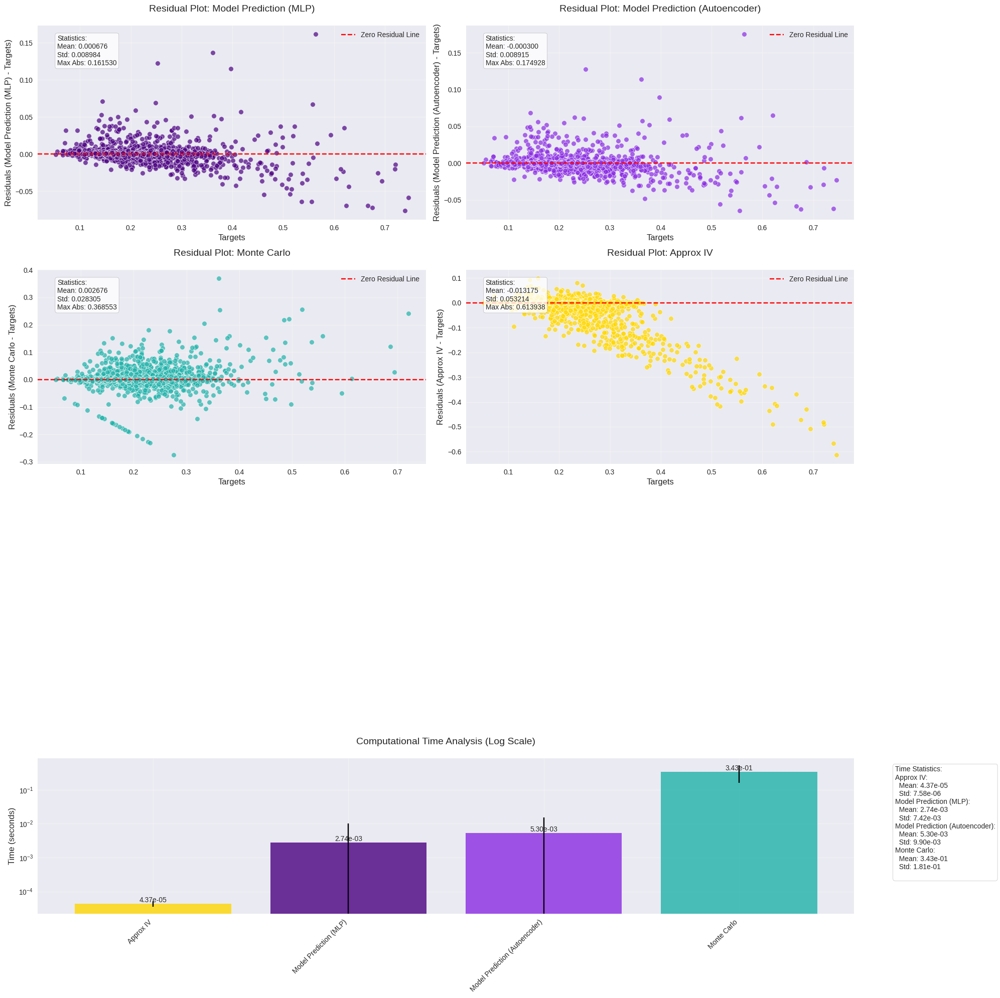


=== Model Analysis Summary ===

Residual Statistics:

Model Prediction (MLP):
Mean Residual: 0.000676
Std Residual: 0.008984
Max Absolute Residual: 0.161530
Within 1 std dev: 90.91%
Within 2 std dev: 95.86%

Model Prediction (Autoencoder):
Mean Residual: -0.000300
Std Residual: 0.008915
Max Absolute Residual: 0.174928
Within 1 std dev: 90.65%
Within 2 std dev: 95.62%

Monte Carlo:
Mean Residual: 0.002676
Std Residual: 0.028305
Max Absolute Residual: 0.368553
Within 1 std dev: 82.45%
Within 2 std dev: 87.47%

Approx IV:
Mean Residual: -0.013175
Std Residual: 0.053214
Max Absolute Residual: 0.613938
Within 1 std dev: 92.29%
Within 2 std dev: 95.29%

Timing Analysis:
Approx IV: 7857.80x faster than Monte Carlo
Model Prediction (MLP): 125.26x faster than Monte Carlo
Model Prediction (Autoencoder): 64.73x faster than Monte Carlo
Monte Carlo: 1.00x faster than Monte Carlo


/usr/local/lib/python3.10/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in less_equal
  return op(a, b)


In [37]:
def analyze_model_residuals_and_timing(
    df: pd.DataFrame,
    models: dict,
    target_col: str = 'Targets',
    figsize: tuple = (20, 20),  
    colors: dict = {
        'Model Prediction (MLP)': '#4B0082',  # Deep Purple
        'Model Prediction (Autoencoder)': '#8A2BE2',  # Blue Violet
        'Monte Carlo': '#20B2AA',       # Light Sea Green
        'Approx IV': '#FFD700'          # Yellow
    }
) -> None:
    """
    Create comprehensive analysis of model residuals and computational times.
    Handles multiple model predictions including MLP and Autoencoder models.
    """
    # Set style
    plt.style.use('seaborn')

    # Create figure with subplots 
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(4, 2, height_ratios=[1, 1, 1, 0.8])

    # Calculate residuals for each model
    for model_name, cols in models.items():
        if f"Residuals_{model_name}" not in df.columns:
            df[f"Residuals_{model_name}"] = df[cols['predicted']] - df[target_col]

    # Plot residuals for each model
    for idx, (model_name, cols) in enumerate(models.items()):
        # Residual scatter plot
        ax = fig.add_subplot(gs[idx // 2, idx % 2])

        sns.scatterplot(
            data=df,
            x=target_col,
            y=f"Residuals_{model_name}",
            alpha=0.7,
            color=colors.get(model_name, 'gray'),  # Fallback color
            ax=ax
        )

        ax.axhline(0, color='r', linestyle='--', label="Zero Residual Line")

        # Calculate statistics
        mean_residual = df[f"Residuals_{model_name}"].mean()
        std_residual = df[f"Residuals_{model_name}"].std()
        max_abs_residual = abs(df[f"Residuals_{model_name}"]).max()

        # Add statistics text box
        stats_text = (
            f'Statistics:\n'
            f'Mean: {mean_residual:.6f}\n'
            f'Std: {std_residual:.6f}\n'
            f'Max Abs: {max_abs_residual:.6f}'
        )

        ax.text(
            0.05, 0.95,
            stats_text,
            transform=ax.transAxes,
            fontsize=10,
            verticalalignment='top',
            bbox=dict(
                boxstyle='round',
                facecolor='white',
                alpha=0.8,
                edgecolor='gray'
            )
        )

        ax.set_title(f"Residual Plot: {model_name}", fontsize=14, pad=20)
        ax.set_xlabel(target_col, fontsize=12)
        ax.set_ylabel(f"Residuals ({model_name} - {target_col})", fontsize=12)
        ax.legend(fontsize=10)
        ax.grid(True, alpha=0.3)

    # Computational time analysis
    ax_time = fig.add_subplot(gs[3, :])

    # Calculate timing statistics
    time_stats = df[[cols['time'] for cols in models.values()]].agg(['mean', 'std']).T
    time_stats.index = models.keys()
    time_stats = time_stats.sort_values('mean')

    # Create bar plot with matching colors
    bars = ax_time.bar(
        range(len(time_stats)),
        time_stats['mean'],
        yerr=time_stats['std'],
        alpha=0.8,
        capsize=5,
        color=[colors.get(model, 'gray') for model in time_stats.index]  # Fallback color
    )

    # Customize time plot
    ax_time.set_yscale('log')
    ax_time.set_xticks(range(len(time_stats)))
    ax_time.set_xticklabels(time_stats.index, rotation=45, ha='right')
    ax_time.set_title("Computational Time Analysis (Log Scale)", fontsize=14, pad=20)
    ax_time.set_ylabel("Time (seconds)", fontsize=12)
    ax_time.grid(True, alpha=0.3)

    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        ax_time.text(
            bar.get_x() + bar.get_width()/2.,
            height,
            f'{height:.2e}',
            ha='center',
            va='bottom',
            rotation=0
        )

    # Add timing statistics text box
    time_text = "Time Statistics:\n"
    for method in time_stats.index:
        mean_time = time_stats.loc[method, 'mean']
        std_time = time_stats.loc[method, 'std']
        time_text += f'{method}:\n  Mean: {mean_time:.2e}\n  Std: {std_time:.2e}\n'

    ax_time.text(
        1.05, 0.95,
        time_text,
        transform=ax_time.transAxes,
        fontsize=10,
        verticalalignment='top',
        bbox=dict(
            boxstyle='round',
            facecolor='white',
            alpha=0.8,
            edgecolor='gray'
        )
    )

    plt.tight_layout()
    plt.show()

    # Print additional analysis
    print("\n=== Model Analysis Summary ===")

    # Residual analysis
    print("\nResidual Statistics:")
    for model_name in models:
        residuals = df[f"Residuals_{model_name}"]
        print(f"\n{model_name}:")
        print(f"Mean Residual: {residuals.mean():.6f}")
        print(f"Std Residual: {residuals.std():.6f}")
        print(f"Max Absolute Residual: {abs(residuals).max():.6f}")

        # Calculate proportion within standard deviations
        within_1_std = np.sum(np.abs(residuals) <= residuals.std()) / len(residuals) * 100
        within_2_std = np.sum(np.abs(residuals) <= 2*residuals.std()) / len(residuals) * 100

        print(f"Within 1 std dev: {within_1_std:.2f}%")
        print(f"Within 2 std dev: {within_2_std:.2f}%")

    # Timing analysis
    print("\nTiming Analysis:")
    slowest_method = time_stats['mean'].idxmax()
    slowest_time = time_stats.loc[slowest_method, 'mean']

    for method in time_stats.index:
        speedup = slowest_time / time_stats.loc[method, 'mean']
        print(f"{method}: {speedup:.2f}x faster than {slowest_method}")

models = {
    'Model Prediction (MLP)': {
        'predicted': 'Model Prediction (MLP)',
        'time': 'Model Prediction Time (MLP)'
    },
    'Model Prediction (Autoencoder)': {
        'predicted': 'Model Prediction (Autoencoder)',
        'time': 'Model Prediction Time (Autoencoder)'
    },
    'Monte Carlo': {
        'predicted': 'Monte Carlo',
        'time': 'Monte Carlo Time'
    },
    'Approx IV': {
        'predicted': 'Approx IV',
        'time': 'Approx IV Time'
    }
}

# Run analysis
analyze_model_residuals_and_timing(
    results_df_sabr_iv,  
    models,
    target_col='Targets',
    figsize=(20, 20)  
)

<ipython-input-41-7199dd87f9a3>:12: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')
/usr/local/lib/python3.10/dist-packages/pandas/core/computation/expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
<ipython-input-41-7199dd87f9a3>:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels([model for model in models.keys()], rotation=15, ha='right')
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_o

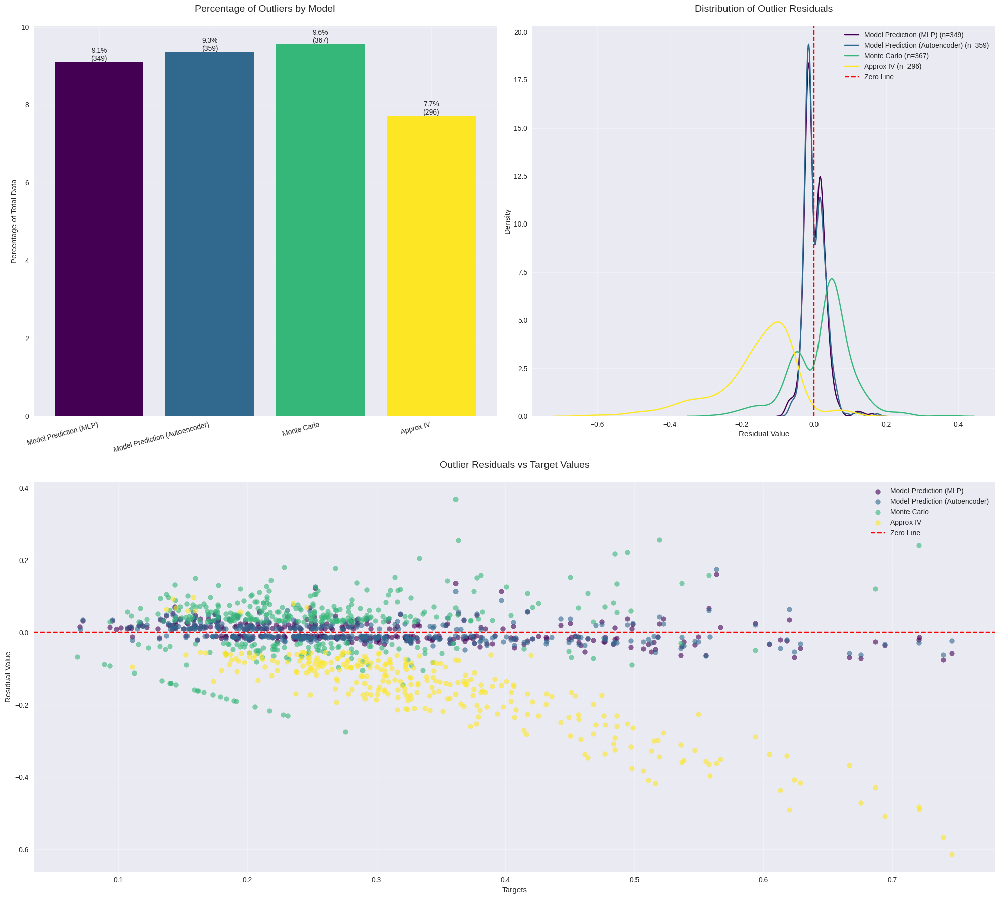


=== Outlier Analysis Summary ===
Threshold: 1.0 standard deviation(s)

Model Prediction (MLP):
--------------------------------------------------
Threshold value: ±0.008984
Number of outliers: 349 (9.09%)

Outlier Statistics:
Mean residual: 0.001102
Std residual: 0.028920
Min residual: -0.076183
Max residual: 0.161530

Outlier Direction:
Positive: 158 (45.27%)
Negative: 191 (54.73%)

Most Extreme Outliers:
       Targets  Approx IV  Residuals_Model Prediction (MLP)
2074  0.563649   0.201085                          0.161530
678   0.361177   0.285347                          0.136446
795   0.252535   0.228560                          0.122885

Model Prediction (Autoencoder):
--------------------------------------------------
Threshold value: ±0.008915
Number of outliers: 359 (9.35%)

Outlier Statistics:
Mean residual: 0.001880
Std residual: 0.028259
Min residual: -0.064486
Max residual: 0.174928

Outlier Direction:
Positive: 160 (44.57%)
Negative: 199 (55.43%)

Most Extreme Outliers:
 

In [41]:
def analyze_outliers(
    df: pd.DataFrame,
    models: dict,
    target_col: str = 'Targets',
    n_std: float = 1.0,
    figsize: tuple = (20, 18)  
) -> dict:
    """
    Perform comprehensive outlier analysis for multiple models including MLP and Autoencoder.
    """
    # Set style
    plt.style.use('seaborn')
    colors = plt.cm.viridis(np.linspace(0, 1, len(models)))
    
    # Create figure
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(2, 2)
    
    outlier_results = {}
    
    # Calculate residuals and identify outliers for each model
    for model_name, cols in models.items():
        # Calculate residuals
        residual_col = f"Residuals_{model_name}"
        df[residual_col] = df[cols['predicted']] - df[target_col]
        
        # Calculate threshold
        threshold = n_std * df[residual_col].std()
        
        # Identify outliers
        outliers = df[np.abs(df[residual_col]) > threshold].copy()
        outlier_results[model_name] = {
            'outliers': outliers,
            'threshold': threshold,
            'residual_col': residual_col
        }
    
    # Outlier counts comparison
    ax1 = fig.add_subplot(gs[0, 0])
    
    outlier_counts = [len(result['outliers']) for result in outlier_results.values()]
    outlier_percentages = [count/len(df)*100 for count in outlier_counts]
    
    bars = ax1.bar(models.keys(), outlier_percentages, color=colors)
    
    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        ax1.text(
            bar.get_x() + bar.get_width()/2.,
            height,
            f'{height:.1f}%\n({int(height*len(df)/100)})',
            ha='center',
            va='bottom'
        )
    
    ax1.set_title('Percentage of Outliers by Model', fontsize=14, pad=20)
    ax1.set_ylabel('Percentage of Total Data')
    ax1.set_xticklabels([model for model in models.keys()], rotation=15, ha='right')
    ax1.grid(True, alpha=0.3)
    
    # Outlier distribution
    ax2 = fig.add_subplot(gs[0, 1])
    
    for (model_name, result), color in zip(outlier_results.items(), colors):
        outliers = result['outliers']
        residual_col = result['residual_col']
        if len(outliers) > 0:  # Only plot if there are outliers
            sns.kdeplot(
                outliers[residual_col],
                label=f"{model_name} (n={len(outliers)})",
                color=color,
                ax=ax2
            )
    
    ax2.axvline(0, color='r', linestyle='--', label='Zero Line')
    ax2.set_title('Distribution of Outlier Residuals', fontsize=14, pad=20)
    ax2.set_xlabel('Residual Value')
    ax2.set_ylabel('Density')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # Scatter plot of outliers
    ax3 = fig.add_subplot(gs[1, :])
    
    for (model_name, result), color in zip(outlier_results.items(), colors):
        outliers = result['outliers']
        residual_col = result['residual_col']
        ax3.scatter(
            outliers[target_col],
            outliers[residual_col],
            alpha=0.6,
            label=f"{model_name}",
            color=color
        )
    
    ax3.axhline(0, color='r', linestyle='--', label='Zero Line')
    ax3.set_title('Outlier Residuals vs Target Values', fontsize=14, pad=20)
    ax3.set_xlabel(target_col)
    ax3.set_ylabel('Residual Value')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed analysis
    print("\n=== Outlier Analysis Summary ===")
    print(f"Threshold: {n_std} standard deviation(s)")
    
    for model_name, result in outlier_results.items():
        outliers = result['outliers']
        residual_col = result['residual_col']
        threshold = result['threshold']
        
        print(f"\n{model_name}:")
        print("-" * 50)
        print(f"Threshold value: ±{threshold:.6f}")
        print(f"Number of outliers: {len(outliers)} ({len(outliers)/len(df)*100:.2f}%)")
        
        if len(outliers) > 0:
            print("\nOutlier Statistics:")
            print(f"Mean residual: {outliers[residual_col].mean():.6f}")
            print(f"Std residual: {outliers[residual_col].std():.6f}")
            print(f"Min residual: {outliers[residual_col].min():.6f}")
            print(f"Max residual: {outliers[residual_col].max():.6f}")
            
            # Calculate proportion of positive/negative outliers
            pos_outliers = (outliers[residual_col] > 0).sum()
            neg_outliers = (outliers[residual_col] < 0).sum()
            
            print("\nOutlier Direction:")
            print(f"Positive: {pos_outliers} ({pos_outliers/len(outliers)*100:.2f}%)")
            print(f"Negative: {neg_outliers} ({neg_outliers/len(outliers)*100:.2f}%)")
            
            # Show extreme cases
            print("\nMost Extreme Outliers:")
            # Sort by absolute value of residuals
            extreme_outliers = outliers.copy()
            extreme_outliers['abs_residual'] = extreme_outliers[residual_col].abs()
            extreme_outliers = extreme_outliers.nlargest(3, 'abs_residual')
            print(extreme_outliers[[target_col, cols['predicted'], residual_col]].to_string())
            
    return outlier_results


models = {
    'Model Prediction (MLP)': {
        'predicted': 'Model Prediction (MLP)',
        'time': 'Model Prediction Time (MLP)'
    },
    'Model Prediction (Autoencoder)': {
        'predicted': 'Model Prediction (Autoencoder)',
        'time': 'Model Prediction Time (Autoencoder)'
    },
    'Monte Carlo': {
        'predicted': 'Monte Carlo',
        'time': 'Monte Carlo Time'
    },
    'Approx IV': {
        'predicted': 'Approx IV',
        'time': 'Approx IV Time'
    }
}

# Run analysis
outlier_results = analyze_outliers(
    results_df_sabr_iv,
    models,
    target_col='Targets',
    n_std=1.0,  
    figsize=(20, 18)  
)


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


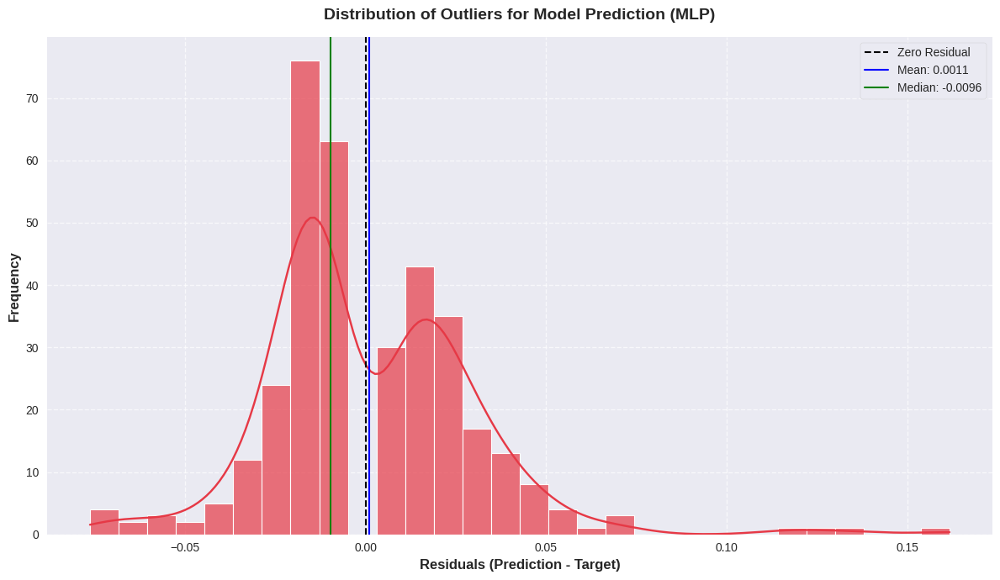

In [42]:
selected_model = 'Model Prediction (MLP)'

# Extract the outliers DataFrame and residual column name
outliers = outlier_results[selected_model]['outliers']
residual_col = outlier_results[selected_model]['residual_col']


plt.figure(figsize=(12, 7))

# Create the histogram
ax = sns.histplot(
    outliers[residual_col], 
    bins=30, 
    kde=True, 
    color="#E63946",  
    alpha=0.7,
    edgecolor='white',
    linewidth=0.8
)

# Add mean and median lines
mean_residual = outliers[residual_col].mean()
median_residual = outliers[residual_col].median()

plt.axvline(0, color='black', linestyle='--', linewidth=1.5, label="Zero Residual")
plt.axvline(mean_residual, color='blue', linestyle='-', linewidth=1.5, label=f"Mean: {mean_residual:.4f}")
plt.axvline(median_residual, color='green', linestyle='-', linewidth=1.5, label=f"Median: {median_residual:.4f}")

# Axis labels
plt.xlabel("Residuals (Prediction - Target)", fontsize=12, fontweight='bold')
plt.ylabel("Frequency", fontsize=12, fontweight='bold')

# Title and grid
plt.title(f"Distribution of Outliers for {selected_model}", fontsize=14, fontweight='bold', pad=15)
plt.grid(True, linestyle='--', alpha=0.7)

# Legend and annotation
plt.legend(frameon=True, framealpha=1, loc='upper right')
plt.annotate(f'n = {len(outliers)}', 
             xy=(0.95, 0.95), 
             xycoords='axes fraction', 
             ha='right', 
             va='top', 
             fontsize=11,
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))

plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

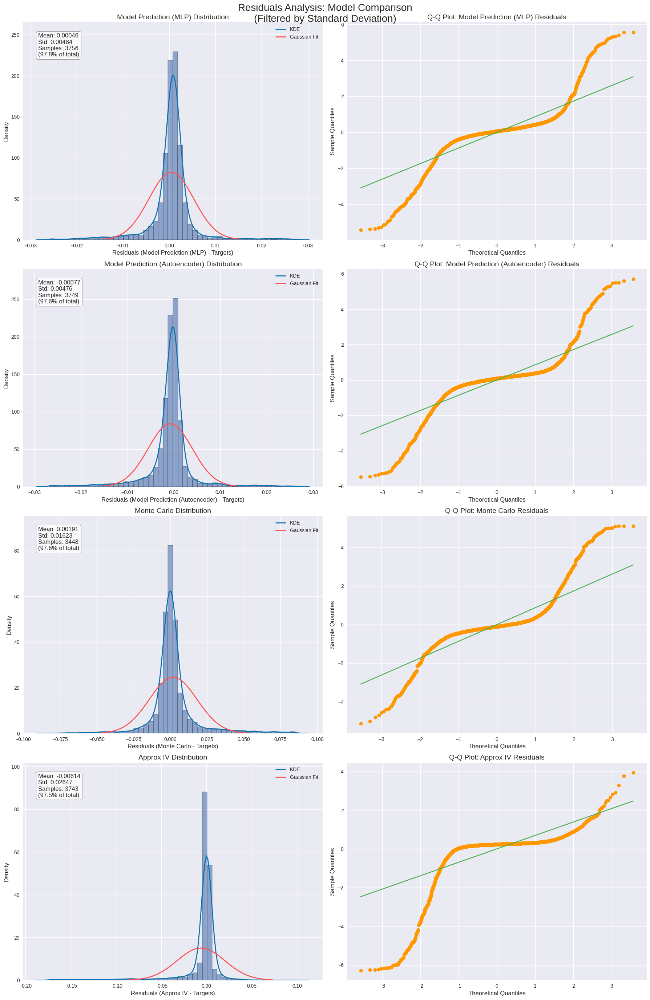

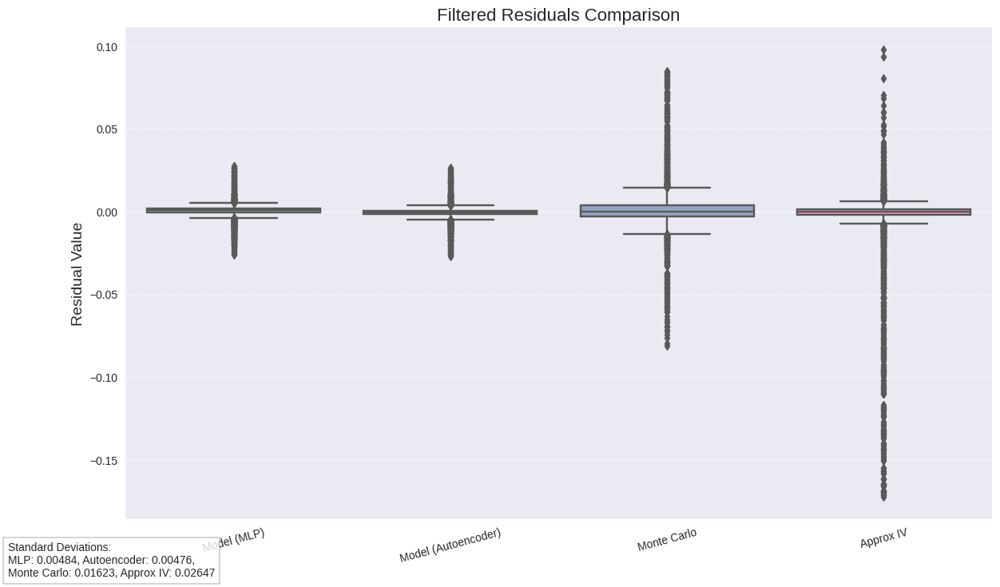

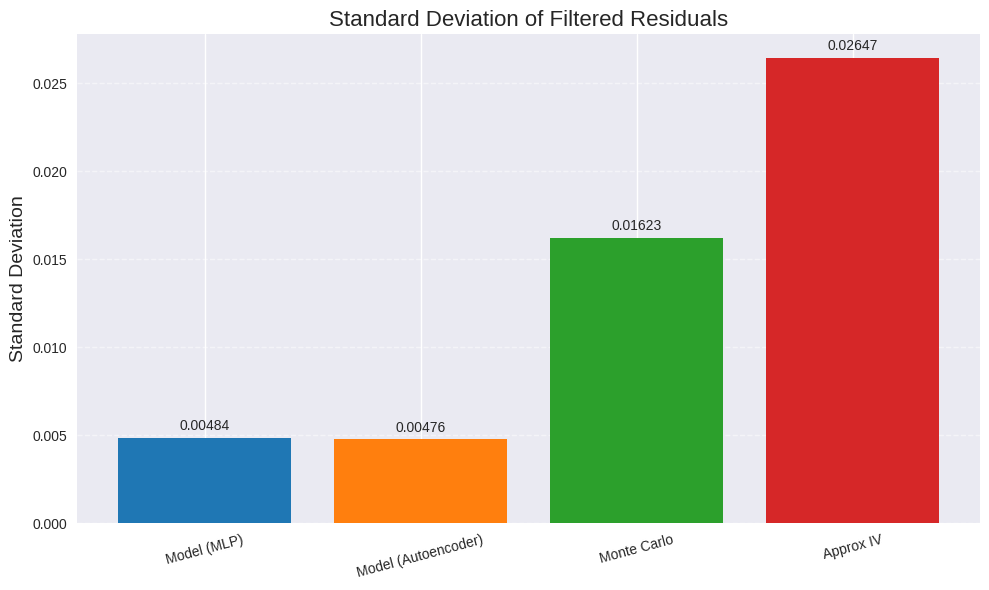

In [43]:
def create_residuals_analysis(results_df_sabr_iv: pd.DataFrame, std_threshold: float = 3.0) -> None:
    """
    Create comprehensive residuals analysis plots with normal distribution comparison.
    Includes Model Prediction (MLP), Model Prediction (Autoencoder), and Monte Carlo.
    
    Args:
        results_df_sabr_iv: DataFrame containing the residuals
        std_threshold: Number of standard deviations to filter data (default: 3.0)
    """
    # Replace infinities with NaN
    df = results_df_sabr_iv.copy()
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    
    # Calculate residuals if they don't exist yet
    # For MLP Model
    if "Residuals_mlp" not in df.columns:
        df["Residuals_mlp"] = df["Model Prediction (MLP)"] - df["Targets"]
    
    # For Autoencoder Model
    if "Residuals_autoencoder" not in df.columns:
        df["Residuals_autoencoder"] = df["Model Prediction (Autoencoder)"] - df["Targets"]
    
    # For Monte Carlo 
    if "Residuals_mc" not in df.columns:
        df["Residuals_mc"] = df["Monte Carlo"] - df["Targets"]
    
    # For Approx IV 
    if "Residuals_approx" not in df.columns:
        df["Residuals_approx"] = df["Approx IV"] - df["Targets"]
    
    # Set up figure and colors 
    fig, axes = plt.subplots(4, 2, figsize=(18, 28))
    fig.suptitle('Residuals Analysis: Model Comparison\n(Filtered by Standard Deviation)', 
                fontsize=20, y=0.98)
    
    # Color scheme
    colors = {
        "hist": "#4C72B0",
        "kde": "#0C72B0",
        "gaussian": "#FF5252",
        "qq_line": "#4CAF50",
        "qq_points": "#FF9800"
    }
    
    def process_residuals(residuals: pd.Series, ax_hist: plt.Axes, ax_qq: plt.Axes, 
                         title: str, std_threshold: float) -> tuple:
        """Process and plot residuals for a single method."""
        residuals = residuals.dropna()
        
        # Calculate statistics
        mean_residual = np.mean(residuals)
        std_residual = np.std(residuals)
        
        # Filter data within std_threshold standard deviations
        residuals_filtered = residuals[
            (residuals >= mean_residual - std_threshold * std_residual) &
            (residuals <= mean_residual + std_threshold * std_residual)
        ]
        
        # Recalculate statistics for filtered data
        mean_filtered = np.mean(residuals_filtered)
        std_filtered = np.std(residuals_filtered)
        
        # Create x values for Gaussian curve
        x = np.linspace(
            mean_filtered - std_threshold * std_filtered,
            mean_filtered + std_threshold * std_filtered,
            300
        )
        p = norm.pdf(x, mean_filtered, std_filtered)
        
        # Plot histogram and fits
        sns.histplot(residuals_filtered, stat="density", color=colors["hist"], 
                    alpha=0.6, bins=50, ax=ax_hist)
        sns.kdeplot(residuals_filtered, color=colors["kde"], linewidth=2, 
                   label="KDE", ax=ax_hist)
        ax_hist.plot(x, p, color=colors["gaussian"], label="Gaussian Fit", linewidth=2)
        
        # Add statistics text
        filtered_pct = (len(residuals_filtered) / len(residuals)) * 100
        stats_text = (
            f"Mean: {mean_filtered:.5f}\n"
            f"Std: {std_filtered:.5f}\n"
            f"Samples: {len(residuals_filtered)}\n"
            f"({filtered_pct:.1f}% of total)"
        )
        ax_hist.text(0.05, 0.95, stats_text, transform=ax_hist.transAxes,
                    fontsize=12, verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        # Customize histogram plot
        ax_hist.set_title(f'{title} Distribution', fontsize=14)
        ax_hist.set_xlabel(f'Residuals ({title} - Targets)', fontsize=12)
        ax_hist.set_ylabel('Density', fontsize=12)
        ax_hist.legend(loc='upper right')
        
        # Set reasonable y-limit
        density_max = max(np.max(p), ax_hist.get_ylim()[1])
        ax_hist.set_ylim(0, density_max * 1.1)
        
        # Create Q-Q plot
        standardized = (residuals_filtered - mean_filtered) / std_filtered
        stats.probplot(standardized, dist="norm", plot=ax_qq)
        
        # Customize Q-Q plot
        ax_qq.set_title(f'Q-Q Plot: {title} Residuals', fontsize=14)
        ax_qq.set_xlabel('Theoretical Quantiles', fontsize=12)
        ax_qq.set_ylabel('Sample Quantiles', fontsize=12)
        
        # Style Q-Q plot
        ax_qq.get_lines()[0].set_markerfacecolor(colors["qq_points"])
        ax_qq.get_lines()[0].set_markeredgecolor(colors["qq_points"])
        ax_qq.get_lines()[1].set_color(colors["qq_line"])
        
        return mean_filtered, std_filtered, residuals_filtered
    
    # Process all sets of residuals
    mean_mlp, std_mlp, residuals_mlp = process_residuals(
        df["Residuals_mlp"], axes[0, 0], axes[0, 1], "Model Prediction (MLP)", std_threshold
    )
    
    mean_autoencoder, std_autoencoder, residuals_autoencoder = process_residuals(
        df["Residuals_autoencoder"], axes[1, 0], axes[1, 1], "Model Prediction (Autoencoder)", std_threshold
    )
    
    mean_mc, std_mc, residuals_mc = process_residuals(
        df["Residuals_mc"], axes[2, 0], axes[2, 1], "Monte Carlo", std_threshold
    )
    
    mean_approx, std_approx, residuals_approx = process_residuals(
        df["Residuals_approx"], axes[3, 0], axes[3, 1], "Approx IV", std_threshold
    )
    
    plt.tight_layout()
    
    # Create comparison boxplot
    plt.figure(figsize=(14, 8))
    comparison_data = pd.DataFrame({
        'Model (MLP)': residuals_mlp,
        'Model (Autoencoder)': residuals_autoencoder,
        'Monte Carlo': residuals_mc,
        'Approx IV': residuals_approx
    })
    
    sns.boxplot(data=comparison_data, palette="Set2")
    plt.title('Filtered Residuals Comparison', fontsize=16)
    plt.ylabel('Residual Value', fontsize=14)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.xticks(rotation=15)
    
    # Add standard deviation comparison text
    plt.figtext(0.02, 0.02, 
                f'Standard Deviations:\n'
                f'MLP: {std_mlp:.5f}, Autoencoder: {std_autoencoder:.5f},\n'
                f'Monte Carlo: {std_mc:.5f}, Approx IV: {std_approx:.5f}',
                fontsize=10, bbox=dict(facecolor='white', alpha=0.8))
    
    plt.show()

    # Create additional comparison plot of standard deviations
    plt.figure(figsize=(10, 6))
    std_data = {
        'Model (MLP)': std_mlp,
        'Model (Autoencoder)': std_autoencoder,
        'Monte Carlo': std_mc,
        'Approx IV': std_approx
    }
    
    plt.bar(std_data.keys(), std_data.values(), color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728'])
    plt.title('Standard Deviation of Filtered Residuals', fontsize=16)
    plt.ylabel('Standard Deviation', fontsize=14)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.xticks(rotation=15)
    
    # Add value labels
    for i, (key, value) in enumerate(std_data.items()):
        plt.text(i, value + max(std_data.values())*0.01, f"{value:.5f}", 
                 ha='center', va='bottom', fontsize=10)
    
    plt.tight_layout()
    plt.show()


create_residuals_analysis(results_df_sabr_iv, std_threshold=3.0)

In [14]:
from scipy.stats import norm, shapiro, kstest, anderson, jarque_bera

# Calculate residuals
residuals = results_df_sabr_iv["Residuals"]
residuals_mc = results_df_sabr_iv["Residuals_mc"]

def normality_scores(data, mean, std):
    # Shapiro-Wilk test
    data = data.dropna()
    shapiro_stat, shapiro_p = shapiro(data)
    
    # Kolmogorov-Smirnov test (compare to normal distribution with given mean and std)
    ks_stat, ks_p = kstest(data, 'norm', args=(mean, std))
    
    # Anderson-Darling test
    anderson_result = anderson(data, dist='norm')
    anderson_stat = anderson_result.statistic
    anderson_p = anderson_result.significance_level
    
    # Jarque-Bera test
    jb_stat, jb_p = jarque_bera(data)
    
    return {
        "Shapiro p-value": shapiro_p,
        "KS p-value": ks_p,
        "Anderson Statistic": anderson_stat,
        "Jarque-Bera p-value": jb_p
    }

# Calculate normality tests for Residuals (Model Prediction)
mean_residual = np.mean(residuals)
std_residual = np.std(residuals)
normality_residuals = normality_scores(residuals, mean_residual, std_residual)
print("Normality Tests for Residuals (Model Prediction):")
print(normality_residuals)

# Calculate normality tests for Residuals (Monte Carlo)
mean_residual_mc = np.mean(residuals_mc)
std_residual_mc = np.std(residuals_mc)
normality_residuals_mc = normality_scores(residuals_mc, mean_residual_mc, std_residual_mc)
print("\nNormality Tests for Residuals (Monte Carlo):")
print(normality_residuals_mc)

Normality Tests for Residuals (Model Prediction):
{'Shapiro p-value': 3.8883577521887517e-73, 'KS p-value': 7.033304437595852e-257, 'Anderson Statistic': 548.9797062916932, 'Jarque-Bera p-value': 0.0}

Normality Tests for Residuals (Monte Carlo):
{'Shapiro p-value': 4.761372468016363e-68, 'KS p-value': 5.282589317309405e-205, 'Anderson Statistic': 472.06453462208765, 'Jarque-Bera p-value': 0.0}


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

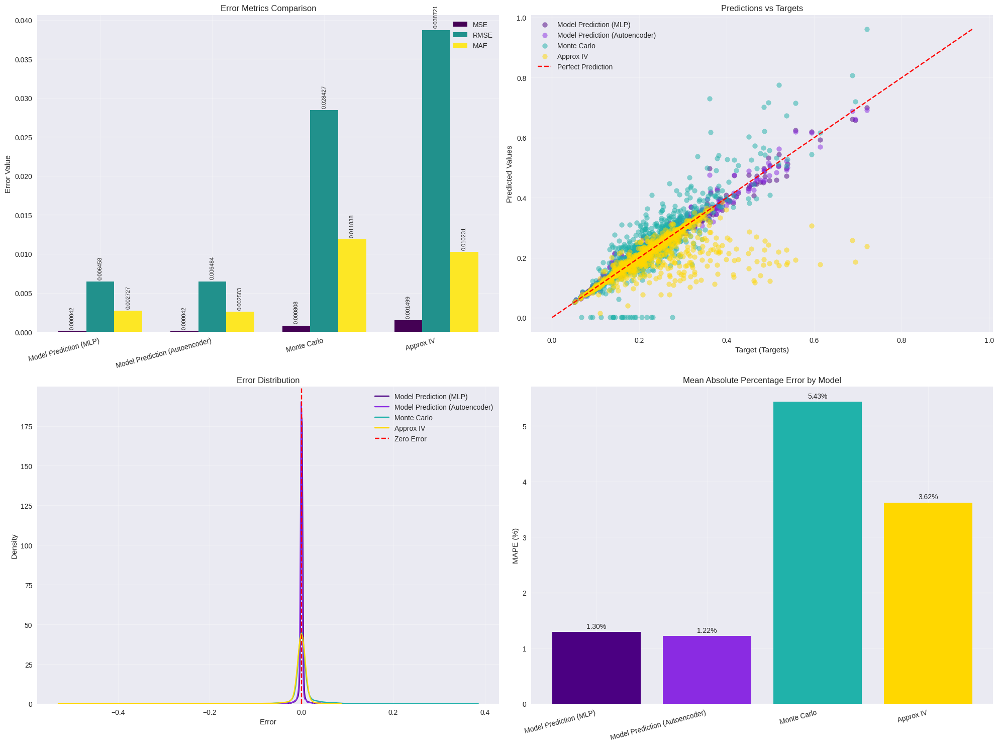


=== Model Performance Metrics ===

                                     MSE      RMSE       MAE      MAPE  \
Model Prediction (MLP)          0.000042  0.006458  0.002727  1.295569   
Model Prediction (Autoencoder)  0.000042  0.006484  0.002583  1.219287   
Monte Carlo                     0.000808  0.028427  0.011838  5.431038   
Approx IV                       0.001499  0.038721  0.010231  3.621239   

                                      R2  Max Error  Mean Error  Std Error  \
Model Prediction (MLP)          0.988942   0.136446    0.000852   0.006402   
Model Prediction (Autoencoder)  0.988852   0.114217   -0.000286   0.006478   
Monte Carlo                     0.785751   0.368553    0.002676   0.028301   
Approx IV                       0.602487   0.507582   -0.006930   0.038096   

                                Correlation  
Model Prediction (MLP)             0.994568  
Model Prediction (Autoencoder)     0.994421  
Monte Carlo                        0.921869  
Approx IV         

In [44]:
def analyze_model_performance(
    df: pd.DataFrame,
    models: dict,
    target_col: str = 'Targets',
    figsize: tuple = (20, 15),
    colors: dict = {
        'Model Prediction (MLP)': '#4B0082',    # Deep Purple
        'Model Prediction (Autoencoder)': '#8A2BE2',  # Blue Violet
        'Monte Carlo': '#20B2AA',       # Light Sea Green
        'Approx IV': '#FFD700'          # Yellow
    }
) -> pd.DataFrame:
    """
    Perform comprehensive analysis of model performance against target values.
    Includes MLP and Autoencoder models alongside Monte Carlo and Approx IV.
    """
    # Clean data
    relevant_columns = [target_col] + [model['predicted'] for model in models.values()]
    df_cleaned = df.dropna(subset=relevant_columns).copy()
    
    # Calculate error metrics
    metrics = {}
    for model_name, cols in models.items():
        predictions = df_cleaned[cols['predicted']]
        targets = df_cleaned[target_col]
        
        metrics[model_name] = {
            'MSE': mean_squared_error(targets, predictions),
            'RMSE': np.sqrt(mean_squared_error(targets, predictions)),
            'MAE': mean_absolute_error(targets, predictions),
            'MAPE': np.mean(np.abs((targets - predictions) / (targets + 1e-10))) * 100,  # Added small value to prevent division by zero
            'R2': r2_score(targets, predictions),
            'Max Error': np.max(np.abs(targets - predictions)),
            'Mean Error': np.mean(predictions - targets),
            'Std Error': np.std(predictions - targets),
            'Correlation': np.corrcoef(targets, predictions)[0,1]
        }
    
    metrics_df = pd.DataFrame.from_dict(metrics, orient='index')
    
    # Create visualizations
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(2, 2)
    
    # Error Metrics Comparison
    ax1 = fig.add_subplot(gs[0, 0])
    metrics_to_plot = ['MSE', 'RMSE', 'MAE']
    
    x = np.arange(len(models))
    width = 0.25
    multiplier = 0
    
    # Create color map for metrics
    metric_colors = plt.cm.viridis(np.linspace(0, 1, len(metrics_to_plot)))
    
    for metric, metric_color in zip(metrics_to_plot, metric_colors):
        offset = width * multiplier
        rects = ax1.bar(x + offset, metrics_df[metric], width, label=metric, color=metric_color)
        ax1.bar_label(rects, fmt='%.6f', padding=3, rotation=90, fontsize=8)  # Reduced font size for better fit
        multiplier += 1
    
    ax1.set_ylabel('Error Value')
    ax1.set_title('Error Metrics Comparison')
    ax1.set_xticks(x + width, models.keys(), rotation=15, ha='right')  # Rotated labels to prevent overlap
    ax1.legend(loc='upper right')
    ax1.grid(True, alpha=0.3)
    
    # Scatter Plot
    ax2 = fig.add_subplot(gs[0, 1])
    
    for model_name, cols in models.items():
        ax2.scatter(
            df_cleaned[target_col],
            df_cleaned[cols['predicted']],
            alpha=0.5,
            label=model_name,
            color=colors[model_name]
        )
    
    # Add perfect prediction line
    min_val = df_cleaned[relevant_columns].min().min()
    max_val = df_cleaned[relevant_columns].max().max()
    ax2.plot([min_val, max_val], [min_val, max_val],
             'r--', label='Perfect Prediction')
    
    ax2.set_xlabel(f'Target ({target_col})')
    ax2.set_ylabel('Predicted Values')
    ax2.set_title('Predictions vs Targets')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # Error Distribution
    ax3 = fig.add_subplot(gs[1, 0])
    
    for model_name, cols in models.items():
        errors = df_cleaned[cols['predicted']] - df_cleaned[target_col]
        sns.kdeplot(errors, label=model_name, color=colors[model_name], ax=ax3)
    
    ax3.axvline(0, color='r', linestyle='--', label='Zero Error')
    ax3.set_xlabel('Error')
    ax3.set_ylabel('Density')
    ax3.set_title('Error Distribution')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    
    # MAPE by Model
    ax4 = fig.add_subplot(gs[1, 1])
    bars = ax4.bar(models.keys(), metrics_df['MAPE'], 
                   color=[colors[model] for model in models.keys()])
    ax4.bar_label(bars, fmt='%.2f%%', padding=3)
    ax4.set_ylabel('MAPE (%)')
    ax4.set_title('Mean Absolute Percentage Error by Model')
    ax4.set_xticklabels(models.keys(), rotation=15, ha='right')  # Rotated labels
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed comparison table
    print("\n=== Model Performance Metrics ===\n")
    print(metrics_df.round(6))
    
    # Ranking analysis
    print("\n=== Model Rankings ===\n")
    for metric in ['MSE', 'RMSE', 'MAE', 'MAPE']:
        
        ranking = metrics_df[metric].rank()
        print(f"{metric} Ranking (lower is better):")
        for model in ranking.sort_values().index:
            print(f"  {ranking[model]:.0f}. {model}: {metrics_df.loc[model, metric]:.6f}")
        print()
    
    for metric in ['R2', 'Correlation']:
        
        ranking = metrics_df[metric].rank(ascending=False)
        print(f"{metric} Ranking (higher is better):")
        for model in ranking.sort_values().index:
            print(f"  {ranking[model]:.0f}. {model}: {metrics_df.loc[model, metric]:.6f}")
        print()
    
    # Best overall model analysis
    print("\n=== Overall Model Performance ===\n")
    
    # Aggregate rankings across key metrics
    rank_metrics = ['MSE', 'RMSE', 'MAE', 'MAPE', 'R2', 'Correlation']
    combined_ranks = pd.DataFrame(index=metrics_df.index)
    
    for metric in rank_metrics:
        ascending = metric not in ['R2', 'Correlation']  # Lower is better for error metrics
        combined_ranks[f"{metric}_rank"] = metrics_df[metric].rank(ascending=ascending)
    
    combined_ranks['Average Rank'] = combined_ranks.mean(axis=1)
    combined_ranks = combined_ranks.sort_values('Average Rank')
    
    print("Average Ranking Across All Metrics (lower is better):")
    for model in combined_ranks.index:
        print(f"  {model}: {combined_ranks.loc[model, 'Average Rank']:.2f}")
    
    print(f"\nBest Overall Model: {combined_ranks.index[0]}")
        
    return metrics_df


models = {
    'Model Prediction (MLP)': {
        'predicted': 'Model Prediction (MLP)'
    },
    'Model Prediction (Autoencoder)': {
        'predicted': 'Model Prediction (Autoencoder)'
    },
    'Monte Carlo': {
        'predicted': 'Monte Carlo'
    },
    'Approx IV': {
        'predicted': 'Approx IV'
    }
}

# Run analysis
metrics_df = analyze_model_performance(
    results_df_sabr_iv,
    models,
    target_col='Targets',
    figsize=(20, 15)
)

# GREEKS

In [43]:
greeks = pd.read_csv('/kaggle/input/greeks/option_pricing_with_greeks.csv')
greeks.head()

,interest_rate,volatility,strike_price,time_to_maturity,initial_stock_price,option_price,Delta,Delta_time,Vega,Vega_time,Theta,Theta_time,Rho,Rho_time
0,0.1199915041,0.0519317898,69.1763853057,100,97.6492308837,31.8463847606,1.0000000000,0.0008037090,0.0000000000,0.0001759529,-0.0216322808,0.0001988411,27.4178525513,0.0000805855
1,0.1111219464,0.2037499550,130.2527059480,120,88.6383211346,0.0573115074,0.0134155540,0.0001091957,2.1559449392,0.0000946522,-0.0015480652,0.0002055168,0.5659103370,0.0000765324
2,0.0519418638,0.1780836545,64.2482979510,120,90.6927537884,28.0959718065,0.9986796862,0.0000920296,0.2785140044,0.0000870228,-0.0090267744,0.0001616478,31.2385195458,0.0000748634
3,0.0867747375,0.2037499550,83.0967108722,80,83.5097411830,5.4011337200,0.6356491235,0.0000998974,18.1118261688,0.0000872612,-0.0265013640,0.0001654625,15.8939200233,0.0000755787
4,0.1199915041,0.4763469704,133.3722135730,80,93.1670334916,1.8210440682,0.1535062150,0.0000889301,12.7356731647,0.0000858307,-0.0290341751,0.0001599789,4.1602248691,0.0000746250


In [15]:
class OptionPricingGreekDataset(torch.utils.data.Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X.values, dtype=torch.float32).to(device)
        self.y = torch.tensor(y.values, dtype=torch.float32).to(device)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [ ]:
X_g = greeks.drop(['Delta', 'Delta_time', 'Vega', 'Vega_time','Theta','Theta_time','Rho','Rho_time'], axis=1)  # Features
y_g_tot = greeks[['Delta','Vega','Theta','Rho']]               # Target
y_g_d = greeks['Delta']
y_g_v = greeks['Vega']
y_g_t = greeks['Theta']
y_g_r = greeks['Rho']

X_train_g_tot, X_temp_g_tot, y_train_g_tot, y_temp_g_tot = train_test_split(X_g, y_g_tot, test_size=0.2, random_state=42)         # Train/Test+Val
X_val_g_tot, X_test_g_tot, y_val_g_tot, y_test_g_tot = train_test_split(X_temp_g_tot, y_temp_g_tot, test_size=0.005, random_state=42)  # Val/Test

X_train_g_d, X_temp_g_d, y_train_g_d, y_temp_g_d = train_test_split(X_g, y_g_d, test_size=0.2, random_state=42)         # Train/Test+Val
X_val_g_d, X_test_g_d, y_val_g_d, y_test_g_d = train_test_split(X_temp_g_d, y_temp_g_d, test_size=0.005, random_state=42)  # Val/Test

X_train_g_v, X_temp_g_v, y_train_g_v, y_temp_g_v = train_test_split(X_g, y_g_v, test_size=0.2, random_state=42)         # Train/Test+Val
X_val_g_v, X_test_g_v, y_val_g_v, y_test_g_v = train_test_split(X_temp_g_v, y_temp_g_v, test_size=0.005, random_state=42)  # Val/Test

X_train_g_t, X_temp_g_t, y_train_g_t, y_temp_g_t = train_test_split(X_g, y_g_t, test_size=0.2, random_state=42)         # Train/Test+Val
X_val_g_t, X_test_g_t, y_val_g_t, y_test_g_t = train_test_split(X_temp_g_t, y_temp_g_t, test_size=0.005, random_state=42)  # Val/Test

X_train_g_r, X_temp_g_r, y_train_g_r, y_temp_g_r = train_test_split(X_g, y_g_r, test_size=0.2, random_state=42)         # Train/Test+Val
X_val_g_r, X_test_g_r, y_val_g_r, y_test_g_r = train_test_split(X_temp_g_r, y_temp_g_r, test_size=0.005, random_state=42)  # Val/Test


scaler = MinMaxScaler()
X_train_g_tot_normalized = scaler.fit_transform(X_train_g_tot)  # Fit on training data and transform
X_val_g_tot_normalized = scaler.transform(X_val_g_tot)         # Transform validation data
X_test_g_tot_normalized = scaler.transform(X_test_g_tot)       # Transform test data


# Convert normalized data back into DataFrames for DataLoader compatibility
X_train_g_tot_normalized = pd.DataFrame(X_train_g_tot_normalized, columns=X_g.columns)
X_val_g_tot_normalized = pd.DataFrame(X_val_g_tot_normalized, columns=X_g.columns)
X_test_g_tot_normalized = pd.DataFrame(X_test_g_tot_normalized, columns=X_g.columns)

# Create PyTorch datasets
train_dataset_g_tot = OptionPricingGreekDataset(X_train_g_tot_normalized, y_train_g_tot)
val_dataset_g_tot = OptionPricingGreekDataset(X_val_g_tot_normalized, y_val_g_tot)
test_dataset_g_tot = OptionPricingGreekDataset(X_test_g_tot_normalized, y_test_g_tot)
# Create PyTorch datasets
train_dataset_g_d = OptionPricingGreekDataset(X_train_g_tot_normalized, y_train_g_d)
val_dataset_g_d = OptionPricingGreekDataset(X_val_g_tot_normalized, y_val_g_d)
test_dataset_g_d = OptionPricingGreekDataset(X_test_g_tot_normalized, y_test_g_d)
# Create PyTorch datasets
train_dataset_g_v = OptionPricingGreekDataset(X_train_g_tot_normalized, y_train_g_v)
val_dataset_g_v = OptionPricingGreekDataset(X_val_g_tot_normalized, y_val_g_v)
test_dataset_g_v = OptionPricingGreekDataset(X_test_g_tot_normalized, y_test_g_v)
# Create PyTorch datasets
train_dataset_g_t = OptionPricingGreekDataset(X_train_g_tot_normalized, y_train_g_t)
val_dataset_g_t = OptionPricingGreekDataset(X_val_g_tot_normalized, y_val_g_t)
test_dataset_g_t = OptionPricingGreekDataset(X_test_g_tot_normalized, y_test_g_t)
# Create PyTorch datasets
train_dataset_g_r = OptionPricingGreekDataset(X_train_g_tot_normalized, y_train_g_r)
val_dataset_g_r = OptionPricingGreekDataset(X_val_g_tot_normalized, y_val_g_r)
test_dataset_g_r = OptionPricingGreekDataset(X_test_g_tot_normalized, y_test_g_r)

# Create DataLoaders
train_loader_g_tot = torch.utils.data.DataLoader(train_dataset_g_tot, batch_size=1024, shuffle=True)
val_loader_g_tot = torch.utils.data.DataLoader(val_dataset_g_tot, batch_size=1024, shuffle=False)
test_loader_g_tot = torch.utils.data.DataLoader(test_dataset_g_tot, batch_size=1024, shuffle=False)
# Create DataLoaders
train_loader_g_d = torch.utils.data.DataLoader(train_dataset_g_d, batch_size=1024, shuffle=True)
val_loader_g_d = torch.utils.data.DataLoader(val_dataset_g_d, batch_size=1024, shuffle=False)
test_loader_g_d = torch.utils.data.DataLoader(test_dataset_g_d, batch_size=1024, shuffle=False)
# Create DataLoaders
train_loader_g_v = torch.utils.data.DataLoader(train_dataset_g_v, batch_size=1024, shuffle=True)
val_loader_g_v = torch.utils.data.DataLoader(val_dataset_g_v, batch_size=1024, shuffle=False)
test_loader_g_v = torch.utils.data.DataLoader(test_dataset_g_v, batch_size=1024, shuffle=False)
# Create DataLoaders
train_loader_g_t = torch.utils.data.DataLoader(train_dataset_g_t, batch_size=1024, shuffle=True)
val_loader_g_t = torch.utils.data.DataLoader(val_dataset_g_t, batch_size=1024, shuffle=False)
test_loader_g_t = torch.utils.data.DataLoader(test_dataset_g_t, batch_size=1024, shuffle=False)
# Create DataLoaders
train_loader_g_r = torch.utils.data.DataLoader(train_dataset_g_r, batch_size=1024, shuffle=True)
val_loader_g_r = torch.utils.data.DataLoader(val_dataset_g_r, batch_size=1024, shuffle=False)
test_loader_g_r = torch.utils.data.DataLoader(test_dataset_g_r, batch_size=1024, shuffle=False)

In [18]:
class MLP(nn.Module):
    def __init__(self, input_dim):
        super(MLP, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 200),  # Input layer
            nn.ReLU(),
            nn.Linear(200, 200),        # Hidden layer
            nn.ReLU(),
            nn.Linear(200, 200),         # Hidden layer
            nn.ReLU(),
            nn.Linear(200, 50),          # Hidden layer
            nn.ReLU(),
            nn.Linear(50, 50),          # Hidden layer (Matches checkpoint)
            nn.ReLU(),
            nn.Linear(50, 1)  
        )
    def forward(self, x):
        return self.model(x)

In [19]:
class MLP_tot(nn.Module):
    def __init__(self, input_dim):
        super(MLP_tot, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 200),  # Input layer
            nn.ReLU(),
            nn.Linear(200, 200),        # Hidden layer
            nn.ReLU(),
            nn.Linear(200, 200),         # Hidden layer
            nn.ReLU(),
            nn.Linear(200, 50),          # Hidden layer
            nn.ReLU(),
            nn.Linear(50, 50),          # Hidden layer (Matches checkpoint)
            nn.ReLU(),
            nn.Linear(50, 4)  
        )
    def forward(self, x):
        return self.model(x)

In [7]:
def train_model_g(model, train_loader, val_loader, mse_criterion, optimizer, device, num_epochs=50, patience=5):
    best_loss = float('inf')
    counter = 0
    best_model = deepcopy(model.state_dict())
    all_predictions = []
    all_targets = []
    for epoch in range(num_epochs):
        model.train()
        running_loss_mse = 0.0

        for inputs, targets in tqdm(train_loader, desc="Training Epoch", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            optimizer.zero_grad()
            outputs = model(inputs)
            #targets = targets.squeeze(1) FOR ALL GREEKS
            targets = targets.unsqueeze(1)

            # Compute MSE loss for monitoring (not used in training)
            loss_mse = mse_criterion(outputs, targets)

            # Backward pass and optimization
            loss_mse.backward()
            optimizer.step()


            running_loss_mse += loss_mse.item()
            
        avg_train_loss_mse = running_loss_mse / len(train_loader)
        print(f"Epoch {epoch + 1}/{num_epochs} - "
              f"Train MSE: {avg_train_loss_mse:.10f}")

        #print(f"Epoch {epoch + 1}/{num_epochs},  Train MSE Loss: {avg_train_loss_mse:.10f}")

        # Validation after each epoch
        avg_val_loss_mse = validation_model_g(model, val_loader, mse_criterion, device)


        # Early stopping based on custom loss
        if avg_val_loss_mse < best_loss:
            best_loss = avg_val_loss_mse
            counter = 0
            best_model = deepcopy(model.state_dict())  # Save the best model state
        else:
            counter += 1

        if counter >= patience:
            print(f"Early stopping triggered at epoch {epoch + 1}")
            break

    model.load_state_dict(best_model)  # Restore the best model
    return model, avg_train_loss_mse, avg_val_loss_mse, best_loss

# Validation function
def validation_model_g(model, val_loader,  mse_criterion, device):
    model.eval()
    val_loss_mse = 0.0
    all_predictions = []
    all_targets = []
    with torch.no_grad():
        for inputs, targets in tqdm(val_loader, desc="Validation", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)
            #targets = targets.squeeze(1) FOR ALL GREEKS
            targets = targets.unsqueeze(1)

            loss_mse = mse_criterion(outputs, targets)        # MSE loss

            val_loss_mse += loss_mse.item()
            
            # Collect predictions and true values for MAE & R² computation
            all_predictions.extend(outputs.cpu().detach().numpy().flatten())
            all_targets.extend(targets.cpu().detach().numpy().flatten())
            
        avg_val_loss_mse= mean_squared_error(all_targets,all_predictions)
        avg_val_loss_mae = mean_absolute_error(all_targets, all_predictions)
        val_r2_score = r2_score(all_targets, all_predictions)

        print(f"Val MSE: {avg_val_loss_mse:.10f}, "
              f"Val  MAE: {avg_val_loss_mae:.10f}, "
              f"Val  R²: {val_r2_score:.10f}")
    #print(f" Validation MSE Loss: {avg_val_loss_mse:.10f}")
    return  avg_val_loss_mse

# Testing function
def test_model_g(model, test_loader, mse_criterion, device):
    model.eval()
    
    test_loss_mse = 0.0
    all_predictions = []
    all_targets = []

    with torch.no_grad():
        for inputs, targets in tqdm(test_loader, desc="Testing", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)
            #targets = targets.squeeze(1) FOR ALL GREEKS
            targets = targets.unsqueeze(1)
            
            loss_mse = mse_criterion(outputs, targets)        # MSE loss

            test_loss_mse += loss_mse.item()

            all_predictions.extend(outputs.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())

    avg_test_loss_mse= mean_squared_error(all_targets,all_predictions)
    avg_test_loss_mae = mean_absolute_error(all_targets, all_predictions)
    test_r2_score = r2_score(all_targets, all_predictions)

    print(f"Test MSE: {avg_test_loss_mse:.10f}, "
          f"Test MAE: {avg_test_loss_mae:.10f}, "
          f"Test R²: {test_r2_score:.10f}")

    return  avg_test_loss_mse, all_predictions, all_targets

def test_model_g_tot(model, test_loader, mse_criterion, device):
    model.eval()
    
    test_loss_mse = 0.0
    all_predictions = []
    all_targets = []

    with torch.no_grad():
        for inputs, targets in tqdm(test_loader, desc="Testing", unit="batch"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)
            targets = targets.squeeze(1) 
            
            
            loss_mse = mse_criterion(outputs, targets)        # MSE loss

            test_loss_mse += loss_mse.item()

            all_predictions.extend(outputs.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())

    avg_test_loss_mse= mean_squared_error(all_targets,all_predictions)
    avg_test_loss_mae = mean_absolute_error(all_targets, all_predictions)
    test_r2_score = r2_score(all_targets, all_predictions)

    print(f"Test MSE: {avg_test_loss_mse:.10f}, "
          f"Test MAE: {avg_test_loss_mae:.10f}, "
          f"Test R²: {test_r2_score:.10f}")

    return  avg_test_loss_mse, all_predictions, all_targets

In [20]:
input_dim = X_train_g_tot.shape[1]  # Number of features
model_g_tot = MLP_tot(input_dim).to(device)
model_g_d = MLP(input_dim).to(device)
model_g_v = MLP(input_dim).to(device)
model_g_t = MLP(input_dim).to(device)
model_g_r = MLP(input_dim).to(device)
mse_criterion = nn.MSELoss()
optimizer = optim.Adam(model_g_tot.parameters(), lr=0.001)

In [ ]:
# Training phase
trained_model, train_losses, val_loss, best_loss= train_model_g(
    model_g, train_loader_g, val_loader_g,  mse_criterion, optimizer, device, num_epochs=50, patience=5
)

# Test phase
test_loss, predictions, true_values = test_model_g(trained_model, test_loader_g, mse_criterion, device)

# Save model
torch.save(trained_model.state_dict(), "mlp_Greeks_rho.pth")
print("Model saved!")

Training Epoch: 100%|██████████| 15413/15413 [06:05<00:00, 42.18batch/s]


Epoch 1/50 - Train MSE: 0.5090246733


Validation: 100%|██████████| 1927/1927 [00:27<00:00, 71.24batch/s]


Val MSE: 0.0018222119, Val  MAE: 0.0285605993, Val  R²: 0.9999771623


Training Epoch: 100%|██████████| 15413/15413 [06:09<00:00, 41.71batch/s]


Epoch 2/50 - Train MSE: 0.0059164337


Validation: 100%|██████████| 1927/1927 [00:27<00:00, 70.04batch/s]


Val MSE: 0.0009957935, Val  MAE: 0.0221256576, Val  R²: 0.9999875197


Training Epoch: 100%|██████████| 15413/15413 [06:10<00:00, 41.65batch/s]


Epoch 3/50 - Train MSE: 0.0040315899


Validation: 100%|██████████| 1927/1927 [00:26<00:00, 73.20batch/s]


Val MSE: 0.0024521814, Val  MAE: 0.0373563915, Val  R²: 0.9999692669


Training Epoch: 100%|██████████| 15413/15413 [06:11<00:00, 41.44batch/s]


Epoch 4/50 - Train MSE: 0.0031694961


Validation: 100%|██████████| 1927/1927 [00:26<00:00, 72.84batch/s]


Val MSE: 0.0026158951, Val  MAE: 0.0344847254, Val  R²: 0.9999672151


Training Epoch: 100%|██████████| 15413/15413 [06:14<00:00, 41.13batch/s]


Epoch 5/50 - Train MSE: 0.0025253169


Validation: 100%|██████████| 1927/1927 [00:25<00:00, 76.12batch/s]


Val MSE: 0.0047802734, Val  MAE: 0.0528950654, Val  R²: 0.9999400890


Training Epoch: 100%|██████████| 15413/15413 [06:05<00:00, 42.20batch/s]


Epoch 6/50 - Train MSE: 0.0022190237


Validation: 100%|██████████| 1927/1927 [00:25<00:00, 76.19batch/s]


Val MSE: 0.0007082468, Val  MAE: 0.0183529127, Val  R²: 0.9999911236


Training Epoch: 100%|██████████| 15413/15413 [06:05<00:00, 42.19batch/s]


Epoch 7/50 - Train MSE: 0.0018902906


Validation: 100%|██████████| 1927/1927 [00:25<00:00, 75.64batch/s]


Val MSE: 0.0007365320, Val  MAE: 0.0171685591, Val  R²: 0.9999907691


Training Epoch: 100%|██████████| 15413/15413 [06:04<00:00, 42.28batch/s]


Epoch 8/50 - Train MSE: 0.0017465548


Validation: 100%|██████████| 1927/1927 [00:24<00:00, 77.90batch/s]


Val MSE: 0.0005108705, Val  MAE: 0.0151671153, Val  R²: 0.9999935973


Training Epoch: 100%|██████████| 15413/15413 [06:05<00:00, 42.19batch/s]


Epoch 9/50 - Train MSE: 0.0015546132


Validation: 100%|██████████| 1927/1927 [00:24<00:00, 77.54batch/s]


Val MSE: 0.0005250071, Val  MAE: 0.0140005322, Val  R²: 0.9999934201


Training Epoch: 100%|██████████| 15413/15413 [06:06<00:00, 42.05batch/s]


Epoch 10/50 - Train MSE: 0.0013796068


Validation: 100%|██████████| 1927/1927 [00:25<00:00, 77.05batch/s]


Val MSE: 0.0004728723, Val  MAE: 0.0145224761, Val  R²: 0.9999940735


Training Epoch: 100%|██████████| 15413/15413 [06:13<00:00, 41.30batch/s]


Epoch 11/50 - Train MSE: 0.0012811622


Validation: 100%|██████████| 1927/1927 [00:25<00:00, 74.46batch/s]


Val MSE: 0.0004914611, Val  MAE: 0.0150140151, Val  R²: 0.9999938405


Training Epoch: 100%|██████████| 15413/15413 [06:39<00:00, 38.55batch/s]


Epoch 12/50 - Train MSE: 0.0011746824


Validation: 100%|██████████| 1927/1927 [00:28<00:00, 67.73batch/s]


Val MSE: 0.0007221140, Val  MAE: 0.0190119110, Val  R²: 0.9999909498


Training Epoch: 100%|██████████| 15413/15413 [06:58<00:00, 36.82batch/s]


Epoch 13/50 - Train MSE: 0.0011065766


Validation: 100%|██████████| 1927/1927 [00:28<00:00, 67.54batch/s]


Val MSE: 0.0001979092, Val  MAE: 0.0095435567, Val  R²: 0.9999975196


Training Epoch: 100%|██████████| 15413/15413 [06:34<00:00, 39.11batch/s]


Epoch 14/50 - Train MSE: 0.0010423990


Validation: 100%|██████████| 1927/1927 [00:27<00:00, 69.10batch/s]


Val MSE: 0.0003405613, Val  MAE: 0.0121615902, Val  R²: 0.9999957318


Training Epoch: 100%|██████████| 15413/15413 [06:27<00:00, 39.81batch/s]


Epoch 15/50 - Train MSE: 0.0009805191


Validation: 100%|██████████| 1927/1927 [00:28<00:00, 68.19batch/s]


Val MSE: 0.0151012326, Val  MAE: 0.0701697171, Val  R²: 0.9998107367


Training Epoch: 100%|██████████| 15413/15413 [06:29<00:00, 39.56batch/s]


Epoch 16/50 - Train MSE: 0.0009452049


Validation: 100%|██████████| 1927/1927 [00:27<00:00, 70.83batch/s]


Val MSE: 0.0002853736, Val  MAE: 0.0107712448, Val  R²: 0.9999964234


Training Epoch: 100%|██████████| 15413/15413 [06:26<00:00, 39.87batch/s]


Epoch 17/50 - Train MSE: 0.0008876645


Validation: 100%|██████████| 1927/1927 [00:25<00:00, 74.55batch/s]


Val MSE: 0.0001566255, Val  MAE: 0.0080502797, Val  R²: 0.9999980370


Training Epoch: 100%|██████████| 15413/15413 [06:28<00:00, 39.71batch/s]


Epoch 18/50 - Train MSE: 0.0008372890


Validation: 100%|██████████| 1927/1927 [00:28<00:00, 68.60batch/s]


Val MSE: 0.0002035309, Val  MAE: 0.0102204075, Val  R²: 0.9999974492


Training Epoch: 100%|██████████| 15413/15413 [06:26<00:00, 39.91batch/s]


Epoch 19/50 - Train MSE: 0.0008091204


Validation: 100%|██████████| 1927/1927 [00:26<00:00, 72.46batch/s]


Val MSE: 0.0006424284, Val  MAE: 0.0162895024, Val  R²: 0.9999919485


Training Epoch: 100%|██████████| 15413/15413 [06:38<00:00, 38.63batch/s]


Epoch 20/50 - Train MSE: 0.0007899320


Validation: 100%|██████████| 1927/1927 [00:27<00:00, 69.02batch/s]


Val MSE: 0.0011994251, Val  MAE: 0.0250630975, Val  R²: 0.9999849676


Training Epoch: 100%|██████████| 15413/15413 [06:45<00:00, 38.03batch/s]


Epoch 21/50 - Train MSE: 0.0007504786


Validation: 100%|██████████| 1927/1927 [00:30<00:00, 63.45batch/s]


Val MSE: 0.0056997002, Val  MAE: 0.0543395542, Val  R²: 0.9999285658


Training Epoch:  28%|██▊       | 4286/15413 [01:55<08:39, 21.42batch/s]

In [10]:
#ALL GREEKS
model_g_tot.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_Greeks.pth', map_location=torch.device('cpu'),weights_only=True))
test_loss_tot, predictions_tot, true_values_tot = test_model_g_tot(model_g_tot, test_loader_g_tot, mse_criterion, device)

Testing: 100%|██████████| 1927/1927 [00:24<00:00, 78.56batch/s]


Test MSE: 0.0006057548, Test MAE: 0.0137278717, Test R²: 0.9772531896


In [11]:
#DELTA
model_g_d.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_Greeks_delta.pth', map_location=torch.device('cpu'),weights_only=True))
test_loss_d, predictions_d, true_values_d = test_model_g(model_g_d, test_loader_g_d, mse_criterion, device)

Testing: 100%|██████████| 1927/1927 [00:26<00:00, 71.76batch/s]


Test MSE: 0.0000001310, Test MAE: 0.0002709443, Test R²: 0.9999992546


In [12]:
#VEGA
model_g_v.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_Greeks_vega.pth', map_location=torch.device('cpu'),weights_only=True))
test_loss_v, predictions_v, true_values_v = test_model_g(model_g_v, test_loader_g_v, mse_criterion, device)

Testing: 100%|██████████| 1927/1927 [00:28<00:00, 67.48batch/s]


Test MSE: 0.0002841741, Test MAE: 0.0098784789, Test R²: 0.9999953457


In [13]:
#THETA
model_g_t.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_Greeks_theta.pth', map_location=torch.device('cpu'),weights_only=True))
test_loss_t, predictions_t, true_values_t = test_model_g(model_g_t, test_loader_g_t, mse_criterion, device)

Testing: 100%|██████████| 1927/1927 [00:30<00:00, 64.13batch/s]


Test MSE: 0.0000000033, Test MAE: 0.0000392392, Test R²: 0.9999862656


In [14]:
#RHO
model_g_r.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_Greeks_rho.pth', map_location=torch.device('cpu'),weights_only=True))
test_loss_r, predictions_r, true_values_r = test_model_g(model_g_r, test_loader_g_r, mse_criterion, device)

Testing: 100%|██████████| 1927/1927 [00:32<00:00, 59.78batch/s]


Test MSE: 0.0001566218, Test MAE: 0.0080465404, Test R²: 0.9999980310


In [50]:
for i in range(len(true_values)):
    print(true_values[i], predictions[i])
    if i==1:
        break
if len(true_values) > 0 and len(predictions) > 0:
    mse_values = [mean_squared_error(true_values[:i+1], predictions[:i+1]) for i in range(min(4, len(true_values)))]
    
    # Print only available MSE values
    print(*mse_values)
else:
    print("Error: true_values or predictions are empty.")

[ 0.10232275  5.119565   -0.02427216  0.8154374 ] [ 0.09442483  5.0810175  -0.02306198  0.8398709 ]
[ 4.6506059e-01  1.3497206e+01 -7.2478061e-03  6.3446889e+00] [ 0.5006351  13.425983   -0.01432883  6.368548  ]
0.0005366878 0.0011380384 0.0007683308 0.00059082964


In [21]:
X_g = test_greeks.drop(['Delta', 'Delta_time', 'Vega', 'Vega_time','Theta','Theta_time','Rho','Rho_time'], axis=1)  # Features

X_test_g_tot_normalized = scaler.transform(X_g)
X_test_g_tot_normalized = pd.DataFrame(X_test_g_tot_normalized, columns=X_g.columns)

y_test_greeks = pd.DataFrame({
    "Delta": test_greeks["Delta"],
    "Vega": test_greeks["Vega"],
    "Theta": test_greeks["Theta"],
    "Rho": test_greeks["Rho"]
})
test_dataset_g_tot = OptionPricingGreekDataset(X_test_g_tot_normalized, y_test_greeks)

test_dataset_g_d = OptionPricingGreekDataset(X_test_g_tot_normalized, test_greeks["Delta"])

test_dataset_g_v = OptionPricingGreekDataset(X_test_g_tot_normalized,test_greeks["Vega"])

test_dataset_g_t = OptionPricingGreekDataset(X_test_g_tot_normalized, test_greeks["Theta"])

test_dataset_g_r = OptionPricingGreekDataset(X_test_g_tot_normalized, test_greeks["Rho"])


test_loader_g_tot = torch.utils.data.DataLoader(test_dataset_g_tot, batch_size=1024, shuffle=False)
# Create DataLoaders

test_loader_g_d = torch.utils.data.DataLoader(test_dataset_g_d, batch_size=1024, shuffle=False)
# Create DataLoaders

test_loader_g_v = torch.utils.data.DataLoader(test_dataset_g_v, batch_size=1024, shuffle=False)
# Create DataLoaders

test_loader_g_t = torch.utils.data.DataLoader(test_dataset_g_t, batch_size=1024, shuffle=False)
# Create DataLoaders

test_loader_g_r = torch.utils.data.DataLoader(test_dataset_g_r, batch_size=1024, shuffle=False)

In [113]:
print(X_g.shape)

(19728, 6)


In [17]:
pd.set_option('display.float_format', '{:.6f}'.format) 
test_greeks = greeks.loc[greeks.index.isin(y_test_g_tot.index)]
test_greeks.head

<bound method NDFrame.head of           interest_rate  volatility  strike_price  time_to_maturity  \
1942           0.086775    0.211397     95.766477               100   
2450           0.080791    0.110072     54.535843               120   
3382           0.101500    0.312606     91.067235               100   
3458           0.111122    0.441895    157.538644                60   
4924           0.107511    0.414222     79.622154                20   
...                 ...         ...           ...               ...   
19719081       0.034355    0.178084    143.133667                60   
19719293       0.027336    0.250727     49.348091                60   
19723385       0.027336    0.110072    103.488444               100   
19724384       0.051942    0.312606     48.995329               120   
19725677       0.051942    0.082901     84.436373                40   

          initial_stock_price  option_price    Delta  Delta_time      Vega  \
1942                95.340339      6.72

In [114]:
del greeks
del X_g
del X_train_g_tot
del X_train_g_d
del X_train_g_v
del X_train_g_t
del X_train_g_r
del y_g_tot
del y_g_d
del y_g_v
del y_g_t
del y_g_r
del X_val_g_tot
del X_val_g_d
del X_val_g_v
del X_val_g_t
del X_val_g_r

In [115]:
import gc
gc.collect() 

24

In [22]:
def test_model_g(model, test_loader, criterion, device):
    # Set the model to evaluation mode
    model.eval()
    
    # Track the start time
    start_time = time.time()
    
    # Initialize lists to store predictions and true values
    predictions = []
    true_values = []
    
    # Initialize the running loss
    total_loss = 0.0
    
    with torch.no_grad():  # No need to compute gradients during inference
        for inputs, targets in test_loader:
            # Move data to the device (e.g., CPU or GPU)
            #print("inputs",inputs)
            #print("targets",targets)
            inputs = inputs.to(device)
            targets = targets.to(device)
            targets = targets.unsqueeze(1)
            # Forward pass
            outputs = model(inputs)
            
            # Compute the loss
            loss = criterion(outputs, targets)
            total_loss += loss.item()
            
            # Store predictions and true values
            predictions.append(outputs.cpu().numpy())  # Convert to NumPy arrays for easier handling
            true_values.append(targets.cpu().numpy())
    
    # Calculate the total time taken
    end_time = time.time()
    elapsed_time = end_time - start_time  # Time in seconds
    
    # Convert lists to NumPy arrays
    predictionss = np.concatenate(predictions, axis=0)
    true_valuess = np.concatenate(true_values, axis=0)
    
    return elapsed_time, predictionss, true_valuess

In [23]:
def test_model_g_tot(model, test_loader, criterion, device):
    # Set the model to evaluation mode
    model.eval()
    
    # Track the start time
    start_time = time.time()
    
    # Initialize lists to store predictions and true values
    predictions = []
    true_values = []
    
    # Initialize the running loss
    total_loss = 0.0
    
    with torch.no_grad():  # No need to compute gradients during inference
        for inputs, targets in test_loader:
            # Move data to the device (e.g., CPU or GPU)
            inputs = inputs.to(device)
            targets = targets.to(device)
            targets = targets.squeeze(1)
            # Forward pass
            outputs = model(inputs)
            
            # Compute the loss
            loss = criterion(outputs, targets)
            total_loss += loss.item()
            
            # Store predictions and true values
            predictions.append(outputs.cpu().numpy())  # Convert to NumPy arrays for easier handling
            true_values.append(targets.cpu().numpy())
    results_df_greeks
    # Calculate the total time taken
    end_time = time.time()
    elapsed_time = end_time - start_time  # Time in seconds
    
    # Convert lists to NumPy arrays
    predictionss = np.concatenate(predictions, axis=0)
    true_valuess = np.concatenate(true_values, axis=0)
    
    return elapsed_time, predictionss, true_valuess

In [24]:
model_g_d.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_Greeks_delta.pth', 
                                      weights_only=True))
model_g_v.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_Greeks_vega.pth', 
                                      weights_only=True))
model_g_t.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_Greeks_theta.pth', 
                                      weights_only=True))
model_g_r.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_Greeks_rho.pth', 
                                      weights_only=True))
model_g_tot.load_state_dict(torch.load('/kaggle/input/models_op_def/pytorch/default/1/Models/mlp_Greeks.pth', 
                                      weights_only=True))

# Set models to evaluation mode
model_g_tot.eval()
model_g_d.eval()
model_g_v.eval()
model_g_t.eval()
model_g_r.eval()

# Get predictions and execution times
time_tot, predictions_tot, true_values_tot = test_model_g_tot(model_g_tot, test_loader_g_tot, mse_criterion, device)
time_d, predictions_d, true_values_d = test_model_g(model_g_d, test_loader_g_d, mse_criterion, device)
time_v, predictions_v, true_values_v = test_model_g(model_g_v, test_loader_g_v, mse_criterion, device)
time_t, predictions_t, true_values_t = test_model_g(model_g_t, test_loader_g_t, mse_criterion, device)
time_r, predictions_r, true_values_r = test_model_g(model_g_r, test_loader_g_r, mse_criterion, device)
np.set_printoptions(precision=9, suppress=True)

predictions_tot = np.array(predictions_tot)
true_values_tot = np.array(true_values_tot)

predictions_d = np.array(predictions_d)
true_values_d = np.array(true_values_d)

predictions_v = np.array(predictions_v)
true_values_v = np.array(true_values_v)

predictions_t = np.array(predictions_t)
true_values_t = np.array(true_values_t)

predictions_r = np.array(predictions_r)
true_values_r = np.array(true_values_r)

# Ensure arrays are 1D (flatten if needed)
true_values_d = true_values_d.ravel()
true_values_v = true_values_v.ravel()
true_values_t = true_values_t.ravel()
true_values_r = true_values_r.ravel()

predictions_d = predictions_d.ravel()
predictions_v = predictions_v.ravel()
predictions_t = predictions_t.ravel()
predictions_r = predictions_r.ravel()

pred_delta, pred_vega, pred_theta, pred_rho = predictions_tot[:, 0], predictions_tot[:, 1], predictions_tot[:, 2], predictions_tot[:, 3]
true_delta, true_vega, true_theta, true_rho = true_values_tot[:, 0], true_values_tot[:, 1], true_values_tot[:, 2], true_values_tot[:, 3]

# Ensure total values are also 1D
true_delta = true_delta.ravel()
true_vega = true_vega.ravel()
true_theta = true_theta.ravel()
true_rho = true_rho.ravel()

pred_delta = pred_delta.ravel()
pred_vega = pred_vega.ravel()
pred_theta = pred_theta.ravel()
pred_rho = pred_rho.ravel()

predictions_d_df = pd.DataFrame({'Delta': true_values_d, 'Predicted_Delta': predictions_d, 'Prediction_Time_Delta': time_d/19728})
predictions_v_df = pd.DataFrame({'Vega': true_values_v, 'Predicted_Vega': predictions_v, 'Prediction_Time_Vega': time_v/19728})
predictions_t_df = pd.DataFrame({'Theta': true_values_t, 'Predicted_Theta': predictions_t, 'Prediction_Time_Theta': time_t/19728})
predictions_r_df = pd.DataFrame({'Rho': true_values_r, 'Predicted_Rho': predictions_r, 'Prediction_Time_Rho': time_r/19728})

predictions_d_tot_df = pd.DataFrame({'Delta': true_delta, 'Predicted_Delta_Tot': pred_delta, 'Prediction_Time_Delta_Tot': time_tot/78912})
predictions_v_tot_df = pd.DataFrame({'Vega': true_vega, 'Predicted_Vega_Tot': pred_vega, 'Prediction_Time_Vega_Tot': time_tot/78912})
predictions_t_tot_df = pd.DataFrame({'Theta': true_theta, 'Predicted_Theta_Tot': pred_theta, 'Prediction_Time_Theta_Tot': time_tot/78912})
predictions_r_tot_df = pd.DataFrame({'Rho': true_rho, 'Predicted_Rho_Tot': pred_rho, 'Prediction_Time_Rho_Tot': time_tot/78912})

test_greeks = test_greeks.reset_index(drop=True)
predictions_d_df = predictions_d_df.reset_index(drop=True)
predictions_v_df = predictions_v_df.reset_index(drop=True)
predictions_t_df = predictions_t_df.reset_index(drop=True)
predictions_r_df = predictions_r_df.reset_index(drop=True)

predictions_d_tot_df = predictions_d_tot_df.reset_index(drop=True)
predictions_v_tot_df = predictions_v_tot_df.reset_index(drop=True)
predictions_t_tot_df = predictions_t_tot_df.reset_index(drop=True)
predictions_r_tot_df = predictions_r_tot_df.reset_index(drop=True)

# Then add the columns
test_greeks['Predicted_Delta'] = predictions_d_df['Predicted_Delta']
test_greeks['Prediction_Time_Delta'] = predictions_d_df['Prediction_Time_Delta']
test_greeks['Predicted_Vega'] = predictions_v_df['Predicted_Vega']
test_greeks['Prediction_Time_Vega'] = predictions_v_df['Prediction_Time_Vega']
test_greeks['Predicted_Theta'] = predictions_t_df['Predicted_Theta']
test_greeks['Prediction_Time_Theta'] = predictions_t_df['Prediction_Time_Theta']
test_greeks['Predicted_Rho'] = predictions_r_df['Predicted_Rho']
test_greeks['Prediction_Time_Rho'] = predictions_r_df['Prediction_Time_Rho']

test_greeks['Predicted_Delta_Tot'] = predictions_d_tot_df['Predicted_Delta_Tot']
test_greeks['Prediction_Time_Delta_Tot'] = predictions_d_tot_df['Prediction_Time_Delta_Tot']
test_greeks['Predicted_Vega_Tot'] = predictions_v_tot_df['Predicted_Vega_Tot']
test_greeks['Prediction_Time_Vega_Tot'] = predictions_v_tot_df['Prediction_Time_Vega_Tot']
test_greeks['Predicted_Theta_Tot'] = predictions_t_tot_df['Predicted_Theta_Tot']
test_greeks['Prediction_Time_Theta_Tot'] = predictions_t_tot_df['Prediction_Time_Theta_Tot']
test_greeks['Predicted_Rho_Tot'] = predictions_r_tot_df['Predicted_Rho_Tot']
test_greeks['Prediction_Time_Rho_Tot'] = predictions_r_tot_df['Prediction_Time_Rho_Tot']

# Save to CSV
test_greeks.to_csv('test_greeks_predictions.csv', index=False)

In [117]:
test_greeks.head

<bound method NDFrame.head of        interest_rate  volatility  strike_price  time_to_maturity  \
0           0.086775    0.211397     95.766477               100   
1           0.080791    0.110072     54.535843               120   
2           0.101500    0.312606     91.067235               100   
3           0.111122    0.441895    157.538644                60   
4           0.107511    0.414222     79.622154                20   
...              ...         ...           ...               ...   
19723       0.034355    0.178084    143.133667                60   
19724       0.027336    0.250727     49.348091                60   
19725       0.027336    0.110072    103.488444               100   
19726       0.051942    0.312606     48.995329               120   
19727       0.051942    0.082901     84.436373                40   

       initial_stock_price  option_price    Delta  Delta_time      Vega  \
0                95.340339      6.729391 0.618106    0.000095 23.467739   
1  

# GREEKS ANALYSIS


In [6]:
results_df_greeks = pd.read_csv("/kaggle/input/results-greek/test_greeks_predictions (1).csv")
cols_to_replace = ['Prediction_Time_Vega_Tot', 'Prediction_Time_Theta_Tot', 'Prediction_Time_Rho_Tot']

# Column to copy from
source_col = 'Prediction_Time_Delta_Tot'

for col in cols_to_replace:
    results_df_greeks[col] = results_df_greeks[source_col]
# Display the first few rows
results_df_greeks.head()

,interest_rate,volatility,strike_price,time_to_maturity,initial_stock_price,option_price,Delta,Delta_time,Vega,Vega_time,...,Predicted_Rho,Prediction_Time_Rho,Predicted_Delta_Tot,Prediction_Time_Delta_Tot,Predicted_Vega_Tot,Prediction_Time_Vega_Tot,Predicted_Theta_Tot,Prediction_Time_Theta_Tot,Predicted_Rho_Tot,Prediction_Time_Rho_Tot
0,0.086775,0.211397,95.766477,100,95.340339,6.729391,0.618106,0.000095,23.467739,0.000094,...,21.735970,0.000012,0.623039,0.000008,23.341970,0.000008,-0.031590,0.000008,21.724134,0.000008
1,0.080791,0.110072,54.535843,120,76.392173,24.015431,0.999999,0.000143,0.000140,0.000110,...,26.219193,0.000012,0.997858,0.000008,-0.042908,0.000008,-0.012205,0.000008,26.116560,0.000008
2,0.101500,0.312606,91.067235,100,81.704448,4.355792,0.410147,0.000174,20.504274,0.000160,...,12.137605,0.000012,0.422643,0.000008,20.508074,0.000008,-0.032406,0.000008,12.183996,0.000008
3,0.111122,0.441895,157.538644,60,94.745974,0.138739,0.019456,0.000142,2.240650,0.000184,...,0.420754,0.000012,0.025268,0.000008,2.228888,0.000008,-0.002582,0.000008,0.448856,0.000008
4,0.107511,0.414222,79.622154,20,80.017914,4.367084,0.569923,0.000152,9.073331,0.000155,...,3.427982,0.000012,0.559410,0.000008,9.036443,0.000008,-0.059256,0.000008,3.403528,0.000008


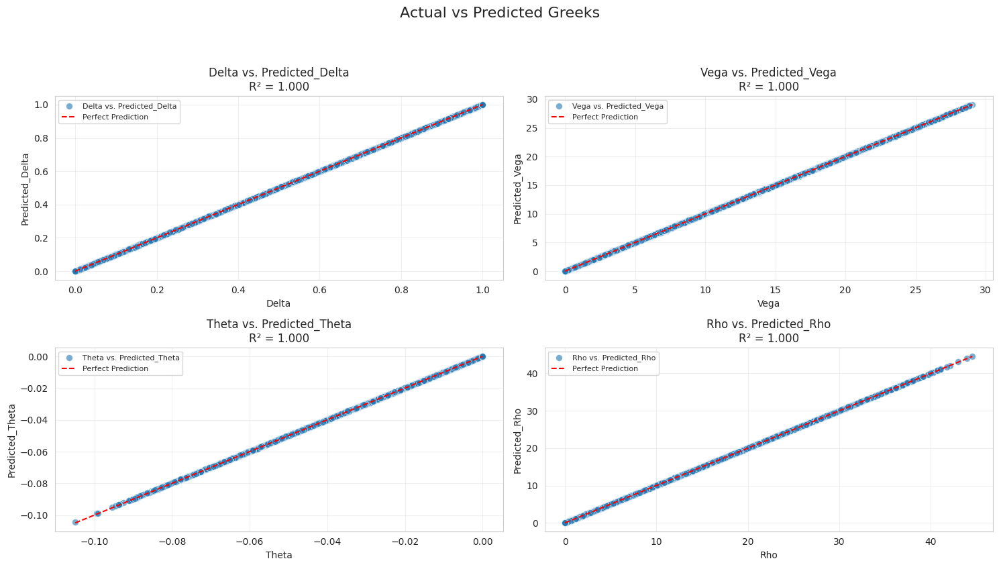

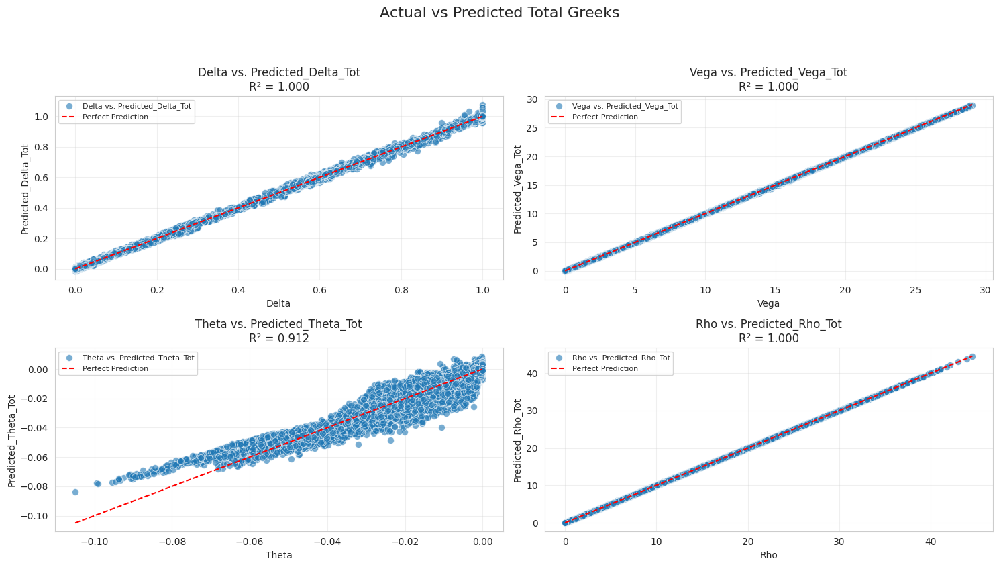

In [7]:
from typing import List, Tuple

greeks = ["Delta", "Vega", "Theta", "Rho"]
predicted_greeks = ["Predicted_Delta", "Predicted_Vega", "Predicted_Theta", "Predicted_Rho"]
predicted_totals = ["Predicted_Delta_Tot", "Predicted_Vega_Tot", "Predicted_Theta_Tot", "Predicted_Rho_Tot"]


def create_greek_comparison_plots(
    results_df_greeks,
    greeks: List[str],
    predicted_values: List[str],
    plot_title: str,
    figsize: Tuple[int, int] = (15, 8),
    style: str = 'whitegrid',
    alpha: float = 0.6,
    perfect_line_style: str = 'r--',
    marker_size: int = 50
) -> None:
    """
    Create scatter plots comparing actual vs predicted Greek values.
    
    Args:
        results_df_greeks: DataFrame containing the Greek values
        greeks: List of actual Greek column names
        predicted_values: List of predicted Greek column names
        plot_title: Title for the entire figure
        figsize: Figure size as (width, height)
        style: Seaborn style for the plots
        alpha: Transparency of scatter points
        perfect_line_style: Style of the perfect prediction line
        marker_size: Size of scatter points
    """
    # Input validation
    if len(greeks) != len(predicted_values):
        raise ValueError("The number of actual and predicted Greeks must match")
    
    # Set the style
    sns.set_style(style)
    
    # Create figure and subplots
    fig, axes = plt.subplots(2, 2, figsize=figsize)
    fig.suptitle(plot_title, fontsize=16, y=1.05)
    
    # Flatten axes for easier iteration
    axes = axes.flatten()
    
    for idx, (actual, predicted) in enumerate(zip(greeks, predicted_values)):
        try:
            # Create scatter plot
            sns.scatterplot(
                data=results_df_greeks,
                x=actual,
                y=predicted,
                alpha=alpha,
                s=marker_size,
                ax=axes[idx],
                label=f"{actual} vs. {predicted}"
            )
            
            # Calculate and plot perfect prediction line
            x_min, x_max = results_df_greeks[actual].min(), results_df_greeks[actual].max()
            axes[idx].plot(
                [x_min, x_max],
                [x_min, x_max],
                perfect_line_style,
                label="Perfect Prediction"
            )
            
            # Calculate R-squared
            correlation = np.corrcoef(results_df_greeks[actual], results_df_greeks[predicted])[0,1]
            r_squared = correlation ** 2
            
            # Customize subplot
            axes[idx].set_xlabel(actual, fontsize=10)
            axes[idx].set_ylabel(predicted, fontsize=10)
            axes[idx].set_title(f"{actual} vs. {predicted}\nR² = {r_squared:.3f}", fontsize=12)
            axes[idx].legend(fontsize=8)
            axes[idx].grid(True, alpha=0.3)
            
        except Exception as e:
            print(f"Error plotting {actual} vs {predicted}: {str(e)}")
    
    # Adjust layout
    plt.tight_layout()
    plt.show()


create_greek_comparison_plots(
    results_df_greeks,
    greeks,
    predicted_greeks,
    "Actual vs Predicted Greeks"
)
create_greek_comparison_plots(
    results_df_greeks,
    greeks,
    predicted_totals,
    "Actual vs Predicted Total Greeks"
)

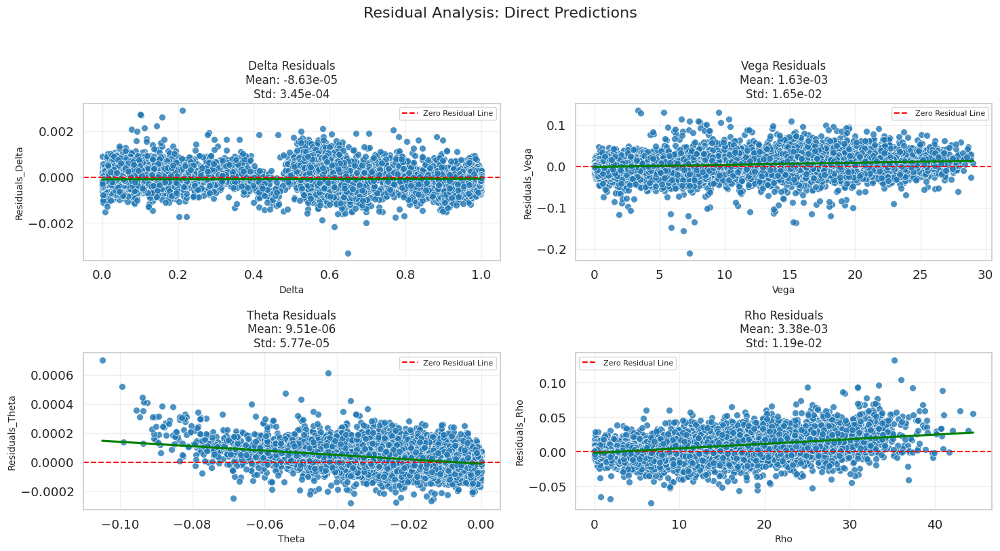

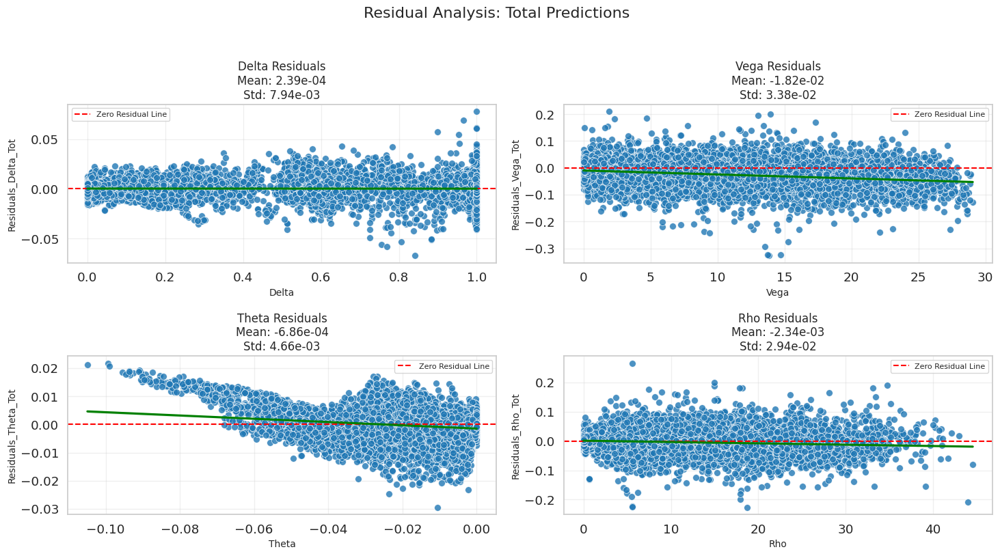

<ipython-input-8-e1f28f8f4277>:143: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap(config.color_palette)(np.linspace(0, 1, len(plot_df)))


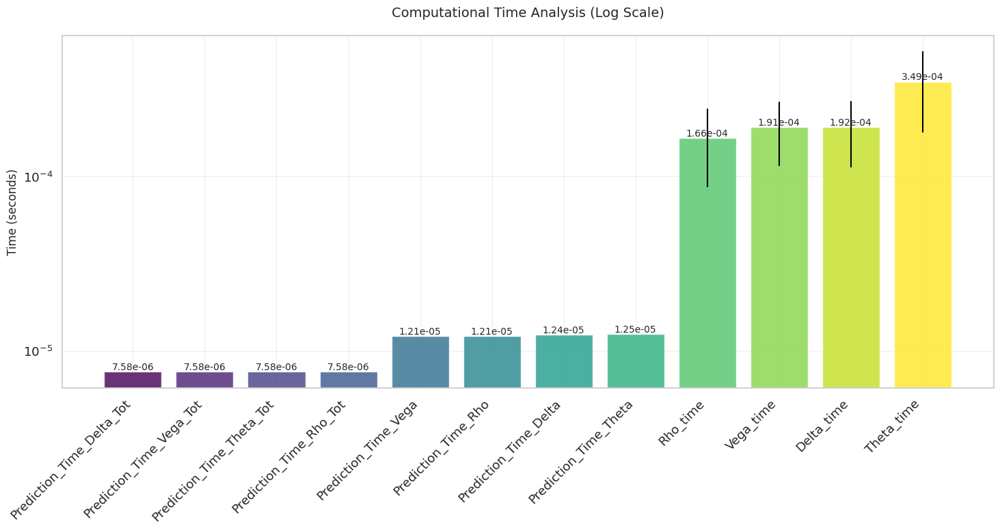

In [8]:
from typing import List, Dict
from dataclasses import dataclass

@dataclass
class PlotConfig:
    """Configuration class for plot parameters"""
    figsize: tuple = (15, 10)
    alpha: float = 0.7
    style: str = 'whitegrid'
    zero_line_color: str = 'r'
    zero_line_style: str = '--'
    marker_size: int = 50
    font_scale: float = 1.2
    color_palette: str = 'viridis'  # Added color palette option


def calculate_residuals(df: pd.DataFrame, greeks: List[str]) -> pd.DataFrame:
    """
    Calculate residuals for both direct predictions and total predictions.
    
    Args:
        df: DataFrame containing the Greek values
        greeks: List of Greek names
    
    Returns:
        DataFrame with added residual columns
    """
    try:
        df = df.copy()
        for greek in greeks:
            df[f"Residuals_{greek}"] = df[f"Predicted_{greek}"] - df[greek]
            df[f"Residuals_{greek}_Tot"] = df[f"Predicted_{greek}_Tot"] - df[greek]
        return df
    except Exception as e:
        raise Exception(f"Error calculating residuals: {str(e)}")

def create_residual_plots(
    df: pd.DataFrame,
    greeks: List[str],
    plot_type: str,
    config: PlotConfig
) -> None:
    """
    Create residual plots for Greek predictions.
    
    Args:
        df: DataFrame containing the data
        greeks: List of Greek names
        plot_type: Either 'direct' or 'total'
        config: PlotConfig object containing plot parameters
    """
    sns.set_style(config.style)
    sns.set_context("notebook", font_scale=config.font_scale)
    
    fig, axes = plt.subplots(2, 2, figsize=config.figsize)
    fig.suptitle(
        f"Residual Analysis: {'Direct' if plot_type == 'direct' else 'Total'} Predictions",
        fontsize=16, y=1.02
    )
    
    axes = axes.flatten()
    
    for idx, greek in enumerate(greeks):
        residual_col = f"Residuals_{greek}_Tot" if plot_type == 'total' else f"Residuals_{greek}"
        
        # Create scatter plot
        sns.scatterplot(
            data=df,
            x=greek,
            y=residual_col,
            alpha=config.alpha,
            s=config.marker_size,
            ax=axes[idx]
        )
        
        # Add zero line
        axes[idx].axhline(
            0,
            color=config.zero_line_color,
            linestyle=config.zero_line_style,
            label="Zero Residual Line"
        )
        
        # Calculate statistics
        mean_residual = df[residual_col].mean()
        std_residual = df[residual_col].std()
        
        # Customize subplot
        axes[idx].set_xlabel(f"True {greek}", fontsize=10)
        axes[idx].set_ylabel(f"Residuals", fontsize=10)
        axes[idx].set_title(
            f"{greek} Residuals\nMean: {mean_residual:.2e}\nStd: {std_residual:.2e}",
            fontsize=12
        )
        axes[idx].legend(fontsize=8)
        axes[idx].grid(True, alpha=0.3)
        
        # Add trend line
        sns.regplot(
            data=df,
            x=greek,
            y=residual_col,
            scatter=False,
            ax=axes[idx],
            color='green',
            line_kws={'label': 'Trend'}
        )
    
    plt.tight_layout()
    plt.show()

def plot_computation_times(
    df: pd.DataFrame,
    time_columns: List[str],
    config: PlotConfig
) -> None:
    """
    Create bar plot for computation times.
    
    Args:
        df: DataFrame containing the time data
        time_columns: List of time column names
        config: PlotConfig object containing plot parameters
    """
    # Compute mean times
    mean_times = df[time_columns].mean()
    std_times = df[time_columns].std()
    
    # Create DataFrame for plotting
    plot_df = pd.DataFrame({
        'Method': mean_times.index,
        'Mean Time': mean_times.values,
        'Std Time': std_times.values
    })
    
    # Sort by mean time
    plot_df = plot_df.sort_values('Mean Time', ascending=True)
    
    # Create plot
    plt.figure(figsize=config.figsize)
    
    colors = plt.cm.get_cmap(config.color_palette)(np.linspace(0, 1, len(plot_df)))
    
    # Create bar plot with error bars
    bars = plt.bar(
        range(len(plot_df)),
        plot_df['Mean Time'],
        yerr=plot_df['Std Time'],
        alpha=config.alpha,
        color=colors
    )
    
    # Customize plot
    plt.yscale('log')
    plt.xticks(
        range(len(plot_df)),
        plot_df['Method'],
        rotation=45,
        ha='right'
    )
    plt.title('Computational Time Analysis (Log Scale)', pad=20, fontsize=14)
    plt.ylabel('Time (seconds)', fontsize=12)
    
    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2.,
            height,
            f'{height:.2e}',
            ha='center',
            va='bottom',
            rotation=0,
            fontsize=10
        )
    
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def analyze_greek_predictions(df: pd.DataFrame, greeks: List[str], time_columns: List[str]):
    """Main function to run all analyses"""
    
    # Create plot configuration
    config = PlotConfig(
        figsize=(15, 8),
        alpha=0.8,
        color_palette='viridis'  # You can easily change the palette here
    )
    
    # Calculate residuals
    df = calculate_residuals(df, greeks)
    
    # Create residual plots for direct predictions
    create_residual_plots(df, greeks, 'direct', config)
    
    # Create residual plots for total predictions
    create_residual_plots(df, greeks, 'total', config)
    
    # Create computation time plot
    plot_computation_times(df, time_columns, config)


time_columns = [
    "Prediction_Time_Delta", "Prediction_Time_Vega", "Prediction_Time_Theta", "Prediction_Time_Rho",
    "Prediction_Time_Delta_Tot", "Prediction_Time_Vega_Tot", "Prediction_Time_Theta_Tot", "Prediction_Time_Rho_Tot",
    "Delta_time", "Vega_time", "Theta_time", "Rho_time"
]

analyze_greek_predictions(results_df_greeks, greeks, time_columns)

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

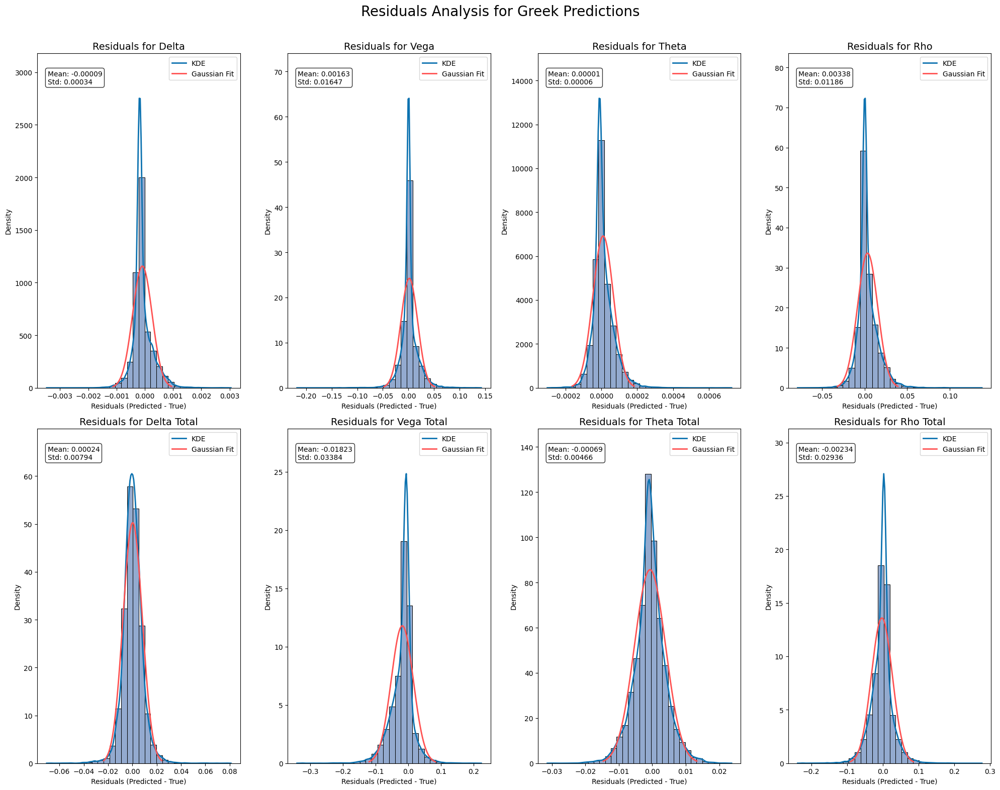

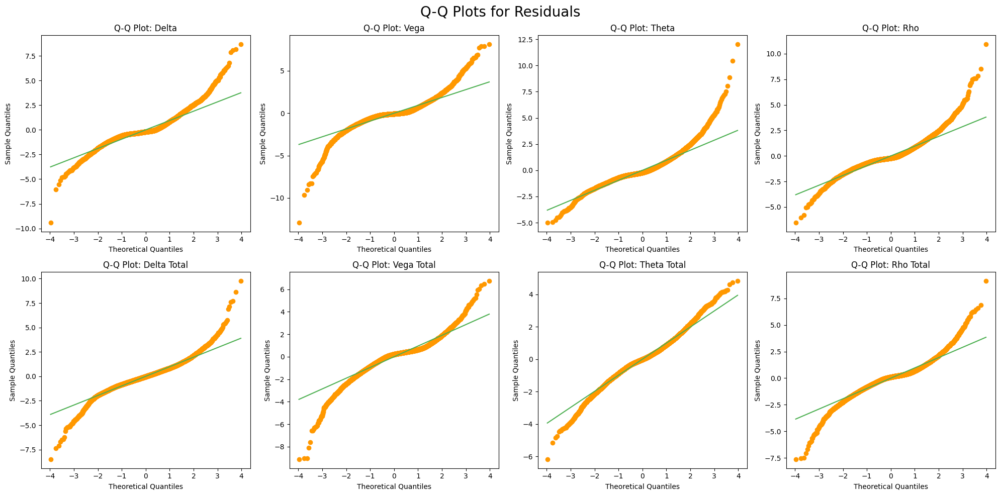

In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
from matplotlib.gridspec import GridSpec

# Replace infinities with NaN
results_df_greeks.replace([np.inf, -np.inf], np.nan, inplace=True)

# Define a list of the Greeks to loop through
greeks = ["Delta", "Vega", "Theta", "Rho"]

# Create a figure with all Greek residuals in a grid
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(2, 4, figure=fig)

# Color palette
colors = {
    "hist": "#4C72B0",
    "kde": "#0C72B0",
    "gaussian": "#FF5252",  # Red Gaussian curve
    "qq_line": "#4CAF50",   # Green QQ line
    "qq_points": "#FF9800"  # Orange QQ points
}

# Add a main title for the entire figure
fig.suptitle('Residuals Analysis for Greek Predictions', fontsize=20, y=0.98)

# 1️⃣ Individual Greeks (First Row)
for i, greek in enumerate(greeks):
    residuals = results_df_greeks[f"Residuals_{greek}"].dropna()
    
    # Main subplot (histogram + KDE + Gaussian)
    ax_main = fig.add_subplot(gs[0, i])
    
    # Calculate statistics
    mean_residual = np.mean(residuals)
    std_residual = np.std(residuals)
    
    # Find reasonable x-limits 
    x_range = max(abs(residuals.min() - mean_residual), abs(residuals.max() - mean_residual))
    x_range = min(x_range, 3 * std_residual)
    xmin, xmax = mean_residual - x_range, mean_residual + x_range
    
    # Create x values for Gaussian curve
    x = np.linspace(xmin, xmax, 300)
    p = norm.pdf(x, mean_residual, std_residual)
    
    # Plot histogram, KDE and Gaussian fit
    sns.histplot(residuals, stat="density", color=colors["hist"], alpha=0.6, bins=30, ax=ax_main)
    sns.kdeplot(residuals, color=colors["kde"], linewidth=2, label="KDE", ax=ax_main)
    ax_main.plot(x, p, color=colors["gaussian"], label="Gaussian Fit", linewidth=2)
    
    # Add stats as text
    stats_text = f"Mean: {mean_residual:.5f}\nStd: {std_residual:.5f}"
    ax_main.text(0.05, 0.95, stats_text, transform=ax_main.transAxes, 
                 fontsize=10, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax_main.set_title(f'Residuals for {greek}', fontsize=14)
    ax_main.set_xlabel(f'Residuals (Predicted - True)')
    ax_main.set_ylabel('Density')
    ax_main.legend(loc='upper right')
    
    # Set reasonable y-limit
    density_max = max(np.max(p), ax_main.get_ylim()[1])
    ax_main.set_ylim(0, density_max * 1.1)

# Total Greeks (Second Row)
for i, greek in enumerate(greeks):
    residuals_tot = results_df_greeks[f"Residuals_{greek}_Tot"].dropna()
    
    # Main subplot (histogram + KDE + Gaussian)
    ax_main = fig.add_subplot(gs[1, i])
    
    # Calculate statistics
    mean_residual = np.mean(residuals_tot)
    std_residual = np.std(residuals_tot)
    
    # Find reasonable x-limits
    x_range = max(abs(residuals_tot.min() - mean_residual), abs(residuals_tot.max() - mean_residual))
    x_range = min(x_range, 3 * std_residual)
    xmin, xmax = mean_residual - x_range, mean_residual + x_range
    
    # Create x values for Gaussian curve
    x = np.linspace(xmin, xmax, 300)
    p = norm.pdf(x, mean_residual, std_residual)
    
    # Plot histogram, KDE and Gaussian fit
    sns.histplot(residuals_tot, stat="density", color=colors["hist"], alpha=0.6, bins=30, ax=ax_main)
    sns.kdeplot(residuals_tot, color=colors["kde"], linewidth=2, label="KDE", ax=ax_main)
    ax_main.plot(x, p, color=colors["gaussian"], label="Gaussian Fit", linewidth=2)
    
    # Add stats as text
    stats_text = f"Mean: {mean_residual:.5f}\nStd: {std_residual:.5f}"
    ax_main.text(0.05, 0.95, stats_text, transform=ax_main.transAxes, 
                 fontsize=10, verticalalignment='top', 
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax_main.set_title(f'Residuals for {greek} Total', fontsize=14)
    ax_main.set_xlabel(f'Residuals (Predicted - True)')
    ax_main.set_ylabel('Density')
    ax_main.legend(loc='upper right')
    
    # Set reasonable y-limit
    density_max = max(np.max(p), ax_main.get_ylim()[1])
    ax_main.set_ylim(0, density_max * 1.1)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# Now create QQ plots for all residuals
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
fig.suptitle('Q-Q Plots for Residuals', fontsize=20)

# Individual Greeks
for i, greek in enumerate(greeks):
    residuals = results_df_greeks[f"Residuals_{greek}"].dropna()
    
    ax = axes[0, i]
    # Calculate standardized residuals
    standardized = (residuals - np.mean(residuals)) / np.std(residuals)
    
    # Create QQ plot
    from scipy import stats
    stats.probplot(standardized, dist="norm", plot=ax)
    
    ax.set_title(f'Q-Q Plot: {greek}', fontsize=12)
    ax.set_xlabel('Theoretical Quantiles')
    ax.set_ylabel('Sample Quantiles')
    
    # Make the QQ line green and points orange
    ax.get_lines()[0].set_markerfacecolor(colors["qq_points"])
    ax.get_lines()[0].set_markeredgecolor(colors["qq_points"])
    ax.get_lines()[1].set_color(colors["qq_line"])

# Total Greeks
for i, greek in enumerate(greeks):
    residuals_tot = results_df_greeks[f"Residuals_{greek}_Tot"].dropna()
    
    ax = axes[1, i]
    # Calculate standardized residuals
    standardized = (residuals_tot - np.mean(residuals_tot)) / np.std(residuals_tot)
    
    # Create QQ plot
    stats.probplot(standardized, dist="norm", plot=ax)
    
    ax.set_title(f'Q-Q Plot: {greek} Total', fontsize=12)
    ax.set_xlabel('Theoretical Quantiles')
    ax.set_ylabel('Sample Quantiles')
    
    # Make the QQ line green and points orange
    ax.get_lines()[0].set_markerfacecolor(colors["qq_points"])
    ax.get_lines()[0].set_markeredgecolor(colors["qq_points"])
    ax.get_lines()[1].set_color(colors["qq_line"])

plt.tight_layout(rect=[0, 0, 1, 1])
plt.show()

In [48]:
from scipy.stats import shapiro, kstest, anderson, jarque_bera
def gaussian_score(data, name):
    data = data.dropna()  # Remove NaNs
    data = (data - np.mean(data)) / np.std(data)  # Normalize residuals
    
    # Compute tests
    shapiro_test = shapiro(data)  # Shapiro-Wilk Test
    ks_test = kstest(data, 'norm')  # KS Test
    anderson_test = anderson(data, 'norm')  # Anderson-Darling Test
    jb_test = jarque_bera(data)  # Jarque-Bera Test
    
    # Check if tests pass or fail (α = 0.05)
    shapiro_pass = shapiro_test.pvalue > 0.05
    ks_pass = ks_test.pvalue > 0.05
    
    # Anderson critical values at significance levels [15%, 10%, 5%, 2.5%, 1%]
    anderson_critical_idx = 2  # Using 5% significance level (index 2)
    anderson_pass = anderson_test.statistic < anderson_test.critical_values[anderson_critical_idx]
    
    jb_pass = jb_test.pvalue > 0.05
    
    # Count how many tests pass
    pass_count = sum([shapiro_pass, ks_pass, anderson_pass, jb_pass])
    
    return {
        "Greek": name,
        "Shapiro p-value": shapiro_test.pvalue,
        "Shapiro Result": "Pass" if shapiro_pass else "Fail",
        "KS p-value": ks_test.pvalue,
        "KS Result": "Pass" if ks_pass else "Fail",
        "Anderson Statistic": anderson_test.statistic,
        "Anderson Critical Value (5%)": anderson_test.critical_values[anderson_critical_idx],
        "Anderson Result": "Pass" if anderson_pass else "Fail",
        "Jarque-Bera p-value": jb_test.pvalue,
        "Jarque-Bera Result": "Pass" if jb_pass else "Fail",
        "Tests Passed": f"{pass_count}/4"
    }

# List of Greeks to analyze
greeks = ["Delta", "Vega", "Theta", "Rho"]
greeks_tot = ["Delta_Tot", "Vega_Tot", "Theta_Tot", "Rho_Tot"]
gaussian_scores = []

# Compute scores for each Greek's residuals
for greek in greeks:
    residuals_column = f"Residuals_{greek}"
    if residuals_column in results_df_greeks.columns:
        score = gaussian_score(results_df_greeks[residuals_column], greek)
        gaussian_scores.append(score)
        
for greek_tot in greeks_tot:
    residuals_column = f"Residuals_{greek_tot}"
    if residuals_column in results_df_greeks.columns:
        score = gaussian_score(results_df_greeks[residuals_column], greek_tot)
        gaussian_scores.append(score)

# Convert results to a DataFrame
gaussian_scores_df = pd.DataFrame(gaussian_scores)

# Display the results
gaussian_scores_df

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 19728.
  res = hypotest_fun_out(*samples, **kwds)


,Greek,Shapiro p-value,Shapiro Result,KS p-value,KS Result,Anderson Statistic,Anderson Critical Value (5%),Anderson Result,Jarque-Bera p-value,Jarque-Bera Result,Tests Passed
0,Delta,4.653873e-78,Fail,0.000000e+00,Fail,766.335558,0.787,Fail,0.0,Fail,0/4
1,Vega,7.466282e-84,Fail,0.000000e+00,Fail,849.819520,0.787,Fail,0.0,Fail,0/4
2,Theta,5.325859e-73,Fail,6.423344e-212,Fail,450.681506,0.787,Fail,0.0,Fail,0/4
3,Rho,1.032177e-73,Fail,8.438276e-303,Fail,539.797283,0.787,Fail,0.0,Fail,0/4
4,Delta_Tot,8.542693e-58,Fail,1.049013e-35,Fail,113.780166,0.787,Fail,0.0,Fail,0/4
5,Vega_Tot,2.283281e-74,Fail,8.961679e-279,Fail,570.455175,0.787,Fail,0.0,Fail,0/4
6,Theta_Tot,4.199031e-45,Fail,1.517625e-56,Fail,121.945795,0.787,Fail,0.0,Fail,0/4
7,Rho_Tot,1.825565e-67,Fail,1.453802e-174,Fail,376.230428,0.787,Fail,0.0,Fail,0/4


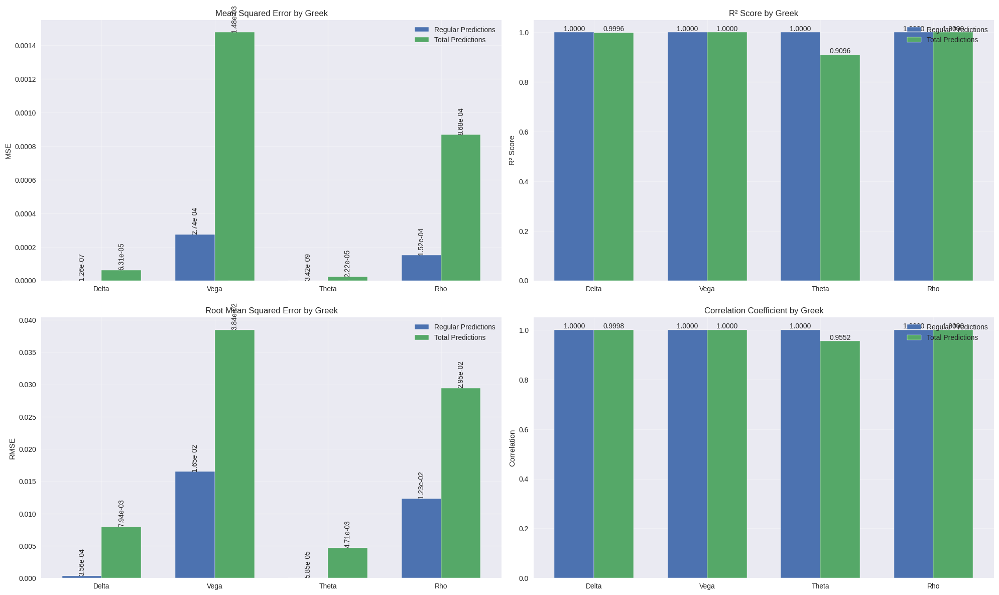


=== Greek Predictions Analysis ===

Number of samples after cleaning: 19728
Removed samples: 0

Detailed Metrics:
                   MSE         RMSE          MAE           R2  Correlation
Delta     0.0000001264 0.0003555506 0.0002686419 0.9999992797 0.9999996613
Delta_Tot 0.0000630754 0.0079420046 0.0057810624 0.9996406230 0.9998204875
Vega      0.0002737630 0.0165457837 0.0098452741 0.9999954902 0.9999979013
Vega_Tot  0.0014775344 0.0384387095 0.0259765365 0.9999756598 0.9999916328
Theta     0.0000000034 0.0000584592 0.0000396131 0.9999860545 0.9999943344
Theta_Tot 0.0000221567 0.0047070921 0.0034676065 0.9095864992 0.9552240951
Rho       0.0001521414 0.0123345618 0.0080000536 0.9999980688 0.9999993283
Rho_Tot   0.0008676598 0.0294560662 0.0198408113 0.9999889866 0.9999946283

Improvement Analysis (Total vs Regular):
----------------------------------------
Delta: -49795.05% improvement in MSE with Total predictions
Vega: -439.71% improvement in MSE with Total predictions
Theta: -64

In [48]:
def analyze_greek_predictions(
    df: pd.DataFrame,
    greeks: list = ['Delta', 'Vega', 'Theta', 'Rho'],
    figsize: tuple = (20, 12)
) -> pd.DataFrame:
    """
    Analyze predictions for multiple Greeks including regular and total predictions.
    
    Args:
        df: DataFrame containing the Greek values and predictions
        greeks: List of Greeks to analyze
        figsize: Figure size for plots
    
    Returns:
        DataFrame containing error metrics for each Greek
    """
    # Clean data
    columns_to_check = (
        greeks + 
        [f'Predicted_{greek}' for greek in greeks] +
        [f'Predicted_{greek}_Tot' for greek in greeks]
    )
    
    df_cleaned = df.dropna(subset=columns_to_check).copy()
    
    # Calculate metrics for all predictions
    metrics = {}
    
    for greek in greeks:
        # Regular predictions
        actual = df_cleaned[greek]
        predicted = df_cleaned[f'Predicted_{greek}']
        predicted_tot = df_cleaned[f'Predicted_{greek}_Tot']
        
        metrics[f'{greek}'] = {
            'MSE': mean_squared_error(actual, predicted),
            'RMSE': np.sqrt(mean_squared_error(actual, predicted)),
            'MAE': mean_absolute_error(actual, predicted),
            'R2': r2_score(actual, predicted),
            'Correlation': np.corrcoef(actual, predicted)[0,1]
        }
        
        metrics[f'{greek}_Tot'] = {
            'MSE': mean_squared_error(actual, predicted_tot),
            'RMSE': np.sqrt(mean_squared_error(actual, predicted_tot)),
            'MAE': mean_absolute_error(actual, predicted_tot),
            'R2': r2_score(actual, predicted_tot),
            'Correlation': np.corrcoef(actual, predicted_tot)[0,1]
        }
    
    metrics_df = pd.DataFrame.from_dict(metrics, orient='index')
    
    # Create visualizations
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(2, 2)
    
    # MSE Comparison
    ax1 = fig.add_subplot(gs[0, 0])
    
    x = np.arange(len(greeks))
    width = 0.35
    
    regular_mse = [metrics[greek]['MSE'] for greek in greeks]
    tot_mse = [metrics[f'{greek}_Tot']['MSE'] for greek in greeks]
    
    rects1 = ax1.bar(x - width/2, regular_mse, width, label='Regular Predictions')
    rects2 = ax1.bar(x + width/2, tot_mse, width, label='Total Predictions')
    
    ax1.set_ylabel('MSE')
    ax1.set_title('Mean Squared Error by Greek')
    ax1.set_xticks(x)
    ax1.set_xticklabels(greeks)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Add value labels
    for rects in [rects1, rects2]:
        for rect in rects:
            height = rect.get_height()
            ax1.text(rect.get_x() + rect.get_width()/2., height,
                    f'{height:.2e}',
                    ha='center', va='bottom', rotation=90)
    
    # R² Score Comparison
    ax2 = fig.add_subplot(gs[0, 1])
    
    regular_r2 = [metrics[greek]['R2'] for greek in greeks]
    tot_r2 = [metrics[f'{greek}_Tot']['R2'] for greek in greeks]
    
    rects3 = ax2.bar(x - width/2, regular_r2, width, label='Regular Predictions')
    rects4 = ax2.bar(x + width/2, tot_r2, width, label='Total Predictions')
    
    ax2.set_ylabel('R² Score')
    ax2.set_title('R² Score by Greek')
    ax2.set_xticks(x)
    ax2.set_xticklabels(greeks)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # Add value labels
    for rects in [rects3, rects4]:
        for rect in rects:
            height = rect.get_height()
            ax2.text(rect.get_x() + rect.get_width()/2., height,
                    f'{height:.4f}',
                    ha='center', va='bottom')
    
    # RMSE Comparison
    ax3 = fig.add_subplot(gs[1, 0])
    
    regular_rmse = [metrics[greek]['RMSE'] for greek in greeks]
    tot_rmse = [metrics[f'{greek}_Tot']['RMSE'] for greek in greeks]
    
    rects5 = ax3.bar(x - width/2, regular_rmse, width, label='Regular Predictions')
    rects6 = ax3.bar(x + width/2, tot_rmse, width, label='Total Predictions')
    
    ax3.set_ylabel('RMSE')
    ax3.set_title('Root Mean Squared Error by Greek')
    ax3.set_xticks(x)
    ax3.set_xticklabels(greeks)
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    
    # Add value labels
    for rects in [rects5, rects6]:
        for rect in rects:
            height = rect.get_height()
            ax3.text(rect.get_x() + rect.get_width()/2., height,
                    f'{height:.2e}',
                    ha='center', va='bottom', rotation=90)
    
    # Correlation Comparison
    ax4 = fig.add_subplot(gs[1, 1])
    
    regular_corr = [metrics[greek]['Correlation'] for greek in greeks]
    tot_corr = [metrics[f'{greek}_Tot']['Correlation'] for greek in greeks]
    
    rects7 = ax4.bar(x - width/2, regular_corr, width, label='Regular Predictions')
    rects8 = ax4.bar(x + width/2, tot_corr, width, label='Total Predictions')
    
    ax4.set_ylabel('Correlation')
    ax4.set_title('Correlation Coefficient by Greek')
    ax4.set_xticks(x)
    ax4.set_xticklabels(greeks)
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    # Add value labels
    for rects in [rects7, rects8]:
        for rect in rects:
            height = rect.get_height()
            ax4.text(rect.get_x() + rect.get_width()/2., height,
                    f'{height:.4f}',
                    ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed analysis
    print("\n=== Greek Predictions Analysis ===")
    print(f"\nNumber of samples after cleaning: {len(df_cleaned)}")
    print(f"Removed samples: {len(df) - len(df_cleaned)}")
    
    print("\nDetailed Metrics:")
    print(metrics_df.to_string(float_format=lambda x: '{:.10f}'.format(x)))
    
    # Print improvement analysis
    print("\nImprovement Analysis (Total vs Regular):")
    print("-" * 40)
    
    for greek in greeks:
        improvement = ((metrics[greek]['MSE'] - metrics[f'{greek}_Tot']['MSE']) / 
                      metrics[greek]['MSE'] * 100)
        print(f"{greek}: {improvement:+.2f}% improvement in MSE with Total predictions")
    
    return metrics_df

greeks = ['Delta', 'Vega', 'Theta', 'Rho']

# Run analysis
metrics_df = analyze_greek_predictions(
    results_df_greeks,
    greeks=greeks,
    figsize=(20, 12)
)
